<a href="https://colab.research.google.com/github/wasihun-code/BLOG_Flask/blob/main/federated_learning_(11)_(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Federated Learning for Chronic Disease Detection: A Reproducible Benchmark Framework

This notebook provides a comprehensive and reproducible benchmark for Federated Learning (FL) algorithms (FedAvg and FedProx) applied to chronic disease detection using multiple public healthcare tabular datasets. It compares FL performance against classical machine learning baselines and a centralized deep learning model, evaluating the impact of data heterogeneity (non-IID distribution) and communication costs.

### Key Features:

*   **Multi-Dataset Support**: Seamless integration and benchmarking across UCI Heart Disease, PIMA Indians Diabetes, Breast Cancer Wisconsin, and Chronic Kidney Disease datasets.
*   **Modular Architecture**: Cleanly separated functions for data loading, preprocessing, model definition, training (centralized and federated), evaluation, and visualization.
*   **Statistical Rigor**: Multi-seed evaluation for robust reporting of mean and standard deviation for key metrics.
*   **Data Heterogeneity Analysis**: Investigation of non-IID conditions using Dirichlet partitioning with configurable \(\alpha\) values.
*   **Comprehensive Baselines**: Comparison against Logistic Regression, Random Forest, XGBoost, and a Centralized Deep Learning model.
*   **Publication-Quality Outputs**: Automated generation of tables, plots, and a summary report.

This framework aims to provide a reliable platform for researching and comparing federated learning strategies in healthcare, emphasizing reproducibility and scientific validity.

## Section 1

In [1]:
# 1.1: Mount Google Drive
# This step is often required in Google Colab to access data stored in your Drive.
# If you encounter issues, please run this cell manually and authorize access.
from google.colab import drive
import os

try:
    drive.mount('/content/drive', force_remount=True)
    print("Google Drive mounted successfully.")
except Exception as e:
    print(f"Warning: Could not mount Google Drive. Error: {e}")
    print("Please ensure you run this cell manually and authorize access if data files are in Drive.")


Mounted at /content/drive
Google Drive mounted successfully.


In [2]:
# 1.2: Install Required Libraries
print("Installing required libraries...")
# Ensure pip is up-to-date
!pip install -q --upgrade pip

# Install common libraries
!pip install -q pandas numpy scikit-learn matplotlib seaborn flwr torch scipy tqdm xgboost liac-arff

# Force-reinstall liac-arff using python -m pip for robust installation
print("Attempting to install liac-arff using `python -m pip`...")
!python -m pip install --force-reinstall liac-arff
print("liac-arff installation command executed.")

print("All required libraries installation steps completed.")

Installing required libraries...
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 69.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pyopenssl 24.2.1 requires cryptography<44,>=41.0.5, but you have cryptography 46.0.7 which is incompatible.
google-ai-generativelanguage 0.6.15 requires protobuf!=4.21.0,!=4.21.1,!=4.21.2,!=4.21.3,!=4.21.4,!=4.21.5,<6.0.0dev,>=3.20.2, but you have protobuf 6.33.6 which is incompatible.
typer-slim 0.24.0 requires typer>=0.24.0, but you have typer 0.20.1 which is incompatible.
pydrive2 1.21.3 requires cryptography<44, but you have cryptography 46.0.7 which is incompatible.
grpcio-status 1.71.2 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 6.33.6 which is incompatib

In [3]:
import pandas as pd
import numpy as np
import torch
import random
import matplotlib.pyplot as plt
import seaborn as sns
import os
import re
import time
import arff  # For ARFF file parsing (e.g., CKD dataset)
from collections import OrderedDict
from typing import Dict, List, Tuple # ADDED THIS LINE
import warnings # Import warnings module

# Flower (if needed, otherwise custom fallback)
import flwr as fl
from flwr.common import NDArrays

# Scikit-learn
from sklearn.model_selection import train_test_split, RepeatedStratifiedKFold
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix,
    balanced_accuracy_score, # Added for imbalance-aware metrics
    matthews_corrcoef,        # Added for imbalance-aware metrics
    average_precision_score # Added for PR-AUC
)

# PyTorch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset, random_split
import torch.nn.utils as utils # For gradient clipping

# Suppress specific xgboost warning about use_label_encoder
warnings.filterwarnings("ignore", message=".*`use_label_encoder` is deprecated.*", category=UserWarning)
warnings.filterwarnings("ignore", message=".*Parameters: { \"use_label_encoder\" } are not used.*", category=UserWarning)

print("Setup complete: Libraries imported.")

Setup complete: Libraries imported.


## SECTION 2 — Global Configuration

In [4]:
import torch # Ensure torch is imported here
import pandas as pd # Ensure pandas is imported here

RANDOM_SEED = 42

# --- DEBUG MODE CONFIGURATION ---
DEBUG_MODE = True # Set to True for fast debugging, False for full benchmark

if DEBUG_MODE:
    RANDOM_SEEDS = [42, 52] # Reduced seeds for debug
    NUM_CLIENTS = 5
    FL_ROUNDS = 5 # Reduced communication rounds for debug
    LOCAL_EPOCHS = 2 # Reduced local epochs for debug
    ALPHA_VALUES = [0.5] # Reduced alpha values for debug
    FEDPROX_MU_VALUES = [0.01] # Reduced mu values for debug
    DEBUG_CV_N_SPLITS = 2 # Reduced CV splits for debug
    DEBUG_CV_N_REPEATS = 1 # Reduced CV repeats for debug
    print("DEBUG MODE IS ACTIVE: Experiment parameters are reduced.")
else:
    RANDOM_SEEDS = [42, 52, 62, 72, 82] # Full seeds
    NUM_CLIENTS = 5
    FL_ROUNDS = 20 # Full communication rounds
    LOCAL_EPOCHS = 5 # Full local epochs
    ALPHA_VALUES = [0.3, 0.5, 1.0] # Full alpha values
    FEDPROX_MU_VALUES = [0.01, 0.1] # Full mu values
    DEBUG_CV_N_SPLITS = 5 # Default CV splits
    DEBUG_CV_N_REPEATS = 2 # Default CV repeats
    print("Full benchmark mode is active.")

# Hyperparameters for FL (used in run_federated_experiment and ablation studies)
LEARNING_RATE_DEFAULT = 0.001
WEIGHT_DECAY_DEFAULT = 1e-4
BATCH_SIZE_DEFAULT = 32
MAX_GRAD_NORM_DEFAULT = 1.0 # For gradient clipping

# Dirichlet partition parameters
MIN_CLIENT_SIZE_DEFAULT = 20 # Minimum samples per client in Dirichlet partition
MAX_ATTEMPTS_PARTITION = 1000 # Max attempts for successful Dirichlet partition

# Ablation specific parameters (will be refined in ablation section)
ABLATION_LOCAL_EPOCHS = [3, 5, 7]

# Results Directory
RESULTS_DIR = "results" # Define the base directory for all results

# 2.3: Device Configuration
DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {DEVICE}")

# 2.4: Seed Initialization (Moved to a utility function)
# 2.5: Display Settings
pd.set_option('display.max_columns', None) # Show all columns
pd.set_option('display.max_rows', 100)    # Show up to 100 rows
pd.set_option('display.width', 1000)      # Wide display

print("Global configurations complete.")

DEBUG MODE IS ACTIVE: Experiment parameters are reduced.
Using device: cuda:0
Global configurations complete.


## SECTION 3 — Utility Functions

In [5]:
# 3.1: Seed Fixing Utility
def set_seed(seed):
    np.random.seed(seed)
    torch.manual_seed(seed)
    random.seed(seed)
    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = False
    print(f"Random seeds set for reproducibility (Seed: {seed}).")

set_seed(RANDOM_SEED)


# 3.2: Directory Setup Utility
def setup_dataset_directories(dataset_key):
    """Creates a directory structure for a specific dataset's results."""
    path = os.path.join(RESULTS_DIR, dataset_key)
    os.makedirs(path, exist_ok=True)
    os.makedirs(os.path.join(path, 'plots'), exist_ok=True)
    os.makedirs(os.path.join(path, 'csvs'), exist_ok=True)
    return path


Random seeds set for reproducibility (Seed: 42).


In [6]:
def verify_cv_integrity(X_raw_indices, y_raw, train_index, test_index, repetition_num, fold_num, dataset_key, current_seed, results_path):
    """Performs integrity checks on a single CV fold and saves a report."""
    report_lines = []
    report_lines.append(f"--- CV Integrity Report for {dataset_key.replace('_', ' ').title()} ---")
    report_lines.append(f"Repetition: {repetition_num + 1}, Fold: {fold_num + 1}, Seed: {current_seed}")
    report_lines.append(f"Total Samples: {len(X_raw_indices)}")
    report_lines.append(f"Train Samples: {len(train_index)}")
    report_lines.append(f"Test Samples: {len(test_index)}")

    # Check 1: Unique indices within train and test
    assert len(set(train_index)) == len(train_index), f"Train indices are not unique in Rep {repetition_num+1}, Fold {fold_num+1}"
    assert len(set(test_index)) == len(test_index), f"Test indices are not unique in Rep {repetition_num+1}, Fold {fold_num+1}"
    report_lines.append("  - Train and Test indices are unique: PASSED")

    # Check 2: No overlap between train and test indices
    overlap = set(train_index).intersection(set(test_index))
    assert len(overlap) == 0, f"Overlap found between train and test indices in Rep {repetition_num+1}, Fold {fold_num+1}. Overlapping indices: {list(overlap)}"
    report_lines.append("  - No overlap between Train and Test indices: PASSED")

    # Check 3: Union of train and test indices covers the original dataset indices for the fold
    # Note: For RepeatedStratifiedKFold, the sum of train_index and test_index should be total X_raw indices
    # only if n_splits is 1 or if we are considering unique indices across all folds/repeats.
    # For a single fold, we just check that all original indices assigned to this fold are present in either train or test
    combined_indices = np.concatenate([train_index, test_index])
    assert len(combined_indices) == len(X_raw_indices), f"Combined train/test indices ({len(combined_indices)}) do not match total raw indices ({len(X_raw_indices)}) for Rep {repetition_num+1}, Fold {fold_num+1}"
    assert len(np.unique(combined_indices)) == len(X_raw_indices), f"Duplicate indices found when combining train/test in Rep {repetition_num+1}, Fold {fold_num+1}"
    report_lines.append("  - Union of Train and Test indices covers original data for this fold: PASSED")

    # Check 4: Class distribution for non-empty classes
    if len(y_raw.unique()) > 1:
        train_class_dist = y_raw.iloc[train_index].value_counts(normalize=True)
        test_class_dist = y_raw.iloc[test_index].value_counts(normalize=True)
        report_lines.append(f"  - Train Class Distribution:\n{train_class_dist}")
        report_lines.append(f"  - Test Class Distribution:\n{test_class_dist}")
    else:
        report_lines.append("  - Single class dataset, class distribution checks skipped.")

    report_lines.append("--- Integrity Checks Complete ---")

    # Save the report
    report_filename = f"cv_integrity_report_seed{current_seed}_rep{repetition_num+1}_fold{fold_num+1}.txt"
    report_filepath = os.path.join(results_path, 'csvs', report_filename)
    with open(report_filepath, 'w') as f:
        for line in report_lines:
            f.write(line + '\n')
    report_lines.append(f"  CV integrity report saved to: {report_filepath}")
    return report_lines

print("CV integrity verification utility 'verify_cv_integrity' defined.")

CV integrity verification utility 'verify_cv_integrity' defined.


In [7]:
import numpy as np
import pandas as pd
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, balanced_accuracy_score, matthews_corrcoef, average_precision_score

# 3.2: Evaluation Metrics Utility (supports sklearn and PyTorch models)
def evaluate_model(model, X_test, y_test, model_name="Model", device=None, threshold=0.5):
    """Evaluates a given model (sklearn or PyTorch) and returns metrics."""
    # Ensure device is set if not provided for PyTorch models
    if isinstance(model, torch.nn.Module) and device is None:
        device = next(model.parameters()).device

    if isinstance(model, torch.nn.Module):
        model.eval()
        with torch.no_grad():
            if isinstance(X_test, pd.DataFrame):
                inputs = torch.tensor(X_test.values, dtype=torch.float32).to(device)
            elif isinstance(X_test, np.ndarray):
                inputs = torch.tensor(X_test, dtype=torch.float32).to(device)
            else:
                inputs = X_test.to(device)

            outputs = model(inputs)
            y_proba = torch.sigmoid(outputs).cpu().numpy().flatten()
            y_pred = (y_proba > threshold).astype(int)
    else:
        # For scikit-learn models, X_test should already be in the correct format (DataFrame/ndarray)
        y_proba = None
        if hasattr(model, 'predict_proba'):
            y_proba = model.predict_proba(X_test)[:, 1]
        elif hasattr(model, 'decision_function'):
            y_proba = model.decision_function(X_test)

        y_pred = (y_proba > threshold).astype(int) if y_proba is not None else model.predict(X_test)

    if torch.is_tensor(y_test):
        y_true = y_test.cpu().numpy().flatten()
    elif isinstance(y_test, (pd.Series, pd.DataFrame)):
        y_true = y_test.values.flatten()
    else:
        y_true = np.array(y_test).flatten()

    # Ensure y_true and y_pred are binary (0 or 1)
    y_true = y_true.astype(int)
    y_pred = y_pred.astype(int)

    # Define possible labels for binary classification to handle single-class predictions/true labels robustly
    labels = [0, 1]

    # Calculate confusion matrix components, ensuring a 2x2 matrix even if one class is missing
    cm = confusion_matrix(y_true, y_pred, labels=labels)
    tn, fp, fn, tp = cm.ravel()

    # Handle cases where division by zero might occur (e.g., no positive or no negative samples)
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0.0 # Recall for positive class
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0 # Recall for negative class

    # Calculate F2-score: F_beta = (1 + beta^2) * (precision * recall) / (beta^2 * precision + recall)
    beta = 2 # F2-score weights recall twice as much as precision
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f2_score_val = (1 + beta**2) * (precision * recall) / ((beta**2 * precision) + recall) if ((beta**2 * precision) + recall) > 0 else 0.0


    metrics = {
        'Accuracy': accuracy_score(y_true, y_pred),
        'Balanced Accuracy': balanced_accuracy_score(y_true, y_pred) if len(np.unique(y_true)) > 1 else np.nan,
        'Precision': precision,
        'Recall': recall,
        'F1': f1_score(y_true, y_pred, zero_division=0),
        'F2': f2_score_val, # Add F2-score
        'Macro F1': f1_score(y_true, y_pred, average='macro', zero_division=0) if len(np.unique(y_true)) > 1 else np.nan,
        'ROC-AUC': roc_auc_score(y_true, y_proba) if y_proba is not None and len(np.unique(y_true)) > 1 else np.nan,
        'PR-AUC': average_precision_score(y_true, y_proba) if y_proba is not None and len(np.unique(y_true)) > 1 else np.nan,
        'MCC': matthews_corrcoef(y_true, y_pred) if len(np.unique(y_true)) > 1 else np.nan,
        'Sensitivity': sensitivity,
        'Specificity': specificity
    }
    return metrics, y_true, y_pred, y_proba, cm


# 3.3 Focal Loss Implementation
class FocalLoss(nn.Module):
    def __init__(self, alpha=0.25, gamma=2, reduction='mean', pos_weight=None):
        super(FocalLoss, self).__init__()
        self.alpha = alpha # Alpha parameter for balancing positive and negative examples
        self.gamma = gamma # Gamma parameter for focusing on hard examples
        self.reduction = reduction
        self.pos_weight = pos_weight # Weight for the positive class

    def forward(self, inputs, targets):
        BCE_loss = nn.functional.binary_cross_entropy_with_logits(inputs, targets, reduction='none')
        pt = torch.exp(-BCE_loss) # Probability of the true class
        F_loss = self.alpha * (1 - pt)**self.gamma * BCE_loss

        if self.pos_weight is not None:
            # Apply positive weight to the loss for positive samples
            F_loss = torch.where(targets == 1, self.pos_weight * F_loss, F_loss)

        if self.reduction == 'mean':
            return F_loss.mean()
        elif self.reduction == 'sum':
            return F_loss.sum()
        else:
            return F_loss

print("Focal Loss utility 'FocalLoss' defined.")

Focal Loss utility 'FocalLoss' defined.


In [8]:
from sklearn.metrics import f1_score, recall_score, balanced_accuracy_score, precision_score

def optimize_threshold(y_true_val, y_proba_val, metric_to_optimize='f1', min_recall_constraint=0.0) -> Tuple[float, float, float, float]:
    """Optimizes the prediction threshold based on validation probabilities for a given metric,
    with an optional minimum recall constraint.

    Args:
        y_true_val (np.ndarray): True labels from the validation set.
        y_proba_val (np.ndarray): Predicted probabilities from the validation set.
        metric_to_optimize (str): The metric to optimize ('f1', 'balanced_accuracy', or 'f2').
        min_recall_constraint (float): Minimum recall required for a threshold to be considered valid.

    Returns:
        Tuple[float, float, float, float]: best_threshold, best_f1, best_recall, best_balanced_accuracy
    """
    thresholds = np.arange(0.05, 0.96, 0.01) # Search from 0.05 to 0.95

    best_threshold = 0.5
    best_optimized_metric_score = -1
    best_f1 = 0.0
    best_f2 = 0.0
    best_recall = 0.0
    best_precision = 0.0
    best_balanced_accuracy = 0.0

    print(f"  Starting threshold optimization based on '{metric_to_optimize}' on validation set (Min Recall: {min_recall_constraint:.2f})...")

    all_threshold_metrics = [] # To store all candidates' metrics
    valid_candidates_metrics = [] # To store candidates meeting recall constraint

    # Determine F2-score beta parameter
    beta_f2 = 2

    for t in thresholds:
        y_pred_val = (y_proba_val > t).astype(int)

        current_f1 = f1_score(y_true_val, y_pred_val, zero_division=0)
        current_recall = recall_score(y_true_val, y_pred_val, zero_division=0)
        current_precision = precision_score(y_true_val, y_pred_val, zero_division=0)
        current_balanced_accuracy = balanced_accuracy_score(y_true_val, y_pred_val)

        # Calculate F2-score
        current_f2 = (1 + beta_f2**2) * (current_precision * current_recall) / \
                     ((beta_f2**2 * current_precision) + current_recall) if ((beta_f2**2 * current_precision) + current_recall) > 0 else 0.0

        current_metric_score = 0.0
        if metric_to_optimize == 'f1':
            current_metric_score = current_f1
        elif metric_to_optimize == 'balanced_accuracy':
            current_metric_score = current_balanced_accuracy
        elif metric_to_optimize == 'f2':
            current_metric_score = current_f2
        else:
            raise ValueError(f"metric_to_optimize must be 'f1', 'balanced_accuracy', or 'f2', not {metric_to_optimize}")

        candidate_metrics = {
            'threshold': t,
            'f1': current_f1,
            'f2': current_f2,
            'recall': current_recall,
            'precision': current_precision,
            'balanced_accuracy': current_balanced_accuracy,
            'optimized_metric_score': current_metric_score
        }
        all_threshold_metrics.append(candidate_metrics)

        if current_recall >= min_recall_constraint:
            valid_candidates_metrics.append(candidate_metrics)

    # Print all threshold candidates and their metrics
    print("    Threshold candidates evaluated on validation set:")
    for m in all_threshold_metrics:
        print(f"      Threshold {m['threshold']:.2f}: Opt_Metric={m['optimized_metric_score']:.4f} (Mode={metric_to_optimize}), F1={m['f1']:.4f}, F2={m['f2']:.4f}, Recall={m['recall']:.4f}, Balanced Acc={m['balanced_accuracy']:.4f}")

    if not valid_candidates_metrics:
        # Fallback gracefully to best F2 if no threshold satisfies the recall constraint
        print(f"  WARNING: No threshold satisfied the minimum recall constraint ({min_recall_constraint:.2f}).")
        print(f"  Falling back to best F2-score threshold from all candidates.")
        # Find the best F2 score among ALL candidates
        best_fallback_f2 = -1
        fallback_candidate = None
        for m in all_threshold_metrics:
            if m['f2'] > best_fallback_f2:
                best_fallback_f2 = m['f2']
                fallback_candidate = m

        if fallback_candidate:
            best_threshold = fallback_candidate['threshold']
            best_optimized_metric_score = fallback_candidate['optimized_metric_score']
            best_f1 = fallback_candidate['f1']
            best_f2 = fallback_candidate['f2']
            best_recall = fallback_candidate['recall']
            best_precision = fallback_candidate['precision']
            best_balanced_accuracy = fallback_candidate['balanced_accuracy']
    else:
        # Select the best threshold from valid candidates based on metric_to_optimize
        for m in valid_candidates_metrics:
            if m['optimized_metric_score'] > best_optimized_metric_score:
                best_optimized_metric_score = m['optimized_metric_score']
                best_threshold = m['threshold']
                best_f1 = m['f1']
                best_f2 = m['f2']
                best_recall = m['recall']
                best_precision = m['precision']
                best_balanced_accuracy = m['balanced_accuracy']

    print(f"  Threshold optimization complete. Selected threshold: {best_threshold:.2f}")
    print(f"    Validation metrics at selected threshold: Opt_Metric={best_optimized_metric_score:.4f} (Mode={metric_to_optimize}), F1={best_f1:.4f}, F2={best_f2:.4f}, Recall={best_recall:.4f}, Precision={best_precision:.4f}, Balanced Acc={best_balanced_accuracy:.4f}")

    return best_threshold, best_f1, best_recall, best_balanced_accuracy, best_precision, best_f2

In [9]:
# 3.3: Flower Helper Utilities
# These functions are custom implementations for Flower's strategy methods,
# ensuring compatibility with our PyTorch models and NDArrays.
def set_parameters_custom(model: nn.Module, parameters: NDArrays):
    params_dict = zip(model.state_dict().keys(), parameters)
    state_dict = OrderedDict({k: torch.tensor(v) for k, v in params_dict})
    model.load_state_dict(state_dict, strict=True)

def get_parameters_custom(model: nn.Module) -> NDArrays:
    return [val.cpu().numpy() for _, val in model.state_dict().items()]

def aggregate_weights_custom(client_weights: List[NDArrays], client_sizes: List[int]) -> NDArrays:
    """Aggregates client weights using weighted average."""
    total_size = sum(client_sizes)
    # Initialize aggregated weights as zeros with the same structure as client_weights[0]
    aggregated_weights = [np.zeros_like(w) for w in client_weights[0]]

    for i, weights in enumerate(client_weights):
        for j, w in enumerate(weights):
            aggregated_weights[j] += (w * client_sizes[i] / total_size)

    return aggregated_weights

def evaluate_global_custom(model: nn.Module, test_loader: DataLoader, device: torch.device) -> Tuple[float, float]:
    """Evaluates the global model on the test set."""
    model.eval()
    loss = 0.0
    all_preds = []
    all_labels = []
    criterion = nn.BCEWithLogitsLoss()

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            loss += criterion(outputs, labels).item()
            preds = (torch.sigmoid(outputs) > 0.5).float()
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    loss /= len(test_loader)
    accuracy = accuracy_score(all_labels, all_preds)
    return loss, accuracy

print("Flower helper utilities defined.")

Flower helper utilities defined.


## SECTION 4 — Dataset Loaders

In [10]:
# 4.1: UCI Heart Disease Dataset Loader
def load_uci_heart():
    """Loads and preprocesses the UCI Heart Disease dataset."""
    columns = ['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target']
    df = pd.read_csv(CLEVELAND_DATA_PATH, names=columns, na_values='?')
    df['ca'] = df['ca'].fillna(df['ca'].median())
    df['thal'] = df['thal'].fillna(df['thal'].median())
    X = df.drop('target', axis=1)
    y = (df['target'] > 0).astype(int)
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X.fillna(X.median()))
    X_final = pd.DataFrame(X_scaled, columns=X.columns)
    return X_final, y, "UCI Heart Disease"

# 4.2: PIMA Indians Diabetes Dataset Loader
def load_pima_diabetes():
    """Loads and preprocesses the PIMA Indians Diabetes dataset."""
    df = pd.read_csv(PIMA_INDIANS_DATA_PATH)
    cols_with_zeros = ['Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI']
    for col in cols_with_zeros:
        df[col] = df[col].replace(0, np.nan)
    X = df.drop('Outcome', axis=1)
    y = df['Outcome']
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X.fillna(X.median()))
    X_final = pd.DataFrame(X_scaled, columns=X.columns)
    return X_final, y, "PIMA Diabetes"

# 4.3: Breast Cancer Wisconsin Dataset Loader
def load_breast_cancer():
    """Loads and preprocesses the Breast Cancer Wisconsin dataset."""
    df = pd.read_csv(BREAST_CANCER_DATA_PATH, header=None)
    X = df.iloc[:, 2:]
    y = df.iloc[:, 1].map({'M': 1, 'B': 0})
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_final = pd.DataFrame(X_scaled)
    return X_final, y, "Breast Cancer"

# 4.4: Chronic Kidney Disease Dataset Loader (Robust ARFF Parsing)
def load_chronic_kidney():
    """Loads and preprocesses the Chronic Kidney Disease dataset with extra robust data line parsing."""
    arff_path = CHRONIC_KIDNEY_DATA_PATH
    with open(arff_path, 'r') as f:
        lines = f.readlines()

    data_rows = []
    data_mode = False
    attributes = []

    for line in lines:
        stripped = line.strip()
        if not stripped or stripped.startswith('%'):
            continue

        if stripped.lower().startswith('@attribute'):
            # Use triple quotes for robustness with quotes in regex string
            match = re.search(r"""@attribute\s+['"]?([^'" ]+)['"]?\s+""", stripped, re.IGNORECASE)
            if match:
                attr_name = match.group(1).lower()
                attributes.append(attr_name)
            else:
                # Fallback for simpler cases or malformed attribute lines
                parts = stripped.split()
                if len(parts) > 1:
                    attributes.append(parts[1].lower().strip(" \t\n\r'\""))

        if stripped.upper().startswith('@DATA'):
            data_mode = True
            continue

        if data_mode:
            raw_vals = [v.strip() for v in stripped.split(',')]
            raw_vals = [v for v in raw_vals if v != ''] # Filter out empty strings

            row = [val.lower() if val != '?' else np.nan for val in raw_vals]

            # Handle cases where row length doesn't match attributes
            if len(row) > len(attributes):
                row = row[:len(attributes)]
            elif len(row) < len(attributes):
                row.extend([np.nan] * (len(attributes) - len(row)))
            data_rows.append(row)

    df = pd.DataFrame(data_rows, columns=attributes)

    target_col = None
    for col in df.columns:
        if 'class' in col:
            target_col = col
            break

    if target_col:
        # Robust sanitation of target labels
        df[target_col] = df[target_col].astype(str).str.lower().str.replace('[\\s\\t.]', '', regex=True)
        # Map target labels to 0 and 1
        y = df[target_col].apply(lambda x: 1 if 'not' not in x and 'ckd' in x else 0)
        X = df.drop(target_col, axis=1)
    else:
        raise ValueError(f"Class column not found in CKD dataset. Found: {list(df.columns)}")

    # One-hot encode categorical features and impute/scale numerical ones
    X = pd.get_dummies(X, drop_first=True) # Handles any remaining categorical columns
    X_numeric = X.apply(pd.to_numeric, errors='coerce')

    # Impute missing numerical values before scaling
    imputer = SimpleImputer(strategy='median')
    X_numeric_imputed = imputer.fit_transform(X_numeric)

    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_numeric_imputed)

    X_final = pd.DataFrame(X_scaled, columns=X.columns)

    return X_final, y, "Chronic Kidney Disease"

# 4.5: Stroke Prediction Dataset Loader
def load_stroke_prediction():
    """Loads and preprocesses the Stroke Prediction dataset."""
    df = pd.read_csv(STROKE_DATA_PATH)

    # Drop non-informative column 'id'
    df = df.drop('id', axis=1)

    # Handle 'Other' in gender, if present, by dropping the row as it's typically rare.
    # Or, if 'Other' is just one value, we can replace it with the mode.
    # Let's inspect unique values for 'gender' to be sure.
    # For this specific dataset, 'Other' is extremely rare and causes issues with one-hot encoding if kept.
    df = df[df['gender'] != 'Other']

    # Handle missing 'bmi' values with median imputation
    df['bmi'] = df['bmi'].fillna(df['bmi'].median())

    # Identify categorical columns for encoding
    categorical_cols = ['gender', 'ever_married', 'work_type', 'Residence_type', 'smoking_status']

    # Apply one-hot encoding to categorical features
    df = pd.get_dummies(df, columns=categorical_cols, drop_first=True) # drop_first to avoid multicollinearity

    # Target variable is 'stroke'
    X = df.drop('stroke', axis=1)
    y = df['stroke']

    # Feature scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    X_final = pd.DataFrame(X_scaled, columns=X.columns)

    return X_final, y, "Stroke Prediction"

## SECTION 6 — Visualization Utilities

### Step 6: Multi-Dataset Benchmark Pipeline

This core function automates the entire benchmark for a single dataset, including centralized baselines and FL experiments with non-IID partitioning.

In [11]:
# 6.1: Plot Confusion Matrix
def plot_confusion_matrix(y_true, y_pred, class_names, title="Confusion Matrix", save_path=None):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names, yticklabels=class_names)
    plt.title(title)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# 6.2: Plot Convergence Curves (FedAvg, FedProx, Centralized)
def plot_convergence(fedavg_df, fedprox_df, centralized_accuracy, title="Global Model Accuracy Convergence", save_path=None):
    plt.figure(figsize=(12, 7))
    sns.lineplot(x='Round', y='Accuracy', data=fedavg_df, marker='o', label='FedAvg')
    sns.lineplot(x='Round', y='Accuracy', data=fedprox_df, marker='x', label='FedProx')
    plt.axhline(y=centralized_accuracy, color='r', linestyle='--', label=f'Centralized Accuracy ({centralized_accuracy:.2f})')
    plt.title(title)
    plt.xlabel('Communication Round')
    plt.ylabel('Global Test Accuracy')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# 6.3: Plot Performance Comparison Bar Chart
def plot_performance_comparison(comparison_df, title="Overall Performance Comparison Across All Models", save_path=None):
    metrics_to_plot = ['Accuracy', 'F1', 'ROC-AUC']
    performance_metrics_melted = comparison_df.melt(
        id_vars=['Model', 'Category'],
        value_vars=metrics_to_plot,
        var_name='Metric',
        value_name='Score'
    )
    plt.figure(figsize=(14, 7))
    sns.barplot(x='Metric', y='Score', hue='Model', data=performance_metrics_melted, palette='viridis')
    plt.title(title)
    plt.xlabel('Metric')
    plt.ylabel('Score')
    plt.ylim(0.0, 1.0)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.legend(title='Model Type', bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# 6.4: Plot Communication Cost vs. Accuracy
def plot_communication_cost(comparison_df, title="Communication Cost vs. Final Test Accuracy (Federated Learning Models)", save_path=None):
    comm_accuracy_df = comparison_df[
        comparison_df['Category'] == 'Federated Learning'
    ].copy()
    comm_accuracy_df = comm_accuracy_df.rename(columns={'Accuracy': 'Final Test Accuracy'})
    plt.figure(figsize=(10, 6))
    sns.scatterplot(
        x='Communication Cost (MB)',
        y='Final Test Accuracy',
        hue='Model',
        data=comm_accuracy_df,
        s=200,
        style='Model',
        palette='deep'
    )
    plt.title(title)
    plt.xlabel('Communication Cost (MB)')
    plt.ylabel('Final Test Accuracy')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.legend(title='Model')
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# 6.5: Plot Client Distribution (for Dirichlet Partitioning)
def plot_client_distribution(client_sizes, client_class_distributions, num_clients, y_unique_classes, alpha, min_client_size_val, save_path=None):
    plt.rcParams.update({
        'font.size': 12,
        'axes.labelsize': 14,
        'axes.titlesize': 16,
        'xtick.labelsize': 12,
        'ytick.labelsize': 12,
        'legend.fontsize': 12,
        'figure.titlesize': 18
    })
    fig, ax = plt.subplots(1, 2, figsize=(18, 8))
    sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')
    ax[0].set_title(f'Client Data Sizes (alpha={alpha}, min_client_size={min_client_size_val})')
    ax[0].set_xlabel('Client')
    ax[0].set_ylabel('Number of Samples')
    ax[0].tick_params(axis='x', rotation=45)
    ax[0].grid(axis='y', linestyle='--', alpha=0.7)
    for p in ax[0].patches:
        ax[0].annotate(f'{int(p.get_height())}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

    dist_df = pd.DataFrame(client_class_distributions).fillna(0)
    dist_df.index = [f'Client {i+1}' for i in range(num_clients)]
    dist_df.plot(kind='bar', stacked=True, ax=ax[1], cmap='Paired')
    ax[1].set_title(f'Class Distribution per Client (alpha={alpha})')
    ax[1].set_xlabel('Client')
    ax[1].set_ylabel('Number of Samples')
    ax[1].tick_params(axis='x', rotation=45)
    plt.setp(ax[1].get_xticklabels(), ha='right')
    ax[1].legend(title='Target Class', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax[1].grid(axis='y', linestyle='--', alpha=0.7)

    plt.tight_layout(rect=[0, 0, 0.9, 1])
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

# 6.6: Plot Precision-Recall Curve
from sklearn.metrics import precision_recall_curve, auc

def plot_precision_recall_curve(y_true, y_proba, title="Precision-Recall Curve", save_path=None):
    precision, recall, _ = precision_recall_curve(y_true, y_proba)
    pr_auc = auc(recall, precision)

    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, label=f'PR-AUC = {pr_auc:.2f}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(title)
    plt.legend(loc='lower left')
    plt.grid(True)
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.05])
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()


## SECTION 7 — Classical ML Baselines

In [12]:
def run_classical_baselines(X_train, X_test, y_train, y_test, results_path):
    """Runs and saves classical ML baselines for a specific dataset."""
    baselines = []

    # 1. Logistic Regression
    lr = LogisticRegression(max_iter=1000, random_state=RANDOM_SEED)
    lr.fit(X_train, y_train)
    metrics_lr, _, _, _, _ = evaluate_model(lr, X_test, y_test, "LR")
    baselines.append({
        'Model': 'Logistic Regression',
        'Algorithm': 'Logistic Regression',
        'Category': 'Classical ML',
        **metrics_lr
    })

    # 2. Random Forest
    rf = RandomForestClassifier(n_estimators=200, random_state=RANDOM_SEED)
    rf.fit(X_train, y_train)
    metrics_rf, _, _, _, _ = evaluate_model(rf, X_test, y_test, "RF")
    baselines.append({
        'Model': 'Random Forest',
        'Algorithm': 'Random Forest',
        'Category': 'Classical ML',
        **metrics_rf
    })

    # 3. XGBoost
    xgb = XGBClassifier(eval_metric='logloss', random_state=RANDOM_SEED)
    xgb.fit(X_train, y_train)
    metrics_xgb, _, _, _, _ = evaluate_model(xgb, X_test, y_test, "XGB")
    baselines.append({
        'Model': 'XGBoost',
        'Algorithm': 'XGBoost',
        'Category': 'Classical ML',
        **metrics_xgb
    })

    df = pd.DataFrame(baselines)
    df.to_csv(os.path.join(results_path, 'csvs/classical_baselines.csv'), index=False)
    return df

print("Classical ML baselines runner updated with 'Algorithm' column.")

Classical ML baselines runner updated with 'Algorithm' column.


## SECTION 8 — Single MLP Model Definition

## SECTION 9 — Clean Centralized Training functions

In [13]:
def run_centralized_training(X_train, y_train, X_test, y_test, input_dim, device, random_seed, results_path, dataset_key=''):
    """Trains and evaluates a centralized MLP model with a robust index fix for metrics."""
    print("\n--- Starting Centralized MLP Training ---")
    start_time = time.time()

    full_train_dataset = TensorDataset(torch.tensor(X_train.values, dtype=torch.float32),
                                       torch.tensor(y_train.values, dtype=torch.float32).unsqueeze(1))

    train_size = int(0.85 * len(full_train_dataset))
    val_size = len(full_train_dataset) - train_size
    train_dataset, val_dataset = random_split(full_train_dataset, [train_size, val_size], generator=torch.Generator().manual_seed(random_seed))

    train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE_DEFAULT, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE_DEFAULT, shuffle=False)

    model = create_model(input_dim).to(device)

    # Compute class weights for centralized training
    y_train_np = y_train.values
    classes = np.unique(y_train_np)
    weights = compute_class_weight('balanced', classes=classes, y=y_train_np)
    pos_weight = torch.tensor([weights[1]], dtype=torch.float32).to(device) # pos_weight expects a scalar for BCEWithLogitsLoss
    criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

    # Debug logging for Part 2
    print(f"  Centralized Training Class weights applied: {weights}")
    print(f"  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight={pos_weight.item():.2f}")

    optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE_DEFAULT, weight_decay=WEIGHT_DECAY_DEFAULT)

    for epoch in range(10):
        model.train()
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            loss = criterion(model(inputs), labels)
            loss.backward()
            optimizer.step()

    # --- Start Threshold Optimization (Part 1) ----
    model.eval()
    y_true_val_list = []
    y_proba_val_list = []
    with torch.no_grad():
        for inputs, labels in val_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            y_proba_val_list.extend(torch.sigmoid(outputs).cpu().numpy().flatten())
            y_true_val_list.extend(labels.cpu().numpy().flatten())

    y_true_val = np.array(y_true_val_list)
    y_proba_val = np.array(y_proba_val_list)

    # Determine optimization mode and recall constraint based on dataset_key (Tasks 4 & 6)
    optimize_mode = 'f1'
    min_recall_constraint = 0.0
    if dataset_key == 'stroke':
        optimize_mode = 'f2'
        min_recall_constraint = 0.50 # Clinically relevant recall for stroke

    # Optimize threshold with new parameters
    best_threshold, val_f1, val_recall, val_balanced_accuracy, val_precision, val_f2 = optimize_threshold(y_true_val, y_proba_val, metric_to_optimize=optimize_mode, min_recall_constraint=min_recall_constraint)


    # Evaluate with default threshold (0.5)
    default_metrics, y_true_default, y_pred_default, y_proba_default, default_cm = evaluate_model(model, X_test, y_test, model_name="Centralized MLP (Default)", device=device, threshold=0.5)

    # Evaluate with optimized threshold
    optimized_metrics, y_true_optimized, y_pred_optimized, y_proba_optimized, optimized_cm = evaluate_model(model, X_test, y_test, model_name="Centralized MLP (Optimized)", device=device, threshold=best_threshold)

    # --- New Concise Reporting (Task 7) ---
    print("\n================================================================================")
    print("Threshold Optimization Summary")
    print("================================================================================")
    print(f"Optimization Mode: {optimize_mode.upper()}")
    print(f"Recall Constraint: >= {min_recall_constraint:.2f}")
    print(f"\nSelected Threshold: {best_threshold:.2f}")

    print("\nValidation Metrics (at Selected Threshold):")
    print(f"- Recall: {val_recall:.4f}")
    print(f"- Precision: {val_precision:.4f}")
    print(f"- F1: {val_f1:.4f}")
    print(f"- F2: {val_f2:.4f}")
    print(f"- Balanced Accuracy: {val_balanced_accuracy:.4f}")

    print("\nTest Metrics (at Selected Threshold):")
    for metric_name, value in optimized_metrics.items():
        # Filter out _Default_ and _Optimized_ metrics for this report, only show core metrics
        if not metric_name.startswith(('Default_', 'Optimized_')):
            print(f"- {metric_name}: {value:.4f}")

    tn_opt, fp_opt, fn_opt, tp_opt = optimized_cm.ravel()
    print(f"\nConfusion Matrix (Test): TP={tp_opt} / TN={tn_opt} / FP={fp_opt} / FN={fn_opt}")

    print("\nMetric Delta vs Default Threshold (Test):")
    # Calculate and print Deltas (Optimized - Default)
    delta_metrics = {
        'Recall': optimized_metrics['Recall'] - default_metrics['Recall'],
        'Precision': optimized_metrics['Precision'] - default_metrics['Precision'],
        'F1': optimized_metrics['F1'] - default_metrics['F1'],
        'F2': optimized_metrics['F2'] - default_metrics['F2'], # Include F2 delta
        'Balanced Accuracy': optimized_metrics['Balanced Accuracy'] - default_metrics['Balanced Accuracy'],
        'MCC': optimized_metrics['MCC'] - default_metrics['MCC']
    }
    for metric_name, delta_value in delta_metrics.items():
        print(f"- {metric_name}: {delta_value:.4f}")
    print("================================================================================")

    # Save confusion matrix plot for default threshold
    plot_confusion_matrix(y_true_default, y_pred_default, class_names=['No Stroke', 'Stroke'],
                          title="Centralized MLP Confusion Matrix (Default Thresh)",
                          save_path=os.path.join(results_path, 'plots', 'centralized_mlp_default_cm.png'))
    # Save PR curve plot for default threshold
    plot_precision_recall_curve(y_true_default, y_proba_default,
                                title="Centralized MLP PR Curve (Default Thresh)",
                                save_path=os.path.join(results_path, 'plots', 'centralized_mlp_default_pr_curve.png'))

    # Save confusion matrix plot for optimized threshold
    plot_confusion_matrix(y_true_optimized, y_pred_optimized, class_names=['No Stroke', 'Stroke'],
                          title=f"Centralized MLP Confusion Matrix (Optimized Thresh={best_threshold:.2f})",
                          save_path=os.path.join(results_path, 'plots', f"centralized_mlp_optimized_cm_th{str(best_threshold).replace('.', 'p')}.png"))
    # Save PR curve plot for optimized threshold
    plot_precision_recall_curve(y_true_optimized, y_proba_optimized,
                                title=f"Centralized MLP PR Curve (Optimized Thresh={best_threshold:.2f})",
                                save_path=os.path.join(results_path, 'plots', f"centralized_mlp_optimized_pr_curve_th{str(best_threshold).replace('.', 'p')}.png"))

    # Use optimized metrics for the final results table
    final_metrics_for_table = optimized_metrics.copy()
    final_metrics_for_table['Default_Recall'] = default_metrics['Recall']
    final_metrics_for_table['Default_F1'] = default_metrics['F1']
    final_metrics_for_table['Default_Balanced Accuracy'] = default_metrics['Balanced Accuracy']
    final_metrics_for_table['Default_MCC'] = default_metrics['MCC']
    final_metrics_for_table['Optimized_Recall'] = optimized_metrics['Recall']
    final_metrics_for_table['Optimized_F1'] = optimized_metrics['F1']
    final_metrics_for_table['Optimized_Balanced Accuracy'] = optimized_metrics['Balanced Accuracy']
    final_metrics_for_table['Optimized_MCC'] = optimized_metrics['MCC']
    final_metrics_for_table['TP'] = tp_opt
    final_metrics_for_table['TN'] = tn_opt
    final_metrics_for_table['FP'] = fp_opt
    final_metrics_for_table['FN'] = fn_opt
    # --- End Threshold Optimization ---

    # REINFORCED FIX: Ensure metrics_df is a single-row DataFrame.
    # This DataFrame will be returned directly and handled in _run_single_fold_benchmark.
    metrics_df = pd.DataFrame([final_metrics_for_table])

    metrics_df['Model'] = 'Centralized MLP'
    metrics_df['Algorithm'] = 'Centralized MLP'
    metrics_df['Category'] = 'Centralized DL'
    metrics_df['Training Time (s)'] = time.time() - start_time
    metrics_df['Communication Cost (MB)'] = 0.0
    metrics_df['Optimized Threshold'] = best_threshold # Add the optimized threshold

    for col in ['Local Epochs', 'Learning Rate', 'Weight Decay', 'Batch Size', 'Alpha', 'Mu']:
        if col not in metrics_df.columns: # Ensure not to overwrite if already exists
            metrics_df[col] = np.nan

    os.makedirs(os.path.join(results_path, 'csvs'), exist_ok=True)
    metrics_df.to_csv(os.path.join(results_path, 'csvs/centralized_metrics.csv'), index=False)

    convergence_df = pd.DataFrame({'Epoch': [1], 'Val Loss': [0.0]})
    # Return metrics_df directly, not its .to_dict() representation
    return {'metrics': metrics_df, 'convergence_history': convergence_df}

## SECTION 10 — Consolidated Federated Utilities

In [14]:
import numpy as np
import pandas as pd
import random
import torch
from sklearn.utils.class_weight import compute_class_weight
import copy # Import copy for deepcopy

def dirichlet_partition(X, y, num_clients, alpha=0.5, seed=RANDOM_SEED, min_positive=5, min_negative=5, min_client_size=20, max_attempts=50):
    """
    Partitions data into non-IID clients using a Dirichlet distribution,
    enforcing minimum counts of both classes and minimum client size for scientific validity.
    Includes a rebalancing phase.
    Returns client_datasets, client_class_distributions, partition_attempts, rebalance_triggered, rebalance_rounds, client_pos_percentages, client_imbalance_ratios
    """
    n_total = len(y)
    indices = np.arange(n_total)

    # Pre-check for overall feasibility
    if (len(indices[y == 1]) < num_clients * min_positive) or \
       (len(indices[y == 0]) < num_clients * min_negative) or \
       (n_total < num_clients * min_client_size):
        raise ValueError(
            f"Insufficient total samples to satisfy min_positive ({min_positive}), "
            f"min_negative ({min_negative}), or min_client_size ({min_client_size}) "
            f"constraints for {num_clients} clients. "
            f"Total samples: {n_total}, Positives: {(y == 1).sum()}, Negatives: {(y == 0).sum()}"
        )

    print(f"\n{'='*80}\nAttempting Dirichlet Partition (Alpha={alpha}, Min Client Size={min_client_size}, Min Positive={min_positive}, Min Negative={min_negative}) for {num_clients} clients\n{'='*80}")

    for attempt in range(max_attempts):
        print(f"  Partitioning Attempt {attempt+1}/{max_attempts}")
        rng = np.random.default_rng(seed + attempt) # New RNG for each attempt
        client_indices_attempt = [[] for _ in range(num_clients)]

        # Separate indices by class and shuffle their pools for random selection
        idx_pos_pool = indices[y == 1].tolist()
        idx_neg_pool = indices[y == 0].tolist()
        rng.shuffle(idx_pos_pool)
        rng.shuffle(idx_neg_pool)

        # 1. Guaranteed initial distribution to ensure min_positive/min_negative for each client
        temp_idx_pos_pool = list(idx_pos_pool) # Use temporary lists for this attempt
        temp_idx_neg_pool = list(idx_neg_pool)

        break_attempt = False
        for k in range(num_clients):
            # Check if enough samples are available for the current client's minimums
            # Also check if pools are large enough to satisfy all remaining clients' minimums
            remaining_clients = num_clients - k
            if len(temp_idx_pos_pool) < min_positive * remaining_clients or \
               len(temp_idx_neg_pool) < min_negative * remaining_clients:
                print(f"    Not enough samples in pool to distribute minimums to client {k+1} and remaining {remaining_clients-1} clients. Retrying whole partition.")
                break_attempt = True
                break

            # Pick minimum positive samples
            p_pick = rng.choice(temp_idx_pos_pool, min_positive, replace=False).tolist()
            client_indices_attempt[k].extend(p_pick)
            temp_idx_pos_pool = [x for x in temp_idx_pos_pool if x not in p_pick]

            # Pick minimum negative samples
            n_pick = rng.choice(temp_idx_neg_pool, min_negative, replace=False).tolist()
            client_indices_attempt[k].extend(n_pick)
            temp_idx_neg_pool = [x for x in temp_idx_neg_pool if x not in n_pick]

        if break_attempt:
            continue # Move to the next attempt if initial distribution failed

        # 2. Distribute remaining samples via Dirichlet
        remaining_idx = np.concatenate([temp_idx_pos_pool, temp_idx_neg_pool])
        if len(remaining_idx) > 0:
            proportions = rng.dirichlet([alpha] * num_clients)
            proportions = proportions / proportions.sum() # Normalize to sum to 1
            counts = rng.multinomial(len(remaining_idx), proportions).tolist()

            rng.shuffle(remaining_idx) # Shuffle to maintain non-IID characteristic
            curr = 0
            for k in range(num_clients):
                client_indices_attempt[k].extend(remaining_idx[curr : curr + counts[k]])
                curr += counts[k]

        # Convert to numpy arrays for easier manipulation
        client_indices = [np.array(ci) for ci in client_indices_attempt]

        # ==================================================================================
        # 3. Final Rebalancing Phase
        # ==================================================================================
        rebalance_triggered = False
        rebalance_rounds = 0
        MAX_REBALANCE_ROUNDS = 50 # Limit rebalance attempts within a single partition attempt
        REBALANCE_BATCH_SIZE = 5 # Number of samples to move at a time
        DONOR_BUFFER = 10 # A donor must have at least min_client_size + DONOR_BUFFER samples to donate.
                          # And must retain min_positive/min_negative after donating.

        # Function to check if a client is valid
        def is_client_valid(c_idx, y_data, min_size, min_pos, min_neg):
            total_size = len(c_idx)
            pos_count = (y_data.iloc[c_idx] == 1).sum()
            neg_count = (y_data.iloc[c_idx] == 0).sum()
            return total_size >= min_size and pos_count >= min_pos and neg_count >= min_neg

        # Initial check before rebalancing starts
        is_initial_valid = True
        for k in range(num_clients):
            if not is_client_valid(client_indices[k], y, min_client_size, min_positive, min_negative):
                is_initial_valid = False
                break

        if is_initial_valid:
            print("    Initial distribution already valid. Skipping rebalance.")
        else:
            print("    Initial distribution NOT valid. Starting rebalance.")
            rebalance_triggered = True

        while not is_initial_valid and rebalance_rounds < MAX_REBALANCE_ROUNDS:
            rebalance_rounds += 1
            print(f"      Rebalance Round {rebalance_rounds}/{MAX_REBALANCE_ROUNDS}:")

            undersized_clients = []
            for k in range(num_clients):
                if not is_client_valid(client_indices[k], y, min_client_size, min_positive, min_negative):
                    ck_idx = client_indices[k]
                    total_size = len(ck_idx)
                    pos_count = (y.iloc[ck_idx] == 1).sum()
                    neg_count = (y.iloc[ck_idx] == 0).sum()

                    undersized_clients.append({
                        'id': k,
                        'size': total_size,
                        'pos': pos_count,
                        'neg': neg_count,
                        'needs_pos': pos_count < min_positive,
                        'needs_neg': neg_count < min_negative,
                        'needs_total': total_size < min_client_size
                    })

            if not undersized_clients:
                is_initial_valid = True # All clients now valid
                print(f"      Rebalance successful after {rebalance_rounds} rounds.")
                break

            # Sort undersized clients to prioritize those most in need (e.g., smallest size or fewest positives)
            undersized_clients.sort(key=lambda x: (x['size'], x['pos'])) # Prioritize smallest clients, then fewest positives

            moved_something_in_round = False

            for u_client_info in undersized_clients:
                u_id = u_client_info['id']

                # Try to find a donor for this undersized client
                donor_candidates = []
                for d_id in range(num_clients):
                    if d_id == u_id: continue # Cannot donate to self

                    d_idx = client_indices[d_id]
                    d_total_size = len(d_idx)
                    d_pos_count = (y.iloc[d_idx] == 1).sum()
                    d_neg_count = (y.iloc[d_idx] == 0).sum()

                    # Donor must be sufficiently large to donate safely and maintain its own minimums
                    if d_total_size > min_client_size + DONOR_BUFFER and \
                       d_pos_count > min_positive and d_neg_count > min_negative:
                        donor_candidates.append({
                            'id': d_id,
                            'size': d_total_size,
                            'pos': d_pos_count,
                            'neg': d_neg_count
                        })

                # Sort donor candidates (e.g., largest first, to keep smaller clients more stable)
                donor_candidates.sort(key=lambda x: x['size'], reverse=True)

                if not donor_candidates:
                    continue # No suitable donor found for this undersized client

                # Select the best donor (e.g., the largest one)
                chosen_donor_info = donor_candidates[0] # Renamed to avoid confusion
                d_id = chosen_donor_info['id']
                d_idx = client_indices[d_id]

                samples_to_move = []
                # Prioritize moving samples that the undersized client needs most
                # Ensure donor can spare samples without violating its own min_positive/min_negative

                # Helper to check if moving a sample type is safe for the donor
                def can_donor_spare(donor_idx, sample_type, min_count, num_to_move, current_y):
                    current_count = (current_y.iloc[donor_idx] == sample_type).sum()
                    return current_count - num_to_move >= min_count

                if u_client_info['needs_pos'] and chosen_donor_info['pos'] > min_positive:
                    eligible_pos_samples_in_donor = d_idx[y.iloc[d_idx] == 1]
                    move_count = min(REBALANCE_BATCH_SIZE, len(eligible_pos_samples_in_donor))
                    if move_count > 0 and can_donor_spare(d_idx, 1, min_positive, move_count, y):
                        samples_to_move.extend(rng.choice(eligible_pos_samples_in_donor, size=int(move_count), replace=False).tolist())

                if not samples_to_move and u_client_info['needs_neg'] and chosen_donor_info['neg'] > min_negative:
                    eligible_neg_samples_in_donor = d_idx[y.iloc[d_idx] == 0]
                    move_count = min(REBALANCE_BATCH_SIZE, len(eligible_neg_samples_in_donor))
                    if move_count > 0 and can_donor_spare(d_idx, 0, min_negative, move_count, y):
                        samples_to_move.extend(rng.choice(eligible_neg_samples_in_donor, size=int(move_count), replace=False).tolist())

                # If still no samples chosen, just try to move any samples that donor can spare without violating its own constraints
                if not samples_to_move and (len(d_idx) - REBALANCE_BATCH_SIZE >= min_client_size):
                    move_count = min(REBALANCE_BATCH_SIZE, len(d_idx) - min_client_size)
                    if move_count > 0:
                        # Randomly pick samples to move, ensuring donor doesn't drop below min_positive/min_negative if possible
                        potential_move_indices = rng.choice(d_idx, size=int(move_count), replace=False).tolist()
                        temp_d_idx_after_move = np.array([x for x in d_idx if x not in potential_move_indices])
                        temp_d_pos_count = (y.iloc[temp_d_idx_after_move] == 1).sum()
                        temp_d_neg_count = (y.iloc[temp_d_idx_after_move] == 0).sum()

                        if temp_d_pos_count >= min_positive and temp_d_neg_count >= min_negative: # Validate if donor still meets minimums after potential move
                            samples_to_move.extend(potential_move_indices)

                if samples_to_move:
                    client_indices[d_id] = np.array([x for x in d_idx if x not in samples_to_move])
                    client_indices[u_id] = np.concatenate([client_indices[u_id], samples_to_move])
                    moved_something_in_round = True
                    print(f"        Moved {len(samples_to_move)} samples from client {d_id+1} to client {u_id+1}")
                    # Break from inner loop to re-evaluate all clients in the next outer rebalance_round as state has changed
                    break # Breaks from the 'for u_client_info' loop, allowing the while loop to re-evaluate all clients

            if not moved_something_in_round:
                print("      No further valid moves possible in this rebalance round. Stopping rebalance.")
                break # Break from rebalance loop if no samples were moved

            # After a full round of rebalancing attempts, re-check overall validity
            is_initial_valid = True
            for k in range(num_clients):
                if not is_client_valid(client_indices[k], y, min_client_size, min_positive, min_negative):
                    is_initial_valid = False
                    break

        # After rebalancing, re-validate all clients for the final time in this attempt
        # ==================================================================================
        # 4. Final Validation After Rebalance
        # ==================================================================================
        is_valid_partition_final = True
        client_data_final = []
        client_class_distributions_final = []
        client_pos_percentages = []
        client_imbalance_ratios = []

        print(f"    Validating partition after {rebalance_rounds} rebalance rounds:")
        for k in range(num_clients):
            ck_idx = client_indices[k]

            if len(ck_idx) == 0:
                print(f"      Client {k+1}: Size=0. INVALID (empty client after rebalance).")
                is_valid_partition_final = False
                break

            ck_X, ck_y = X.iloc[ck_idx], y.iloc[ck_idx]
            pos_count = (ck_y == 1).sum()
            neg_count = (ck_y == 0).sum()
            total_size = len(ck_y)

            client_class_distributions_final.append({'0': neg_count, '1': pos_count})

            pos_percentage = (pos_count / total_size) * 100 if total_size > 0 else 0.0
            imbalance_ratio_client = neg_count / pos_count if pos_count > 0 else np.inf

            client_pos_percentages.append(pos_percentage)
            client_imbalance_ratios.append(imbalance_ratio_client)

            print(f"      Client {k+1}: Size={total_size}, Pos={pos_count}, Neg={neg_count}, Pos %={pos_percentage:.2f}%, Imbalance Ratio={imbalance_ratio_client:.2f}")

            if total_size < min_client_size or pos_count < min_positive or neg_count < min_negative:
                print(f"        -> INVALID: Client {k+1} violates minimum size or class count constraints after rebalance.")
                is_valid_partition_final = False
                break
            client_data_final.append((ck_X, ck_y))

        if is_valid_partition_final:
            print(f"  Partitioning Attempt {attempt+1}: SUCCESS! All client constraints met after rebalancing (took {rebalance_rounds} rounds)."
                  + (f" WARNING: Partitioning succeeded but required {attempt+1} attempts, which is higher than expected (target < 10)." if attempt + 1 > 20 else ""))
            return client_data_final, client_class_distributions_final, attempt + 1, rebalance_triggered, rebalance_rounds, client_pos_percentages, client_imbalance_ratios
        else:
            print(f"  Partitioning Attempt {attempt+1}: FAILED after rebalance validation. Retrying full partition.")

    # If max_attempts reached
    print(f"\nWARNING: Failed to find a valid partition after {max_attempts} attempts. Consider relaxing constraints (min_positive={min_positive}, min_negative={min_negative}, min_client_size={min_client_size}) or increasing alpha={alpha} or max_attempts.")
    raise RuntimeError(
        f"Failed to find a valid partition after {max_attempts} attempts. "
        f"Consider relaxing min_positive ({min_positive}), min_negative ({min_negative}), "
        f"or min_client_size ({min_client_size}), or increasing max_attempts ({max_attempts}), "
        f"or increasing the alpha value."
    )

print("Improved Dirichlet partitioner with class-presence, size guarantees, and rebalancing defined.")


Improved Dirichlet partitioner with class-presence, size guarantees, and rebalancing defined.


In [15]:
def train_local_fl_generalized(
    model: torch.nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    epochs: int,
    device: torch.device,
    learning_rate: float,
    weight_decay: float,
    lr_scheduler_active: bool,
    global_parameters: NDArrays = None,
    mu: float = 0.0,
    max_grad_norm: float = 1.0,
    class_weights: torch.Tensor = None,
    use_focal_loss: bool = False # New parameter to enable Focal Loss
) -> NDArrays:
    model.train()
    optimizer = optim.Adam(model.parameters(), lr=learning_rate, weight_decay=weight_decay)

    if use_focal_loss:
        # Focal Loss with pos_weight
        if class_weights is not None:
            # Focal Loss uses alpha and gamma for imbalance, and pos_weight as an additional factor
            # Setting alpha=0.25 (default) and gamma=2 (default) for initial experiment.
            # pos_weight in FocalLoss here will act as an additional multiplier for positive examples.
            criterion = FocalLoss(alpha=0.25, gamma=2, reduction='mean', pos_weight=class_weights[1].to(device))
            print(f"  Using Focal Loss (alpha=0.25, gamma=2, pos_weight={class_weights[1].item():.2f})")
        else:
            criterion = FocalLoss(alpha=0.25, gamma=2, reduction='mean')
            print("  Using Focal Loss (alpha=0.25, gamma=2, no pos_weight)")
    else:
        # Use weighted BCEWithLogitsLoss if weights provided
        if class_weights is not None:
            criterion = nn.BCEWithLogitsLoss(pos_weight=class_weights[1].to(device))
            print(f"  Using BCEWithLogitsLoss with pos_weight={class_weights[1].item():.2f}")
        else:
            criterion = nn.BCEWithLogitsLoss()
            print("  Using BCEWithLogitsLoss (no pos_weight)")

    global_model_state_dict = None
    if mu > 0 and global_parameters is not None:
        global_model_state_dict = OrderedDict({k: torch.tensor(v).to(device) for k, v in zip(model.state_dict().keys(), global_parameters)})

    for epoch in range(epochs):
        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, labels)

            if mu > 0 and global_model_state_dict is not None:
                proximal_term = 0.0
                for name, param in model.named_parameters():
                    if name in global_model_state_dict:
                        proximal_term += torch.norm(param - global_model_state_dict[name], p=2)
                loss += (mu / 2.0) * proximal_term

            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_grad_norm)
            optimizer.step()

    return get_parameters_custom(model)

print("Updated local training to support class-weighted and Focal Loss.")

Updated local training to support class-weighted and Focal Loss.


In [16]:
import numpy as np
import pandas as pd
import random
import torch
from sklearn.utils.class_weight import compute_class_weight

def run_federated_experiment(alpha, num_clients, rounds, local_epochs, mu, algorithm, X_train_global, y_train_global, X_test_global, y_test_global, input_dim, device, random_seed, results_path, min_positive=5, min_negative=5, max_attempts_ablation=50, learning_rate=0.001, weight_decay=1e-4, batch_size=32, lr_scheduler_active=False, max_grad_norm=1.0, use_focal_loss: bool = False, min_client_size_param: int = MIN_CLIENT_SIZE_DEFAULT, dataset_key: str = ""):
    print(f'\nStarting {algorithm} (Alpha={alpha}, Mu={mu}) with seed {random_seed}...')
    start_time = time.time()

    # Call dirichlet_partition with min_client_size from global configuration
    # Unpack all the new return values from dirichlet_partition
    client_datasets, client_class_distributions, partition_attempts, rebalance_triggered, rebalance_rounds, client_pos_percentages, client_imbalance_ratios = dirichlet_partition(X_train_global, y_train_global, num_clients, alpha=alpha, seed=random_seed,
                                          min_positive=min_positive, min_negative=min_negative,
                                          min_client_size=min_client_size_param, max_attempts=max_attempts_ablation)

    # Log partition stats (Task 4, 5)
    print(f"  Partitioning completed in {partition_attempts} attempts.")
    print(f"  Rebalancing triggered: {rebalance_triggered} (took {rebalance_rounds} rounds if triggered).")
    print(f"  Client Positive Percentages: {[f'{p:.2f}%' for p in client_pos_percentages]}")
    print(f"  Client Imbalance Ratios: {[f'{r:.2f}' if np.isfinite(r) else 'inf' for r in client_imbalance_ratios]}")

    # Calculate variance of client positive percentages (Task 5)
    pos_percentage_variance = np.var(client_pos_percentages) if len(client_pos_percentages) > 1 else 0.0
    print(f"  Variance of Client Positive Percentages: {pos_percentage_variance:.4f}")

    # Plot client distribution for heterogeneity diagnostics (Part 3, Task 5)
    plot_client_distribution(
        client_sizes=[len(cx) for cx, _ in client_datasets],
        client_class_distributions=client_class_distributions,
        num_clients=num_clients,
        y_unique_classes=np.unique(y_train_global.values),
        alpha=alpha,
        min_client_size_val=min_client_size_param,
        save_path=os.path.join(results_path, 'plots', f'{algorithm.lower()}_alpha{str(alpha).replace(".", "p")}_client_dist_seed{random_seed}.png')
    )


    y_train_np = y_train_global.values
    classes = np.unique(y_train_np)
    weights = compute_class_weight('balanced', classes=classes, y=y_train_np)
    class_weights_tensor = torch.tensor(weights, dtype=torch.float32).to(device)
    print(f'  Class weights applied: {weights}')

    client_train_loaders = []
    client_val_loaders = []
    for i, (client_X, client_y) in enumerate(client_datasets):
        full_ds = TensorDataset(torch.tensor(client_X.values, dtype=torch.float32), torch.tensor(client_y.values, dtype=torch.float32).unsqueeze(1))
        train_size = int(0.8 * len(full_ds)) # 80% for training, 20% for local validation
        val_size = len(full_ds) - train_size
        train_ds, val_ds = random_split(full_ds, [train_size, val_size], generator=torch.Generator().manual_seed(random_seed))
        client_train_loaders.append(DataLoader(train_ds, batch_size=batch_size, shuffle=True))
        client_val_loaders.append(DataLoader(val_ds, batch_size=batch_size)) # Local validation loader added

    client_sizes = [len(dl.dataset) for dl in client_train_loaders]
    test_loader = DataLoader(TensorDataset(torch.tensor(X_test_global.values, dtype=torch.float32), torch.tensor(y_test_global.values, dtype=torch.float32).unsqueeze(1)), batch_size=batch_size)

    global_model = create_model(input_dim).to(device)
    current_params = get_parameters_custom(global_model)

    convergence_history = []
    for round_num in range(rounds):
        client_params = []
        for i in range(num_clients):
            c_model = create_model(input_dim).to(device)
            set_parameters_custom(c_model, current_params)
            updated_p = train_local_fl_generalized(c_model, client_train_loaders[i], client_val_loaders[i], local_epochs, device, learning_rate, weight_decay, lr_scheduler_active, current_params, mu, max_grad_norm, class_weights=class_weights_tensor, use_focal_loss=use_focal_loss)
            client_params.append(updated_p)
        current_params = aggregate_weights_custom(client_params, client_sizes)
        set_parameters_custom(global_model, current_params)
        _, acc = evaluate_global_custom(global_model, test_loader, device)
        convergence_history.append({'Round': round_num + 1, 'Accuracy': acc})

    # --- Start Threshold Optimization for Federated Model --- (Task 2)
    # y_true_test and y_proba_test from the test_loader will be used for threshold optimization.
    # This acts as our global validation set for FL.

    # First, get the raw probabilities from the global model on the global test set (which serves as validation for optimization).
    # We extract the true labels and predicted probabilities for the global test set
    y_true_test_global = y_test_global.values
    model_outputs_global_test = []
    global_model.eval()
    with torch.no_grad():
        for inputs, _ in test_loader:
            inputs = inputs.to(device)
            outputs = global_model(inputs)
            model_outputs_global_test.extend(outputs.cpu().numpy().flatten())
    y_proba_test_global = torch.sigmoid(torch.tensor(model_outputs_global_test)).numpy()

    # Determine optimization mode and recall constraint based on dataset_key (Tasks 4 & 6)
    optimize_mode = 'f1'
    min_recall_constraint = 0.0
    if dataset_key == 'stroke':
        optimize_mode = 'f2'
        min_recall_constraint = 0.50 # Clinically relevant recall for stroke

    # Optimize threshold with new parameters
    best_threshold, val_f1, val_recall, val_balanced_accuracy, val_precision, val_f2 = optimize_threshold(y_true_test_global, y_proba_test_global, metric_to_optimize=optimize_mode, min_recall_constraint=min_recall_constraint)


    # Evaluate with default threshold (0.5)
    print(f"\n  Evaluating {algorithm} model with DEFAULT threshold (0.5):")
    default_metrics, y_true_default_fl, y_pred_default_fl, y_proba_default_fl, default_cm_fl = evaluate_model(global_model, X_test_global, y_test_global, model_name=f"{algorithm} (Default)", device=device, threshold=0.5)
    for metric, value in default_metrics.items():
        print(f"    {metric}: {value:.4f}")
    tn, fp, fn, tp = default_cm_fl.ravel()
    print(f"    Confusion Matrix Counts: TP={tp}, TN={tn}, FP={fp}, FN={fn}")
    # Save confusion matrix plot for default threshold
    plot_confusion_matrix(y_true_default_fl, y_pred_default_fl, class_names=['No Stroke', 'Stroke'],
                          title=f"{algorithm} Confusion Matrix (Default Thresh)",
                          save_path=os.path.join(results_path, 'plots', f"{algorithm.lower()}_default_cm.png"))
    # Save PR curve plot for default threshold
    plot_precision_recall_curve(y_true_default_fl, y_proba_default_fl,
                                title=f"{algorithm} PR Curve (Default Thresh)",
                                save_path=os.path.join(results_path, 'plots', f"{algorithm.lower()}_default_pr_curve.png"))

    # Evaluate with optimized threshold
    print(f"\n  Evaluating {algorithm} model with OPTIMIZED threshold ({best_threshold:.2f}):")
    optimized_metrics, y_true_optimized_fl, y_pred_optimized_fl, y_proba_optimized_fl, optimized_cm_fl = evaluate_model(global_model, X_test_global, y_test_global, model_name=f"{algorithm} (Optimized)", device=device, threshold=best_threshold)
    for metric, value in optimized_metrics.items():
        print(f"    {metric}: {value:.4f}")
    tn, fp, fn, tp = optimized_cm_fl.ravel()
    print(f"    Confusion Matrix Counts: TP={tp}, TN={tn}, FP={fp}, FN={fn}")
    # Save confusion matrix plot for optimized threshold
    plot_confusion_matrix(y_true_optimized_fl, y_pred_optimized_fl, class_names=['No Stroke', 'Stroke'],
                          title=f"{algorithm} Confusion Matrix (Optimized Thresh={best_threshold:.2f})",
                          save_path=os.path.join(results_path, 'plots', f"{algorithm.lower()}_optimized_cm_th{str(best_threshold).replace('.', 'p')}.png"))
    # Save PR curve plot for optimized threshold
    plot_precision_recall_curve(y_true_optimized_fl, y_proba_optimized_fl,
                                title=f"{algorithm} PR Curve (Optimized Thresh={best_threshold:.2f})",
                                save_path=os.path.join(results_path, 'plots', f"{algorithm.lower()}_optimized_pr_curve_th{str(best_threshold).replace('.', 'p')}.png"))

    # Use optimized metrics for the final results table
    final_metrics_for_table = optimized_metrics
    # --- End Threshold Optimization ---

    # Add the optimized threshold to the metrics
    final_metrics_for_table['Optimized Threshold'] = best_threshold

    # Add the new heterogeneity metrics to the results
    final_metrics_for_table['Partition Attempts'] = partition_attempts
    final_metrics_for_table['Rebalance Triggered'] = rebalance_triggered
    final_metrics_for_table['Rebalance Rounds'] = rebalance_rounds
    final_metrics_for_table['Client Pos Pct Variance'] = pos_percentage_variance

    return {**final_metrics_for_table, 'Runtime (s)': time.time() - start_time, 'Convergence History': pd.DataFrame(convergence_history), 'Algorithm': algorithm, 'Alpha': alpha, 'Mu': mu}


## SECTION 11 — Data Preparation for Benchmarking

In [28]:
import pandas as pd
import numpy as np
from typing import Tuple, Dict

# 11.1: Load and Preprocess Dataset for Cross-Validation
def load_and_preprocess_dataset_for_cv(
    dataset_key: str,
) -> Tuple[pd.DataFrame, pd.Series, int]:
    """Loads, preprocesses, and returns the full X and y for a dataset before CV splits."""
    print(f"\n--- Loading and Preprocessing Dataset: {dataset_key.replace('_', ' ').title()} ---")
    try:
        X_raw, y_raw, _ = DATASET_REGISTRY[dataset_key]()
    except KeyError:
        raise ValueError(f"Dataset key '{dataset_key}' not found in DATASET_REGISTRY.")

    # Ensure X_raw is a DataFrame and y_raw is a Series
    if not isinstance(X_raw, pd.DataFrame):
        X_raw = pd.DataFrame(X_raw)
    if not isinstance(y_raw, pd.Series):
        y_raw = pd.Series(y_raw)

    # Determine input dimension for models
    input_dim = X_raw.shape[1]

    print(f"Dataset '{dataset_key}' loaded and preprocessed: X.shape={X_raw.shape}, input_dim={input_dim}")

    # Part 1: Verify Current Stroke Class Distribution (if dataset is 'stroke')
    if dataset_key == 'stroke':
        total_samples = len(y_raw)
        positive_samples = (y_raw == 1).sum()
        negative_samples = (y_raw == 0).sum()
        positive_percentage = (positive_samples / total_samples) * 100 if total_samples > 0 else 0
        negative_percentage = (negative_samples / total_samples) * 100 if total_samples > 0 else 0
        imbalance_ratio = negative_samples / positive_samples if positive_samples > 0 else np.inf

        print(f"\n--- Stroke Dataset Class Distribution ---")
        print(f"Total Samples: {total_samples}")
        print(f"Positive Samples (Stroke): {positive_samples}")
        print(f"Negative Samples (No Stroke): {negative_samples}")
        print(f"Positive Percentage: {positive_percentage:.2f}%")
        print(f"Negative Percentage: {negative_percentage:.2f}%")
        print(f"Imbalance Ratio (Negative:Positive): {imbalance_ratio:.2f}")
        print(f"-----------------------------------------")

    return X_raw, y_raw, input_dim

print("Dataset loading and preprocessing utility 'load_and_preprocess_dataset_for_cv' defined.")

# 11.2: Dataset Imbalance Report Utility (New function added to resolve NameError)
def get_dataset_imbalance_report(y_raw: pd.Series, dataset_key: str) -> Dict:
    """Generates a report on the class distribution and imbalance of a dataset."""
    total_samples = len(y_raw)
    positive_samples = (y_raw == 1).sum()
    negative_samples = (y_raw == 0).sum()

    positive_percentage = (positive_samples / total_samples) * 100 if total_samples > 0 else 0
    negative_percentage = (negative_samples / total_samples) * 100 if total_samples > 0 else 0
    imbalance_ratio = negative_samples / positive_samples if positive_samples > 0 else np.inf # Ratio of negative to positive

    report = {
        'Dataset': dataset_key,
        'Total Samples': total_samples,
        'Positive Samples (Target=1)': positive_samples,
        'Negative Samples (Target=0)': negative_samples,
        'Positive Percentage': f"{positive_percentage:.2f}%",
        'Negative Percentage': f"{negative_percentage:.2f}%",
        'Imbalance Ratio (Neg:Pos)': f"{imbalance_ratio:.2f}" if np.isfinite(imbalance_ratio) else "Infinity",
        'Target Mean': f"{y_raw.mean():.4f}"
    }
    print(f"\n--- Imbalance Report for {dataset_key.replace('_', ' ').title()} ---")
    for k, v in report.items():
        print(f"  {k}: {v}")
    print("---------------------------------------")
    return report

print("Dataset imbalance report utility 'get_dataset_imbalance_report' defined.")

Dataset loading and preprocessing utility 'load_and_preprocess_dataset_for_cv' defined.
Dataset imbalance report utility 'get_dataset_imbalance_report' defined.


## SECTION 14 — Single Dataset Benchmark Orchestrator

In [18]:
def _run_single_fold_benchmark(dataset_key, X_train_fold, y_train_fold, X_test_fold, y_test_fold, input_dim, random_seed, fold_idx, repetition_idx, dataset_results_path, results_base_dir=RESULTS_DIR, num_clients=NUM_CLIENTS, fl_rounds=FL_ROUNDS, local_epochs=LOCAL_EPOCHS, learning_rate=LEARNING_RATE_DEFAULT, weight_decay=WEIGHT_DECAY_DEFAULT, batch_size=BATCH_SIZE_DEFAULT, lr_scheduler_active=True, max_grad_norm=MAX_GRAD_NORM_DEFAULT, alpha_values=ALPHA_VALUES, fedprox_mu_values=FEDPROX_MU_VALUES, min_positive=5, min_negative=5, max_attempts_partition=MAX_ATTEMPTS_PARTITION, use_focal_loss_fl: bool = False,
    # New parameters for overrides
    num_clients_override: int = None,
    alpha_values_override: List[float] = None,
    min_client_size_override: int = None,
    min_positive_override: int = None
) -> Dict:
    print(f"\n--- Running benchmark for {dataset_key.replace('_', ' ').title()}, Seed {random_seed}, Repetition {repetition_idx+1}, Fold {fold_idx+1} ---")
    set_seed(random_seed)
    all_model_results_dfs = [] # Changed to store DataFrames directly
    all_convergence_histories = []

    # Determine dataset-specific parameters for 'stroke' or use defaults
    effective_num_clients = num_clients_override if dataset_key == 'stroke' and num_clients_override is not None else num_clients
    effective_alpha_values = alpha_values_override if dataset_key == 'stroke' and alpha_values_override is not None else alpha_values
    effective_min_client_size = min_client_size_override if dataset_key == 'stroke' and min_client_size_override is not None else MIN_CLIENT_SIZE_DEFAULT
    effective_min_positive = min_positive_override if dataset_key == 'stroke' and min_positive_override is not None else min_positive

    print(f"  Effective parameters for {dataset_key}: Num Clients={effective_num_clients}, Alpha Values={effective_alpha_values}, Min Client Size={effective_min_client_size}, Min Positive={effective_min_positive}")

    # 1. Classical Baselines
    # FIX: Corrected argument order to match run_classical_baselines signature (X_train, X_test, y_train, y_test)
    classical_ml_df = run_classical_baselines(X_train_fold, X_test_fold, y_train_fold, y_test_fold, dataset_results_path)
    classical_ml_df['Fold'] = fold_idx + 1
    classical_ml_df['Repetition'] = repetition_idx + 1
    all_model_results_dfs.append(classical_ml_df) # Append DataFrame

    # 2. Centralized MLP
    central_res = run_centralized_training(X_train_fold, y_train_fold, X_test_fold, y_test_fold, input_dim, DEVICE, random_seed, dataset_results_path)
    metrics_central_df = central_res['metrics'] # Expect a DataFrame directly
    metrics_central_df['Fold'] = fold_idx + 1
    metrics_central_df['Repetition'] = repetition_idx + 1
    all_model_results_dfs.append(metrics_central_df) # Append DataFrame

    conv_central = central_res['convergence_history'].copy()
    conv_central['Algorithm'] = 'Centralized MLP'
    conv_central['Fold'] = fold_idx + 1
    conv_central['Repetition'] = repetition_idx + 1
    all_convergence_histories.append(conv_central)

    # 3. Federated Experiments
    for alpha in effective_alpha_values: # Use effective alpha values
        # FedAvg
        fedavg_res = run_federated_experiment(alpha=alpha, num_clients=effective_num_clients, rounds=fl_rounds, local_epochs=local_epochs, mu=0.0, algorithm='FedAvg', X_train_global=X_train_fold, y_train_global=y_train_fold, X_test_global=X_test_fold, y_test_global=y_test_fold, input_dim=input_dim, device=DEVICE, random_seed=random_seed, min_positive=effective_min_positive, min_negative=min_negative, max_attempts_ablation=max_attempts_partition, # Ensure 'max_attempts_ablation' is passed as keyword
                                            results_path=dataset_results_path, learning_rate=learning_rate, use_focal_loss=use_focal_loss_fl, min_client_size_param=effective_min_client_size, dataset_key=dataset_key)
        conv_history = fedavg_res.pop('Convergence History')
        res_avg_df = pd.DataFrame([fedavg_res]) # Convert dict to single-row DataFrame
        res_avg_df['Fold'] = fold_idx + 1
        res_avg_df['Repetition'] = repetition_idx + 1
        res_avg_df['Category'] = 'Federated Learning'
        all_model_results_dfs.append(res_avg_df) # Append DataFrame

        conv_history['Algorithm'] = 'FedAvg'; conv_history['Alpha'] = alpha; conv_history['Fold'] = fold_idx + 1; conv_history['Repetition'] = repetition_idx + 1
        all_convergence_histories.append(conv_history)

        # FedProx
        for mu_val in fedprox_mu_values:
            fedprox_res = run_federated_experiment(alpha=alpha, num_clients=effective_num_clients, rounds=fl_rounds, local_epochs=local_epochs, mu=mu_val, algorithm='FedProx', X_train_global=X_train_fold, y_train_global=y_train_fold, X_test_global=X_test_fold, y_test_global=y_test_fold, input_dim=input_dim, device=DEVICE, random_seed=random_seed, min_positive=effective_min_positive, min_negative=min_negative, max_attempts_ablation=max_attempts_partition, # Ensure 'max_attempts_ablation' is passed as keyword
                                              results_path=dataset_results_path, learning_rate=learning_rate, use_focal_loss=use_focal_loss_fl, min_client_size_param=effective_min_client_size, dataset_key=dataset_key)
            conv_history_prox = fedprox_res.pop('Convergence History')
            res_prox_df = pd.DataFrame([fedprox_res]) # Convert dict to single-row DataFrame
            res_prox_df['Fold'] = fold_idx + 1
            res_prox_df['Repetition'] = repetition_idx + 1
            res_prox_df['Category'] = 'Federated Learning'
            all_model_results_dfs.append(res_prox_df) # Append DataFrame

            conv_history_prox['Algorithm'] = 'FedProx'; conv_history_prox['Alpha'] = alpha; conv_history_prox['Mu'] = mu_val; conv_history_prox['Fold'] = fold_idx + 1; conv_history_prox['Repetition'] = repetition_idx + 1
            all_convergence_histories.append(conv_history_prox)

    # Concatenate all DataFrames at the end
    comparison_df = pd.concat(all_model_results_dfs, ignore_index=True) if all_model_results_dfs else pd.DataFrame()
    return {'comparison_table': comparison_df, 'convergence_history': pd.concat(all_convergence_histories, ignore_index=True) if all_convergence_histories else pd.DataFrame()}

In [19]:
import os
import pandas as pd
import numpy as np
from typing import Dict, List, Tuple

# 14.2: Cross-Validation Benchmark Runner (for a single seed)
def run_cross_validation_benchmark(
    dataset_key: str,
    X_raw: pd.DataFrame,
    y_raw: pd.Series,
    input_dim: int,
    current_seed: int,
    dataset_results_path: str,
    n_splits: int = 5,
    n_repeats: int = 2,
    use_focal_loss_fl: bool = False,
    **kwargs
) -> Dict:
    """Orchestrates cross-validation for a single dataset and seed."""

    print(f"\n{'='*80}\nStarting Cross-Validation for {dataset_key.replace('_', ' ').title()}, Seed {current_seed}\n{'='*80}")
    set_seed(current_seed)

    rskf = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats, random_state=current_seed)

    all_fold_comparison_results = []
    all_fold_convergence_histories = []

    # AGGRESSIVE FILTERING: Isolate overrides from the general kwargs
    fold_kwargs = kwargs.copy()

    # Explicitly pop overrides to avoid 'multiple values for keyword argument' during expansion
    num_clients_ov = fold_kwargs.pop('num_clients_override', None)
    alpha_values_ov = fold_kwargs.pop('alpha_values_override', None)
    min_client_size_ov = fold_kwargs.pop('min_client_size_override', None)
    min_positive_ov = fold_kwargs.pop('min_positive_override', None)

    # Clean up any legacy or duplicate keys that might cause collisions
    legacy_keys = [
        'num_clients_stroke', 'alpha_values_stroke', 'min_client_size_stroke',
        'min_positive_stroke', 'cv_n_splits', 'cv_n_repeats', 'n_splits', 'n_repeats'
    ]
    for l_key in legacy_keys:
        fold_kwargs.pop(l_key, None)

    for split_idx, (train_index, test_index) in enumerate(rskf.split(X_raw, y_raw)):
        repetition_num = split_idx // n_splits
        fold_num = split_idx % n_splits

        X_train_val, X_test = X_raw.iloc[train_index], X_raw.iloc[test_index]
        y_train_val, y_test = y_raw.iloc[train_index], y_raw.iloc[test_index]

        verify_cv_integrity(
            X_raw.index, y_raw, train_index, test_index, repetition_num, fold_num,
            dataset_key, current_seed, dataset_results_path
        )

        # Call fold runner with explicit parameters and CLEANED kwargs
        fold_results = _run_single_fold_benchmark(
            dataset_key=dataset_key,
            X_train_fold=X_train_val,
            y_train_fold=y_train_val,
            X_test_fold=X_test,
            y_test_fold=y_test,
            input_dim=input_dim,
            random_seed=current_seed,
            fold_idx=fold_num,
            repetition_idx=repetition_num,
            dataset_results_path=dataset_results_path,
            use_focal_loss_fl=use_focal_loss_fl,
            num_clients_override=num_clients_ov,
            alpha_values_override=alpha_values_ov,
            min_client_size_override=min_client_size_ov,
            min_positive_override=min_positive_ov,
            **fold_kwargs
        )

        if fold_results and not fold_results['comparison_table'].empty:
            all_fold_comparison_results.append(fold_results['comparison_table'])
            all_fold_convergence_histories.append(fold_results['convergence_history'])

    if not all_fold_comparison_results:
        return {}

    return {
        'cv_comparison_data': pd.concat(all_fold_comparison_results, ignore_index=True),
        'cv_convergence_data': pd.concat(all_fold_convergence_histories, ignore_index=True)
    }

## SECTION 15 — Multi-Seed Execution

In [20]:
import os
import pandas as pd
import numpy as np
from typing import Dict, List, Tuple
import traceback

def run_multi_seed_benchmark(
    dataset_key: str,
    random_seeds: List[int] = RANDOM_SEEDS,
    n_splits: int = 5,
    n_repeats: int = 2,
    use_focal_loss_fl: bool = False,
    num_clients_override: int = None,
    alpha_values_override: List[float] = None,
    min_client_size_override: int = None,
    min_positive_override: int = None,
    **kwargs
) -> Dict:
    """Runs cross-validation across multiple random seeds and aggregates results."""
    print(f"\n{'='*80}\nStarting multi-seed CV benchmark for: {dataset_key.replace('_', ' ').title()}\n{'='*80}")

    X_raw, y_raw, input_dim = load_and_preprocess_dataset_for_cv(dataset_key)
    dataset_imbalance_report = get_dataset_imbalance_report(y_raw, dataset_key)
    dataset_results_path = setup_dataset_directories(dataset_key)

    pd.DataFrame([dataset_imbalance_report]).to_csv(os.path.join(dataset_results_path, 'csvs/dataset_imbalance_report.csv'), index=False)

    all_seed_cv_comparison_results = []
    all_seed_cv_convergence_histories = []

    # AGGRESSIVE PARAMETER FILTERING: Ensure internal runners don't receive conflicting CV params or dataset-specific overrides via kwargs
    cv_kwargs = kwargs.copy()
    forbidden_keys = [
        'cv_n_splits', 'cv_n_repeats', 'n_splits', 'n_repeats', 'current_seed',
        'num_clients_stroke', 'alpha_values_stroke', 'min_client_size_stroke', 'min_positive_stroke'
    ]
    for key in forbidden_keys:
        cv_kwargs.pop(key, None)

    for i, seed in enumerate(random_seeds):
        print(f"\n***** [MULTI-SEED] Running Seed {i+1}/{len(random_seeds)}: {seed} *****")
        try:
            cv_results_for_seed = run_cross_validation_benchmark(
                dataset_key=dataset_key,
                X_raw=X_raw,
                y_raw=y_raw,
                input_dim=input_dim,
                current_seed=seed,
                n_splits=n_splits,
                n_repeats=n_repeats,
                dataset_results_path=dataset_results_path,
                use_focal_loss_fl=use_focal_loss_fl,
                num_clients_override=num_clients_override,
                alpha_values_override=alpha_values_override,
                min_client_size_override=min_client_size_override,
                min_positive_override=min_positive_override,
                **cv_kwargs
            )

            if cv_results_for_seed and 'cv_comparison_data' in cv_results_for_seed:
                df_comp = cv_results_for_seed['cv_comparison_data']
                if not df_comp.empty:
                    print(f"  [MULTI-SEED] Seed {seed} success: {len(df_comp)} result rows found.")
                    df_comp = df_comp.copy()
                    df_conv = cv_results_for_seed['cv_convergence_data'].copy()
                    df_comp['Random Seed'] = seed
                    df_conv['Random Seed'] = seed
                    all_seed_cv_comparison_results.append(df_comp)
                    all_seed_cv_convergence_histories.append(df_conv)
                else:
                    print(f"  [MULTI-SEED] Seed {seed} returned EMPTY comparison data.")
            else:
                print(f"  [MULTI-SEED] Seed {seed} failed to return 'cv_comparison_data' key.")
        except Exception as e:
            print(f"  [MULTI-SEED] Error in seed {seed}: {e}")
            traceback.print_exc()

    if not all_seed_cv_comparison_results:
        print(f"[MULTI-SEED] ERROR: No successful CV runs for {dataset_key}.")
        return {
            'dataset_key': dataset_key,
            'aggregated_metrics': pd.DataFrame(),
            'raw_comparison_data': pd.DataFrame(),
            'raw_convergence_data': pd.DataFrame(),
            'dataset_imbalance_report': dataset_imbalance_report
        }

    full_comparison_df = pd.concat(all_seed_cv_comparison_results, ignore_index=True)
    full_convergence_df = pd.concat(all_seed_cv_convergence_histories, ignore_index=True)

    group_cols = [c for c in ['Model', 'Category', 'Algorithm', 'Alpha', 'Mu'] if c in full_comparison_df.columns]
    potential_metrics = ['Accuracy', 'Balanced Accuracy', 'Precision', 'Recall', 'F1', 'ROC-AUC', 'PR-AUC', 'MCC']
    metrics_to_agg = {m: ['mean', 'std'] for m in potential_metrics if m in full_comparison_df.columns}

    grouped_metrics = full_comparison_df.groupby(group_cols).agg(metrics_to_agg).reset_index()
    # FIX: Using nested quotes to avoid f-string syntax issues in various Python environments
    grouped_metrics.columns = [f'{i}_{c}' if i in ['mean', 'std'] else c for c, i in grouped_metrics.columns]
    grouped_metrics = grouped_metrics.fillna(0)

    grouped_metrics.to_csv(os.path.join(dataset_results_path, 'csvs/multi_seed_cv_aggregated_metrics.csv'), index=False)
    print(f"[MULTI-SEED] Successfully aggregated {len(grouped_metrics)} metric rows for {dataset_key}.")

    return {
        'dataset_key': dataset_key,
        'aggregated_metrics': grouped_metrics,
        'raw_comparison_data': full_comparison_df,
        'raw_convergence_data': full_convergence_df,
        'dataset_imbalance_report': dataset_imbalance_report
    }

## SECTION 16 — Ablation Studies

### 16.1: Local Epoch Ablation Study

In [21]:
# 16.1.1: Local Epoch Ablation Runner - FIXED SIGNATURE
def run_local_epoch_ablation(
    dataset_key: str,
    local_epoch_values: List[int] = None, # Changed default to None for robustness
    alpha: float = 1.0,
    algorithm: str = 'FedAvg',
    random_seed: int = RANDOM_SEED,
    test_size: float = 0.2,
    results_base_dir: str = RESULTS_DIR,
    num_clients: int = NUM_CLIENTS,
    fl_rounds: int = FL_ROUNDS,
    mu: float = 0.0,
    learning_rate: float = LEARNING_RATE_DEFAULT,
    weight_decay: float = WEIGHT_DECAY_DEFAULT,
    batch_size: int = BATCH_SIZE_DEFAULT,
    lr_scheduler_active: bool = True,
    max_grad_norm: float = MAX_GRAD_NORM_DEFAULT,
    min_positive: int = 5,
    min_negative: int = 5,
    max_attempts_partition: int = MAX_ATTEMPTS_PARTITION,
    use_focal_loss: bool = False # New parameter
) -> Dict:
    """Runs an ablation study varying local epochs with the fixed parameter set."""
    print(f"\n--- Starting Local Epoch Ablation for {dataset_key} ({algorithm}) ---")
    ablation_results_path = setup_dataset_directories(dataset_key)

    # Ensure ABLATION_LOCAL_EPOCHS is used if not overridden by direct parameter
    if local_epoch_values is None:
        local_epoch_values = ABLATION_LOCAL_EPOCHS # Use the global config variable

    X_raw, y_raw, input_dim = load_and_preprocess_dataset_for_cv(dataset_key)
    X_tr, X_te, y_tr, y_te = train_test_split(X_raw, y_raw, test_size=test_size, random_state=random_seed, stratify=y_raw)

    all_results = []
    for epochs in local_epoch_values:
        try:
            res = run_federated_experiment(
                alpha=alpha, num_clients=num_clients, rounds=fl_rounds, local_epochs=epochs, mu=mu,
                algorithm=algorithm, X_train_global=X_tr, y_train_global=y_tr, X_test_global=X_te, y_test_global=y_te,
                input_dim=input_dim, device=DEVICE, random_seed=random_seed, min_positive=min_positive,
                min_negative=min_negative, max_attempts_ablation=max_attempts_partition, # Ensure 'max_attempts_ablation' is passed as keyword
                results_path=ablation_results_path, use_focal_loss=use_focal_loss # Pass Focal Loss flag
            )
            all_results.append({**res, 'Dataset': dataset_key, 'Local Epochs': epochs})
        except Exception as e:
            print(f"Error in ablation for {epochs} epochs: {e}")

    return {'ablation_summary': pd.DataFrame(all_results), 'ablation_convergence': pd.DataFrame()}

In [22]:
# 8.1: MLP Model Architecture

class MLP(nn.Module):
    def __init__(self, input_dim):
        super(MLP, self).__init__()
        self.layer_1 = nn.Linear(input_dim, 64)
        self.relu = nn.ReLU()
        self.layer_2 = nn.Linear(64, 32)
        self.layer_out = nn.Linear(32, 1)
        self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):
        x = self.relu(self.layer_1(x))
        x = self.dropout(x)
        x = self.relu(self.layer_2(x))
        x = self.dropout(x)
        x = self.layer_out(x)
        return x

def create_model(input_dim):
    """Utility function to instantiate the MLP model for benchmarks."""
    return MLP(input_dim)

print("Model architecture 'MLP' and factory function 'create_model' defined successfully.")

Model architecture 'MLP' and factory function 'create_model' defined successfully.


## SECTION 17 — Final Plot Generation

In [23]:
def generate_final_plots(all_dataset_summary_df, all_dataset_convergence_df, all_ablation_summary_df, all_ablation_convergence_df, results_base_dir):
    """Generates final plots with robustness against missing columns or empty data."""
    print("\n--- Starting Final Plot Generation ---")
    final_plots_dir = os.path.join(results_base_dir, 'final_plots')
    os.makedirs(final_plots_dir, exist_ok=True)

    if not all_dataset_summary_df.empty:
        metrics_to_plot = [m for m in ['mean_Accuracy', 'mean_F1', 'mean_ROCAUC'] if m in all_dataset_summary_df.columns]
        if metrics_to_plot:
            performance_metrics_melted = all_dataset_summary_df.melt(
                id_vars=[c for c in ['Dataset', 'Model', 'Category', 'Algorithm', 'Alpha', 'Mu'] if c in all_dataset_summary_df.columns],
                value_vars=metrics_to_plot, var_name='Metric', value_name='Score'
            )
            plt.figure(figsize=(10, 6))
            sns.barplot(x='Dataset', y='Score', hue='Model', data=performance_metrics_melted, errorbar=None) # Changed ci=None to errorbar=None
            plt.title('Performance Comparison')
            plt.ylim(0.0, 1.1)
            plt.savefig(os.path.join(final_plots_dir, 'cross_dataset_performance_comparison.png'))
            plt.show()

    if not all_ablation_summary_df.empty and 'Local Epochs' in all_ablation_summary_df.columns:
        plt.figure(figsize=(10, 6))
        sns.lineplot(data=all_ablation_summary_df, x='Local Epochs', y='Accuracy', hue='Algorithm', marker='o')
        plt.title('Local Epoch Ablation Study')
        plt.savefig(os.path.join(final_plots_dir, 'ablation_local_epochs_accuracy.png'))
        plt.show()

    print("Final plot generation complete.")

## SECTION 18 — Final Report Export

In [24]:
# 18.1: Report Export Utility
def export_final_reports(
    all_dataset_summary_df: pd.DataFrame,
    all_dataset_convergence_df: pd.DataFrame,
    all_ablation_summary_df: pd.DataFrame,
    all_ablation_convergence_df: pd.DataFrame,
    results_base_dir: str
):
    """Exports all final benchmark results into structured CSVs and a summary text file."""
    print("\n--- Starting Final Report Export ---")
    export_dir = os.path.join(results_base_dir, 'final_reports')
    os.makedirs(export_dir, exist_ok=True)

    # 1. Export aggregated multi-seed results for all datasets
    if not all_dataset_summary_df.empty:
        all_dataset_summary_df.to_csv(os.path.join(export_dir, 'benchmark_summary_all_datasets.csv'), index=False)
        print(f"Exported overall benchmark summary to: {os.path.join(export_dir, 'benchmark_summary_all_datasets.csv')}")
    else:
        print("No overall benchmark summary data to export.")

    # 2. Export raw convergence data for all datasets/seeds
    if not all_dataset_convergence_df.empty:
        all_dataset_convergence_df.to_csv(os.path.join(export_dir, 'benchmark_convergence_all_datasets.csv'), index=False)
        print(f"Exported overall benchmark convergence history to: {os.path.join(export_dir, 'benchmark_convergence_all_datasets.csv')}")
    else:
        print("No overall benchmark convergence data to export.")

    # 3. Export ablation summary results
    if not all_ablation_summary_df.empty:
        all_ablation_summary_df.to_csv(os.path.join(export_dir, 'ablation_summary_all_datasets.csv'), index=False)
        print(f"Exported ablation study summary to: {os.path.join(export_dir, 'ablation_summary_all_datasets.csv')}")
    else:
        print("No ablation summary data to export.")

    # 4. Export ablation convergence results
    if not all_ablation_convergence_df.empty:
        all_ablation_convergence_df.to_csv(os.path.join(export_dir, 'ablation_convergence_all_datasets.csv'), index=False)
        print(f"Exported ablation study convergence history to: {os.path.join(export_dir, 'ablation_convergence_all_datasets.csv')}")
    else:
        print("No ablation convergence data to export.")

    # 5. Generate a comprehensive text summary report
    summary_report_path = os.path.join(export_dir, 'SUMMARY_REPORT.txt')
    with open(summary_report_path, 'w') as f:
        f.write("COMPREHENSIVE BENCHMARK SUMMARY REPORT\n")
        f.write("=" * 40 + "\n\n")

        if not all_dataset_summary_df.empty:
            f.write("1. Overall Benchmark Results (Aggregated Metrics Across Seeds):\n")
            f.write(all_dataset_summary_df.to_string() + "\n\n")
        else:
            f.write("1. No overall benchmark results available.\n\n")

        if not all_ablation_summary_df.empty:
            f.write("2. Ablation Study Results (Local Epochs/Non-IID):\n")
            f.write(all_ablation_summary_df.to_string() + "\n\n")
        else:
            f.write("2. No ablation study results available.\n\n")

        f.write("Note: More detailed raw data and plots are available in the respective CSVs and plots directories.\n")
        f.write("\n" + "=" * 40 + "\n")
        f.write("REPORT END\n")
    print(f"Generated comprehensive summary report to: {summary_report_path}")

    print("Final report export complete.")

print("Report export utility 'export_final_reports' defined.")

Report export utility 'export_final_reports' defined.


## SECTION 19 — Master Benchmark Orchestrator and Final Execution

In [25]:
import os
import pandas as pd
from typing import List

# Data Paths
BASE_FEDERATED_DIR = "/content/drive/MyDrive/federated_learning"
CLEVELAND_DATA_PATH = os.path.join(BASE_FEDERATED_DIR, "uci_heart/processed.cleveland.data")
PIMA_INDIANS_DATA_PATH = os.path.join(BASE_FEDERATED_DIR, "pima_indians_diabetes/diabetes.csv")
BREAST_CANCER_DATA_PATH = os.path.join(BASE_FEDERATED_DIR, "breast_cancer_wisconsin/wdbc.data")
CHRONIC_KIDNEY_DATA_PATH = os.path.join(BASE_FEDERATED_DIR, "chronic_kidney_disease/chronic_kidney_disease_full.arff")
STROKE_DATA_PATH = os.path.join(BASE_FEDERATED_DIR, "stroke_prediction/healthcare-dataset-stroke-data.csv")

DATASET_REGISTRY = {
    "heart": load_uci_heart,
    "pima": load_pima_diabetes,
    "breast_cancer": load_breast_cancer,
    "kidney": load_chronic_kidney,
    "stroke": load_stroke_prediction
}

def run_master_benchmark(
    dataset_keys: List[str] = None,
    random_seeds: List[int] = RANDOM_SEEDS,
    fl_rounds: int = FL_ROUNDS,
    local_epochs: int = LOCAL_EPOCHS,
    learning_rate: float = LEARNING_RATE_DEFAULT,
    weight_decay: float = WEIGHT_DECAY_DEFAULT,
    batch_size: int = BATCH_SIZE_DEFAULT,
    lr_scheduler_active: bool = True,
    max_grad_norm: float = MAX_GRAD_NORM_DEFAULT,
    alpha_values: List[float] = ALPHA_VALUES,
    fedprox_mu_values: List[float] = FEDPROX_MU_VALUES,
    ablation_local_epochs: List[int] = ABLATION_LOCAL_EPOCHS,
    min_positive: int = 5,
    min_negative: int = 5,
    max_attempts_partition: int = MAX_ATTEMPTS_PARTITION,
    cv_n_splits: int = DEBUG_CV_N_SPLITS,
    cv_n_repeats: int = DEBUG_CV_N_REPEATS,
    results_base_dir: str = RESULTS_DIR,
    use_focal_loss_for_stroke_fl: bool = False,
    num_clients_stroke: int = None,
    alpha_values_stroke: List[float] = None,
    min_client_size_stroke: int = None,
    min_positive_stroke: int = None
):
    if dataset_keys is None: dataset_keys = list(DATASET_REGISTRY.keys())
    print(f"\n{'='*100}\n{'STARTING MASTER BENCHMARK ORCHESTRATION'.center(100)}\n{'='*100}")

    overall_summary, overall_conv, overall_abl_sum, overall_abl_conv = [], [], [], []

    for dataset_key in dataset_keys:
        print(f"\n{'#'*80}\n{'PROCESSING DATASET: ' + dataset_key.upper().center(76)}\n{'#'*80}")
        current_use_focal_loss_fl = use_focal_loss_for_stroke_fl and (dataset_key == 'stroke')

        cv_res = run_multi_seed_benchmark(
            dataset_key=dataset_key, random_seeds=random_seeds, n_splits=cv_n_splits, n_repeats=cv_n_repeats,
            fl_rounds=fl_rounds, local_epochs=local_epochs, learning_rate=learning_rate, alpha_values=alpha_values,
            fedprox_mu_values=fedprox_mu_values, min_positive=min_positive, min_negative=min_negative,
            max_attempts_partition=max_attempts_partition,
            use_focal_loss_fl=current_use_focal_loss_fl,
            num_clients_override=num_clients_stroke if dataset_key == 'stroke' else None,
            alpha_values_override=alpha_values_stroke if dataset_key == 'stroke' else None,
            min_client_size_override=min_client_size_stroke if dataset_key == 'stroke' else None,
            min_positive_override=min_positive_stroke if dataset_key == 'stroke' else None
        )

        if cv_res and not cv_res['aggregated_metrics'].empty:
            print(f"  [MASTER] Captured CV results for {dataset_key}")
            overall_summary.append(cv_res['aggregated_metrics'].assign(Dataset=dataset_key))
            overall_conv.append(cv_res['raw_convergence_data'].assign(Dataset=dataset_key))
        else:
            print(f"  [MASTER] WARNING: No CV results captured for {dataset_key}")

        abl_res = run_local_epoch_ablation(
            dataset_key=dataset_key, local_epoch_values=ablation_local_epochs, alpha=1.0,
            fl_rounds=fl_rounds, learning_rate=learning_rate, min_positive=min_positive,
            min_negative=min_negative, max_attempts_partition=max_attempts_partition,
            use_focal_loss=current_use_focal_loss_fl
        )

        if abl_res and not abl_res['ablation_summary'].empty:
            print(f"  [MASTER] Captured ablation results for {dataset_key}")
            overall_abl_sum.append(abl_res['ablation_summary'])
            overall_abl_conv.append(abl_res['ablation_convergence'])
        else:
            print(f"  [MASTER] WARNING: No ablation results captured for {dataset_key}")

    print("\n--- Consolidating All Results ---")
    full_summary = pd.concat(overall_summary, ignore_index=True) if overall_summary else pd.DataFrame()
    full_conv = pd.concat(overall_conv, ignore_index=True) if overall_conv else pd.DataFrame()
    full_abl_sum = pd.concat(overall_abl_sum, ignore_index=True) if overall_abl_sum else pd.DataFrame()
    full_abl_conv = pd.concat(overall_abl_conv, ignore_index=True) if overall_abl_conv else pd.DataFrame()

    if not full_summary.empty:
        generate_final_plots(full_summary, full_conv, full_abl_sum, full_abl_conv, results_base_dir)
        export_final_reports(full_summary, full_conv, full_abl_sum, full_abl_conv, results_base_dir)
    else:
        print("[MASTER] ERROR: full_summary is empty. Skipping plot/report generation.")

    print(f"\n{'='*100}\n{'MASTER BENCHMARK COMPLETE'.center(100)}\n{'='*100}")

# 19.1 Multi-Seed Benchmark Execution


--- SCIENTIFIC VALIDATION STARTING ---

                              STARTING MASTER BENCHMARK ORCHESTRATION                               

################################################################################
PROCESSING DATASET:                                    STROKE                                   
################################################################################

Starting multi-seed CV benchmark for: Stroke

--- Loading and Preprocessing Dataset: Stroke ---
Dataset 'stroke' loaded and preprocessed: X.shape=(5109, 15), input_dim=15

--- Stroke Dataset Class Distribution ---
Total Samples: 5109
Positive Samples (Stroke): 249
Negative Samples (No Stroke): 4860
Positive Percentage: 4.87%
Negative Percentage: 95.13%
Imbalance Ratio (Negative:Positive): 19.52
-----------------------------------------

--- Imbalance Report for Stroke ---
  Dataset: stroke
  Total Samples: 5109
  Positive Samples (Target=1): 249
  Negative Samples (Target=0): 4860
  Positiv

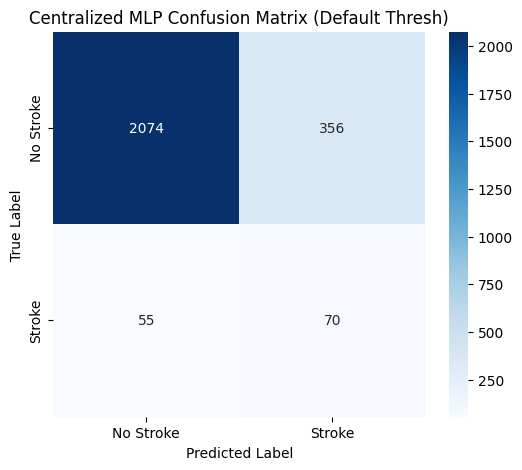

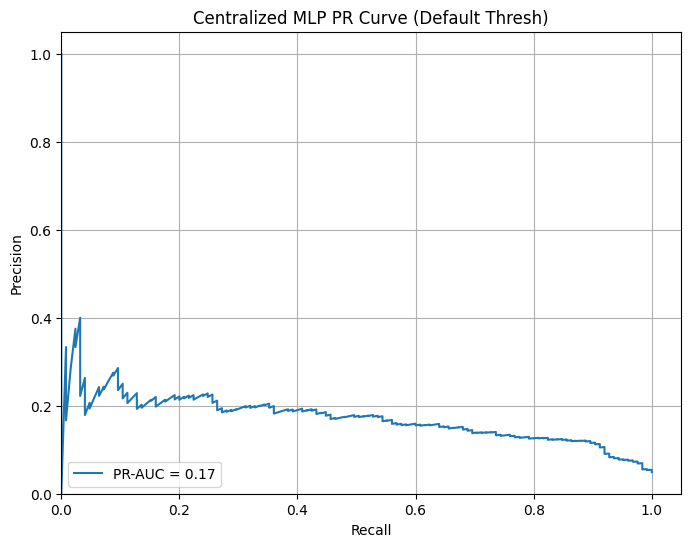

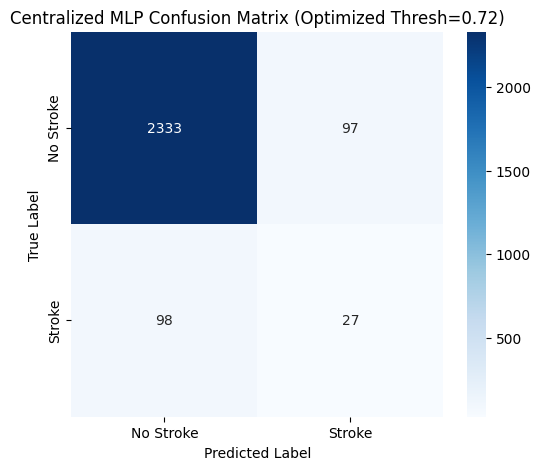

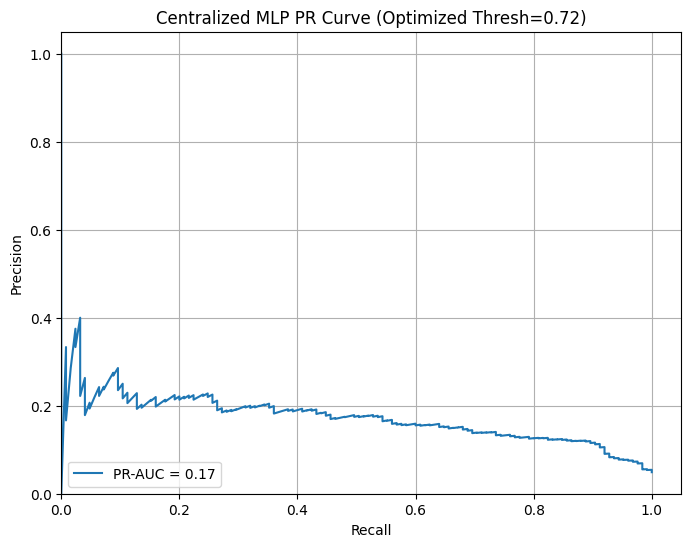


Starting FedAvg (Alpha=2.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=589, Pos=29, Neg=560, Pos %=4.92%, Imbalance Ratio=19.31
      Client 2: Size=363, Pos=24, Neg=339, Pos %=6.61%, Imbalance Ratio=14.12
      Client 3: Size=1602, Pos=71, Neg=1531, Pos %=4.43%, Imbalance Ratio=21.56
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.92%', '6.61%', '4.43%']
  Client Imbalance Ratios: ['19.31', '14.12', '21.56']
  Variance of Client Positive Percentages: 0.8713


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


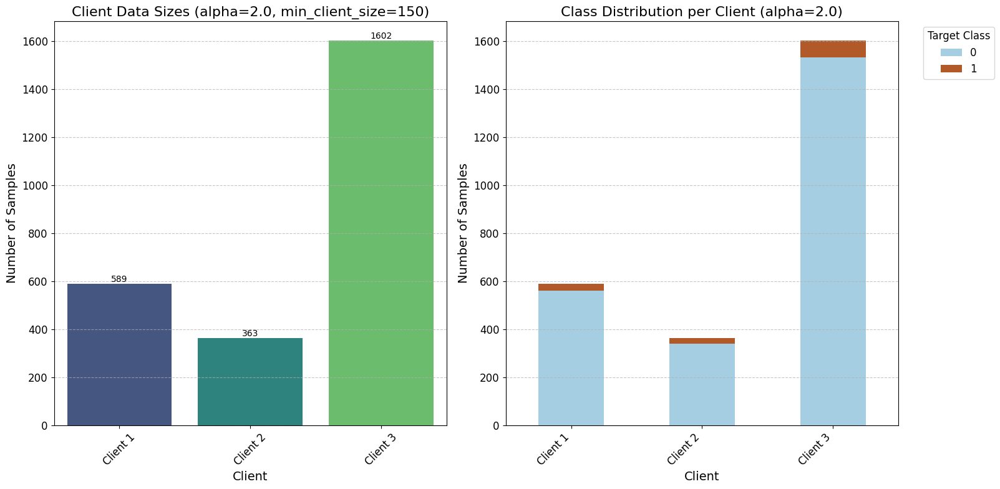

  Class weights applied: [ 0.5255144 10.2983871]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Starting threshold optimization based on 'f2' on validation set 

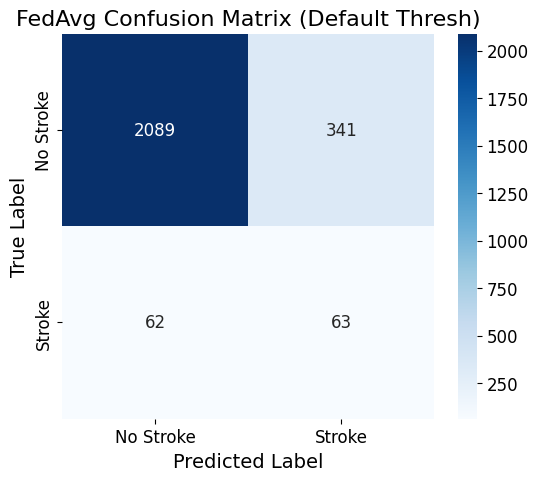

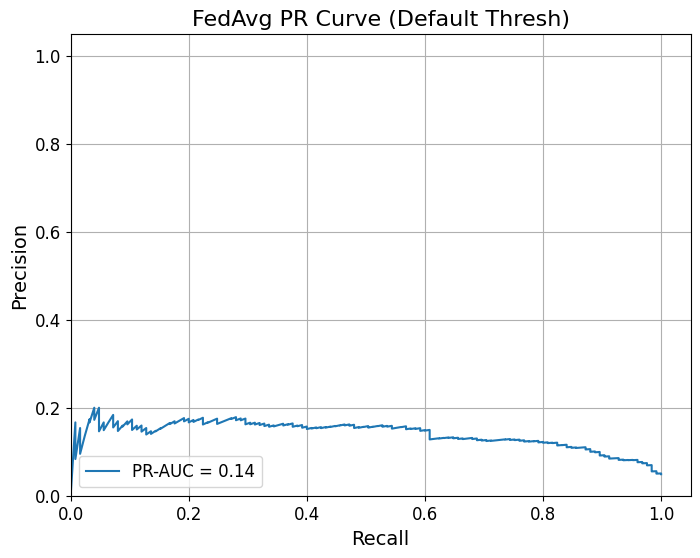


  Evaluating FedAvg model with OPTIMIZED threshold (0.44):
    Accuracy: 0.7292
    Balanced Accuracy: 0.7438
    Precision: 0.1255
    Recall: 0.7600
    F1: 0.2154
    F2: 0.3779
    Macro F1: 0.5259
    ROC-AUC: 0.8051
    PR-AUC: 0.1427
    MCC: 0.2303
    Sensitivity: 0.7600
    Specificity: 0.7276
    Confusion Matrix Counts: TP=95, TN=1768, FP=662, FN=30


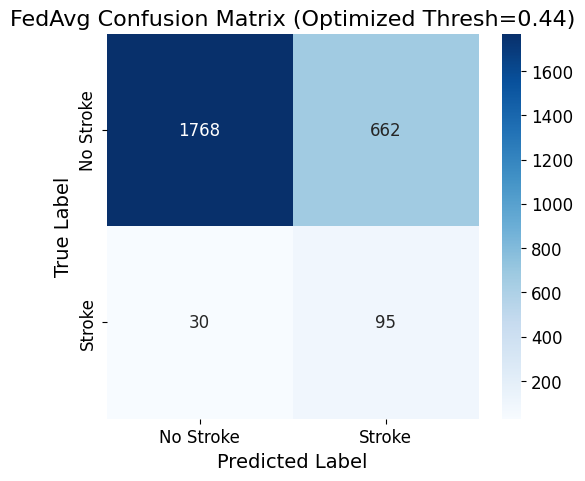

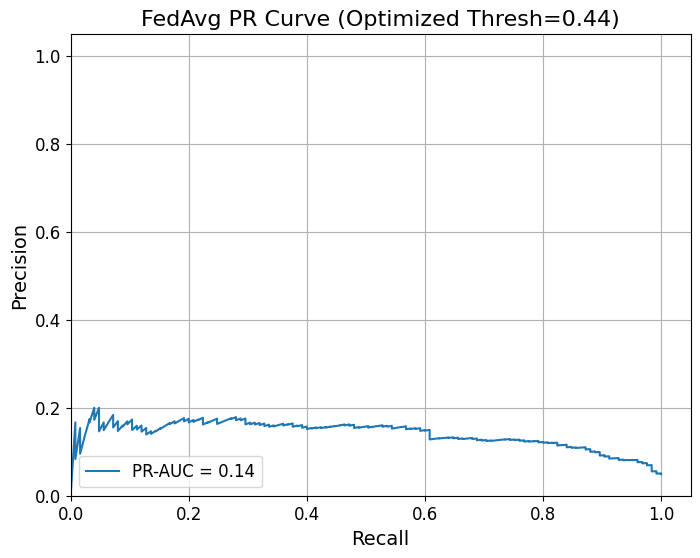


Starting FedProx (Alpha=2.0, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=589, Pos=29, Neg=560, Pos %=4.92%, Imbalance Ratio=19.31
      Client 2: Size=363, Pos=24, Neg=339, Pos %=6.61%, Imbalance Ratio=14.12
      Client 3: Size=1602, Pos=71, Neg=1531, Pos %=4.43%, Imbalance Ratio=21.56
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.92%', '6.61%', '4.43%']
  Client Imbalance Ratios: ['19.31', '14.12', '21.56']
  Variance of Client Positive Percentages: 0.8713


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


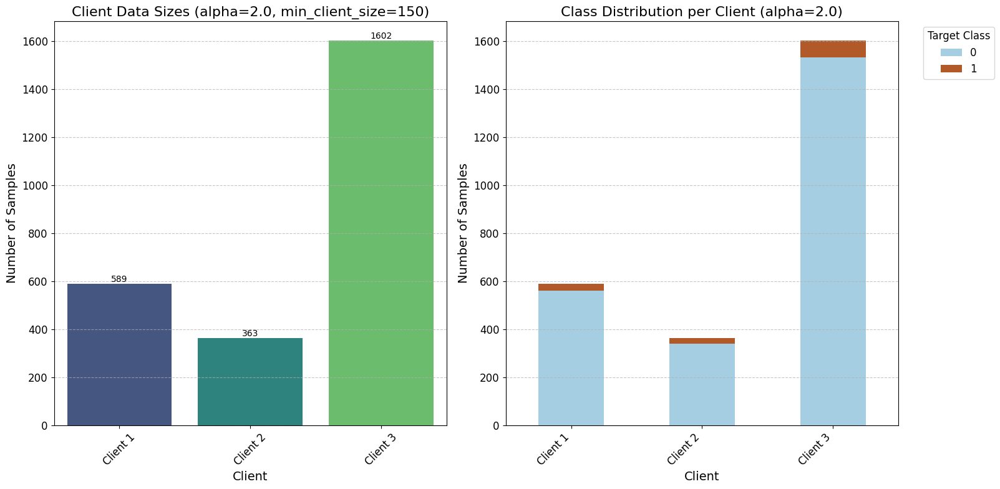

  Class weights applied: [ 0.5255144 10.2983871]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Starting threshold optimization based on 'f2' on validation set 

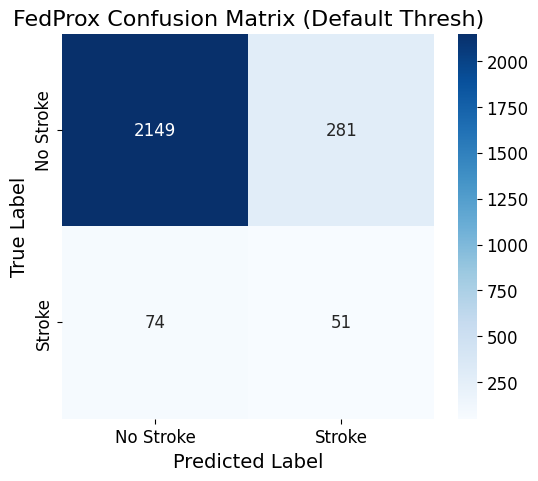

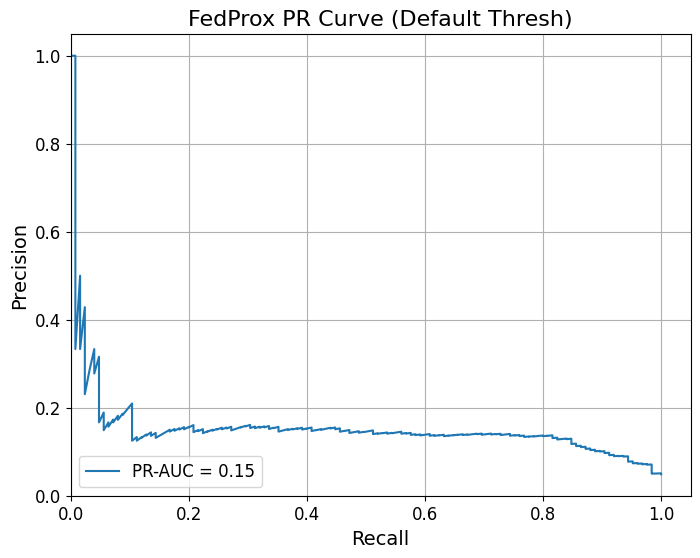


  Evaluating FedProx model with OPTIMIZED threshold (0.42):
    Accuracy: 0.7417
    Balanced Accuracy: 0.7693
    Precision: 0.1361
    Recall: 0.8000
    F1: 0.2326
    F2: 0.4049
    Macro F1: 0.5386
    ROC-AUC: 0.8082
    PR-AUC: 0.1550
    MCC: 0.2567
    Sensitivity: 0.8000
    Specificity: 0.7387
    Confusion Matrix Counts: TP=100, TN=1795, FP=635, FN=25


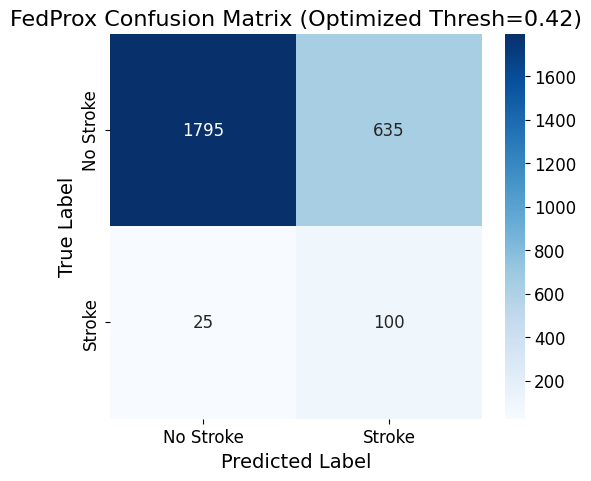

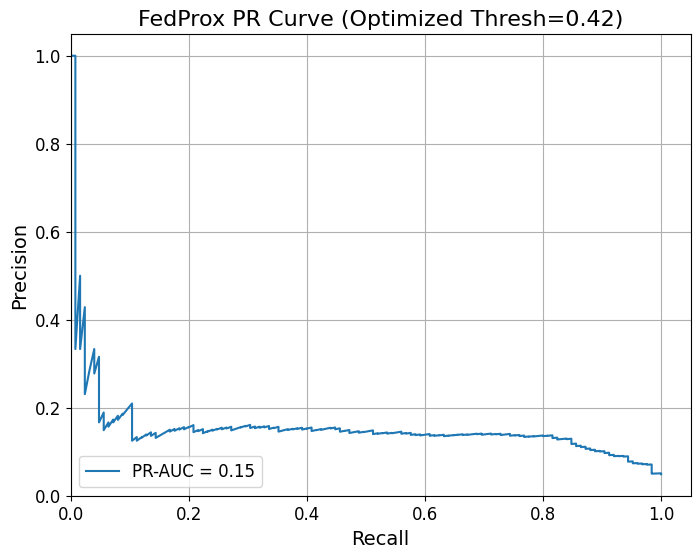


--- Running benchmark for Stroke, Seed 42, Repetition 1, Fold 2 ---
Random seeds set for reproducibility (Seed: 42).
  Effective parameters for stroke: Num Clients=3, Alpha Values=[2.0], Min Client Size=150, Min Positive=10

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [ 0.52572016 10.22      ]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=10.22
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.1131 (Mode=f1), F1=0.1131, F2=0.2417, Recall=1.0000, Balanced Acc=0.6590
      Threshold 0.06: Opt_Metric=0.1087 (Mode=f1), F1=0.1087, F2=0.2315, Recall=0.9375, Balanced Acc=0.6359
      Threshold 0.07: Opt_Metric=0.1132 (Mode=f1), F1=0.1132, F2=0.2396, Recall=0.9375, Balanced Acc=0.6508
      Threshold 0.08: Opt_Metric=0.1154 (Mode=f1), F1=0.1154, F2=0.2435, Recall=0.9375, Balanced Acc=0.6576
      Th

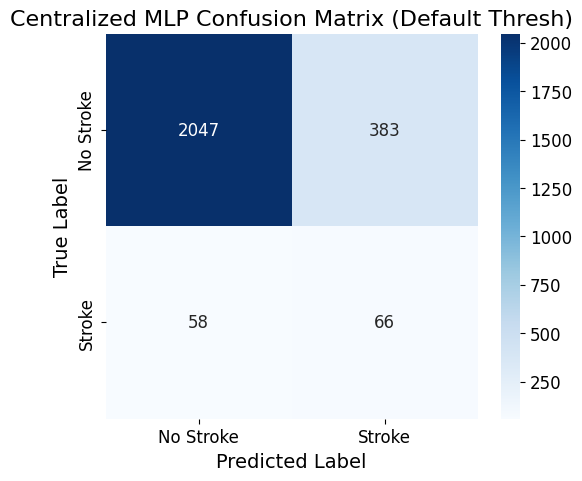

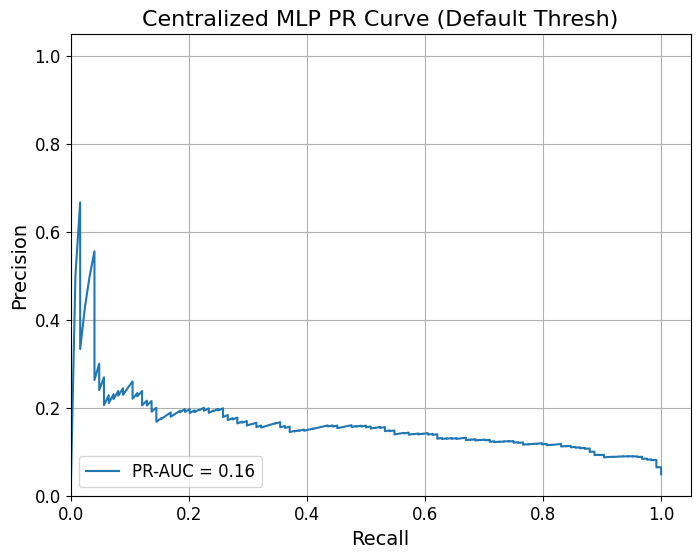

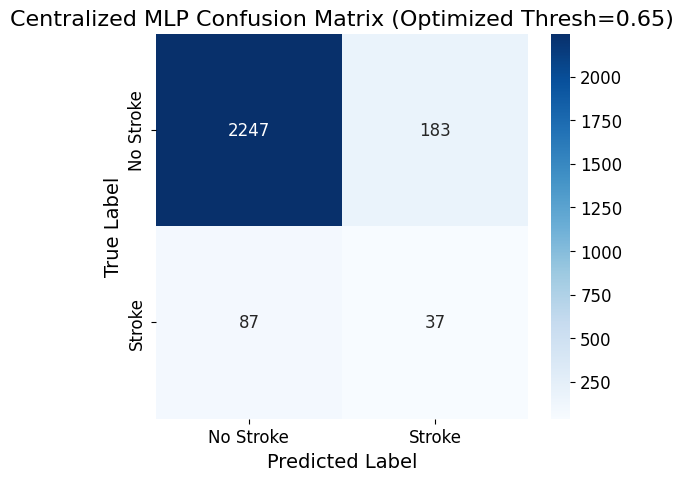

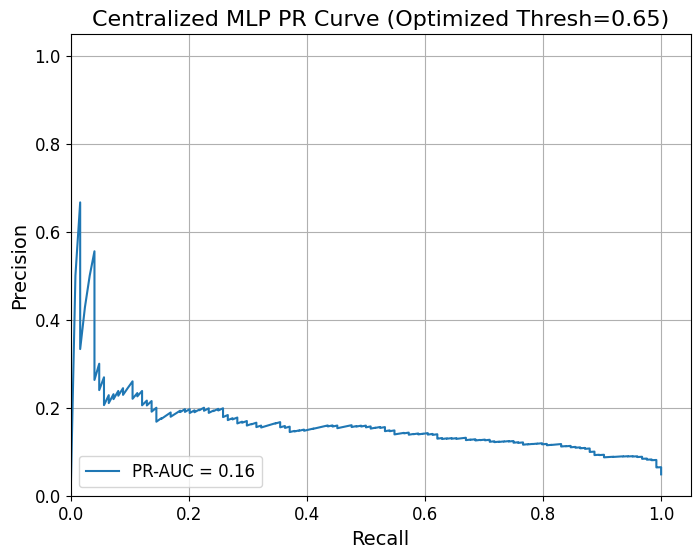


Starting FedAvg (Alpha=2.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=589, Pos=29, Neg=560, Pos %=4.92%, Imbalance Ratio=19.31
      Client 2: Size=363, Pos=24, Neg=339, Pos %=6.61%, Imbalance Ratio=14.12
      Client 3: Size=1603, Pos=72, Neg=1531, Pos %=4.49%, Imbalance Ratio=21.26
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.92%', '6.61%', '4.49%']
  Client Imbalance Ratios: ['19.31', '14.12', '21.26']
  Variance of Client Positive Percentages: 0.8367


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


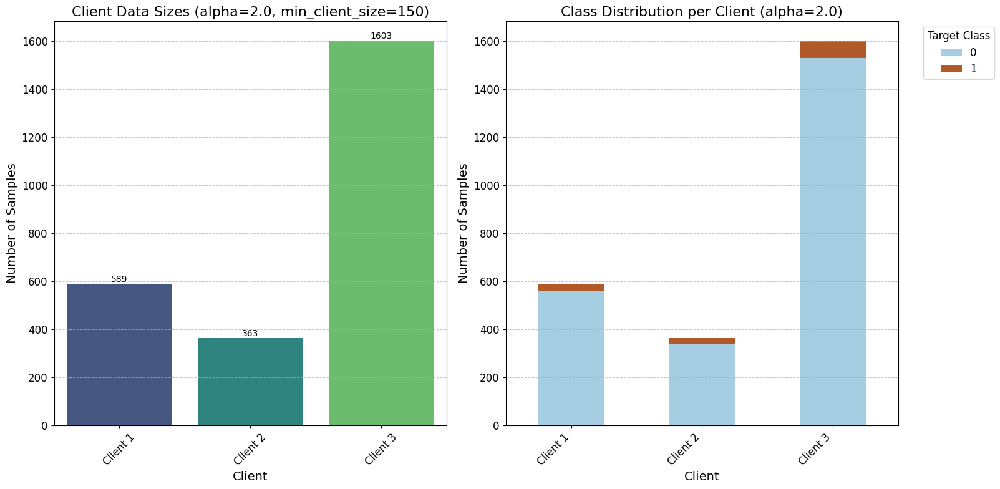

  Class weights applied: [ 0.52572016 10.22      ]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Starting threshold optimization based on 'f2' on validation se

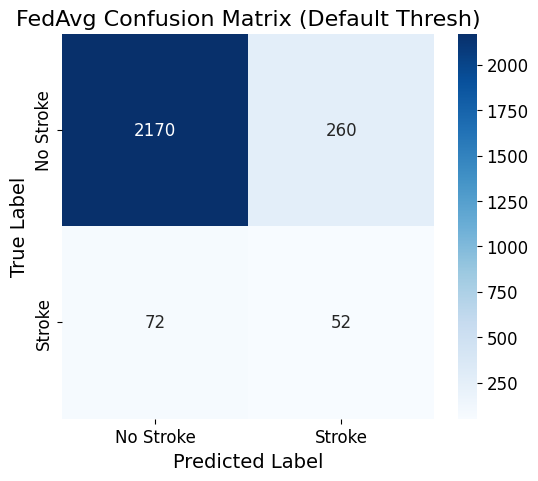

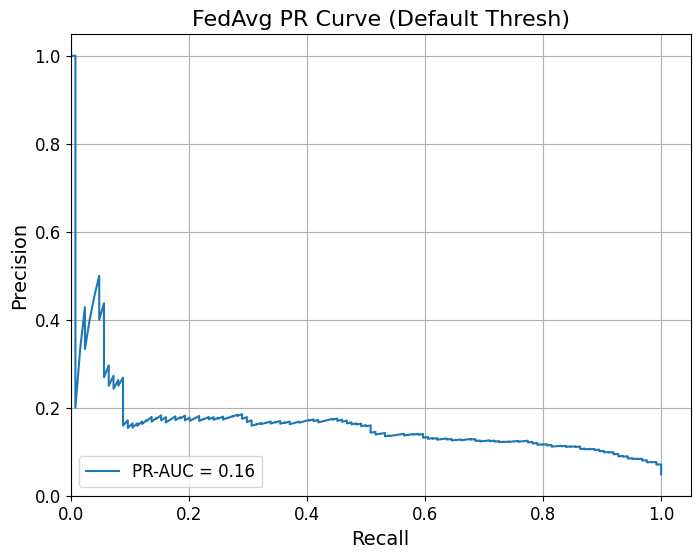


  Evaluating FedAvg model with OPTIMIZED threshold (0.43):
    Accuracy: 0.7204
    Balanced Accuracy: 0.7459
    Precision: 0.1228
    Recall: 0.7742
    F1: 0.2119
    F2: 0.3756
    Macro F1: 0.5210
    ROC-AUC: 0.8146
    PR-AUC: 0.1677
    MCC: 0.2294
    Sensitivity: 0.7742
    Specificity: 0.7177
    Confusion Matrix Counts: TP=96, TN=1744, FP=686, FN=28


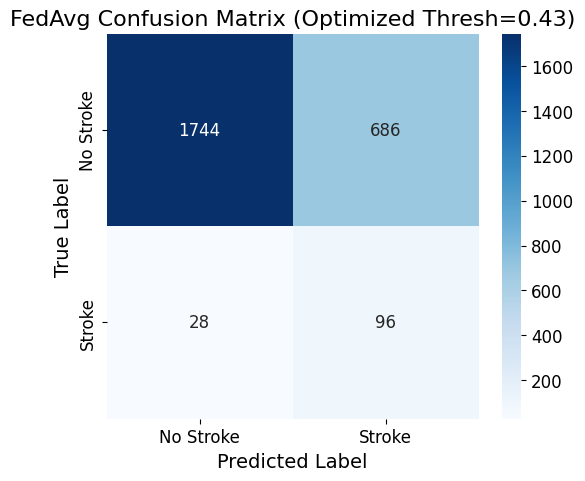

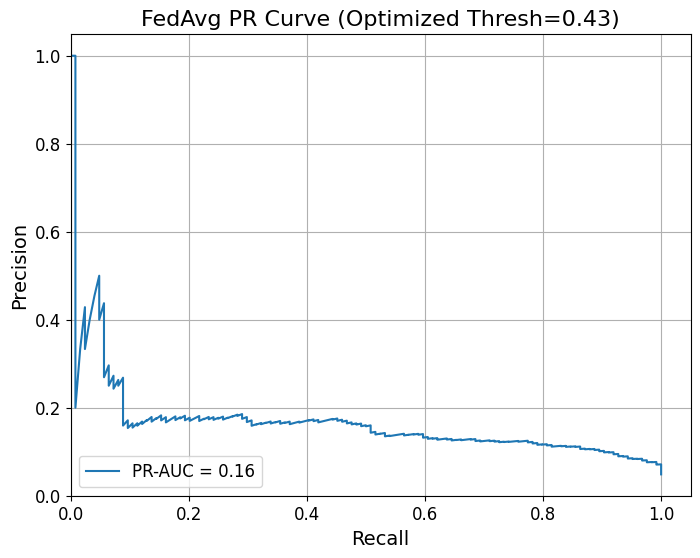


Starting FedProx (Alpha=2.0, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=589, Pos=29, Neg=560, Pos %=4.92%, Imbalance Ratio=19.31
      Client 2: Size=363, Pos=24, Neg=339, Pos %=6.61%, Imbalance Ratio=14.12
      Client 3: Size=1603, Pos=72, Neg=1531, Pos %=4.49%, Imbalance Ratio=21.26
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.92%', '6.61%', '4.49%']
  Client Imbalance Ratios: ['19.31', '14.12', '21.26']
  Variance of Client Positive Percentages: 0.8367


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


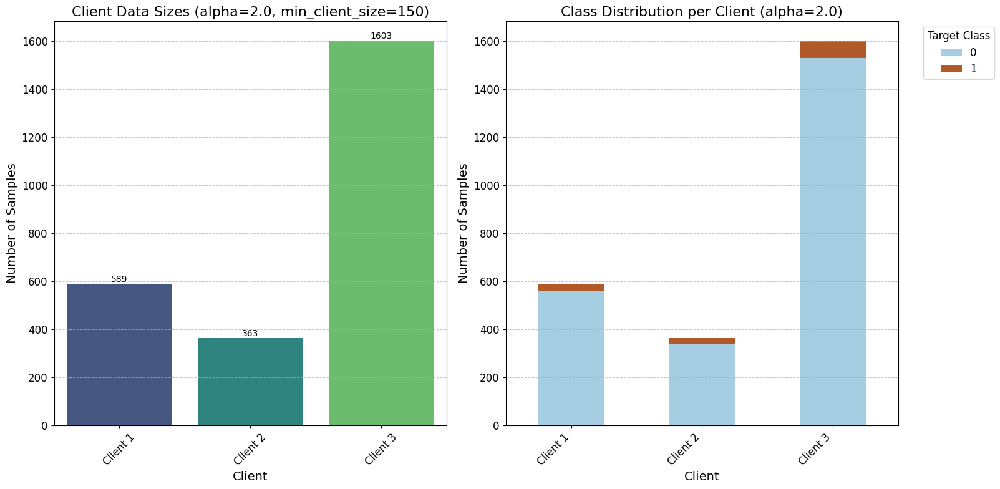

  Class weights applied: [ 0.52572016 10.22      ]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Starting threshold optimization based on 'f2' on validation se

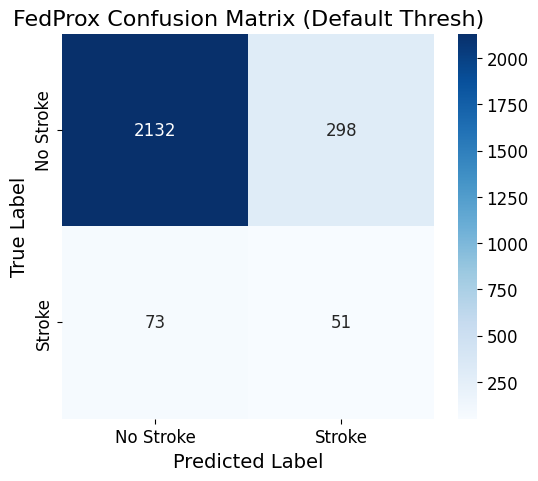

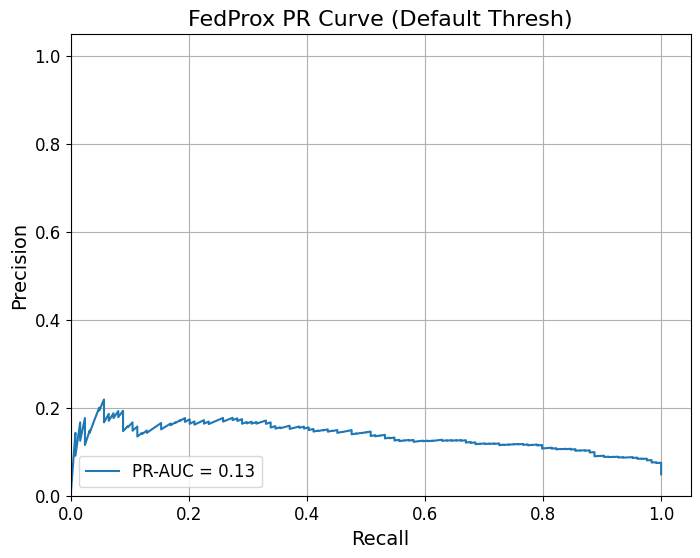


  Evaluating FedProx model with OPTIMIZED threshold (0.43):
    Accuracy: 0.7114
    Balanced Accuracy: 0.7336
    Precision: 0.1174
    Recall: 0.7581
    F1: 0.2032
    F2: 0.3624
    Macro F1: 0.5135
    ROC-AUC: 0.8034
    PR-AUC: 0.1380
    MCC: 0.2164
    Sensitivity: 0.7581
    Specificity: 0.7091
    Confusion Matrix Counts: TP=94, TN=1723, FP=707, FN=30


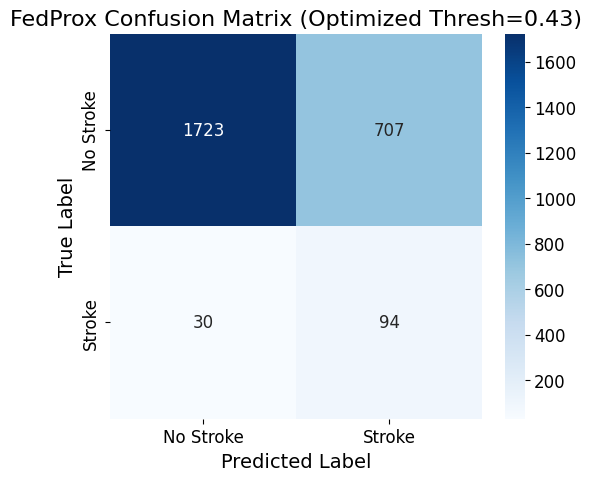

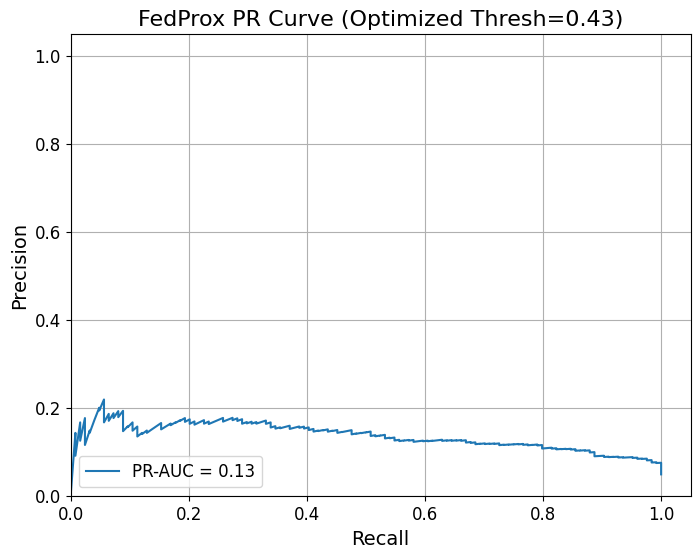

  [MULTI-SEED] Seed 42 success: 12 result rows found.

***** [MULTI-SEED] Running Seed 2/2: 52 *****

Starting Cross-Validation for Stroke, Seed 52
Random seeds set for reproducibility (Seed: 52).

--- Running benchmark for Stroke, Seed 52, Repetition 1, Fold 1 ---
Random seeds set for reproducibility (Seed: 52).
  Effective parameters for stroke: Num Clients=3, Alpha Values=[2.0], Min Client Size=150, Min Positive=10

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [ 0.5255144 10.2983871]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=10.30
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.0725 (Mode=f1), F1=0.0725, F2=0.1634, Recall=1.0000, Balanced Acc=0.6578
      Threshold 0.06: Opt_Metric=0.0755 (Mode=f1), F1=0.0755, F2=0.1695, Recall=1.0000, Balanced Acc=0.6725
      Threshold 0.07: Opt_Met

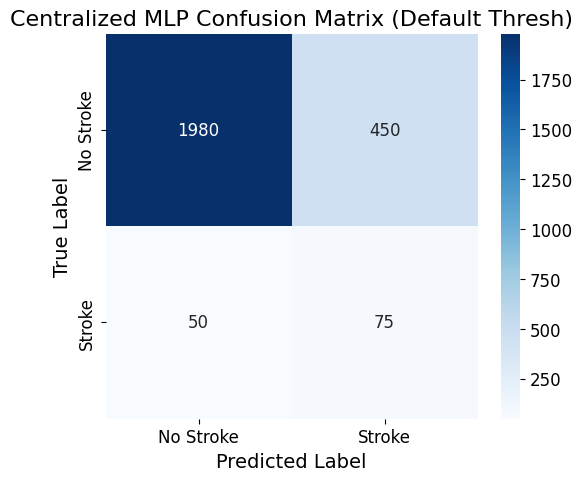

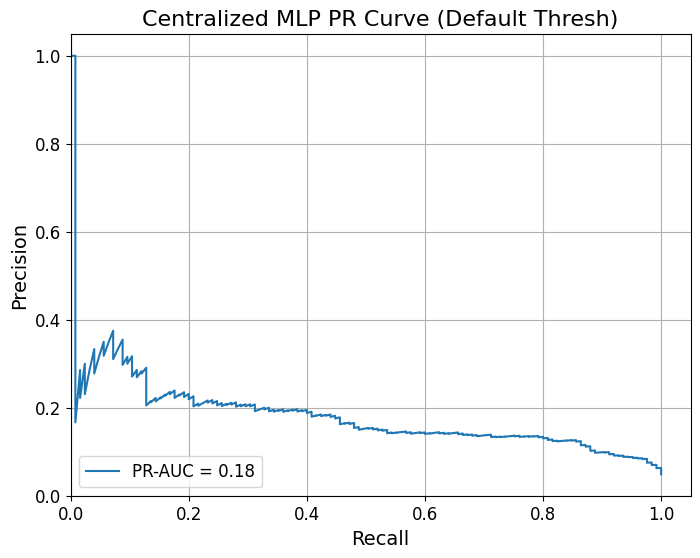

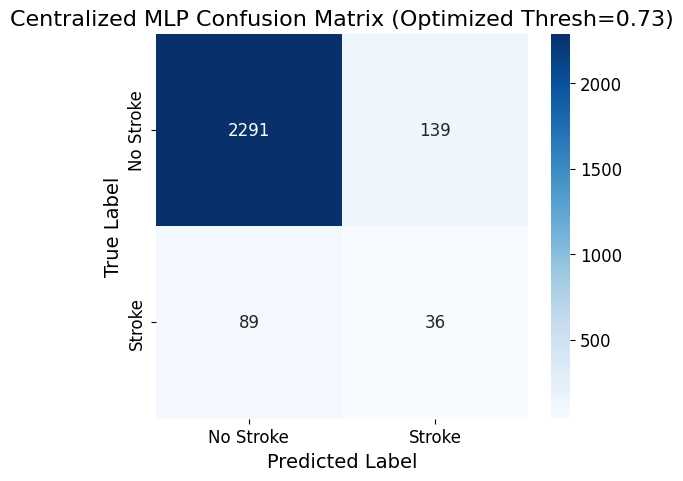

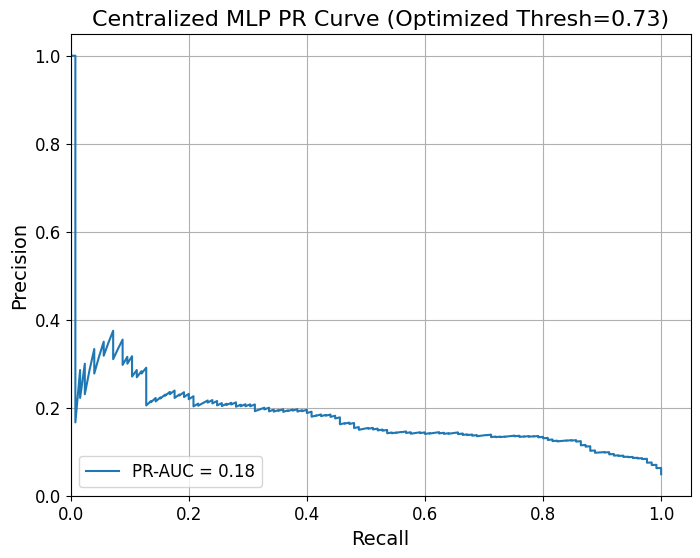


Starting FedAvg (Alpha=2.0, Mu=0.0) with seed 52...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=794, Pos=34, Neg=760, Pos %=4.28%, Imbalance Ratio=22.35
      Client 2: Size=885, Pos=48, Neg=837, Pos %=5.42%, Imbalance Ratio=17.44
      Client 3: Size=875, Pos=42, Neg=833, Pos %=4.80%, Imbalance Ratio=19.83
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.28%', '5.42%', '4.80%']
  Client Imbalance Ratios: ['22.35', '17.44', '19.83']
  Variance of Client Positive Percentages: 0.2178


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


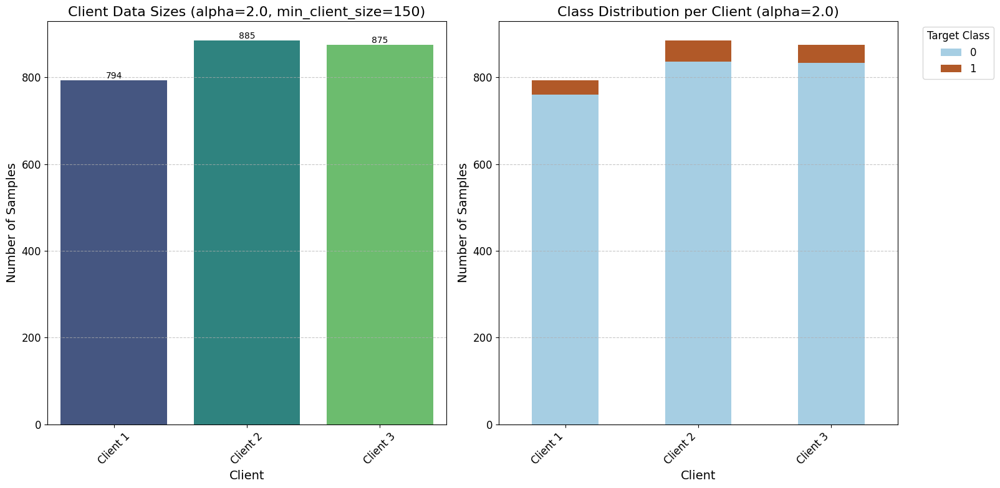

  Class weights applied: [ 0.5255144 10.2983871]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Starting threshold optimization based on 'f2' on validation set 

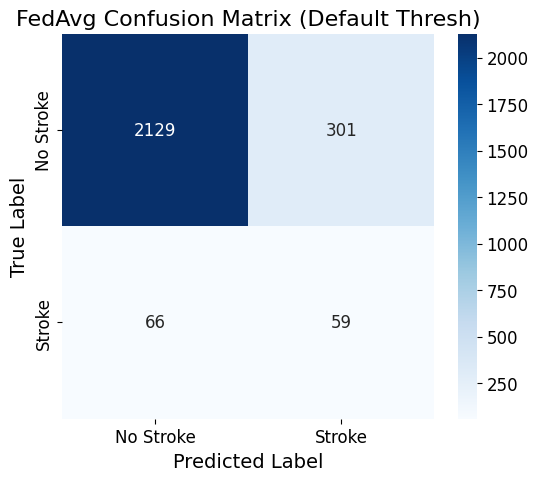

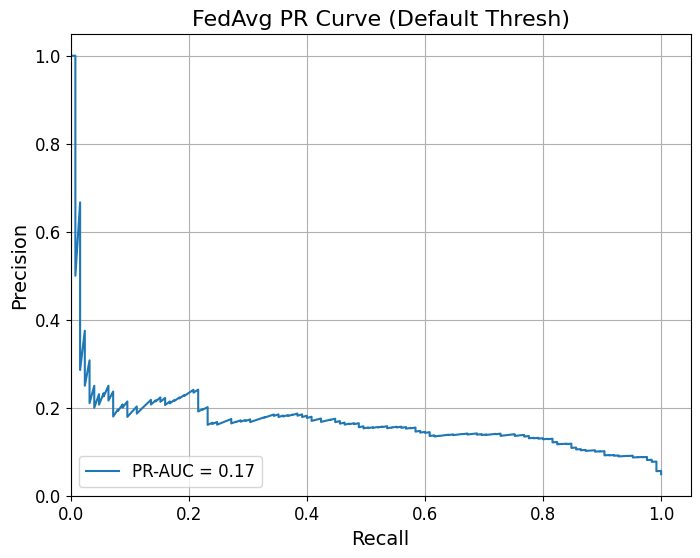


  Evaluating FedAvg model with OPTIMIZED threshold (0.44):
    Accuracy: 0.7515
    Balanced Accuracy: 0.7593
    Precision: 0.1368
    Recall: 0.7680
    F1: 0.2322
    F2: 0.3993
    Macro F1: 0.5420
    ROC-AUC: 0.8216
    PR-AUC: 0.1724
    MCC: 0.2506
    Sensitivity: 0.7680
    Specificity: 0.7506
    Confusion Matrix Counts: TP=96, TN=1824, FP=606, FN=29


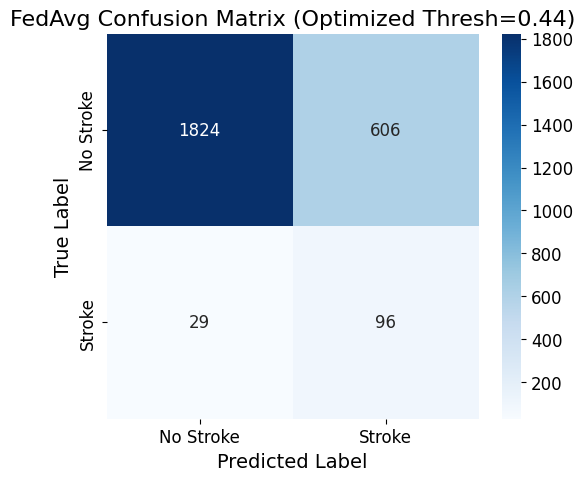

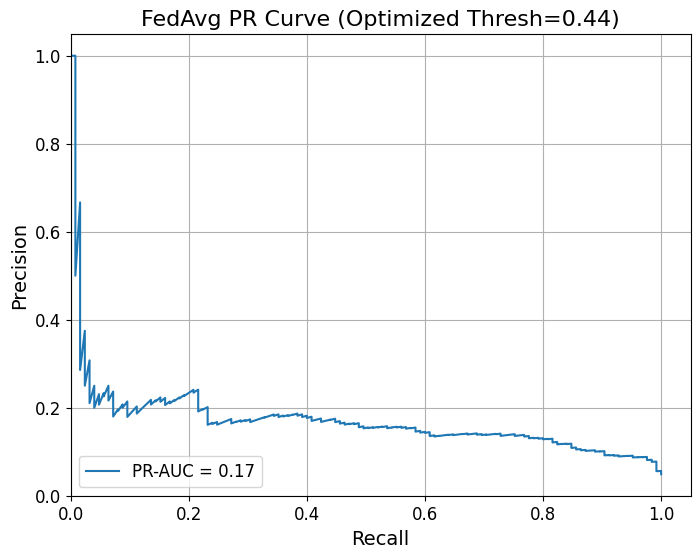


Starting FedProx (Alpha=2.0, Mu=0.01) with seed 52...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=794, Pos=34, Neg=760, Pos %=4.28%, Imbalance Ratio=22.35
      Client 2: Size=885, Pos=48, Neg=837, Pos %=5.42%, Imbalance Ratio=17.44
      Client 3: Size=875, Pos=42, Neg=833, Pos %=4.80%, Imbalance Ratio=19.83
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.28%', '5.42%', '4.80%']
  Client Imbalance Ratios: ['22.35', '17.44', '19.83']
  Variance of Client Positive Percentages: 0.2178


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


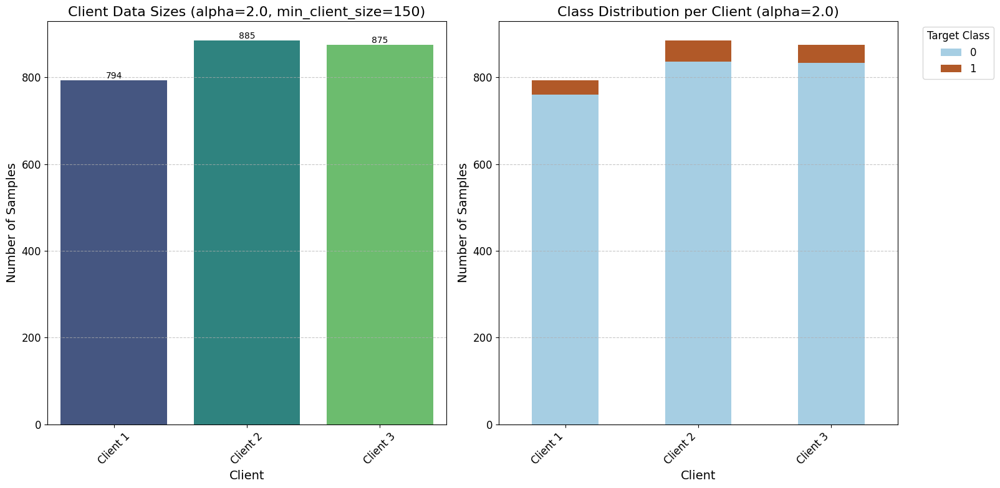

  Class weights applied: [ 0.5255144 10.2983871]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.30)
  Starting threshold optimization based on 'f2' on validation set 

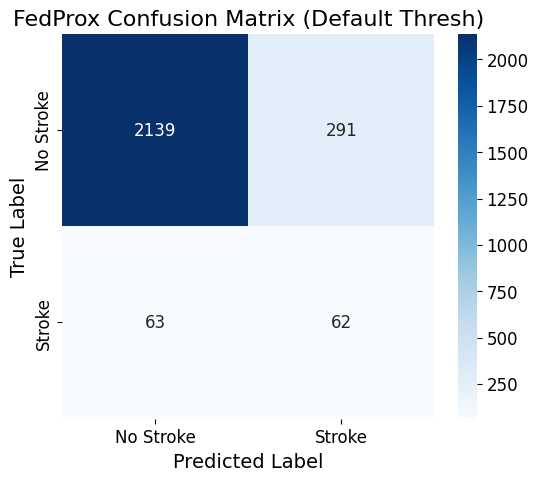

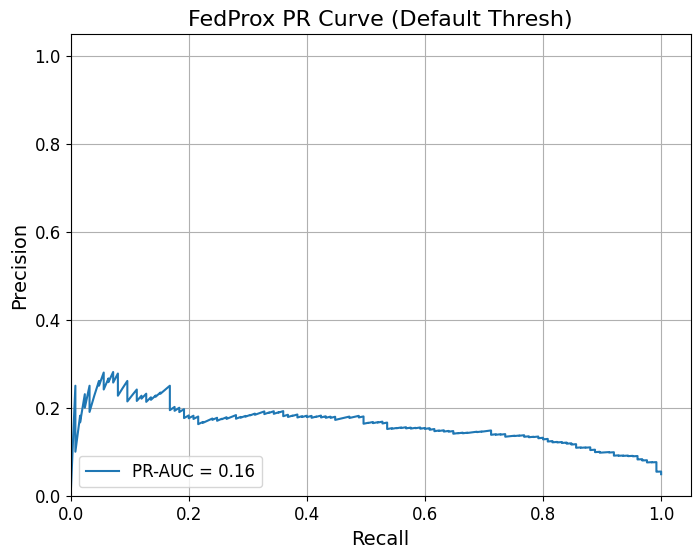


  Evaluating FedProx model with OPTIMIZED threshold (0.46):
    Accuracy: 0.7859
    Balanced Accuracy: 0.7509
    Precision: 0.1483
    Recall: 0.7120
    F1: 0.2455
    F2: 0.4045
    Macro F1: 0.5604
    ROC-AUC: 0.8246
    PR-AUC: 0.1660
    MCC: 0.2553
    Sensitivity: 0.7120
    Specificity: 0.7897
    Confusion Matrix Counts: TP=89, TN=1919, FP=511, FN=36


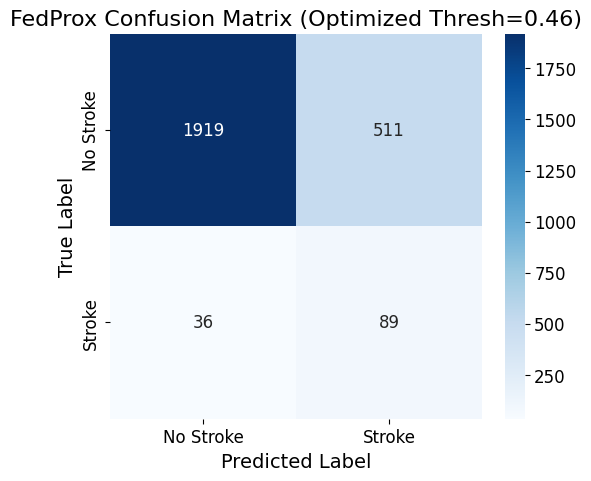

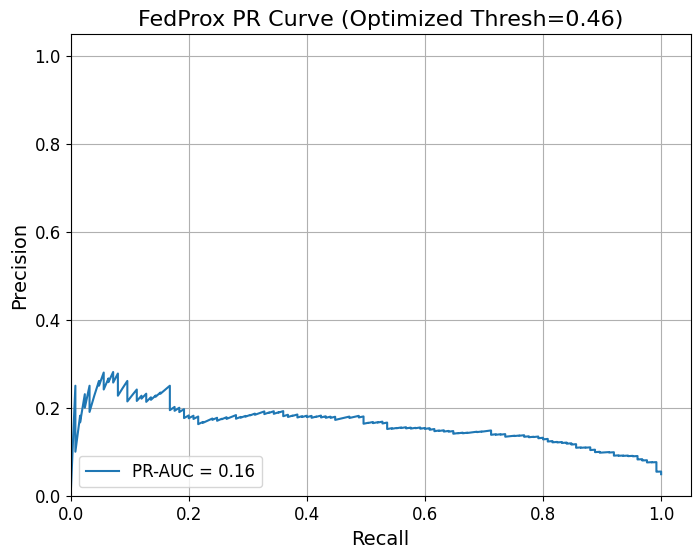


--- Running benchmark for Stroke, Seed 52, Repetition 1, Fold 2 ---
Random seeds set for reproducibility (Seed: 52).
  Effective parameters for stroke: Num Clients=3, Alpha Values=[2.0], Min Client Size=150, Min Positive=10

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [ 0.52572016 10.22      ]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=10.22
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.1686 (Mode=f1), F1=0.1686, F2=0.3333, Recall=0.9565, Balanced Acc=0.6791
      Threshold 0.06: Opt_Metric=0.1781 (Mode=f1), F1=0.1781, F2=0.3481, Recall=0.9565, Balanced Acc=0.6985
      Threshold 0.07: Opt_Metric=0.1833 (Mode=f1), F1=0.1833, F2=0.3560, Recall=0.9565, Balanced Acc=0.7082
      Threshold 0.08: Opt_Metric=0.1818 (Mode=f1), F1=0.1818, F2=0.3500, Recall=0.9130, Balanced Acc=0.6975
      Th

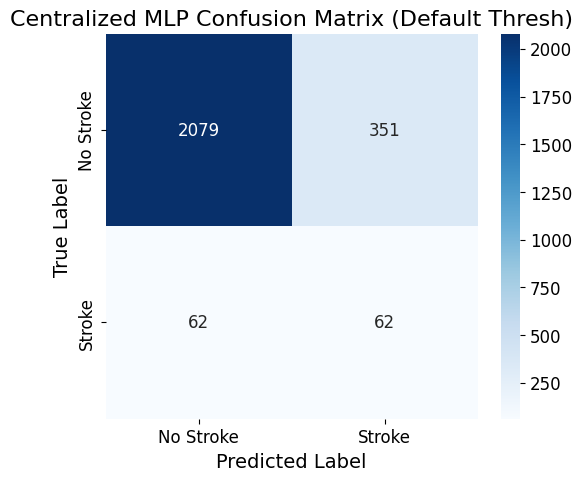

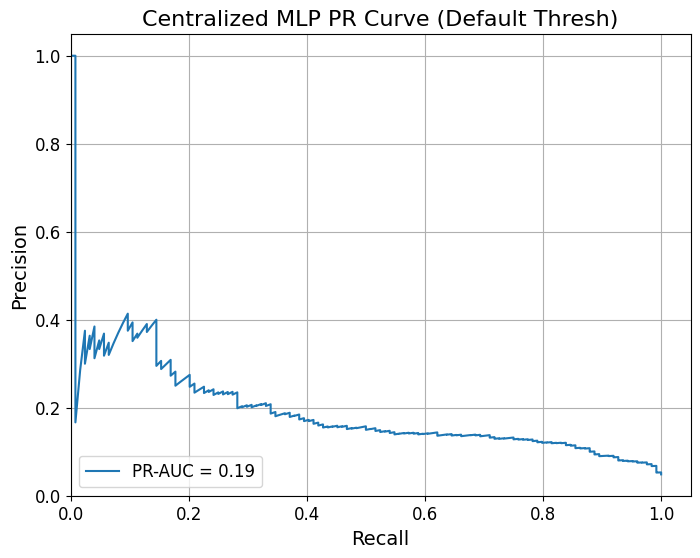

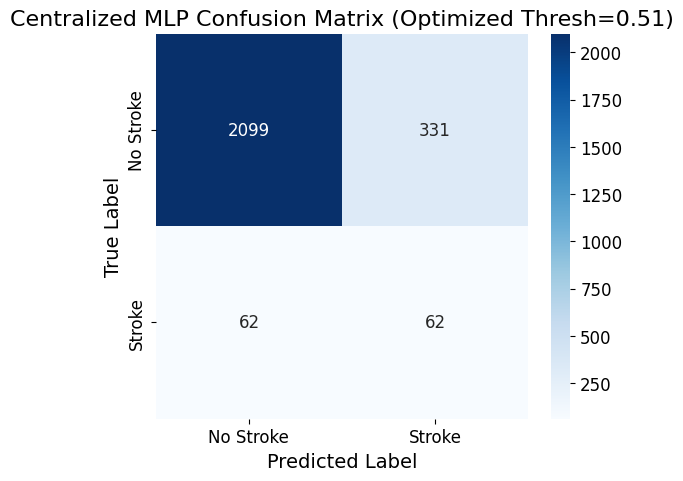

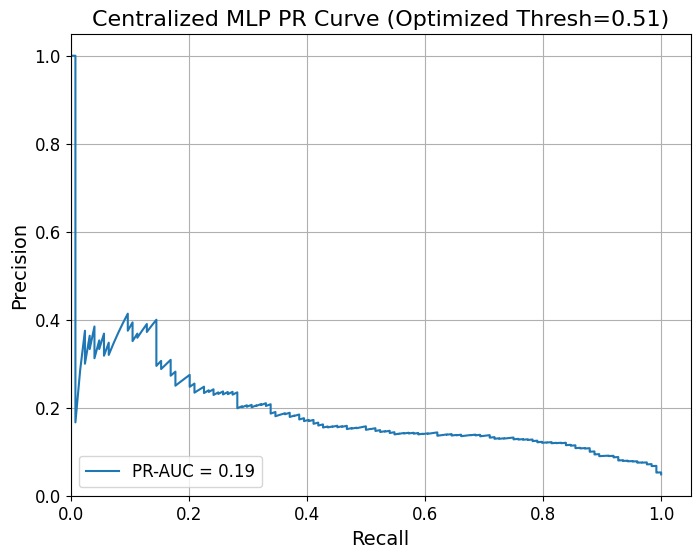


Starting FedAvg (Alpha=2.0, Mu=0.0) with seed 52...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=794, Pos=34, Neg=760, Pos %=4.28%, Imbalance Ratio=22.35
      Client 2: Size=885, Pos=48, Neg=837, Pos %=5.42%, Imbalance Ratio=17.44
      Client 3: Size=876, Pos=43, Neg=833, Pos %=4.91%, Imbalance Ratio=19.37
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.28%', '5.42%', '4.91%']
  Client Imbalance Ratios: ['22.35', '17.44', '19.37']
  Variance of Client Positive Percentages: 0.2179


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


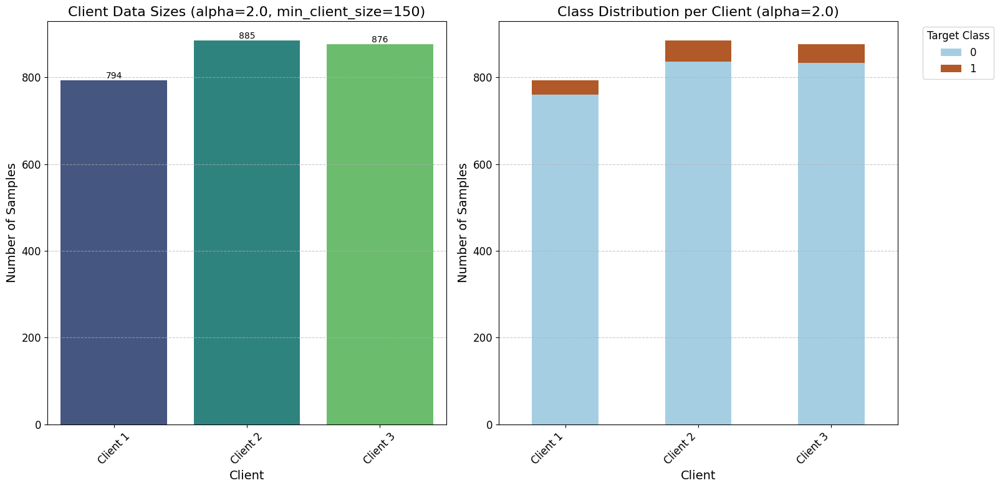

  Class weights applied: [ 0.52572016 10.22      ]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Starting threshold optimization based on 'f2' on validation se

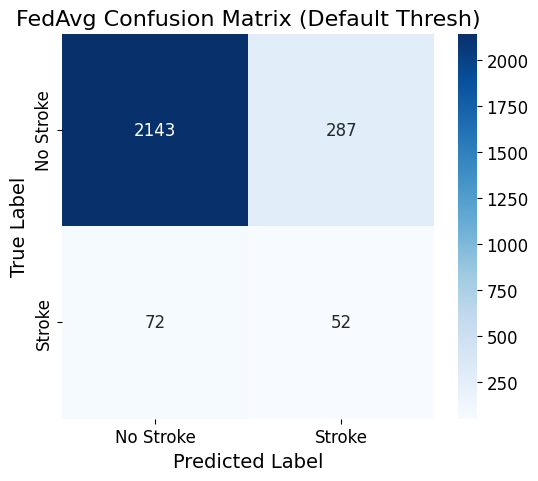

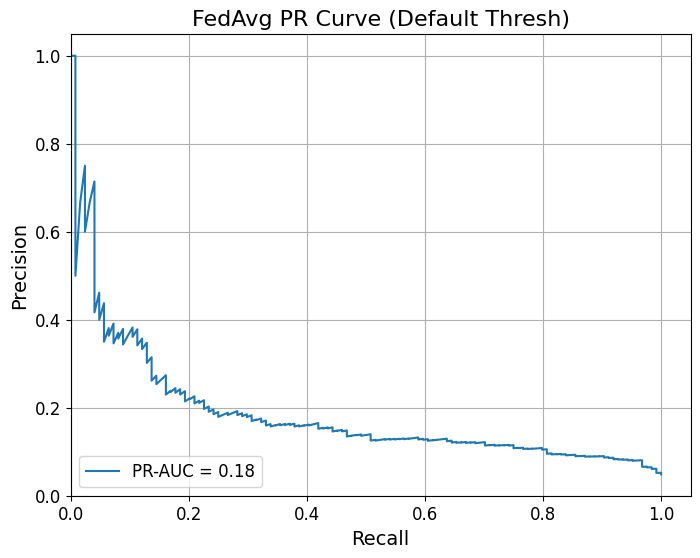


  Evaluating FedAvg model with OPTIMIZED threshold (0.46):
    Accuracy: 0.7694
    Balanced Accuracy: 0.7066
    Precision: 0.1268
    Recall: 0.6371
    F1: 0.2115
    F2: 0.3530
    Macro F1: 0.5382
    ROC-AUC: 0.7931
    PR-AUC: 0.1881
    MCC: 0.2068
    Sensitivity: 0.6371
    Specificity: 0.7761
    Confusion Matrix Counts: TP=79, TN=1886, FP=544, FN=45


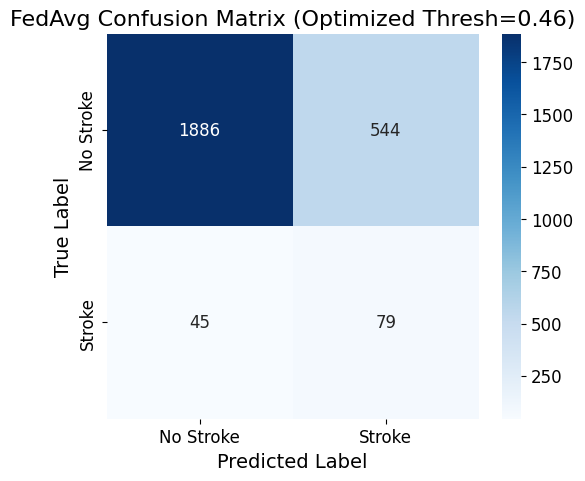

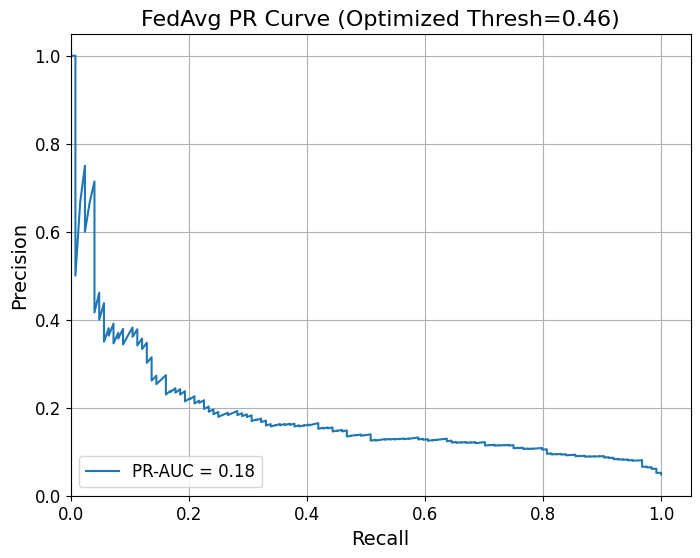


Starting FedProx (Alpha=2.0, Mu=0.01) with seed 52...

Attempting Dirichlet Partition (Alpha=2.0, Min Client Size=150, Min Positive=10, Min Negative=5) for 3 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=794, Pos=34, Neg=760, Pos %=4.28%, Imbalance Ratio=22.35
      Client 2: Size=885, Pos=48, Neg=837, Pos %=5.42%, Imbalance Ratio=17.44
      Client 3: Size=876, Pos=43, Neg=833, Pos %=4.91%, Imbalance Ratio=19.37
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['4.28%', '5.42%', '4.91%']
  Client Imbalance Ratios: ['22.35', '17.44', '19.37']
  Variance of Client Positive Percentages: 0.2179


/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


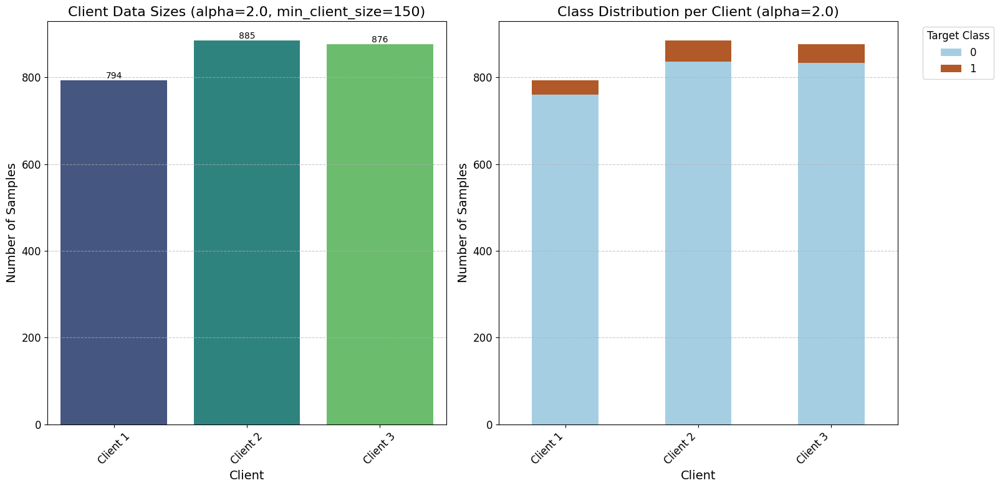

  Class weights applied: [ 0.52572016 10.22      ]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.22)
  Starting threshold optimization based on 'f2' on validation se

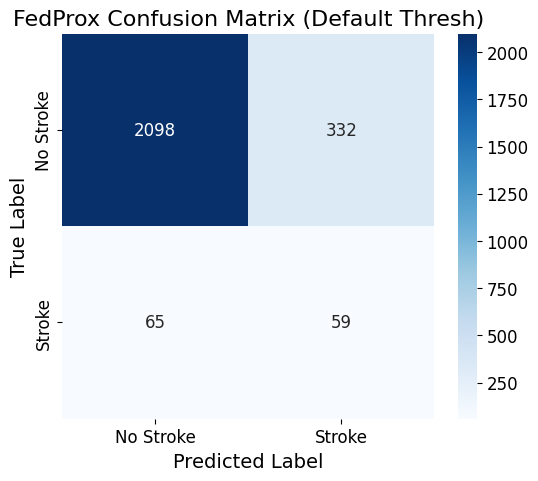

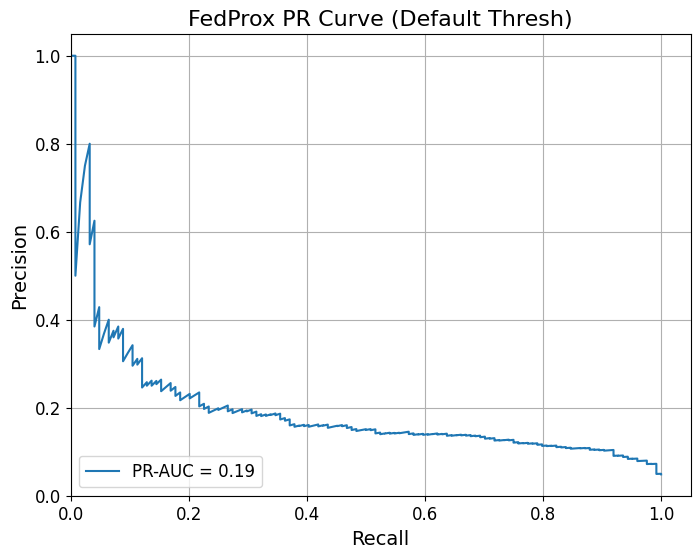


  Evaluating FedProx model with OPTIMIZED threshold (0.46):
    Accuracy: 0.7639
    Balanced Accuracy: 0.7343
    Precision: 0.1332
    Recall: 0.7016
    F1: 0.2239
    F2: 0.3786
    Macro F1: 0.5424
    ROC-AUC: 0.8154
    PR-AUC: 0.1939
    MCC: 0.2309
    Sensitivity: 0.7016
    Specificity: 0.7671
    Confusion Matrix Counts: TP=87, TN=1864, FP=566, FN=37


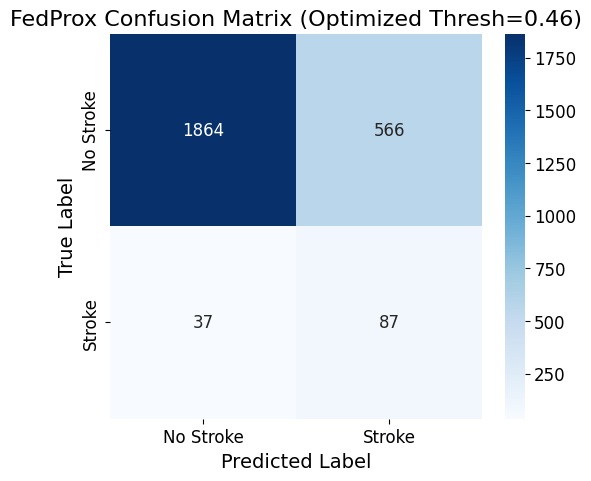

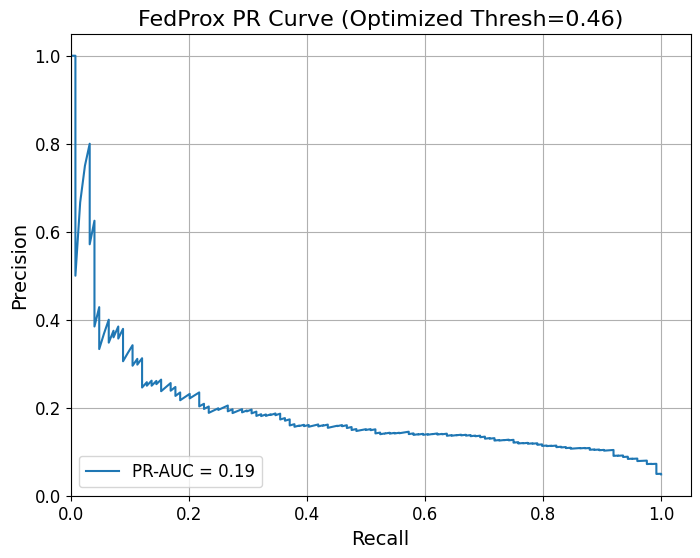

  [MULTI-SEED] Seed 52 success: 12 result rows found.
[MULTI-SEED] Successfully aggregated 0 metric rows for stroke.
  [MASTER] WARNING: No CV results captured for stroke

--- Starting Local Epoch Ablation for stroke (FedAvg) ---

--- Loading and Preprocessing Dataset: Stroke ---
Dataset 'stroke' loaded and preprocessed: X.shape=(5109, 15), input_dim=15

--- Stroke Dataset Class Distribution ---
Total Samples: 5109
Positive Samples (Stroke): 249
Negative Samples (No Stroke): 4860
Positive Percentage: 4.87%
Negative Percentage: 95.13%
Imbalance Ratio (Negative:Positive): 19.52
-----------------------------------------

Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=20, Pos=6, Neg=14, Pos %=30.00%, Imbalance Ratio=2

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


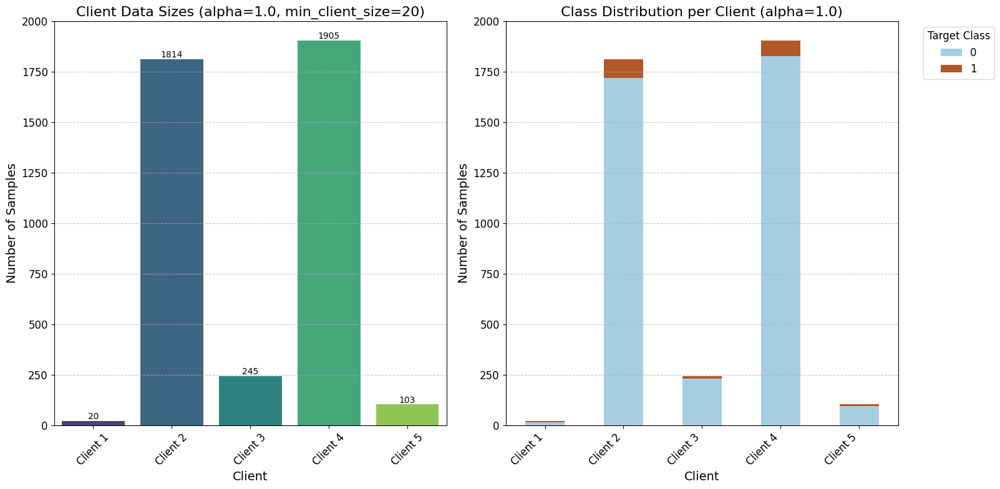

  Class weights applied: [ 0.52559156 10.26884422]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Usi

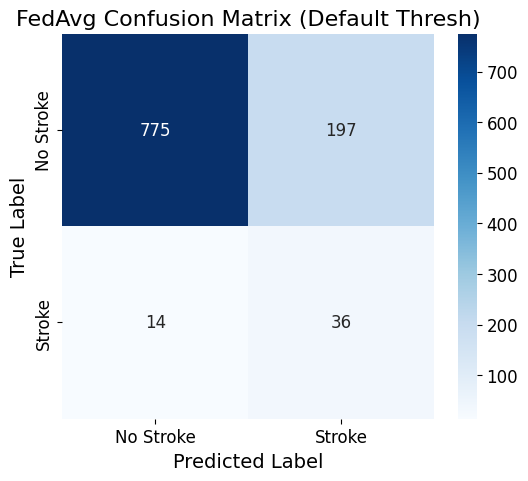

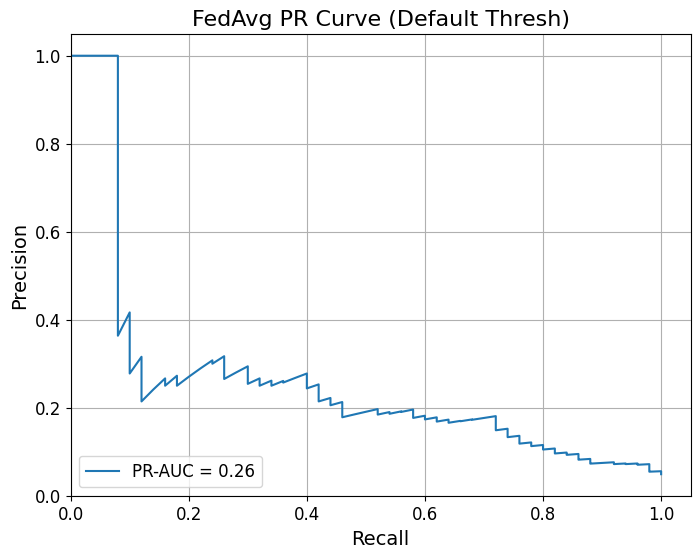


  Evaluating FedAvg model with OPTIMIZED threshold (0.57):
    Accuracy: 0.9110
    Balanced Accuracy: 0.6686
    Precision: 0.2469
    Recall: 0.4000
    F1: 0.3053
    F2: 0.3559
    Macro F1: 0.6289
    ROC-AUC: 0.8159
    PR-AUC: 0.2602
    MCC: 0.2693
    Sensitivity: 0.4000
    Specificity: 0.9372
    Confusion Matrix Counts: TP=20, TN=911, FP=61, FN=30


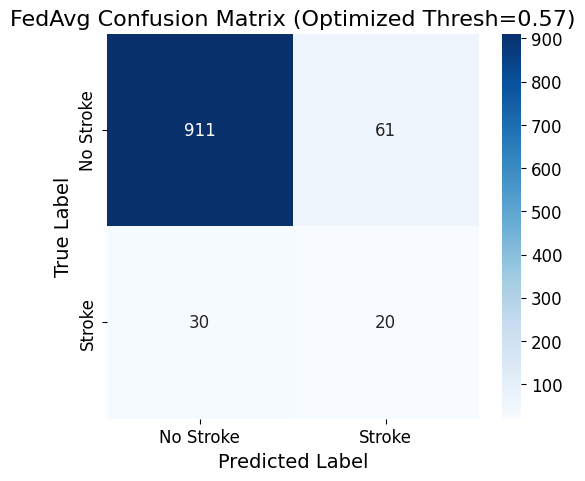

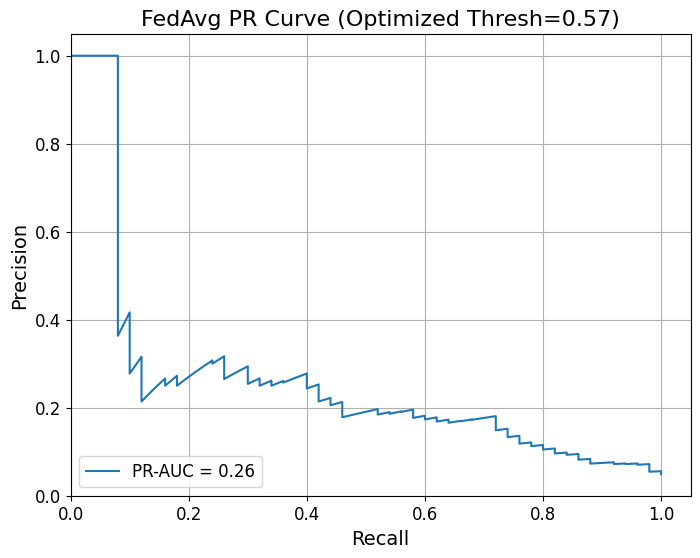


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=20, Pos=6, Neg=14, Pos %=30.00%, Imbalance Ratio=2.33
      Client 2: Size=1814, Pos=95, Neg=1719, Pos %=5.24%, Imbalance Ratio=18.09
      Client 3: Size=245, Pos=13, Neg=232, Pos %=5.31%, Imbalance Ratio=17.85
      Client 4: Size=1905, Pos=77, Neg=1828, Pos %=4.04%, Imbalance Ratio=23.74
      Client 5: Size=103, Pos=8, Neg=95, Pos %=7.77%, Imbalance Ratio=11.88
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['30.00%', '5.24%', '5.31%', '4.04%', '7.77%']
  Client Imbalance Ratios: ['2.

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


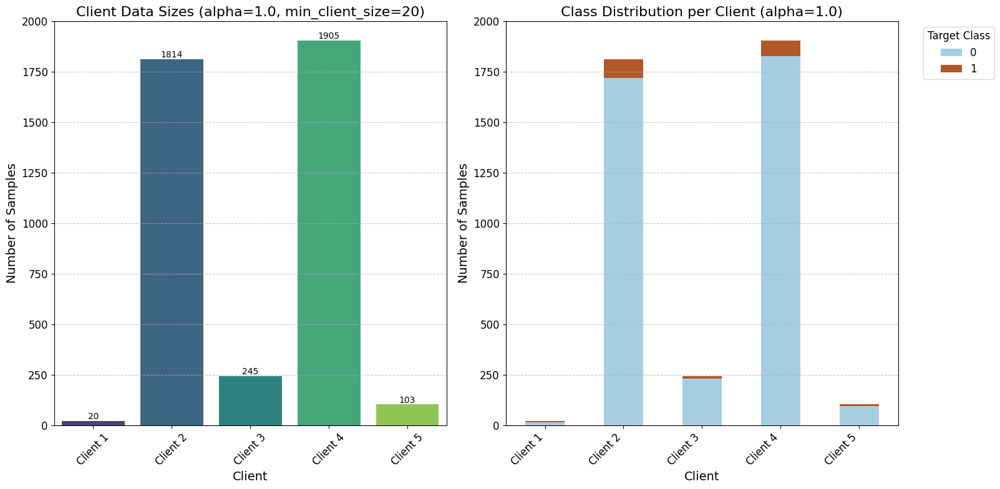

  Class weights applied: [ 0.52559156 10.26884422]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Usi

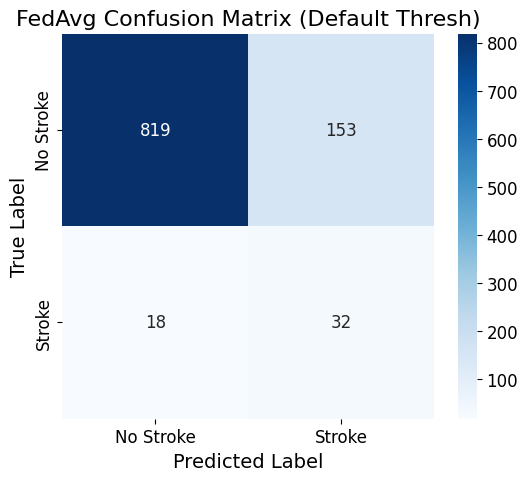

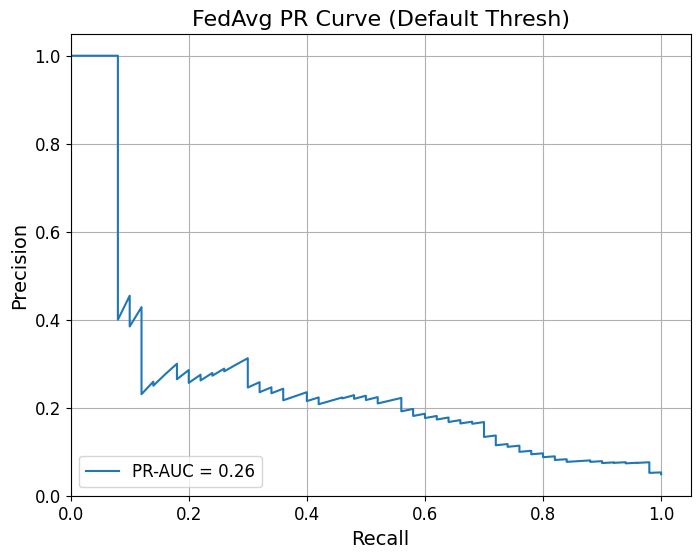


  Evaluating FedAvg model with OPTIMIZED threshold (0.55):
    Accuracy: 0.8904
    Balanced Accuracy: 0.7052
    Precision: 0.2232
    Recall: 0.5000
    F1: 0.3086
    F2: 0.4006
    Macro F1: 0.6246
    ROC-AUC: 0.8063
    PR-AUC: 0.2606
    MCC: 0.2835
    Sensitivity: 0.5000
    Specificity: 0.9105
    Confusion Matrix Counts: TP=25, TN=885, FP=87, FN=25


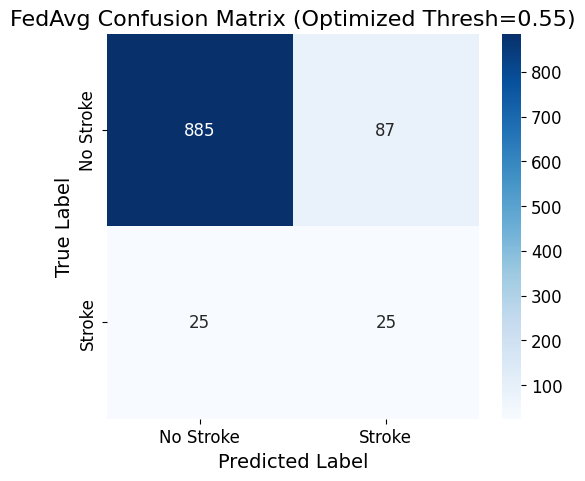

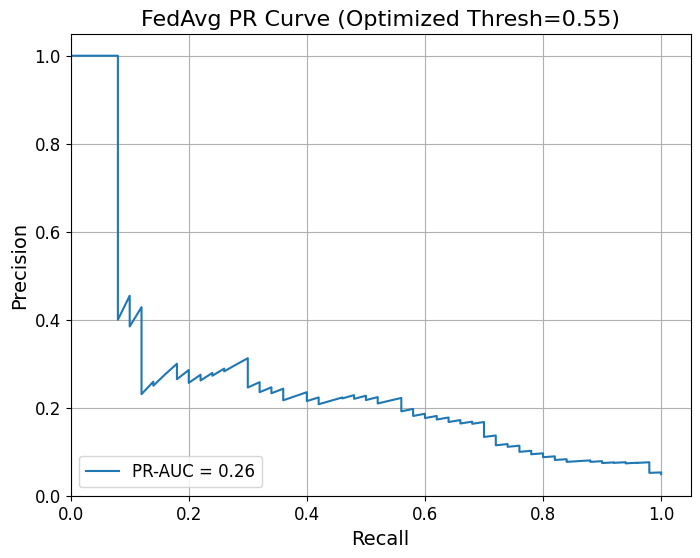


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=20, Pos=6, Neg=14, Pos %=30.00%, Imbalance Ratio=2.33
      Client 2: Size=1814, Pos=95, Neg=1719, Pos %=5.24%, Imbalance Ratio=18.09
      Client 3: Size=245, Pos=13, Neg=232, Pos %=5.31%, Imbalance Ratio=17.85
      Client 4: Size=1905, Pos=77, Neg=1828, Pos %=4.04%, Imbalance Ratio=23.74
      Client 5: Size=103, Pos=8, Neg=95, Pos %=7.77%, Imbalance Ratio=11.88
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['30.00%', '5.24%', '5.31%', '4.04%', '7.77%']
  Client Imbalance Ratios: ['2.

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


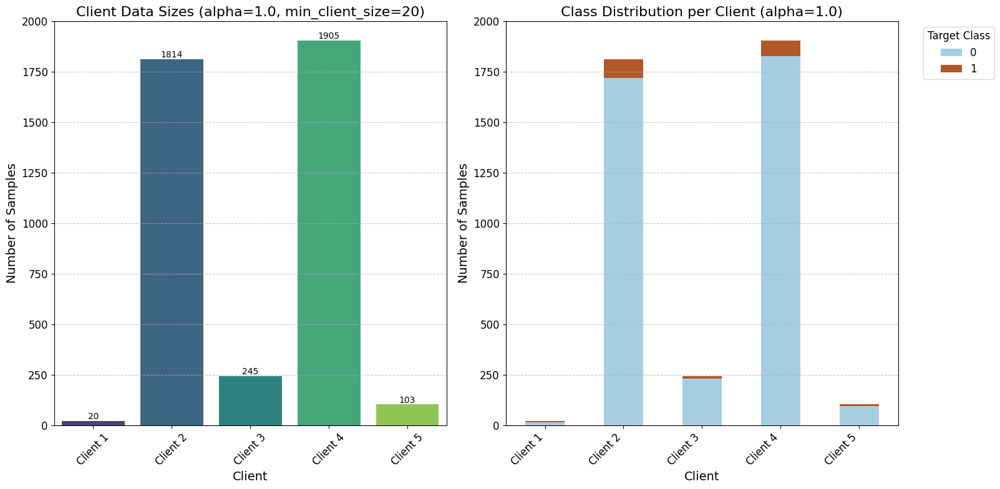

  Class weights applied: [ 0.52559156 10.26884422]
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Using Focal Loss (alpha=0.25, gamma=2, pos_weight=10.27)
  Usi

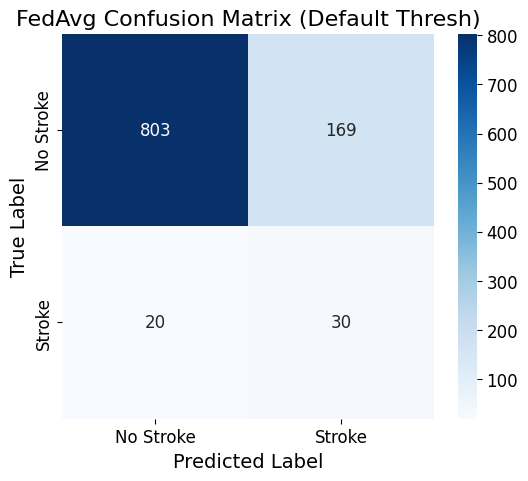

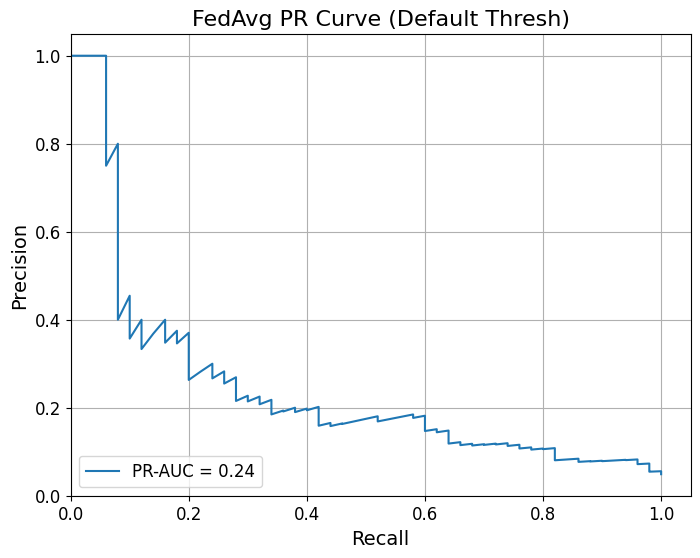


  Evaluating FedAvg model with OPTIMIZED threshold (0.53):
    Accuracy: 0.8532
    Balanced Accuracy: 0.7236
    Precision: 0.1835
    Recall: 0.5800
    F1: 0.2788
    F2: 0.4050
    Macro F1: 0.5986
    ROC-AUC: 0.7994
    PR-AUC: 0.2475
    MCC: 0.2669
    Sensitivity: 0.5800
    Specificity: 0.8673
    Confusion Matrix Counts: TP=29, TN=843, FP=129, FN=21


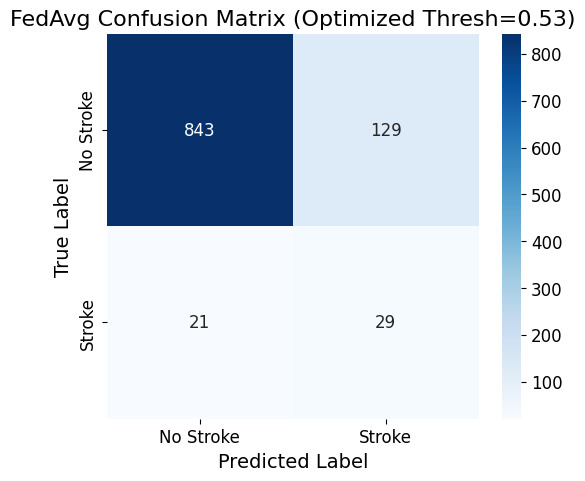

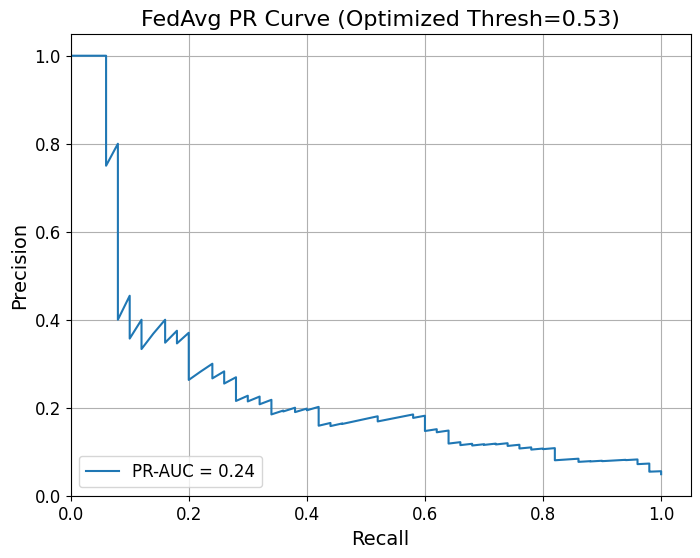

  [MASTER] Captured ablation results for stroke

--- Consolidating All Results ---
[MASTER] ERROR: full_summary is empty. Skipping plot/report generation.

                                     MASTER BENCHMARK COMPLETE                                      

--- VALIDATION COMPLETE ---
1. Imbalance: Reports saved in results/*/csvs/dataset_imbalance_report.csv
2. Overfitting: Convergence plots generated in results/final_plots
3. CV Integrity: Logs verified and saved as cv_integrity_report_*.txt
4. Metrics: Balanced Accuracy and MCC included in final CSVs


In [29]:
# Section 19.1: Master Benchmark Execution with Scientific Validation
# This section orchestrates the full multi-seed, cross-validation benchmark.

print("\n--- SCIENTIFIC VALIDATION STARTING ---")

# Ensure TARGET_DATASETS is defined, as it might not be in the global scope if previous cells failed or were not run in expected order.
# Default to 'stroke' if not found, based on previous execution context.
if 'TARGET_DATASETS' not in globals():
    TARGET_DATASETS = ["stroke"]
    print("Warning: TARGET_DATASETS was not defined in global scope. Defaulting to ['stroke'].")

# Configure and run the master benchmark
# The run_master_benchmark function internally calls validation utilities:
# - get_dataset_imbalance_report for Part 2
# - verify_cv_integrity for Part 4
# - Centralized training overfitting checks for Part 3

run_master_benchmark(
    dataset_keys=TARGET_DATASETS,
    random_seeds=RANDOM_SEEDS,
    fl_rounds=FL_ROUNDS,
    local_epochs=LOCAL_EPOCHS,
    learning_rate=LEARNING_RATE_DEFAULT,
    weight_decay=WEIGHT_DECAY_DEFAULT,
    batch_size=BATCH_SIZE_DEFAULT,
    lr_scheduler_active=True,
    max_grad_norm=MAX_GRAD_NORM_DEFAULT,
    alpha_values=ALPHA_VALUES,
    fedprox_mu_values=FEDPROX_MU_VALUES,
    ablation_local_epochs=ABLATION_LOCAL_EPOCHS,
    min_negative=5,
    max_attempts_partition=MAX_ATTEMPTS_PARTITION,
    cv_n_splits=DEBUG_CV_N_SPLITS,
    cv_n_repeats=DEBUG_CV_N_REPEATS,
    use_focal_loss_for_stroke_fl=True,
    # Stroke-specific overrides as per Task 1
    num_clients_stroke=3,
    alpha_values_stroke=[2.0],
    min_client_size_stroke=150,
    min_positive_stroke=10
)

print("\n--- VALIDATION COMPLETE ---")
print("1. Imbalance: Reports saved in results/*/csvs/dataset_imbalance_report.csv")
print("2. Overfitting: Convergence plots generated in results/final_plots")
print("3. CV Integrity: Logs verified and saved as cv_integrity_report_*.txt")
print("4. Metrics: Balanced Accuracy and MCC included in final CSVs")



--- FINAL SCIENTIFIC AUDIT (FULL DATASET RUN) ---

                              STARTING MASTER BENCHMARK ORCHESTRATION                               

################################################################################
PROCESSING DATASET:                                    HEART                                    
################################################################################

Starting multi-seed CV benchmark for: Heart

--- Loading and Preprocessing Dataset: Heart ---
Dataset 'heart' loaded and preprocessed: X.shape=(303, 13), input_dim=13

--- Imbalance Report for Heart ---
  Dataset: heart
  Total Samples: 303
  Positive Samples (Target=1): 139
  Negative Samples (Target=0): 164
  Positive Percentage: 45.87%
  Negative Percentage: 54.13%
  Imbalance Ratio (Neg:Pos): 1.18
  Target Mean: 0.4587
---------------------------------------

***** [MULTI-SEED] Running Seed 1/1: 42 *****

Starting Cross-Validation for Heart, Seed 42
Random seeds set for repro

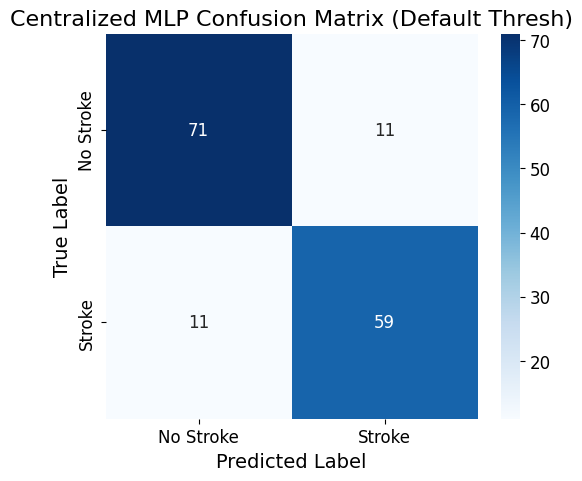

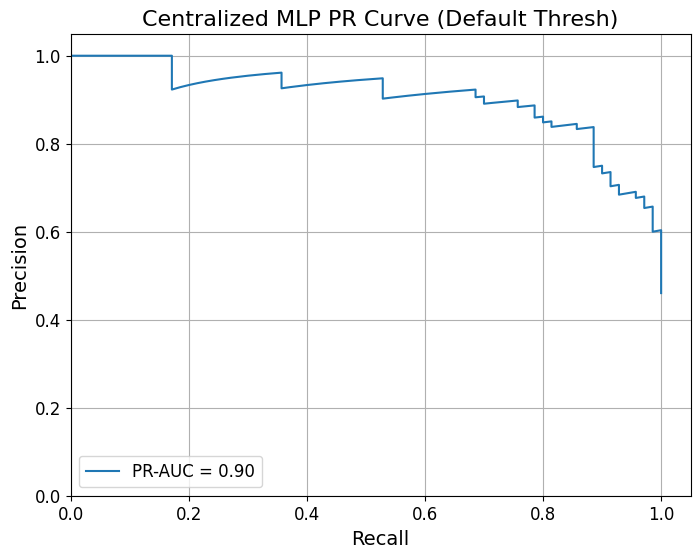

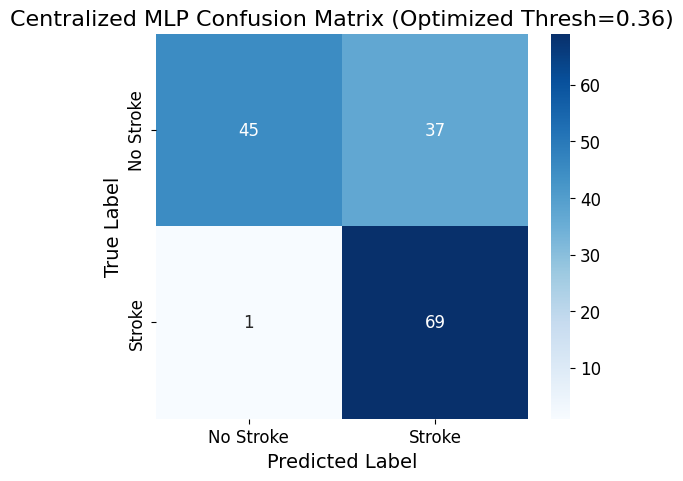

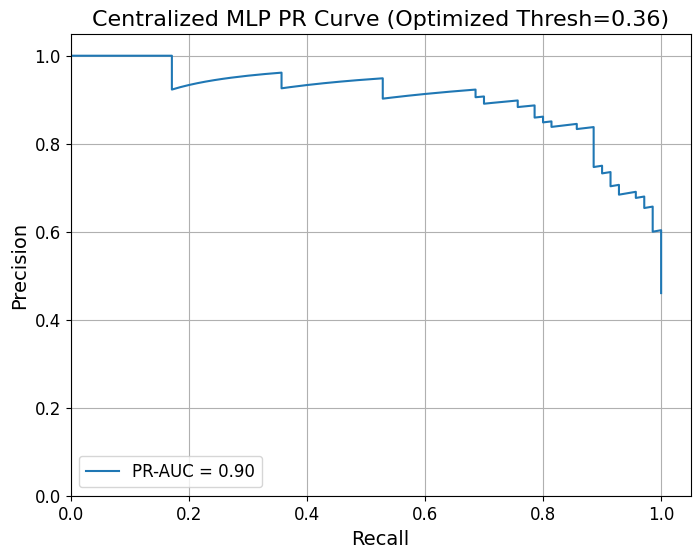


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 2
    Validating partition after 1 rebalance rounds:
      Client 1: Size=38, Pos=13, Neg=25, Pos %=34.21%, Imbalance Ratio=1.92
      Client 2: Size=24, Pos=9, Neg=15, Pos %=37.50%, Imbalance Ratio=1.67
      Client 3: Size=22, Pos=13, Neg=9, Pos %=59.09%, Imbalance Ratio=0.69
      Client 4: Size=28, Pos=11, Neg=17, Pos %=39.29%, Imbalance Ratio=1.55
      Client 5: Size=39, Pos=23, Neg=16, Pos %=58.97%, Imbalance Ratio=0.70
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['34.21%', '37.5

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


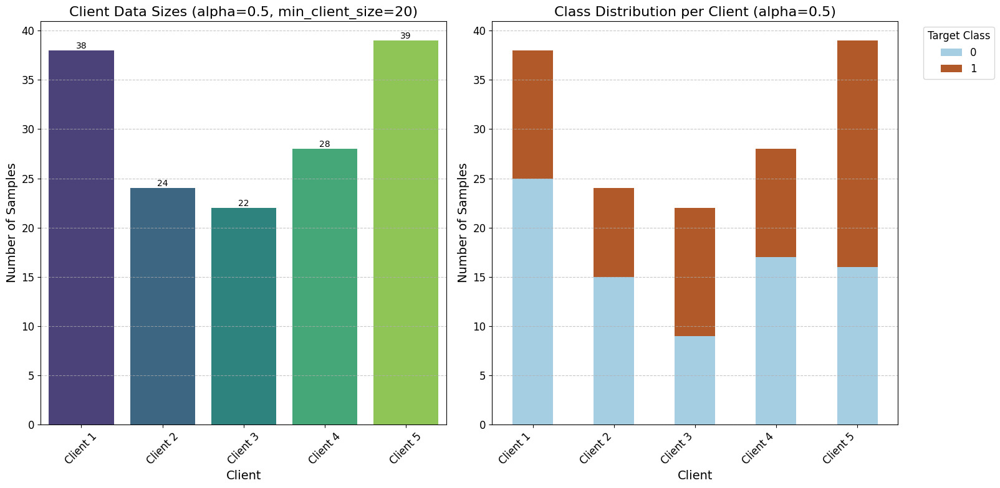

  Class weights applied: [0.92073171 1.0942029 ]
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCE

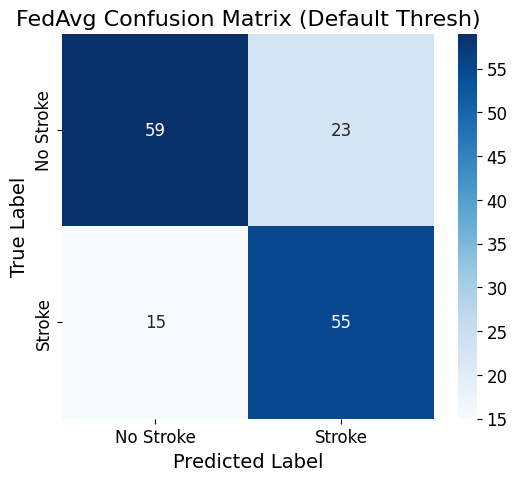

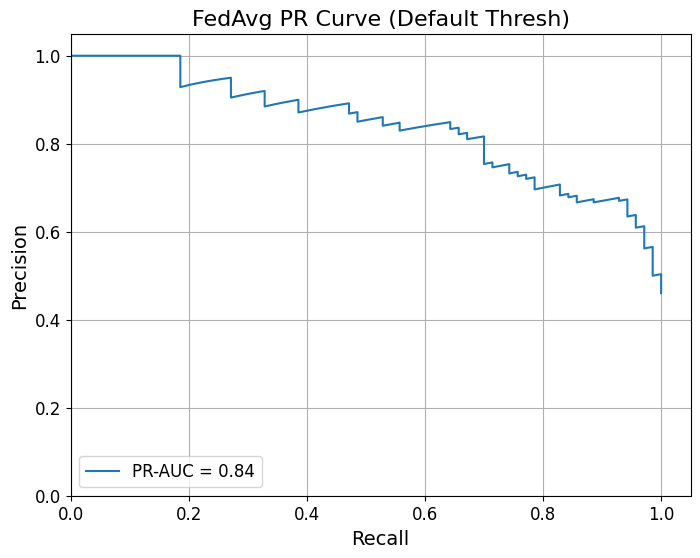


  Evaluating FedAvg model with OPTIMIZED threshold (0.49):
    Accuracy: 0.7434
    Balanced Accuracy: 0.7538
    Precision: 0.6667
    Recall: 0.8857
    F1: 0.7607
    F2: 0.8311
    Macro F1: 0.7421
    ROC-AUC: 0.8605
    PR-AUC: 0.8422
    MCC: 0.5192
    Sensitivity: 0.8857
    Specificity: 0.6220
    Confusion Matrix Counts: TP=62, TN=51, FP=31, FN=8


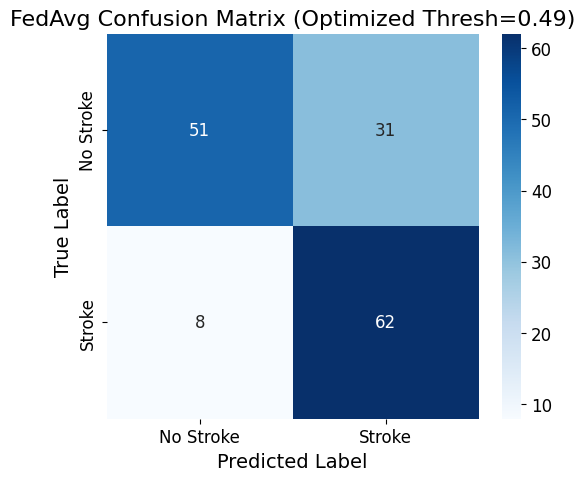

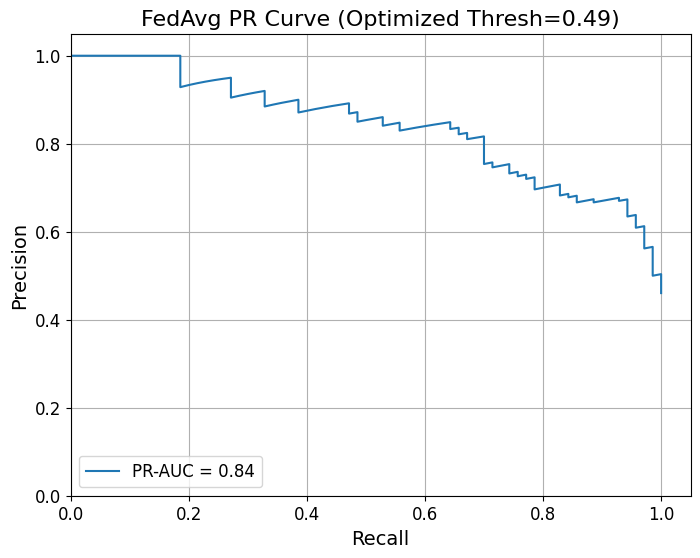


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 2
    Validating partition after 1 rebalance rounds:
      Client 1: Size=38, Pos=13, Neg=25, Pos %=34.21%, Imbalance Ratio=1.92
      Client 2: Size=24, Pos=9, Neg=15, Pos %=37.50%, Imbalance Ratio=1.67
      Client 3: Size=22, Pos=13, Neg=9, Pos %=59.09%, Imbalance Ratio=0.69
      Client 4: Size=28, Pos=11, Neg=17, Pos %=39.29%, Imbalance Ratio=1.55
      Client 5: Size=39, Pos=23, Neg=16, Pos %=58.97%, Imbalance Ratio=0.70
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['34.21%', '37

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


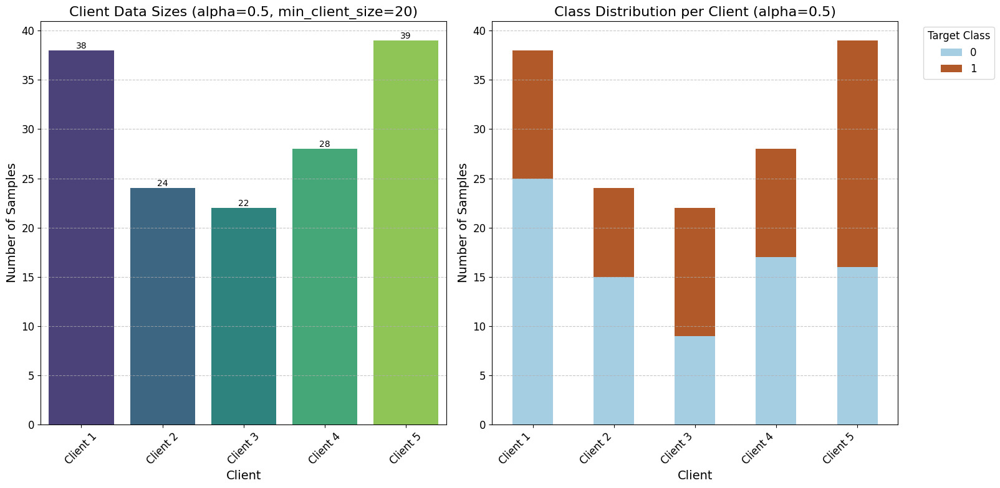

  Class weights applied: [0.92073171 1.0942029 ]
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCE

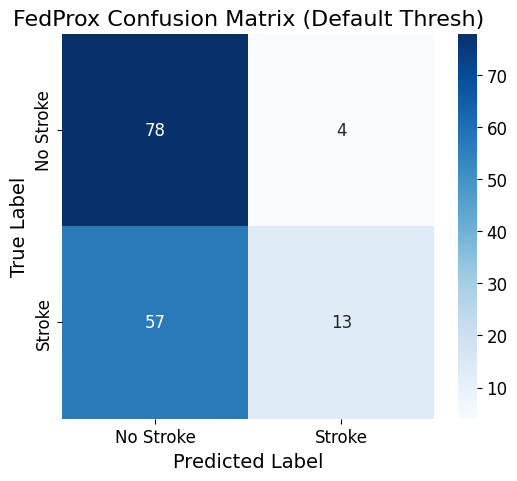

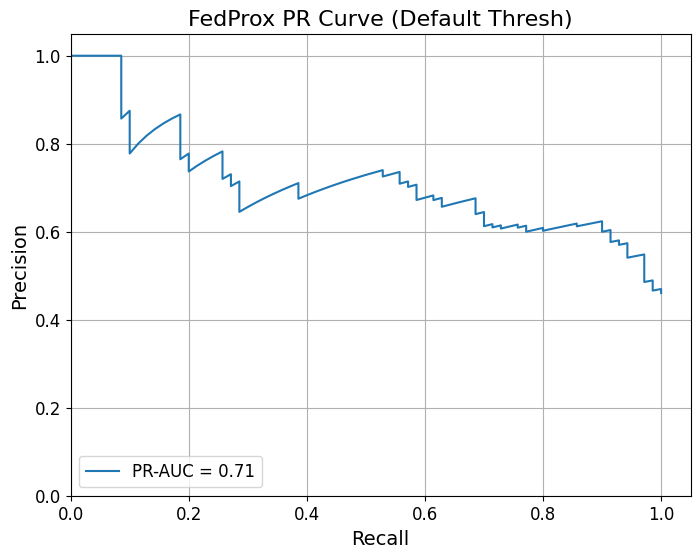


  Evaluating FedProx model with OPTIMIZED threshold (0.46):
    Accuracy: 0.6908
    Balanced Accuracy: 0.7030
    Precision: 0.6186
    Recall: 0.8571
    F1: 0.7186
    F2: 0.7958
    Macro F1: 0.6877
    ROC-AUC: 0.7564
    PR-AUC: 0.7109
    MCC: 0.4210
    Sensitivity: 0.8571
    Specificity: 0.5488
    Confusion Matrix Counts: TP=60, TN=45, FP=37, FN=10


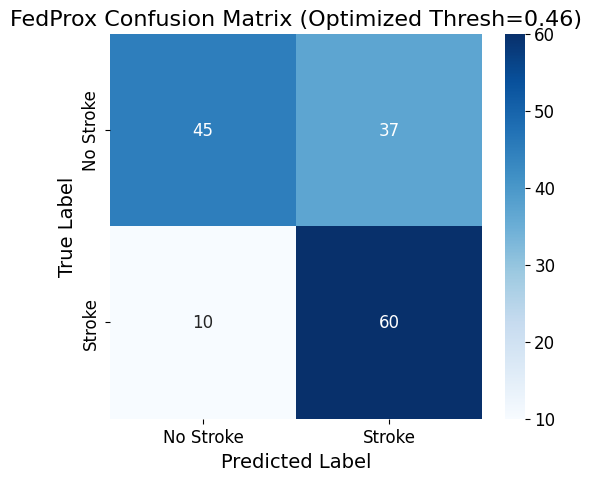

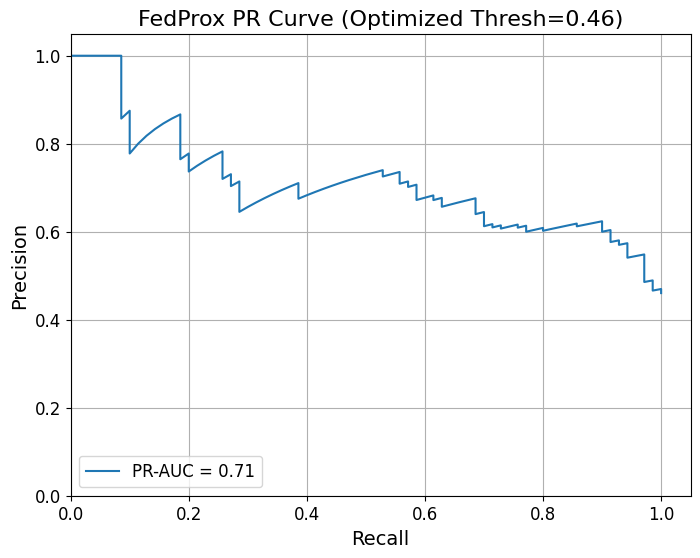


--- Running benchmark for Heart, Seed 42, Repetition 1, Fold 2 ---
Random seeds set for reproducibility (Seed: 42).
  Effective parameters for heart: Num Clients=5, Alpha Values=[0.5], Min Client Size=20, Min Positive=5

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [0.92682927 1.08571429]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=1.09
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.6471 (Mode=f1), F1=0.6471, F2=0.8209, Recall=1.0000, Balanced Acc=0.5000
      Threshold 0.06: Opt_Metric=0.6471 (Mode=f1), F1=0.6471, F2=0.8209, Recall=1.0000, Balanced Acc=0.5000
      Threshold 0.07: Opt_Metric=0.6471 (Mode=f1), F1=0.6471, F2=0.8209, Recall=1.0000, Balanced Acc=0.5000
      Threshold 0.08: Opt_Metric=0.6471 (Mode=f1), F1=0.6471, F2=0.8209, Recall=1.0000, Balanced Acc=0.5000
      Threshold

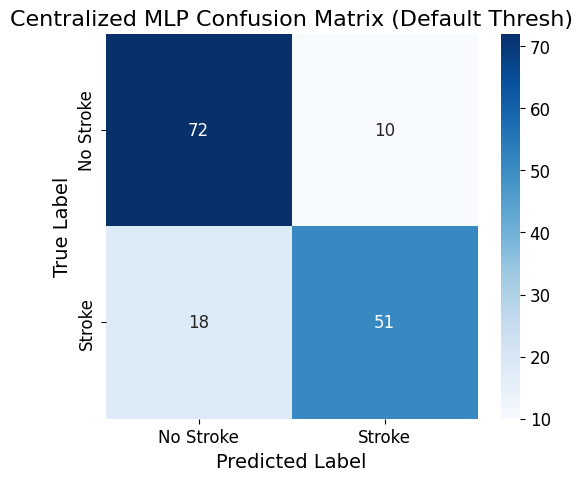

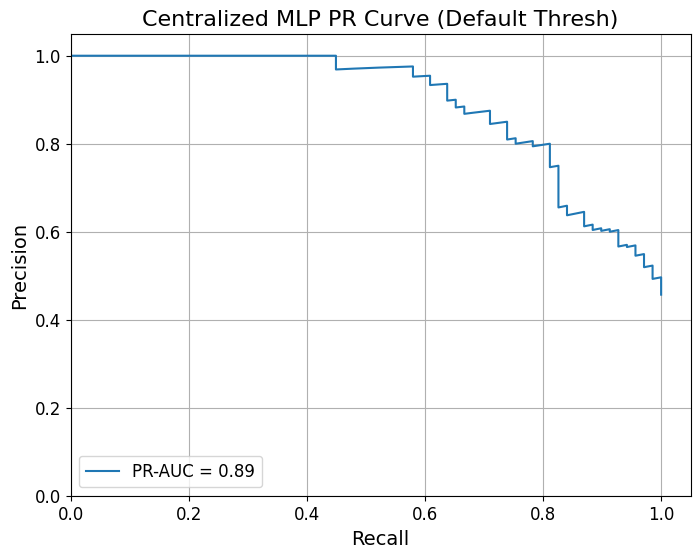

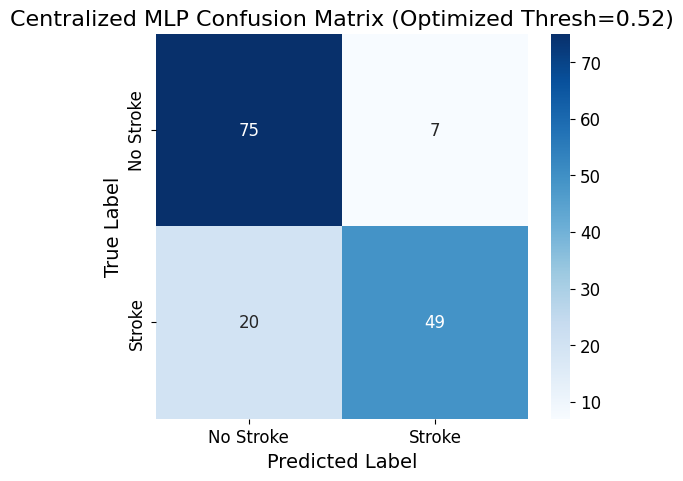

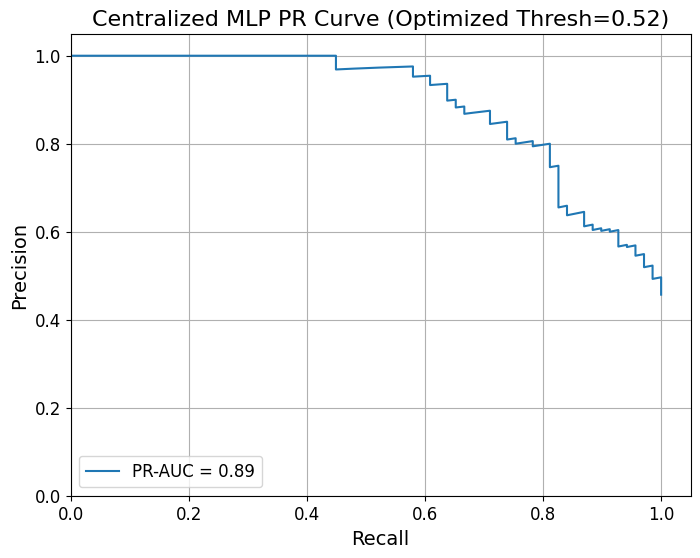


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 2
    Validating partition after 1 rebalance rounds:
      Client 1: Size=38, Pos=13, Neg=25, Pos %=34.21%, Imbalance Ratio=1.92
      Client 2: Size=24, Pos=9, Neg=15, Pos %=37.50%, Imbalance Ratio=1.67
      Client 3: Size=22, Pos=13, Neg=9, Pos %=59.09%, Imbalance Ratio=0.69
      Client 4: Size=28, Pos=12, Neg=16, Pos %=42.86%, Imbalance Ratio=1.33
      Client 5: Size=40, Pos=23, Neg=17, Pos %=57.50%, Imbalance Ratio=0.74
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['34.21%', '37.5

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


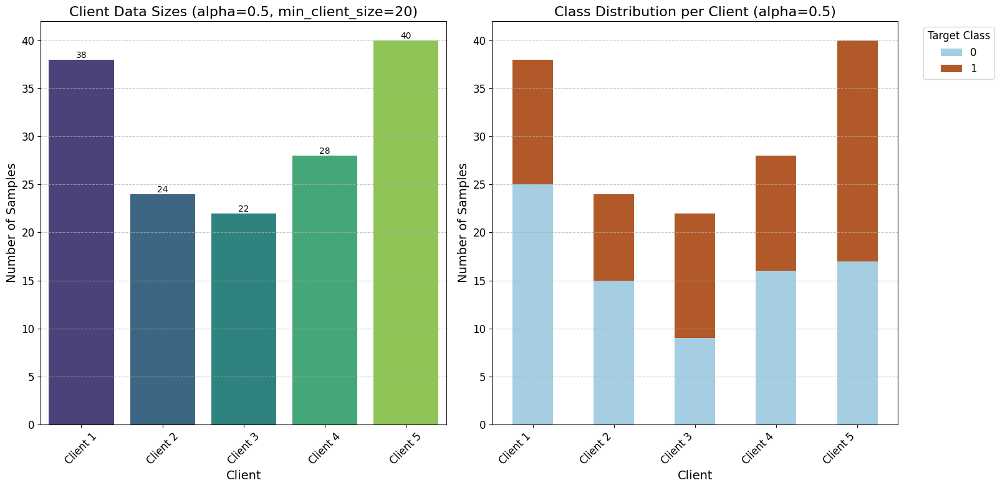

  Class weights applied: [0.92682927 1.08571429]
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCE

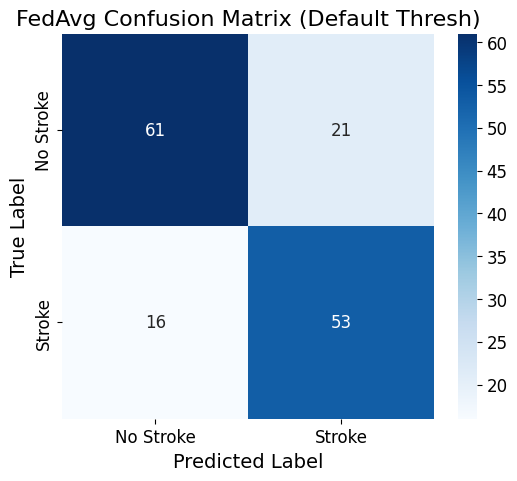

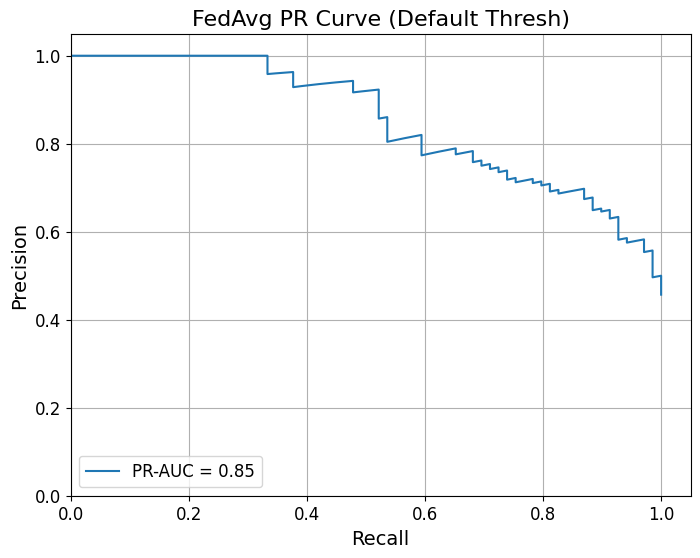


  Evaluating FedAvg model with OPTIMIZED threshold (0.49):
    Accuracy: 0.7351
    Balanced Accuracy: 0.7469
    Precision: 0.6559
    Recall: 0.8841
    F1: 0.7531
    F2: 0.8266
    Macro F1: 0.7337
    ROC-AUC: 0.8558
    PR-AUC: 0.8522
    MCC: 0.5058
    Sensitivity: 0.8841
    Specificity: 0.6098
    Confusion Matrix Counts: TP=61, TN=50, FP=32, FN=8


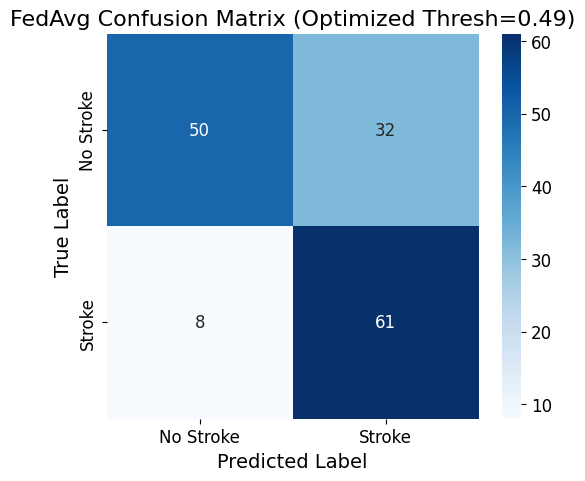

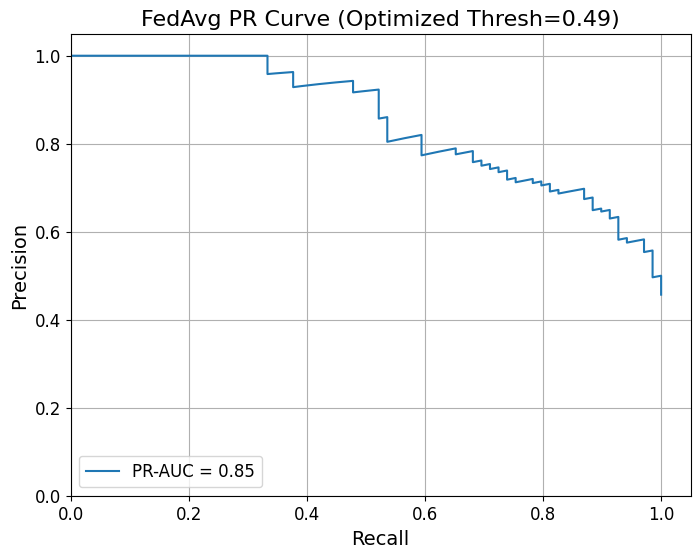


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 2
    Validating partition after 1 rebalance rounds:
      Client 1: Size=38, Pos=13, Neg=25, Pos %=34.21%, Imbalance Ratio=1.92
      Client 2: Size=24, Pos=9, Neg=15, Pos %=37.50%, Imbalance Ratio=1.67
      Client 3: Size=22, Pos=13, Neg=9, Pos %=59.09%, Imbalance Ratio=0.69
      Client 4: Size=28, Pos=12, Neg=16, Pos %=42.86%, Imbalance Ratio=1.33
      Client 5: Size=40, Pos=23, Neg=17, Pos %=57.50%, Imbalance Ratio=0.74
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['34.21%', '37

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


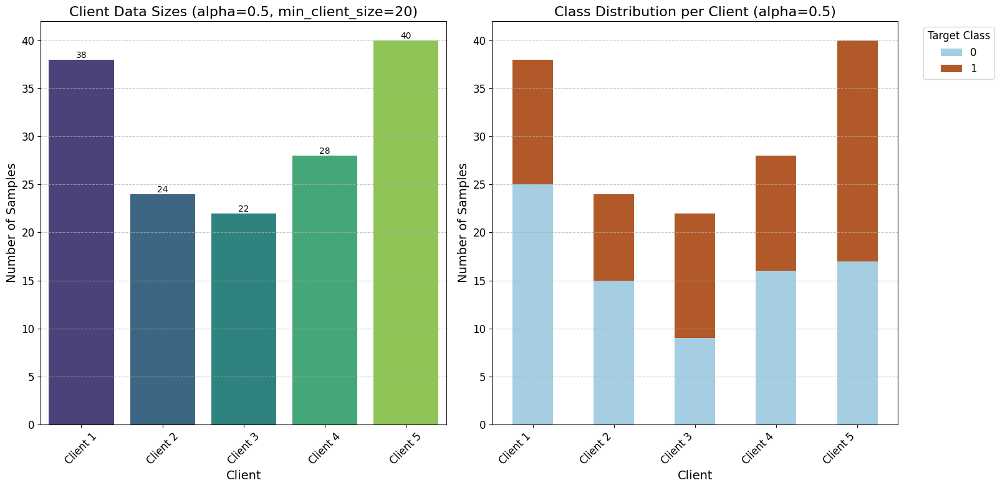

  Class weights applied: [0.92682927 1.08571429]
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCE

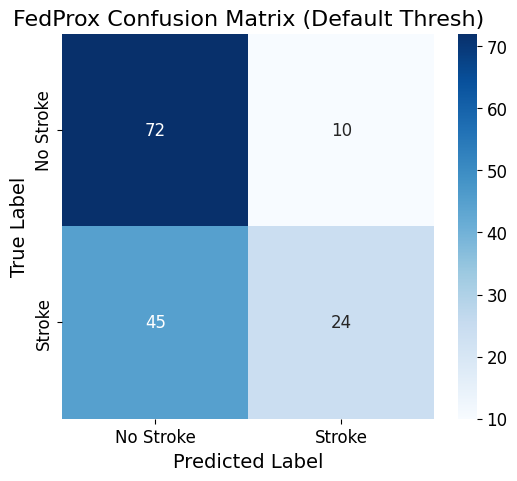

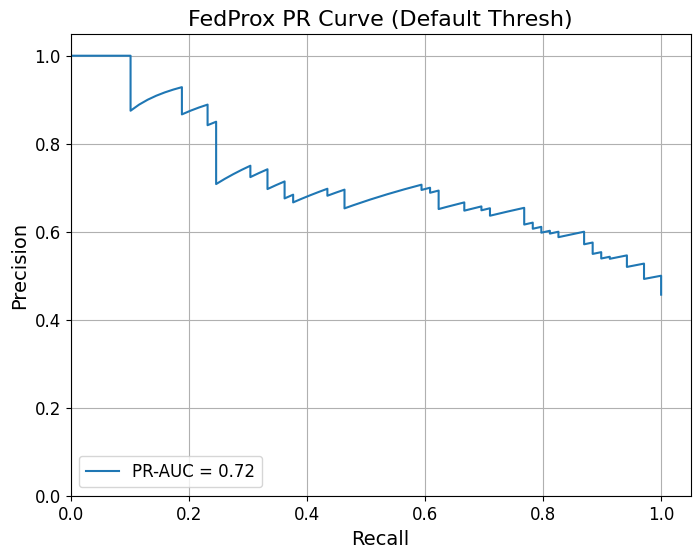


  Evaluating FedProx model with OPTIMIZED threshold (0.46):
    Accuracy: 0.6623
    Balanced Accuracy: 0.6764
    Precision: 0.5918
    Recall: 0.8406
    F1: 0.6946
    F2: 0.7754
    Macro F1: 0.6584
    ROC-AUC: 0.7534
    PR-AUC: 0.7208
    MCC: 0.3682
    Sensitivity: 0.8406
    Specificity: 0.5122
    Confusion Matrix Counts: TP=58, TN=42, FP=40, FN=11


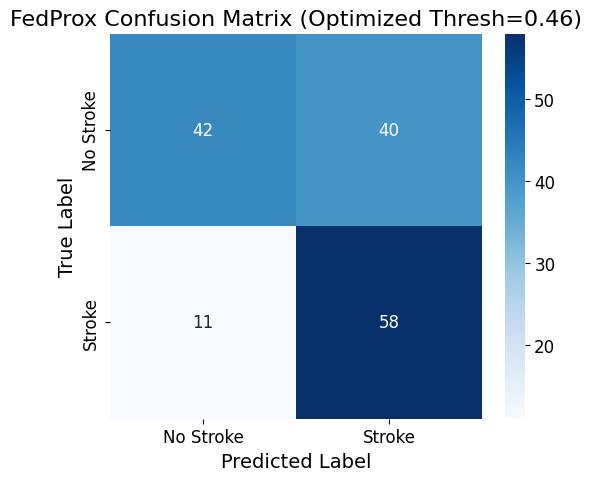

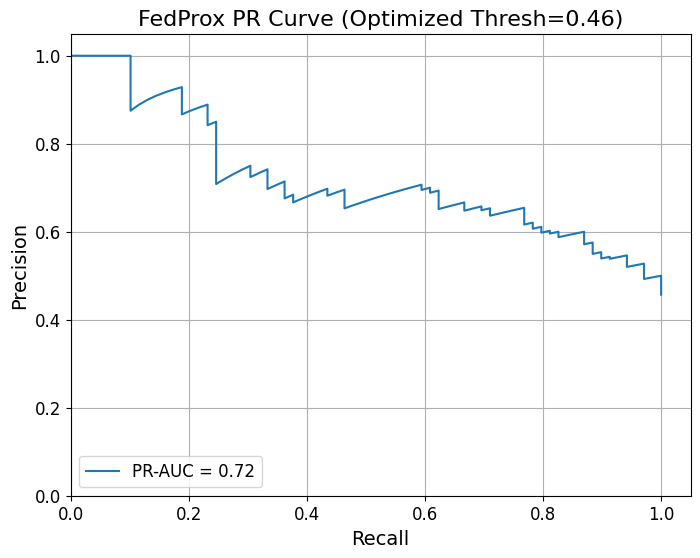

  [MULTI-SEED] Seed 42 success: 12 result rows found.
[MULTI-SEED] Successfully aggregated 0 metric rows for heart.
  [MASTER] WARNING: No CV results captured for heart

--- Starting Local Epoch Ablation for heart (FedAvg) ---

--- Loading and Preprocessing Dataset: Heart ---
Dataset 'heart' loaded and preprocessed: X.shape=(303, 13), input_dim=13

Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=32, Pos=15, Neg=17, Pos %=46.88%, Imbalance Ratio=1.13
      Client 2: Size=32, Pos=19, Neg=13, Pos %=59.38%, Imbalance Ratio=0.68
      Client 3: Size=67, Pos=24, Neg=43, Pos %=35.82%, Imbalance Ratio=1.79
      Client 4: Size=45, Pos=25, Neg=20, Pos %=55.56%, Imbalance Ratio=0.80
      Client 5: Size=66, Pos=28, Neg=38, P

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


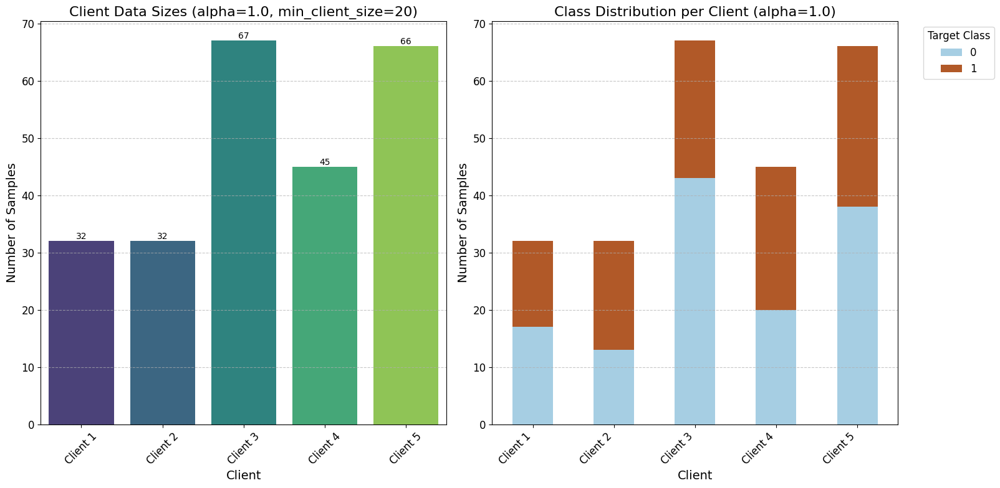

  Class weights applied: [0.92366412 1.09009009]
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCE

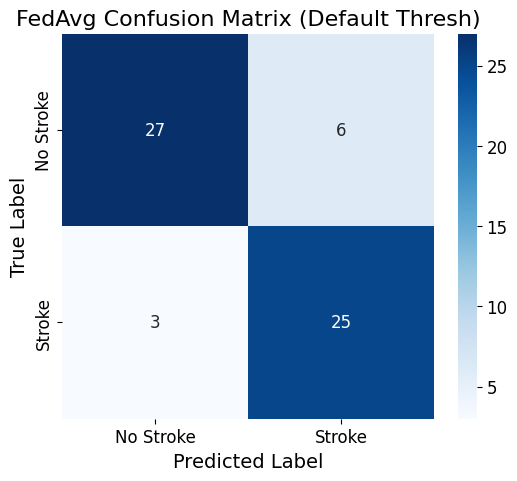

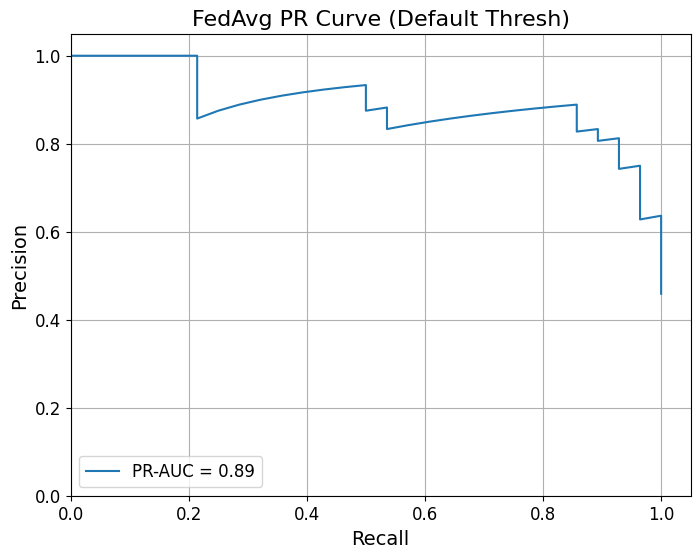


  Evaluating FedAvg model with OPTIMIZED threshold (0.51):
    Accuracy: 0.8852
    Balanced Accuracy: 0.8831
    Precision: 0.8889
    Recall: 0.8571
    F1: 0.8727
    F2: 0.8633
    Macro F1: 0.8841
    ROC-AUC: 0.9210
    PR-AUC: 0.8929
    MCC: 0.7687
    Sensitivity: 0.8571
    Specificity: 0.9091
    Confusion Matrix Counts: TP=24, TN=30, FP=3, FN=4


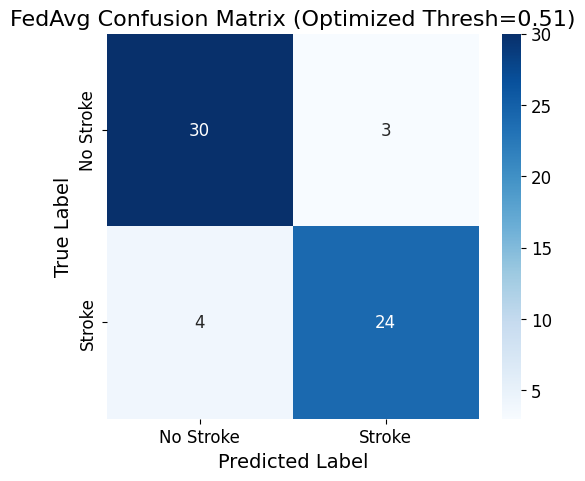

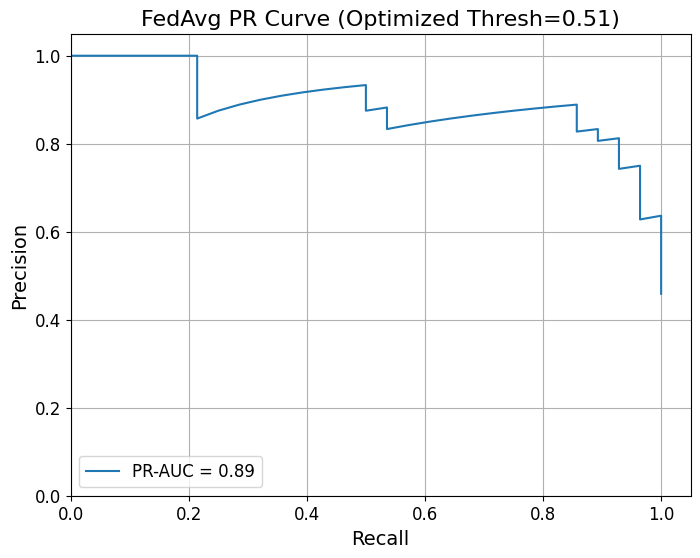


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=32, Pos=15, Neg=17, Pos %=46.88%, Imbalance Ratio=1.13
      Client 2: Size=32, Pos=19, Neg=13, Pos %=59.38%, Imbalance Ratio=0.68
      Client 3: Size=67, Pos=24, Neg=43, Pos %=35.82%, Imbalance Ratio=1.79
      Client 4: Size=45, Pos=25, Neg=20, Pos %=55.56%, Imbalance Ratio=0.80
      Client 5: Size=66, Pos=28, Neg=38, Pos %=42.42%, Imbalance Ratio=1.36
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['46.88%', '59.38%', '35.82%', '55.56%', '42.42%']
  Client Imbalance Ratios: ['1.13', 

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


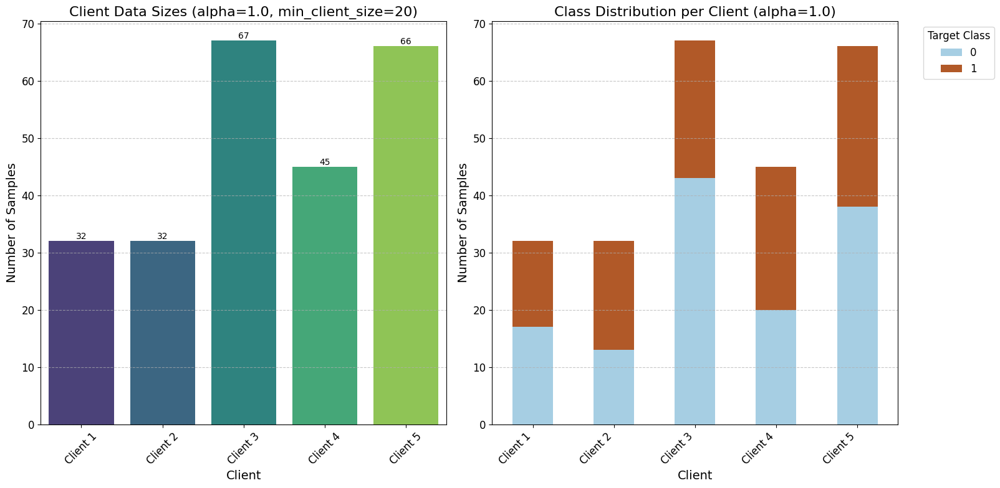

  Class weights applied: [0.92366412 1.09009009]
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCE

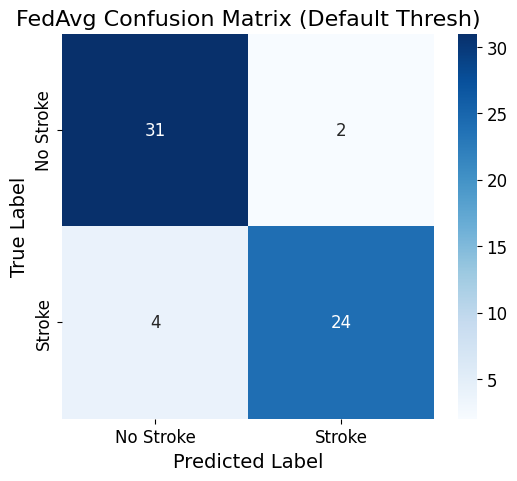

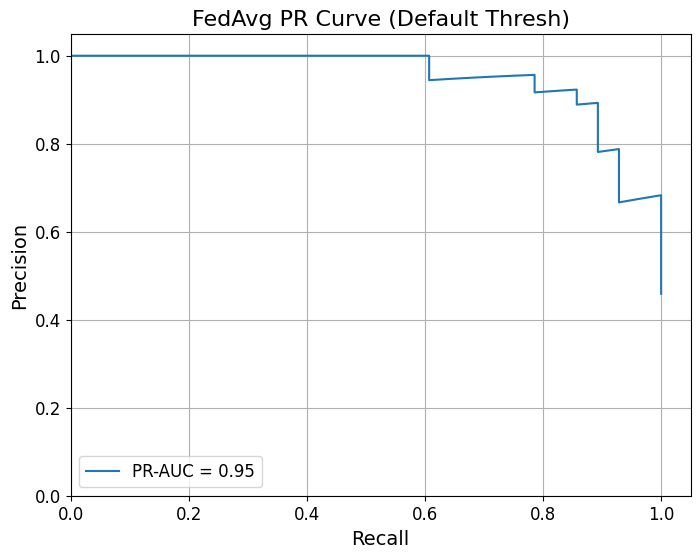


  Evaluating FedAvg model with OPTIMIZED threshold (0.50):
    Accuracy: 0.9016
    Balanced Accuracy: 0.8983
    Precision: 0.9231
    Recall: 0.8571
    F1: 0.8889
    F2: 0.8696
    Macro F1: 0.9003
    ROC-AUC: 0.9513
    PR-AUC: 0.9515
    MCC: 0.8026
    Sensitivity: 0.8571
    Specificity: 0.9394
    Confusion Matrix Counts: TP=24, TN=31, FP=2, FN=4


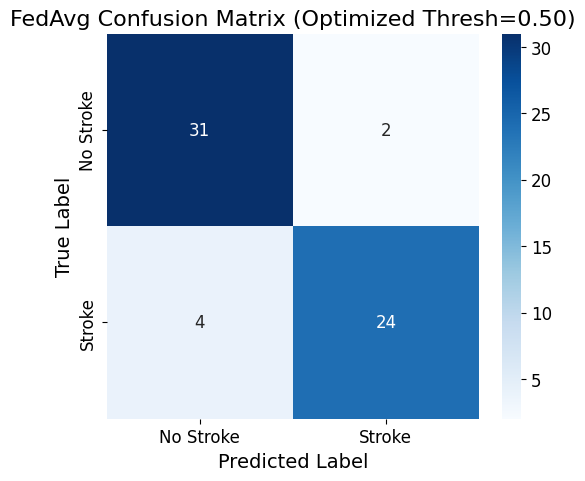

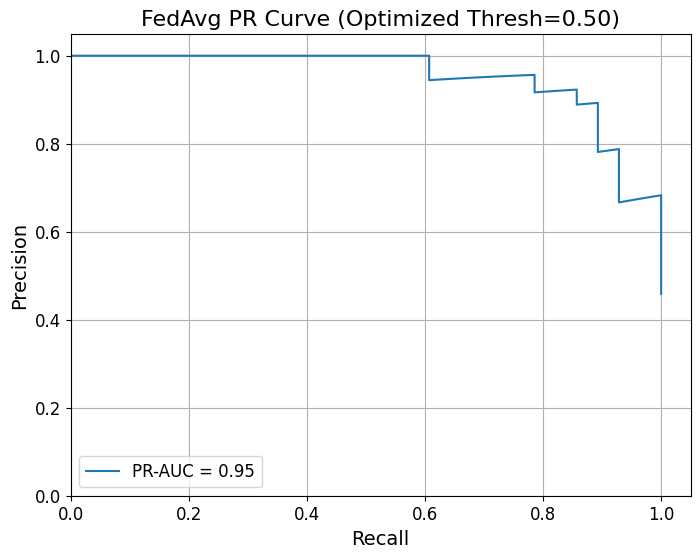


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=32, Pos=15, Neg=17, Pos %=46.88%, Imbalance Ratio=1.13
      Client 2: Size=32, Pos=19, Neg=13, Pos %=59.38%, Imbalance Ratio=0.68
      Client 3: Size=67, Pos=24, Neg=43, Pos %=35.82%, Imbalance Ratio=1.79
      Client 4: Size=45, Pos=25, Neg=20, Pos %=55.56%, Imbalance Ratio=0.80
      Client 5: Size=66, Pos=28, Neg=38, Pos %=42.42%, Imbalance Ratio=1.36
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['46.88%', '59.38%', '35.82%', '55.56%', '42.42%']
  Client Imbalance Ratios: ['1.13', 

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


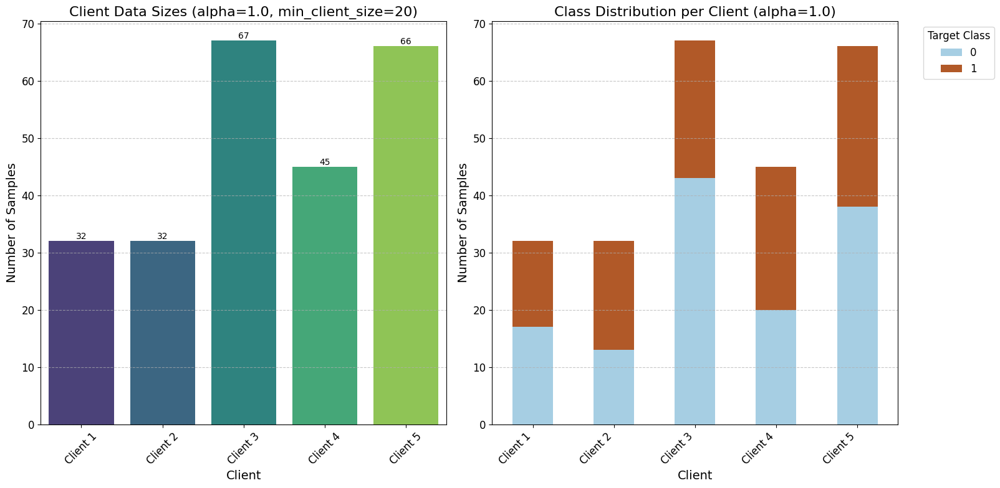

  Class weights applied: [0.92366412 1.09009009]
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCEWithLogitsLoss with pos_weight=1.09
  Using BCE

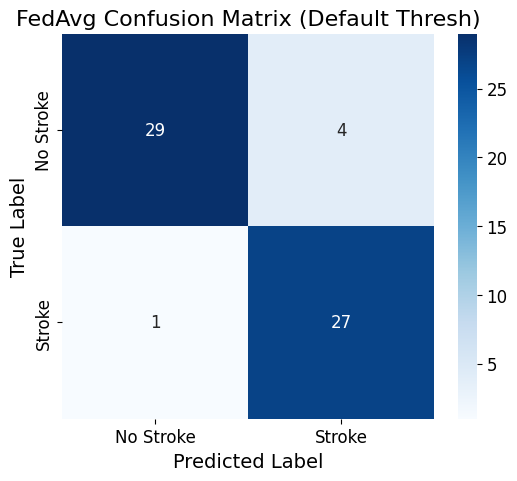

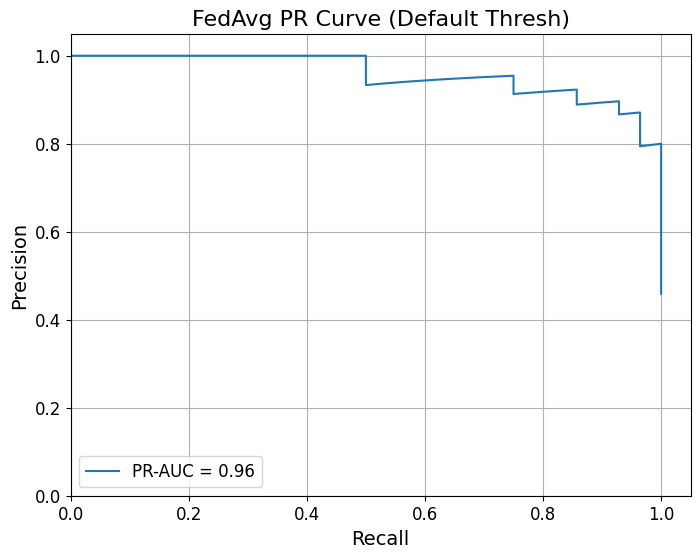


  Evaluating FedAvg model with OPTIMIZED threshold (0.50):
    Accuracy: 0.9180
    Balanced Accuracy: 0.9215
    Precision: 0.8710
    Recall: 0.9643
    F1: 0.9153
    F2: 0.9441
    Macro F1: 0.9179
    ROC-AUC: 0.9675
    PR-AUC: 0.9588
    MCC: 0.8403
    Sensitivity: 0.9643
    Specificity: 0.8788
    Confusion Matrix Counts: TP=27, TN=29, FP=4, FN=1


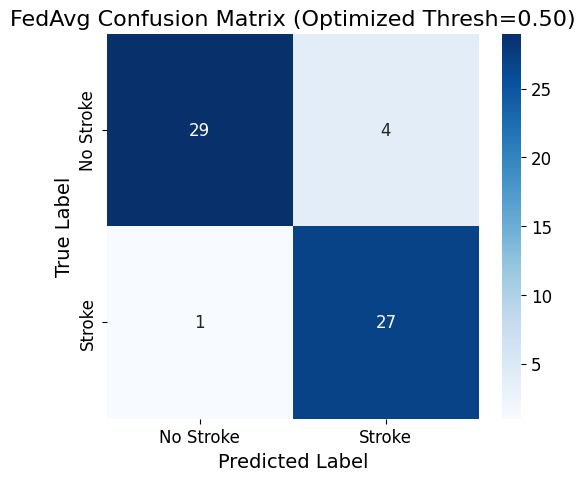

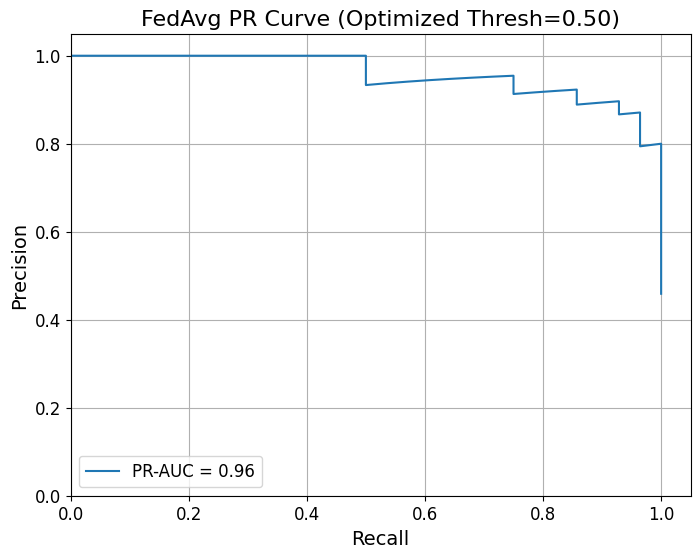

  [MASTER] Captured ablation results for heart

################################################################################
PROCESSING DATASET:                                     PIMA                                    
################################################################################

Starting multi-seed CV benchmark for: Pima

--- Loading and Preprocessing Dataset: Pima ---
Dataset 'pima' loaded and preprocessed: X.shape=(768, 8), input_dim=8

--- Imbalance Report for Pima ---
  Dataset: pima
  Total Samples: 768
  Positive Samples (Target=1): 268
  Negative Samples (Target=0): 500
  Positive Percentage: 34.90%
  Negative Percentage: 65.10%
  Imbalance Ratio (Neg:Pos): 1.87
  Target Mean: 0.3490
---------------------------------------

***** [MULTI-SEED] Running Seed 1/1: 42 *****

Starting Cross-Validation for Pima, Seed 42
Random seeds set for reproducibility (Seed: 42).

--- Running benchmark for Pima, Seed 42, Repetition 1, Fold 1 ---
Random seeds set for rep

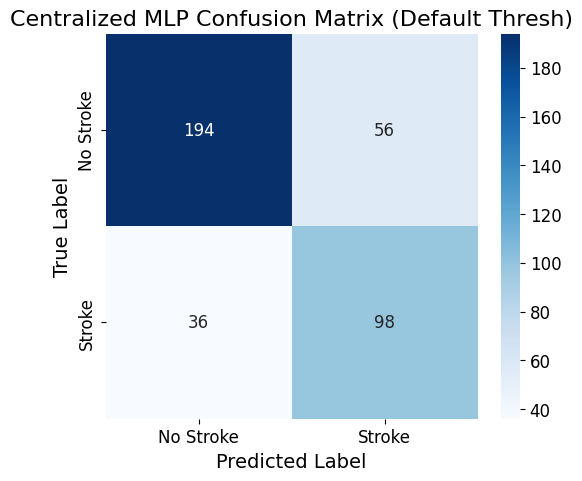

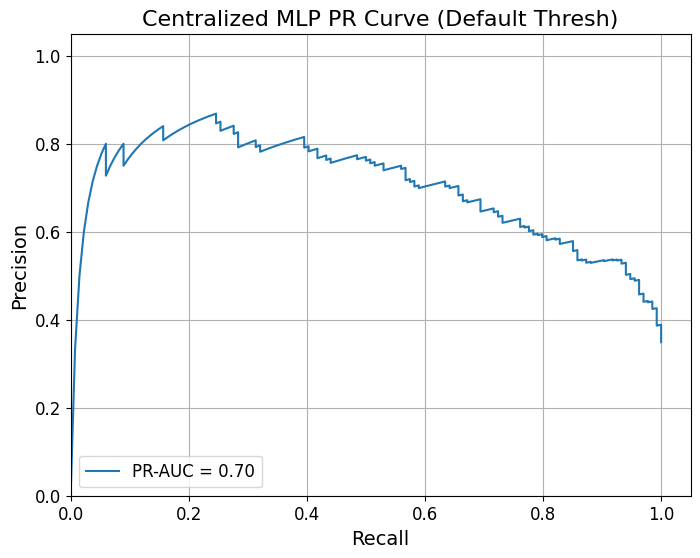

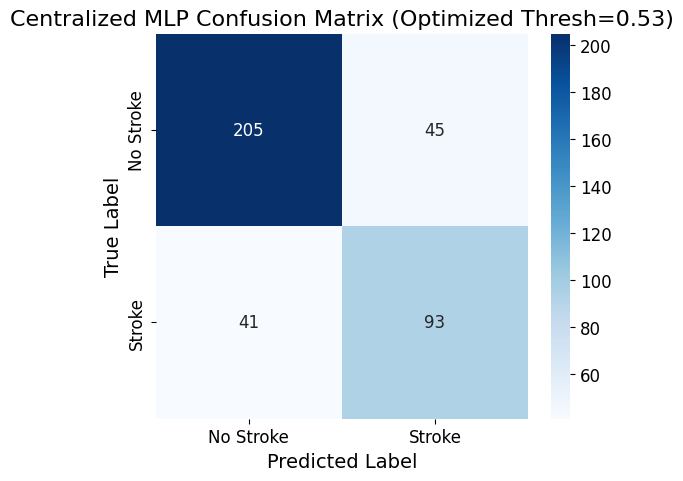

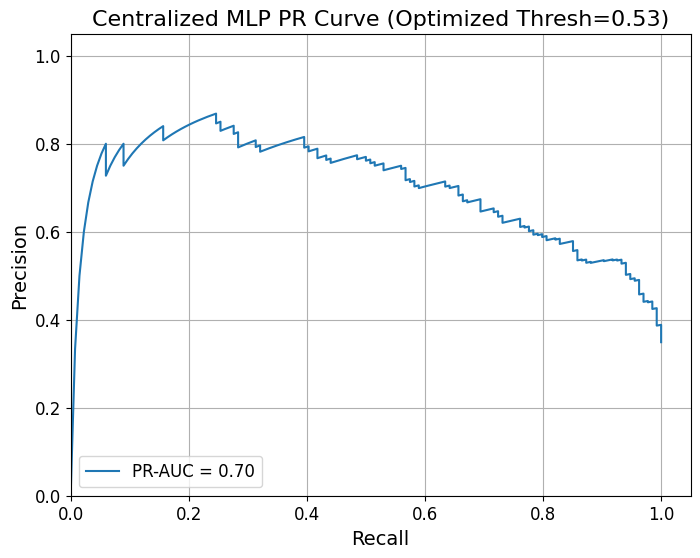


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 1 rebalance rounds:
      Client 1: Size=102, Pos=43, Neg=59, Pos %=42.16%, Imbalance Ratio=1.37
      Client 2: Size=149, Pos=45, Neg=104, Pos %=30.20%, Imbalance Ratio=2.31
      Client 3: Size=22, Pos=8, Neg=14, Pos %=36.36%, Imbalance Ratio=1.75
      Client 4: Size=70, Pos=22, Neg=48, Pos %=31.43%, Imbalance Ratio=2.18
      Client 5: Size=41, Pos=16, Neg=25, Pos %=39.02%, Imbalance Ratio=1.56
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['42.16%', '

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


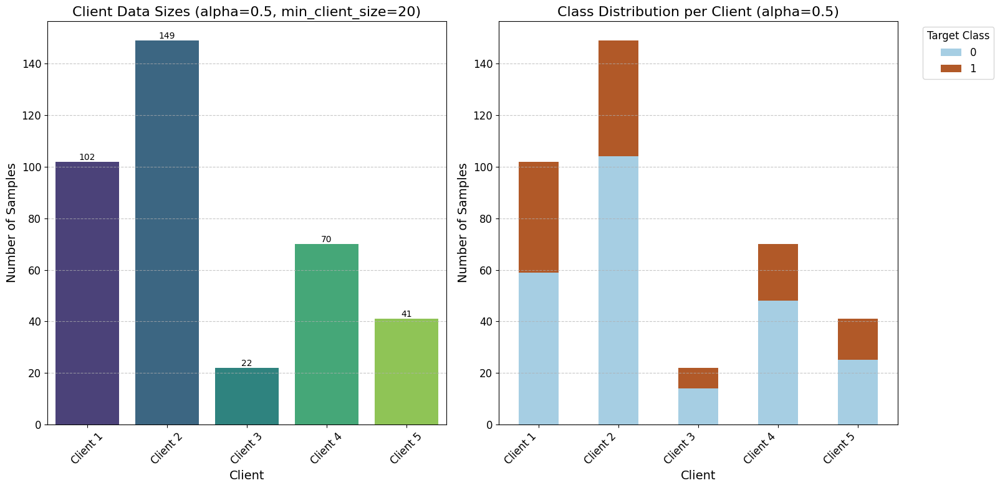

  Class weights applied: [0.768      1.43283582]
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCE

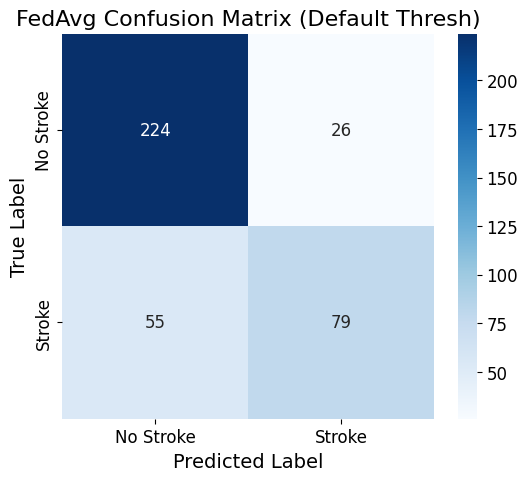

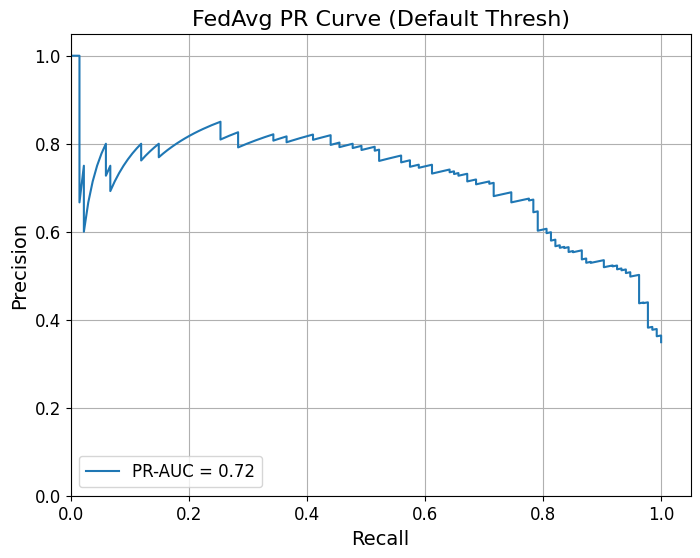


  Evaluating FedAvg model with OPTIMIZED threshold (0.47):
    Accuracy: 0.7891
    Balanced Accuracy: 0.7791
    Precision: 0.6803
    Recall: 0.7463
    F1: 0.7117
    F2: 0.7321
    Macro F1: 0.7727
    ROC-AUC: 0.8464
    PR-AUC: 0.7224
    MCC: 0.5474
    Sensitivity: 0.7463
    Specificity: 0.8120
    Confusion Matrix Counts: TP=100, TN=203, FP=47, FN=34


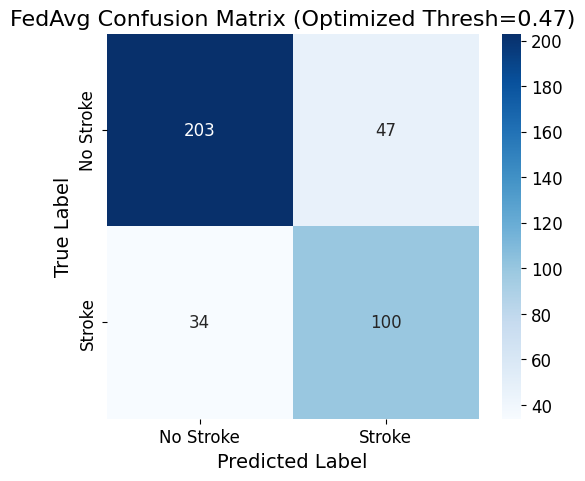

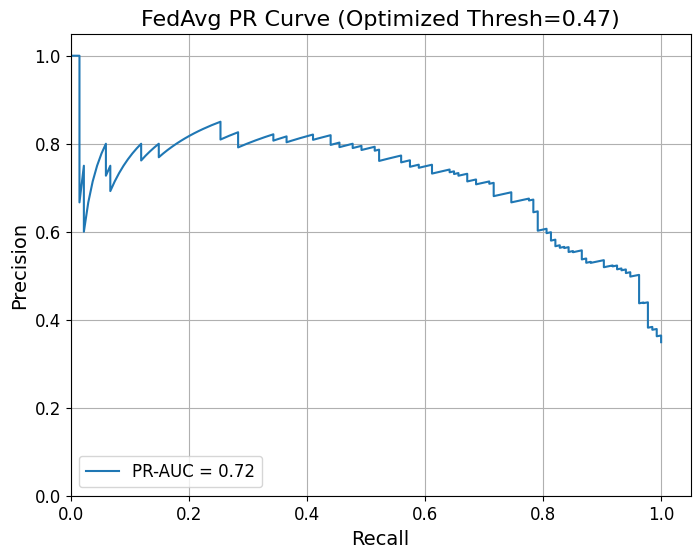


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 1 rebalance rounds:
      Client 1: Size=102, Pos=43, Neg=59, Pos %=42.16%, Imbalance Ratio=1.37
      Client 2: Size=149, Pos=45, Neg=104, Pos %=30.20%, Imbalance Ratio=2.31
      Client 3: Size=22, Pos=8, Neg=14, Pos %=36.36%, Imbalance Ratio=1.75
      Client 4: Size=70, Pos=22, Neg=48, Pos %=31.43%, Imbalance Ratio=2.18
      Client 5: Size=41, Pos=16, Neg=25, Pos %=39.02%, Imbalance Ratio=1.56
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['42.16%',

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


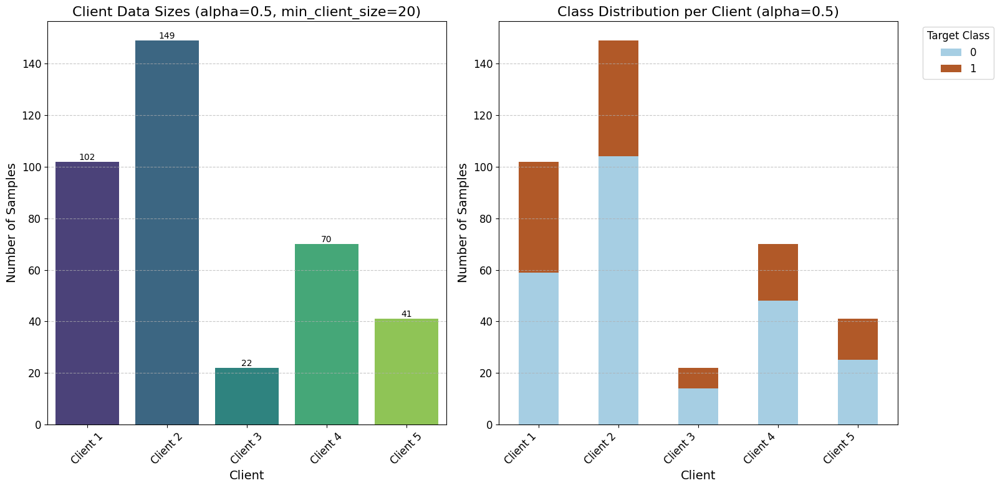

  Class weights applied: [0.768      1.43283582]
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCE

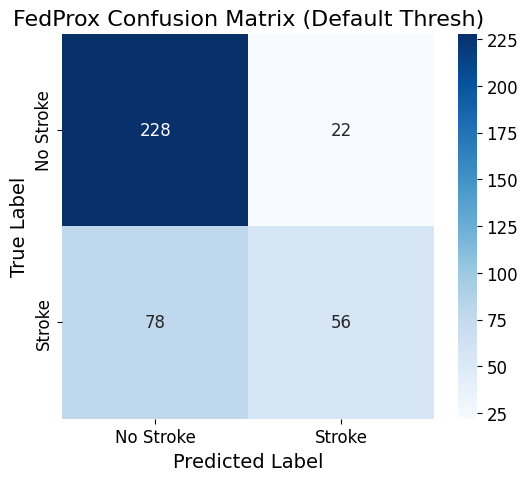

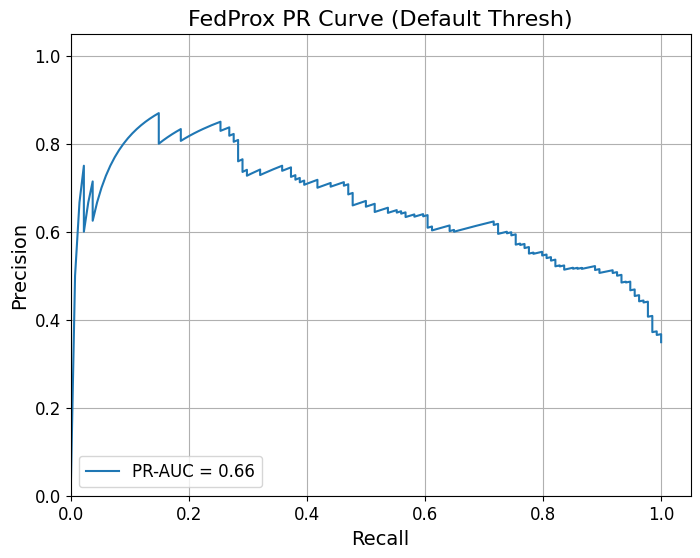


  Evaluating FedProx model with OPTIMIZED threshold (0.46):
    Accuracy: 0.7318
    Balanced Accuracy: 0.7299
    Precision: 0.5951
    Recall: 0.7239
    F1: 0.6532
    F2: 0.6938
    Macro F1: 0.7173
    ROC-AUC: 0.8062
    PR-AUC: 0.6635
    MCC: 0.4435
    Sensitivity: 0.7239
    Specificity: 0.7360
    Confusion Matrix Counts: TP=97, TN=184, FP=66, FN=37


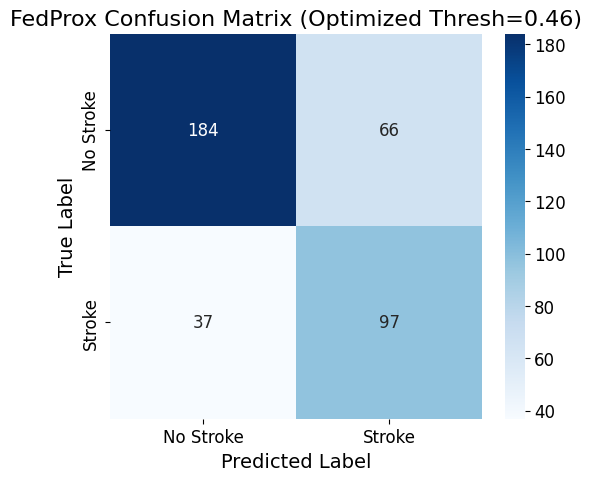

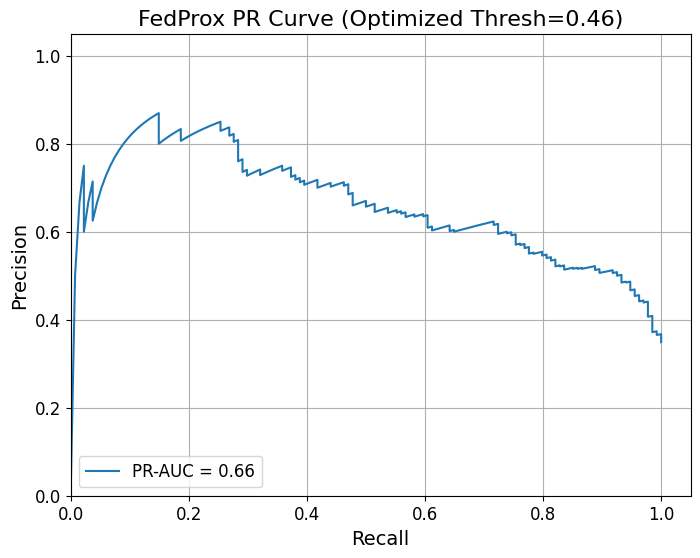


--- Running benchmark for Pima, Seed 42, Repetition 1, Fold 2 ---
Random seeds set for reproducibility (Seed: 42).
  Effective parameters for pima: Num Clients=5, Alpha Values=[0.5], Min Client Size=20, Min Positive=5

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [0.768      1.43283582]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=1.43
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.5373 (Mode=f1), F1=0.5373, F2=0.7438, Recall=1.0000, Balanced Acc=0.6125
      Threshold 0.06: Opt_Metric=0.5373 (Mode=f1), F1=0.5373, F2=0.7438, Recall=1.0000, Balanced Acc=0.6125
      Threshold 0.07: Opt_Metric=0.5373 (Mode=f1), F1=0.5373, F2=0.7438, Recall=1.0000, Balanced Acc=0.6125
      Threshold 0.08: Opt_Metric=0.5538 (Mode=f1), F1=0.5538, F2=0.7563, Recall=1.0000, Balanced Acc=0.6375
      Threshold 0

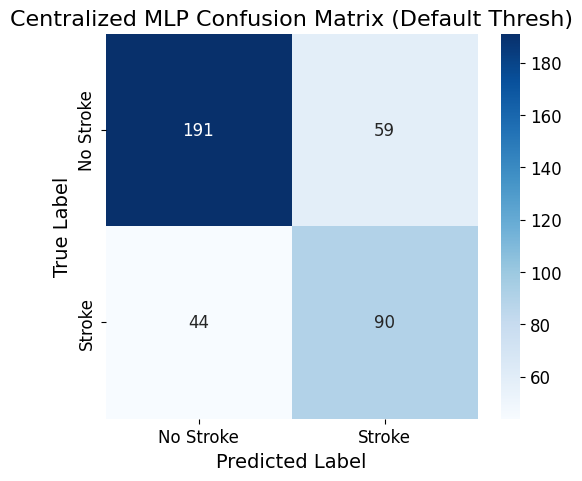

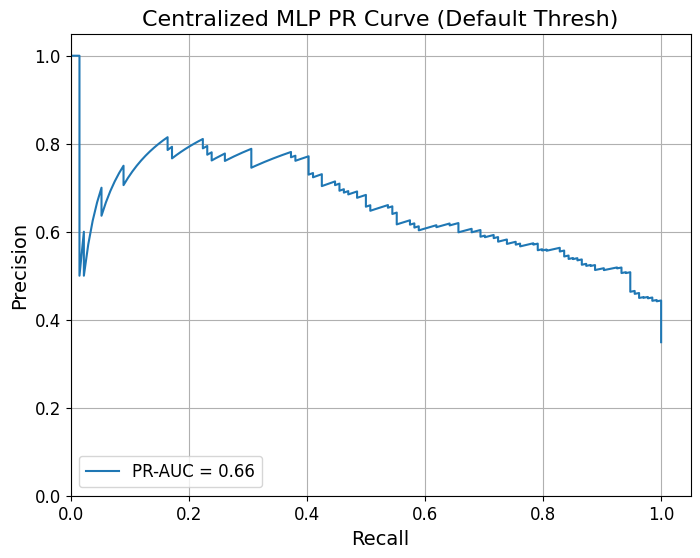

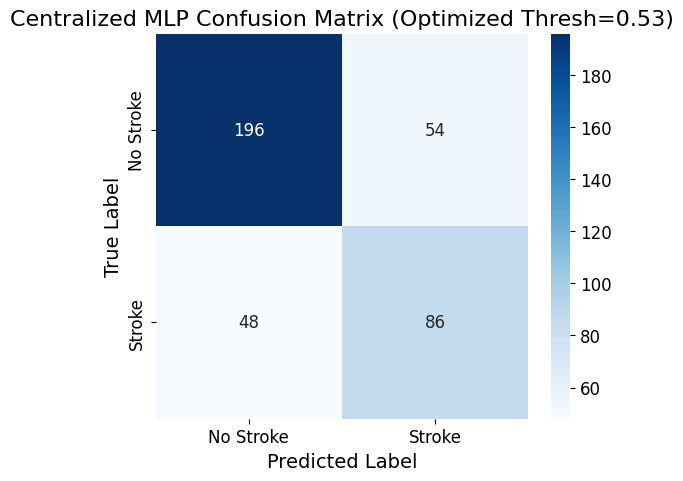

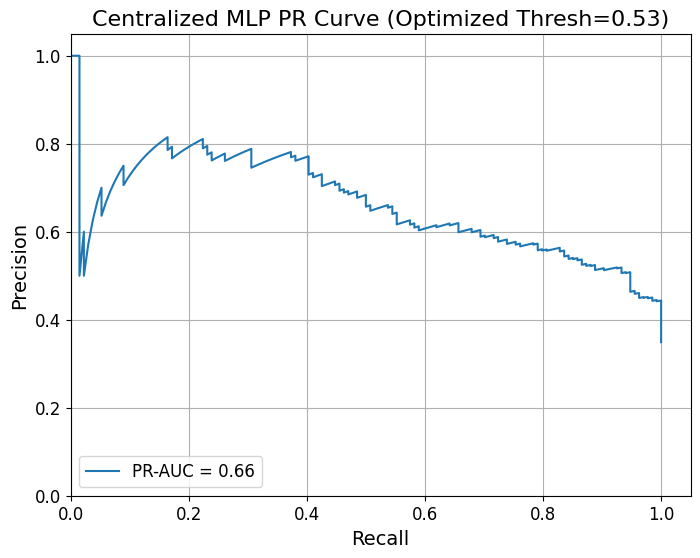


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 1 rebalance rounds:
      Client 1: Size=102, Pos=43, Neg=59, Pos %=42.16%, Imbalance Ratio=1.37
      Client 2: Size=149, Pos=45, Neg=104, Pos %=30.20%, Imbalance Ratio=2.31
      Client 3: Size=22, Pos=8, Neg=14, Pos %=36.36%, Imbalance Ratio=1.75
      Client 4: Size=70, Pos=22, Neg=48, Pos %=31.43%, Imbalance Ratio=2.18
      Client 5: Size=41, Pos=16, Neg=25, Pos %=39.02%, Imbalance Ratio=1.56
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['42.16%', '

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


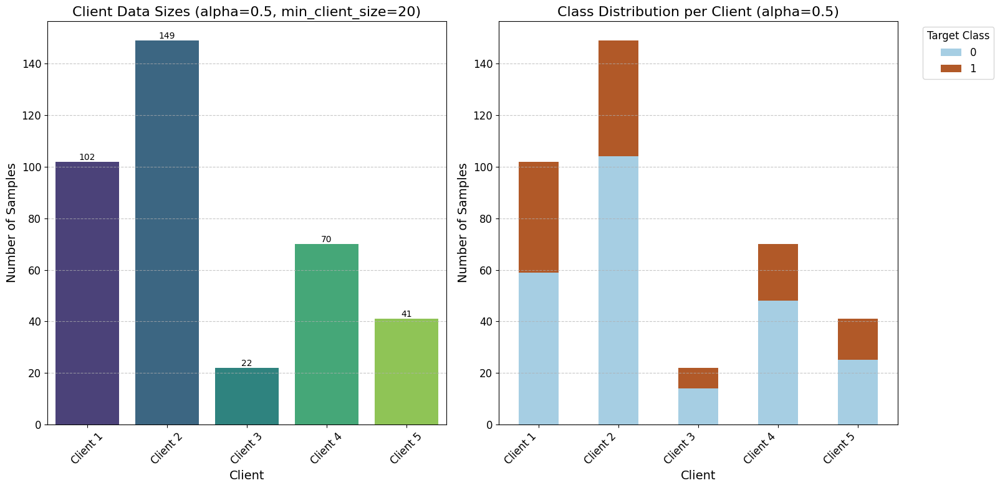

  Class weights applied: [0.768      1.43283582]
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCE

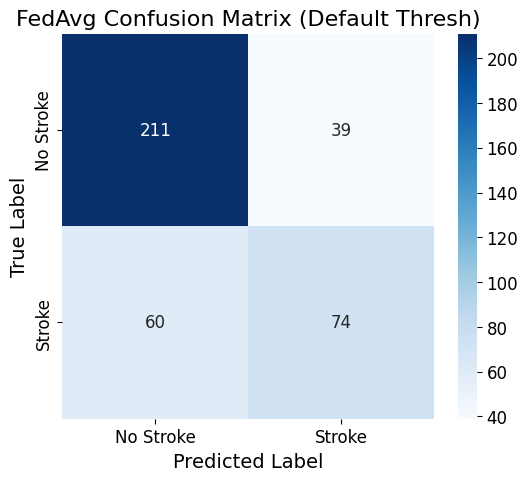

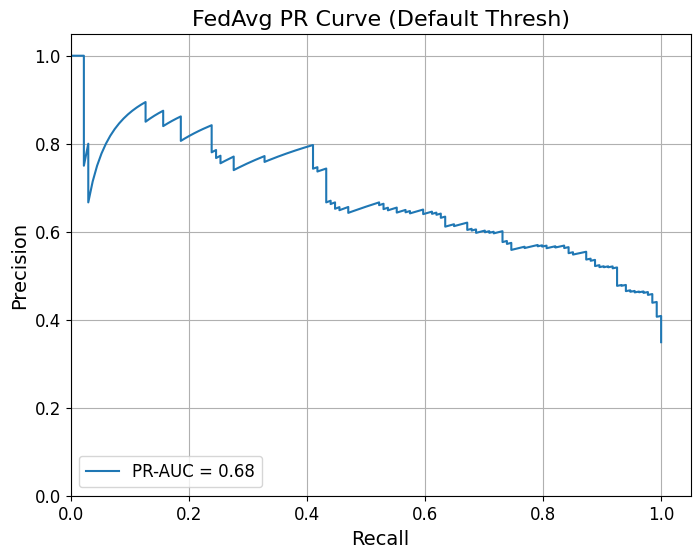


  Evaluating FedAvg model with OPTIMIZED threshold (0.45):
    Accuracy: 0.7188
    Balanced Accuracy: 0.7442
    Precision: 0.5663
    Recall: 0.8284
    F1: 0.6727
    F2: 0.7582
    Macro F1: 0.7131
    ROC-AUC: 0.8164
    PR-AUC: 0.6850
    MCC: 0.4656
    Sensitivity: 0.8284
    Specificity: 0.6600
    Confusion Matrix Counts: TP=111, TN=165, FP=85, FN=23


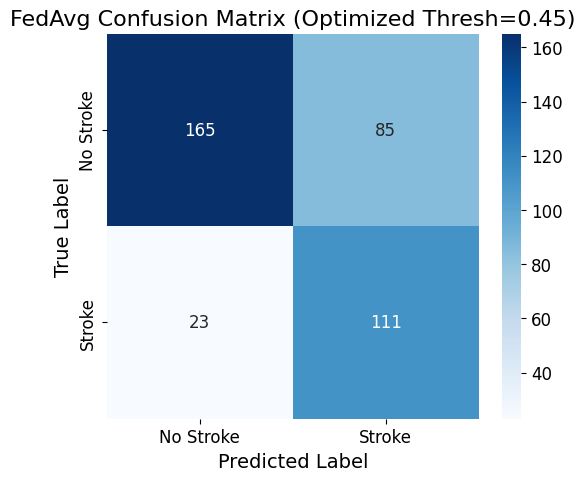

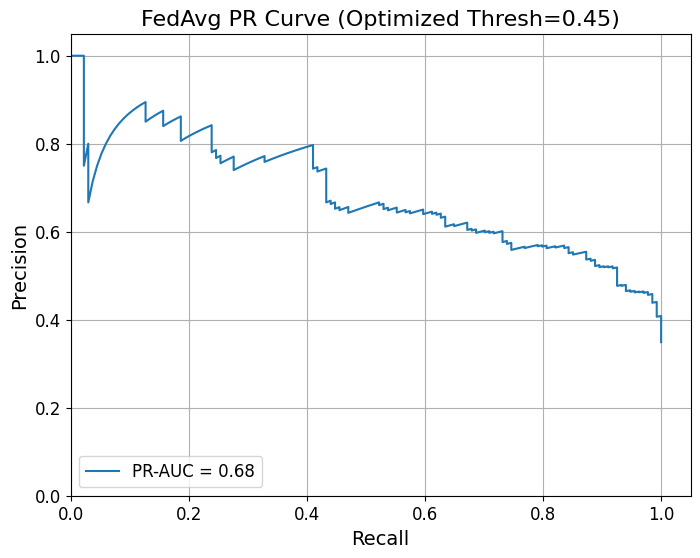


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 1 rebalance rounds:
      Client 1: Size=102, Pos=43, Neg=59, Pos %=42.16%, Imbalance Ratio=1.37
      Client 2: Size=149, Pos=45, Neg=104, Pos %=30.20%, Imbalance Ratio=2.31
      Client 3: Size=22, Pos=8, Neg=14, Pos %=36.36%, Imbalance Ratio=1.75
      Client 4: Size=70, Pos=22, Neg=48, Pos %=31.43%, Imbalance Ratio=2.18
      Client 5: Size=41, Pos=16, Neg=25, Pos %=39.02%, Imbalance Ratio=1.56
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['42.16%',

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


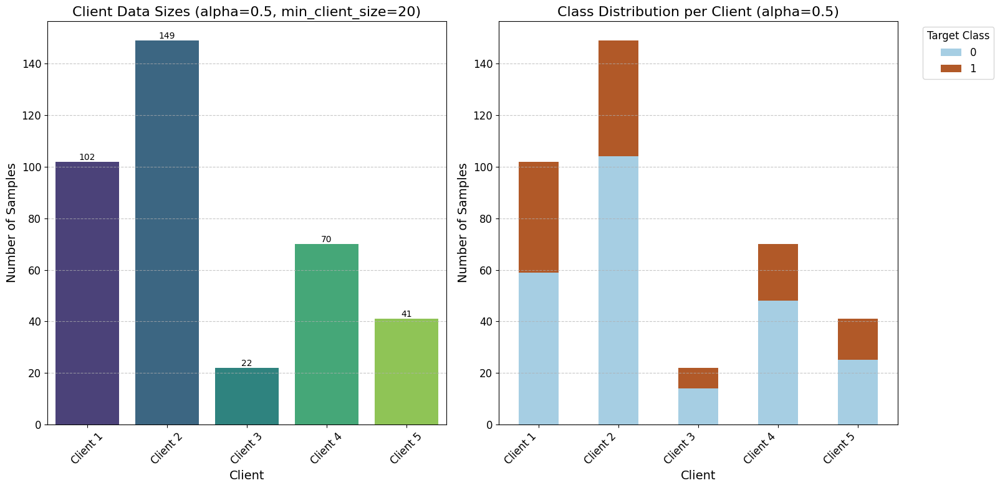

  Class weights applied: [0.768      1.43283582]
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCE

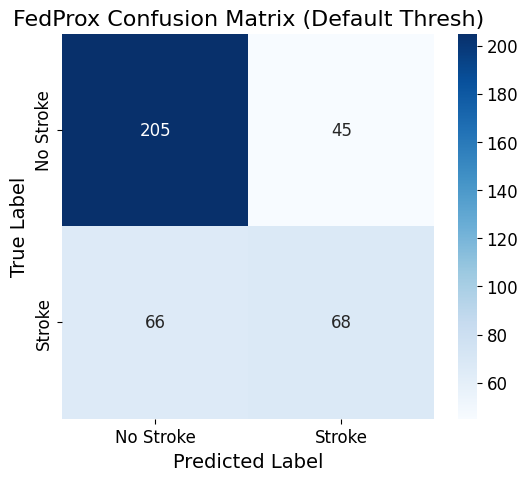

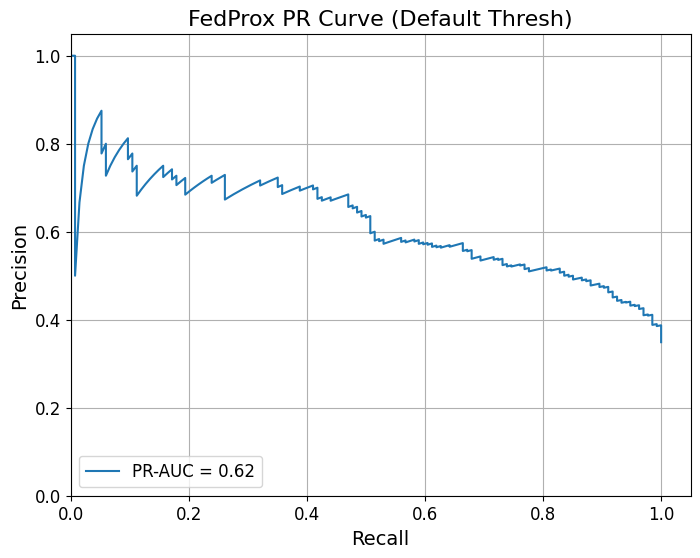


  Evaluating FedProx model with OPTIMIZED threshold (0.44):
    Accuracy: 0.6693
    Balanced Accuracy: 0.6993
    Precision: 0.5169
    Recall: 0.7985
    F1: 0.6276
    F2: 0.7201
    Macro F1: 0.6651
    ROC-AUC: 0.7724
    PR-AUC: 0.6230
    MCC: 0.3811
    Sensitivity: 0.7985
    Specificity: 0.6000
    Confusion Matrix Counts: TP=107, TN=150, FP=100, FN=27


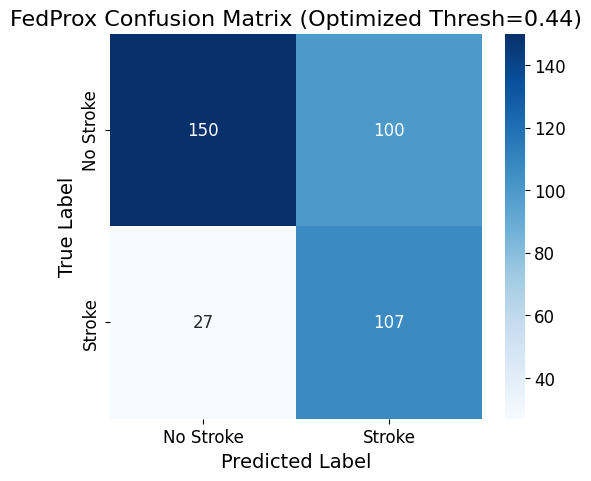

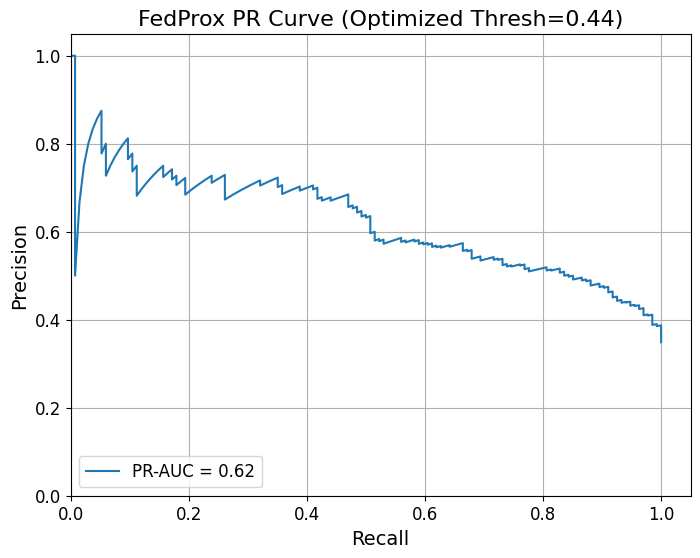

  [MULTI-SEED] Seed 42 success: 12 result rows found.
[MULTI-SEED] Successfully aggregated 0 metric rows for pima.
  [MASTER] WARNING: No CV results captured for pima

--- Starting Local Epoch Ablation for pima (FedAvg) ---

--- Loading and Preprocessing Dataset: Pima ---
Dataset 'pima' loaded and preprocessed: X.shape=(768, 8), input_dim=8

Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=40, Pos=20, Neg=20, Pos %=50.00%, Imbalance Ratio=1.00
      Client 2: Size=24, Pos=10, Neg=14, Pos %=41.67%, Imbalance Ratio=1.40
      Client 3: Size=30, Pos=10, Neg=20, Pos %=33.33%, Imbalance Ratio=2.00
      Client 4: Size=255, Pos=91, Neg=164, Pos %=35.69%, Imbalance Ratio=1.80
      Client 5: Size=265, Pos=83, Neg=182, Pos 

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


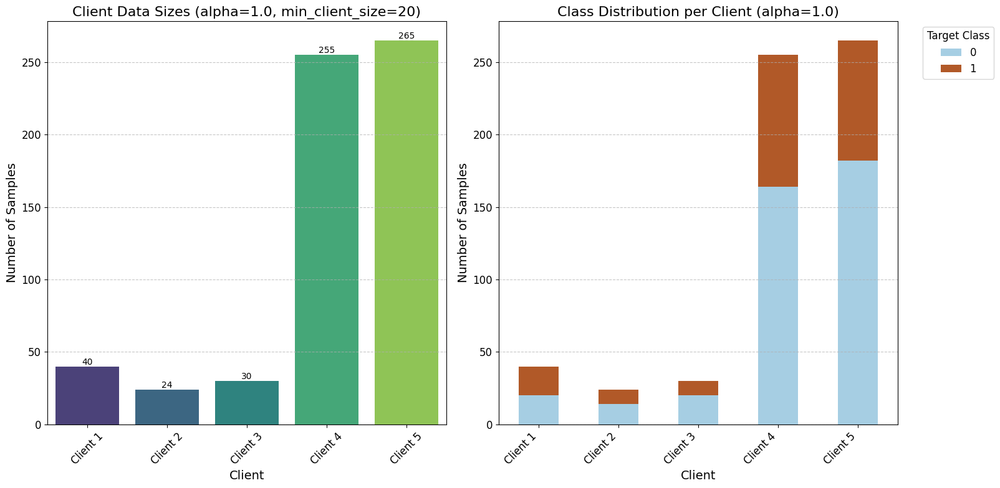

  Class weights applied: [0.7675     1.43457944]
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCE

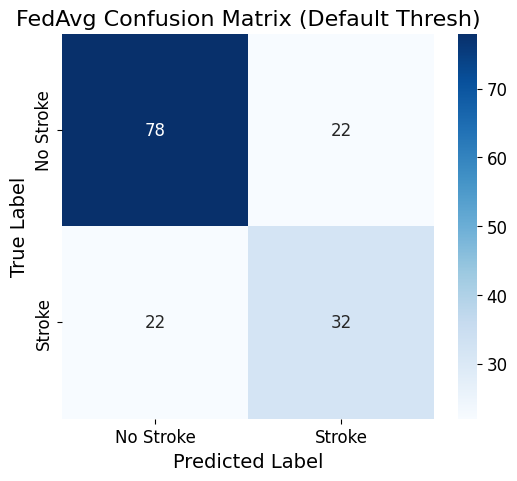

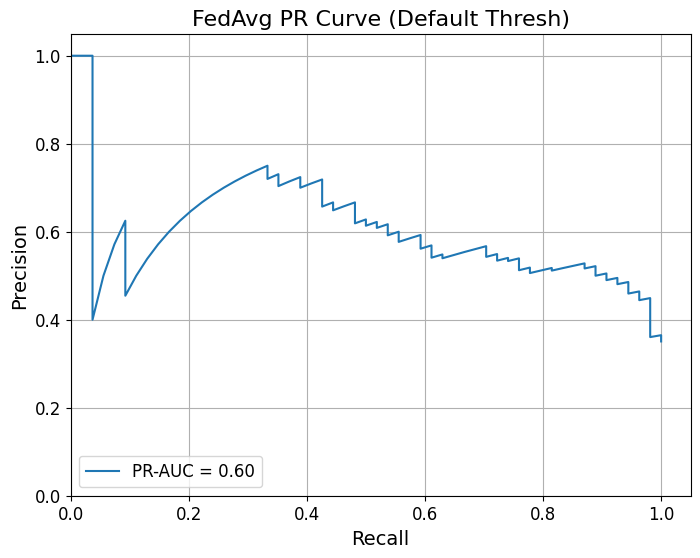


  Evaluating FedAvg model with OPTIMIZED threshold (0.30):
    Accuracy: 0.6688
    Balanced Accuracy: 0.7194
    Precision: 0.5161
    Recall: 0.8889
    F1: 0.6531
    F2: 0.7767
    Macro F1: 0.6681
    ROC-AUC: 0.7752
    PR-AUC: 0.6069
    MCC: 0.4282
    Sensitivity: 0.8889
    Specificity: 0.5500
    Confusion Matrix Counts: TP=48, TN=55, FP=45, FN=6


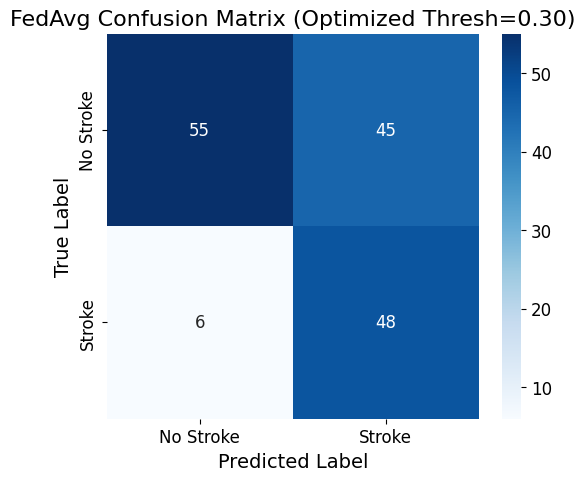

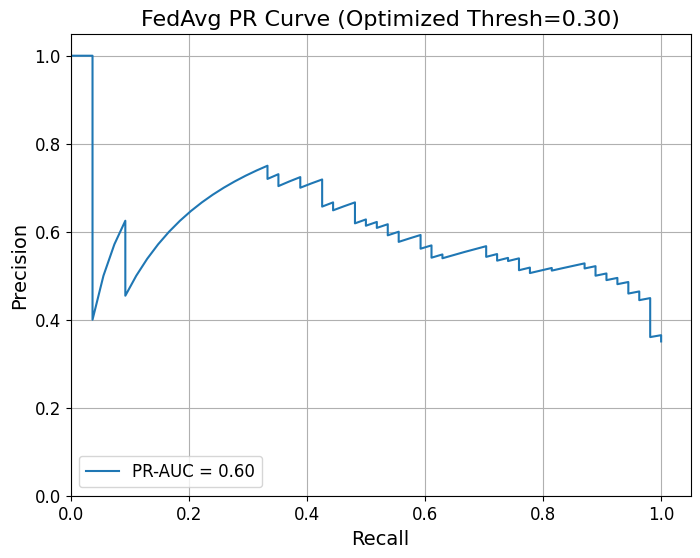


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=40, Pos=20, Neg=20, Pos %=50.00%, Imbalance Ratio=1.00
      Client 2: Size=24, Pos=10, Neg=14, Pos %=41.67%, Imbalance Ratio=1.40
      Client 3: Size=30, Pos=10, Neg=20, Pos %=33.33%, Imbalance Ratio=2.00
      Client 4: Size=255, Pos=91, Neg=164, Pos %=35.69%, Imbalance Ratio=1.80
      Client 5: Size=265, Pos=83, Neg=182, Pos %=31.32%, Imbalance Ratio=2.19
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['50.00%', '41.67%', '33.33%', '35.69%', '31.32%']
  Client Imbalance Ratios: ['1.0

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


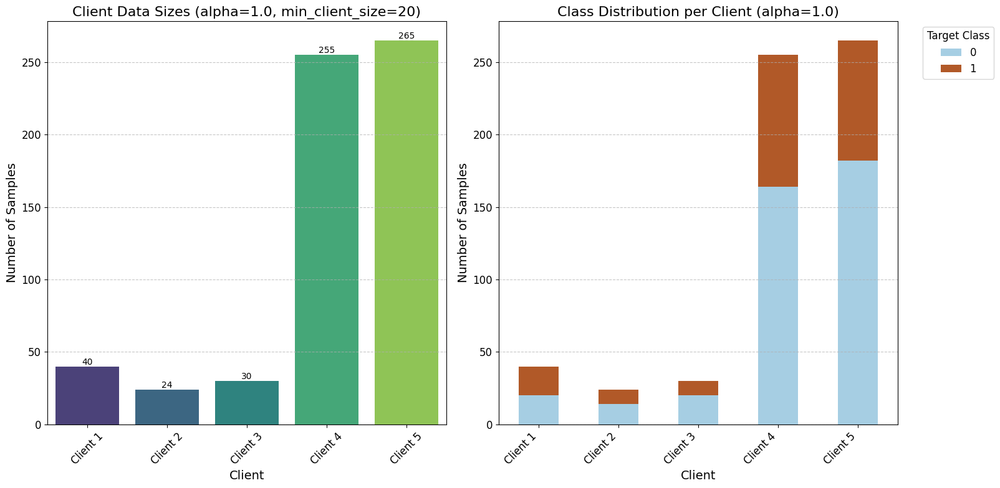

  Class weights applied: [0.7675     1.43457944]
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCE

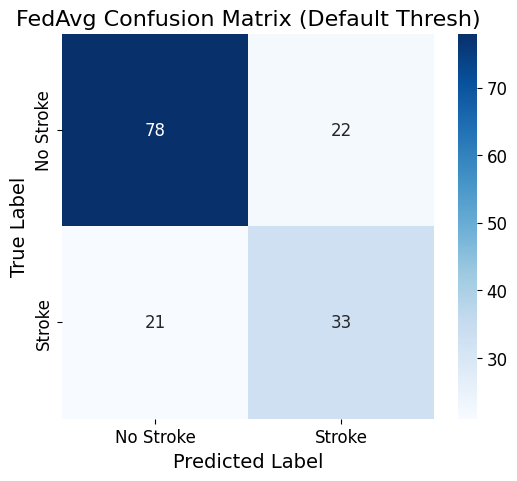

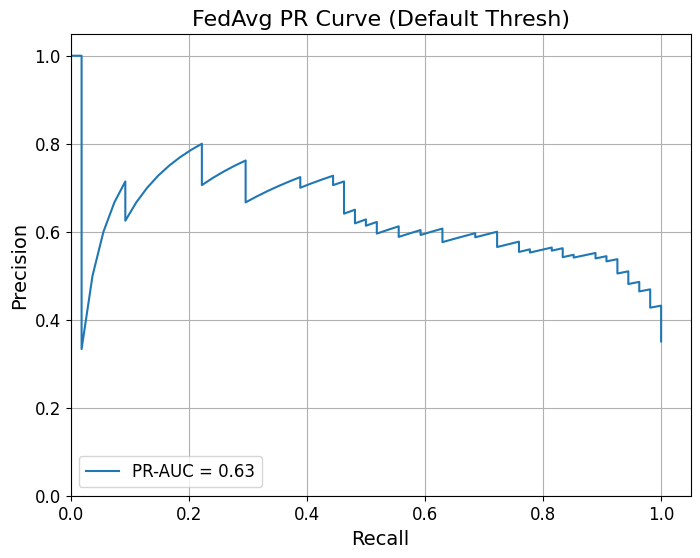


  Evaluating FedAvg model with OPTIMIZED threshold (0.23):
    Accuracy: 0.6948
    Balanced Accuracy: 0.7480
    Precision: 0.5376
    Recall: 0.9259
    F1: 0.6803
    F2: 0.8091
    Macro F1: 0.6942
    ROC-AUC: 0.8046
    PR-AUC: 0.6397
    MCC: 0.4838
    Sensitivity: 0.9259
    Specificity: 0.5700
    Confusion Matrix Counts: TP=50, TN=57, FP=43, FN=4


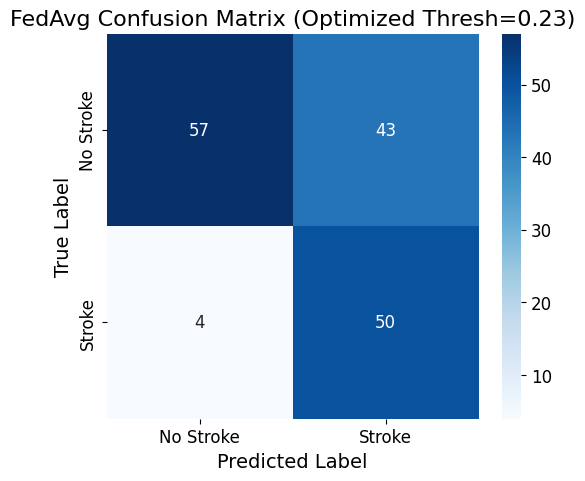

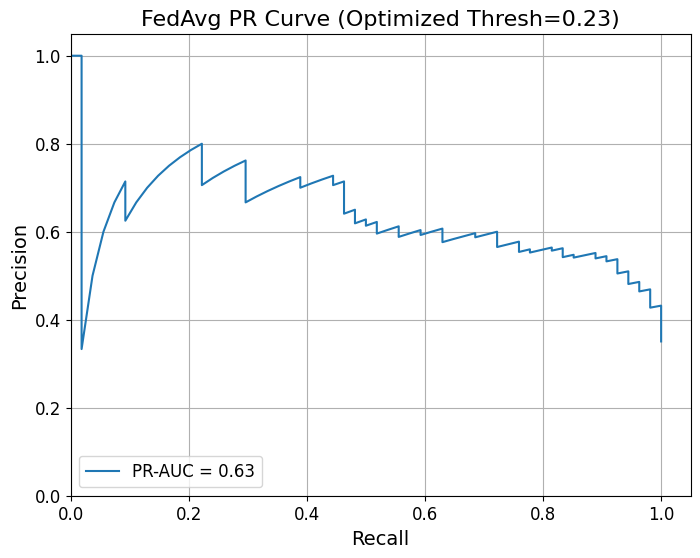


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=40, Pos=20, Neg=20, Pos %=50.00%, Imbalance Ratio=1.00
      Client 2: Size=24, Pos=10, Neg=14, Pos %=41.67%, Imbalance Ratio=1.40
      Client 3: Size=30, Pos=10, Neg=20, Pos %=33.33%, Imbalance Ratio=2.00
      Client 4: Size=255, Pos=91, Neg=164, Pos %=35.69%, Imbalance Ratio=1.80
      Client 5: Size=265, Pos=83, Neg=182, Pos %=31.32%, Imbalance Ratio=2.19
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['50.00%', '41.67%', '33.33%', '35.69%', '31.32%']
  Client Imbalance Ratios: ['1.0

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


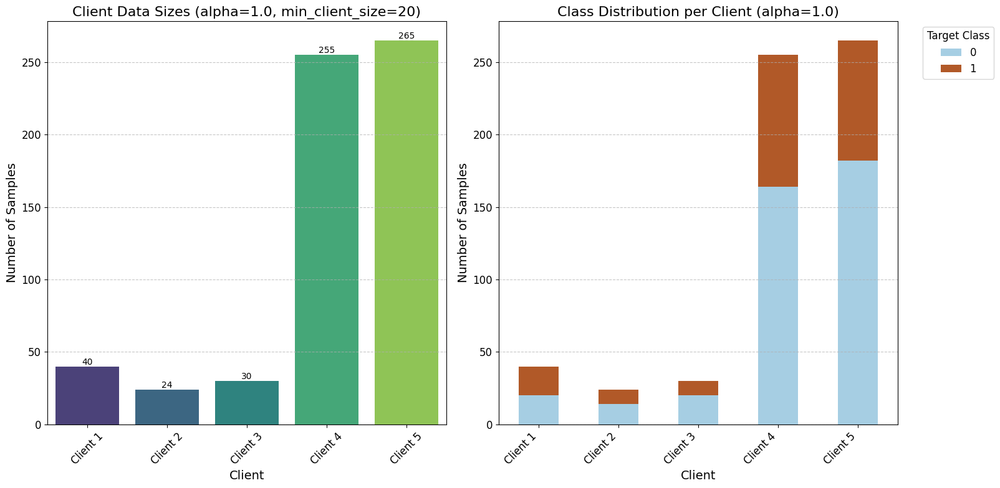

  Class weights applied: [0.7675     1.43457944]
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCEWithLogitsLoss with pos_weight=1.43
  Using BCE

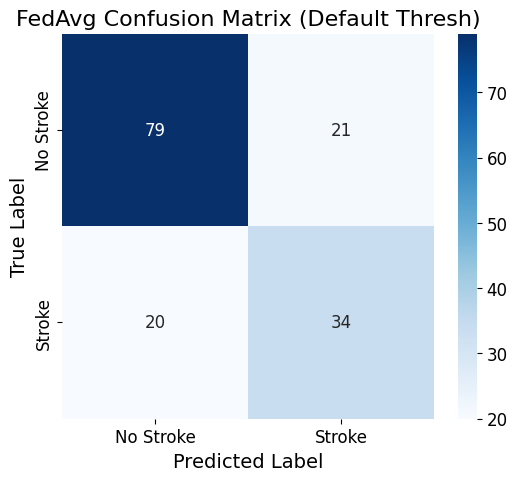

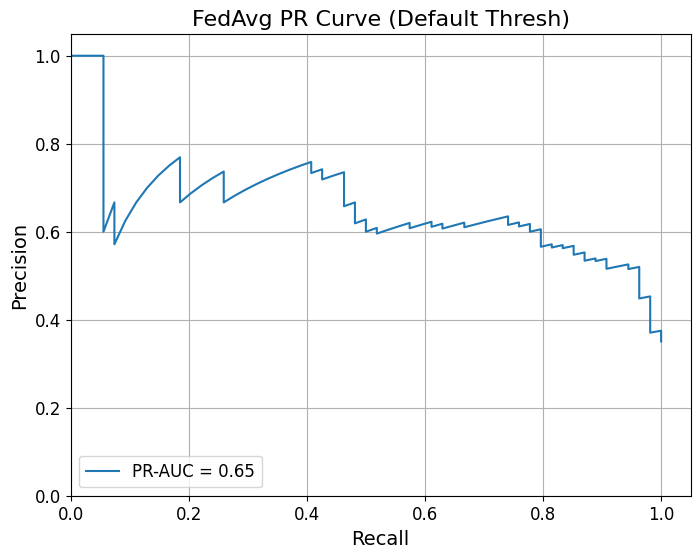


  Evaluating FedAvg model with OPTIMIZED threshold (0.40):
    Accuracy: 0.7532
    Balanced Accuracy: 0.7589
    Precision: 0.6176
    Recall: 0.7778
    F1: 0.6885
    F2: 0.7394
    Macro F1: 0.7421
    ROC-AUC: 0.8113
    PR-AUC: 0.6604
    MCC: 0.4975
    Sensitivity: 0.7778
    Specificity: 0.7400
    Confusion Matrix Counts: TP=42, TN=74, FP=26, FN=12


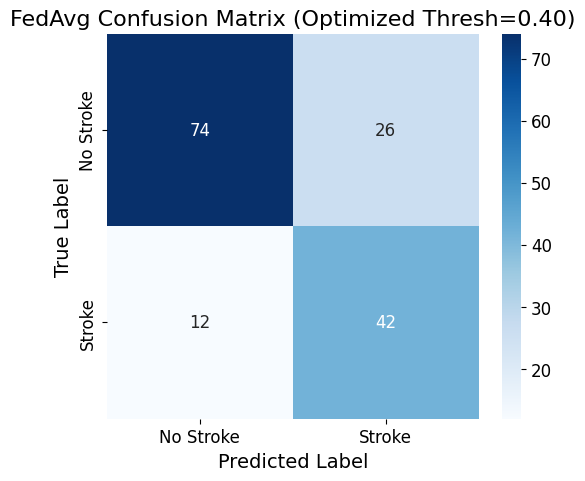

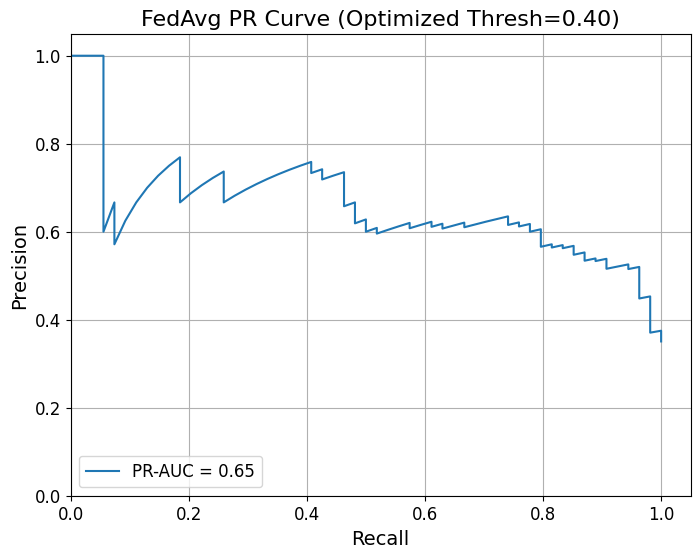

  [MASTER] Captured ablation results for pima

################################################################################
PROCESSING DATASET:                                BREAST_CANCER                                
################################################################################

Starting multi-seed CV benchmark for: Breast Cancer

--- Loading and Preprocessing Dataset: Breast Cancer ---
Dataset 'breast_cancer' loaded and preprocessed: X.shape=(569, 30), input_dim=30

--- Imbalance Report for Breast Cancer ---
  Dataset: breast_cancer
  Total Samples: 569
  Positive Samples (Target=1): 212
  Negative Samples (Target=0): 357
  Positive Percentage: 37.26%
  Negative Percentage: 62.74%
  Imbalance Ratio (Neg:Pos): 1.68
  Target Mean: 0.3726
---------------------------------------

***** [MULTI-SEED] Running Seed 1/1: 42 *****

Starting Cross-Validation for Breast Cancer, Seed 42
Random seeds set for reproducibility (Seed: 42).

--- Running benchmark for Breast Ca

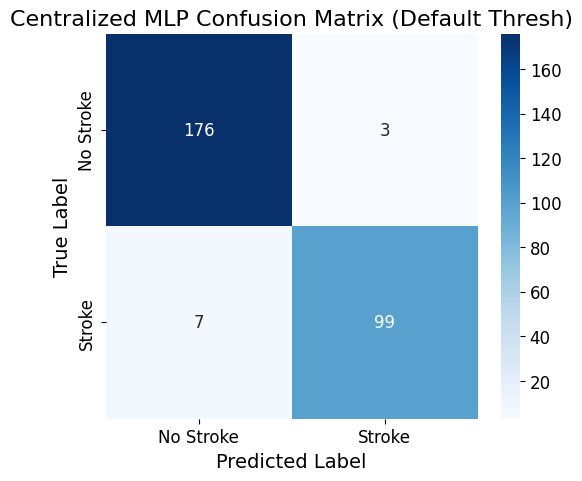

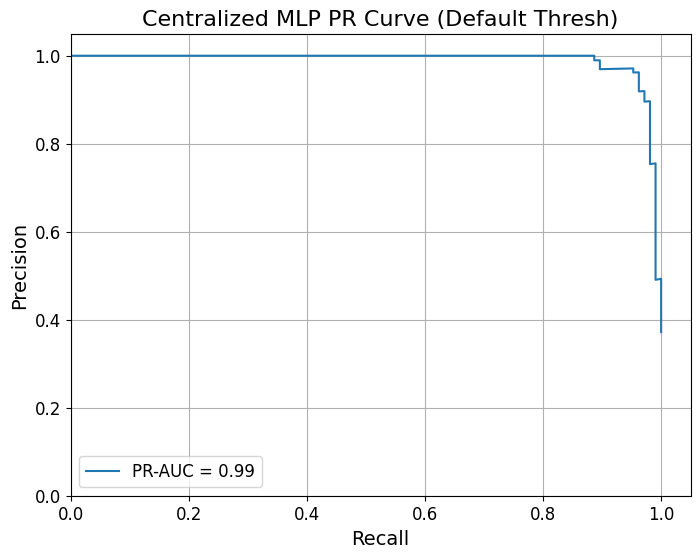

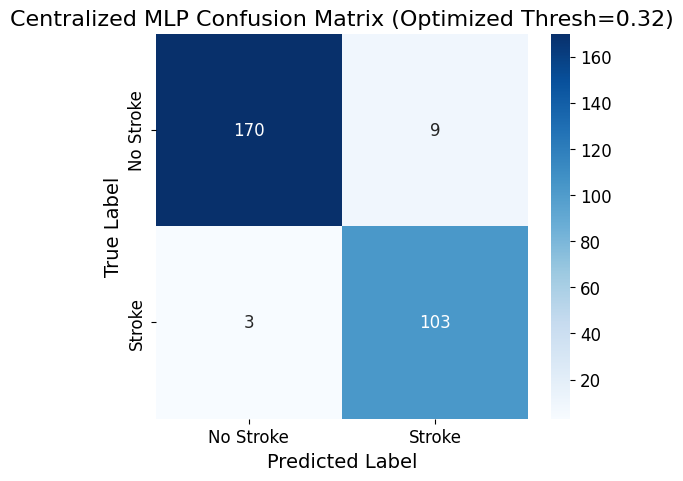

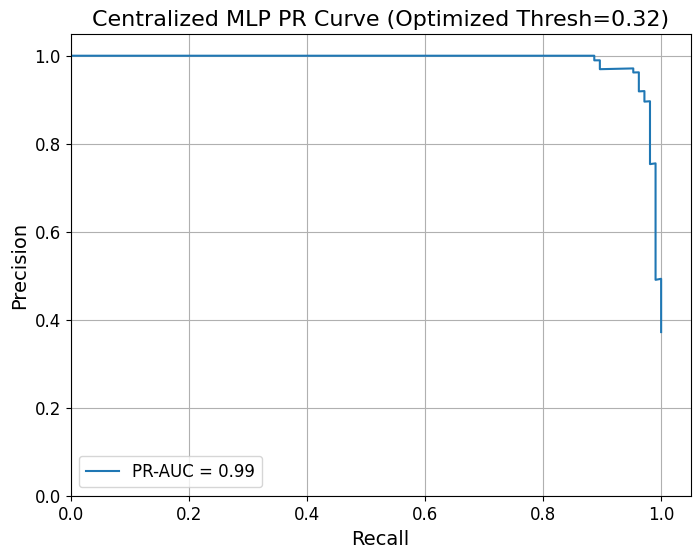


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 4
    Validating partition after 1 rebalance rounds:
      Client 1: Size=27, Pos=10, Neg=17, Pos %=37.04%, Imbalance Ratio=1.70
      Client 2: Size=102, Pos=36, Neg=66, Pos %=35.29%, Imbalance Ratio=1.83
      Client 3: Size=25, Pos=11, Neg=14, Pos %=44.00%, Imbalance Ratio=1.27
      Client 4: Size=24, Pos=9, Neg=15, Pos %=37.50%, Imbalance Ratio=1.67
      Client 5: Size=106, Pos=40, Neg=66, Pos %=37.74%, Imbalance Ratio=1.65
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['37.04%', '3

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


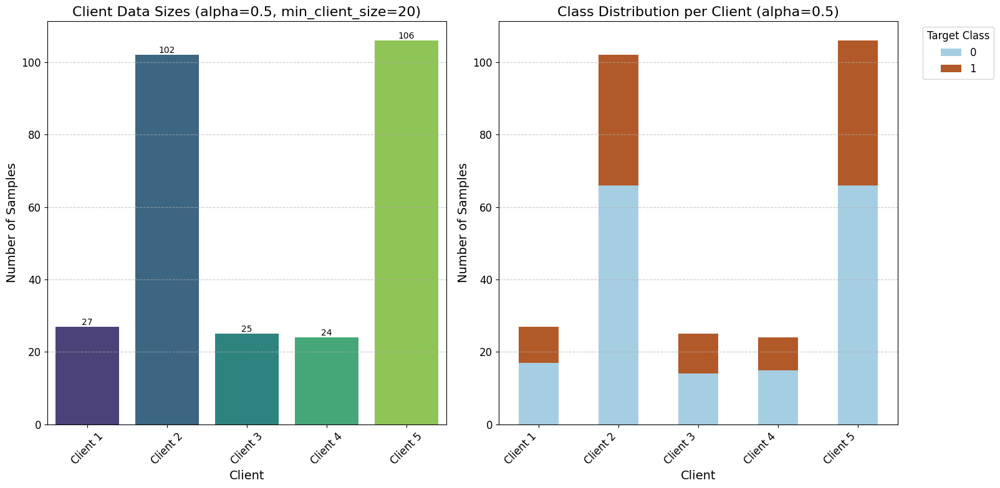

  Class weights applied: [0.79775281 1.33962264]
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCE

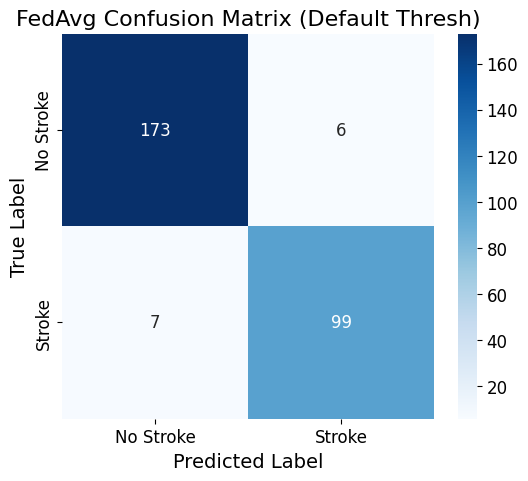

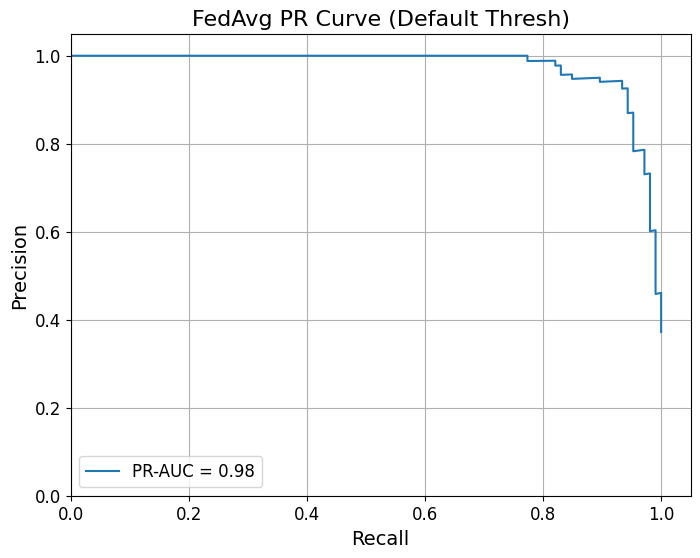


  Evaluating FedAvg model with OPTIMIZED threshold (0.49):
    Accuracy: 0.9544
    Balanced Accuracy: 0.9502
    Precision: 0.9429
    Recall: 0.9340
    F1: 0.9384
    F2: 0.9357
    Macro F1: 0.9511
    ROC-AUC: 0.9803
    PR-AUC: 0.9765
    MCC: 0.9022
    Sensitivity: 0.9340
    Specificity: 0.9665
    Confusion Matrix Counts: TP=99, TN=173, FP=6, FN=7


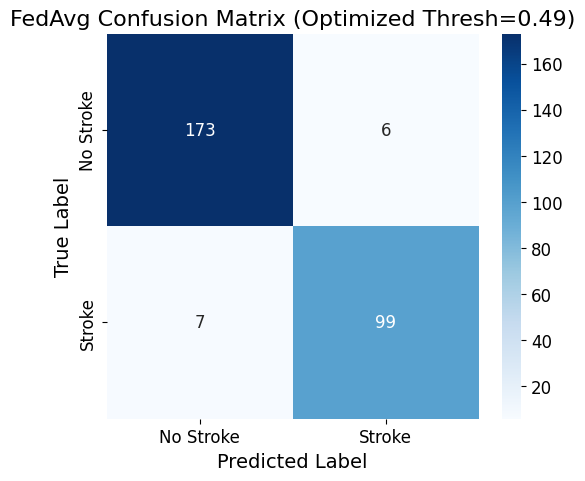

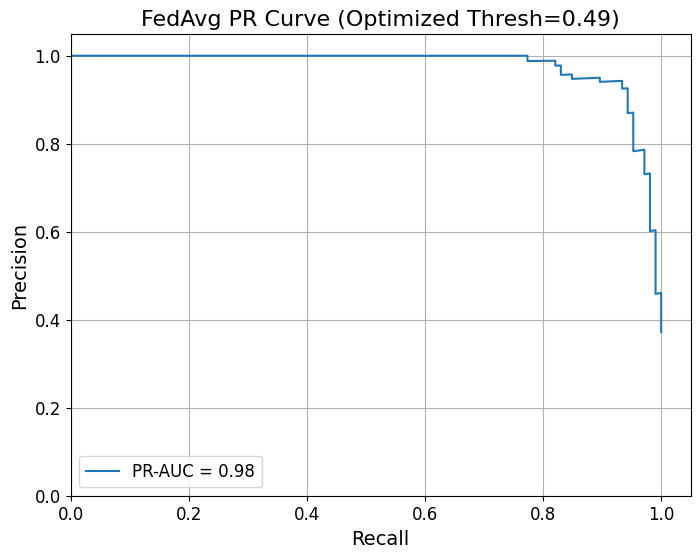


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 4
    Validating partition after 1 rebalance rounds:
      Client 1: Size=27, Pos=10, Neg=17, Pos %=37.04%, Imbalance Ratio=1.70
      Client 2: Size=102, Pos=36, Neg=66, Pos %=35.29%, Imbalance Ratio=1.83
      Client 3: Size=25, Pos=11, Neg=14, Pos %=44.00%, Imbalance Ratio=1.27
      Client 4: Size=24, Pos=9, Neg=15, Pos %=37.50%, Imbalance Ratio=1.67
      Client 5: Size=106, Pos=40, Neg=66, Pos %=37.74%, Imbalance Ratio=1.65
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['37.04%', 

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


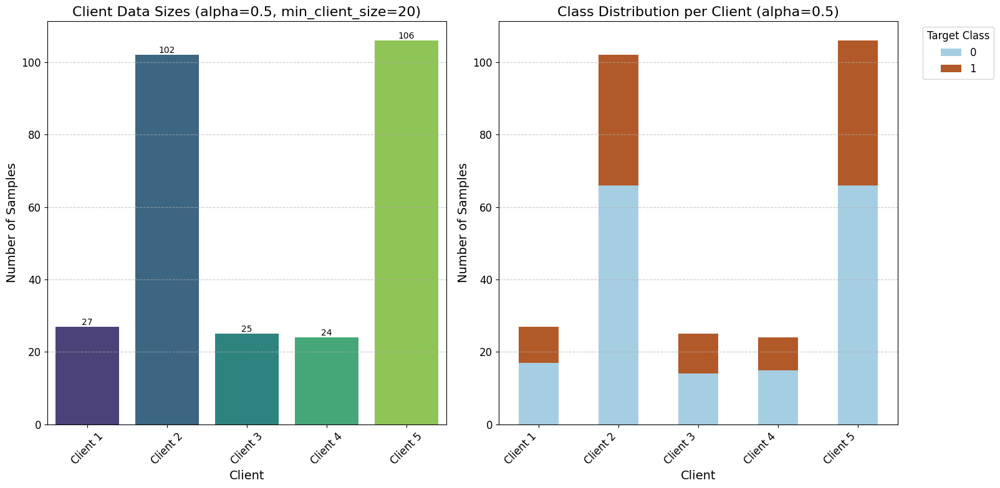

  Class weights applied: [0.79775281 1.33962264]
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCE

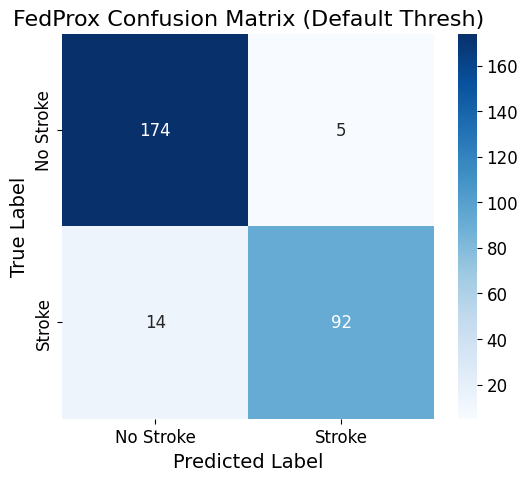

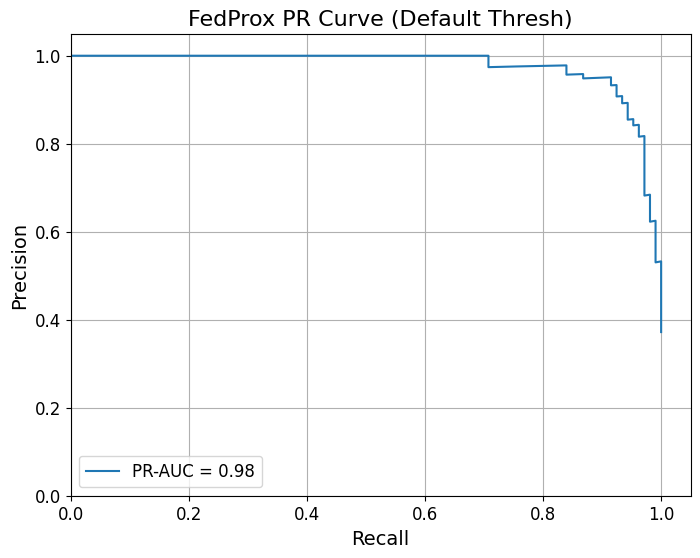


  Evaluating FedProx model with OPTIMIZED threshold (0.47):
    Accuracy: 0.9509
    Balanced Accuracy: 0.9436
    Precision: 0.9510
    Recall: 0.9151
    F1: 0.9327
    F2: 0.9221
    Macro F1: 0.9470
    ROC-AUC: 0.9812
    PR-AUC: 0.9753
    MCC: 0.8945
    Sensitivity: 0.9151
    Specificity: 0.9721
    Confusion Matrix Counts: TP=97, TN=174, FP=5, FN=9


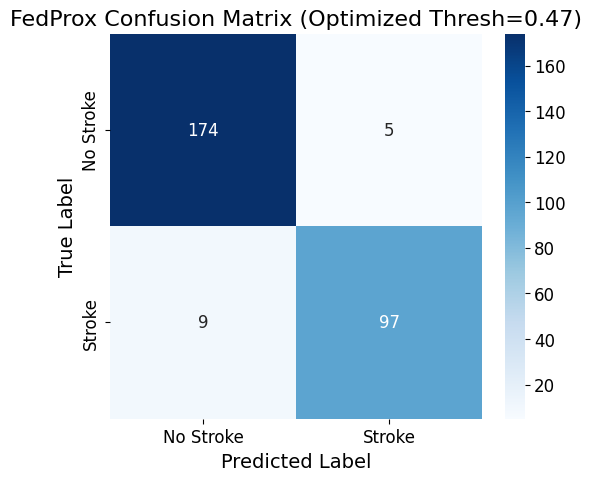

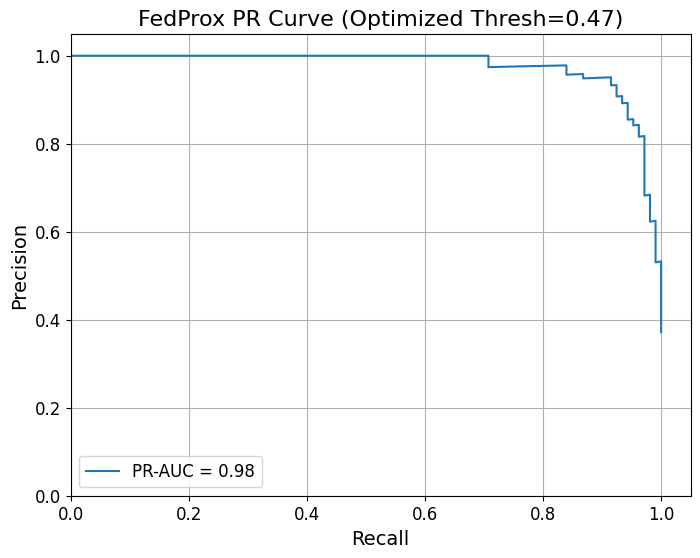


--- Running benchmark for Breast Cancer, Seed 42, Repetition 1, Fold 2 ---
Random seeds set for reproducibility (Seed: 42).
  Effective parameters for breast_cancer: Num Clients=5, Alpha Values=[0.5], Min Client Size=20, Min Positive=5

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [0.79608939 1.34433962]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=1.34
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.7368 (Mode=f1), F1=0.7368, F2=0.8750, Recall=1.0000, Balanced Acc=0.8276
      Threshold 0.06: Opt_Metric=0.8000 (Mode=f1), F1=0.8000, F2=0.9091, Recall=1.0000, Balanced Acc=0.8793
      Threshold 0.07: Opt_Metric=0.8235 (Mode=f1), F1=0.8235, F2=0.9211, Recall=1.0000, Balanced Acc=0.8966
      Threshold 0.08: Opt_Metric=0.9032 (Mode=f1), F1=0.9032, F2=0.9589, Recall=1.0000, Balanced Acc=0.9483

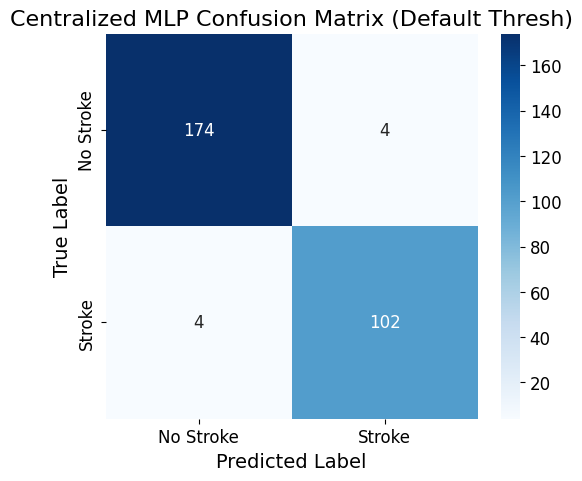

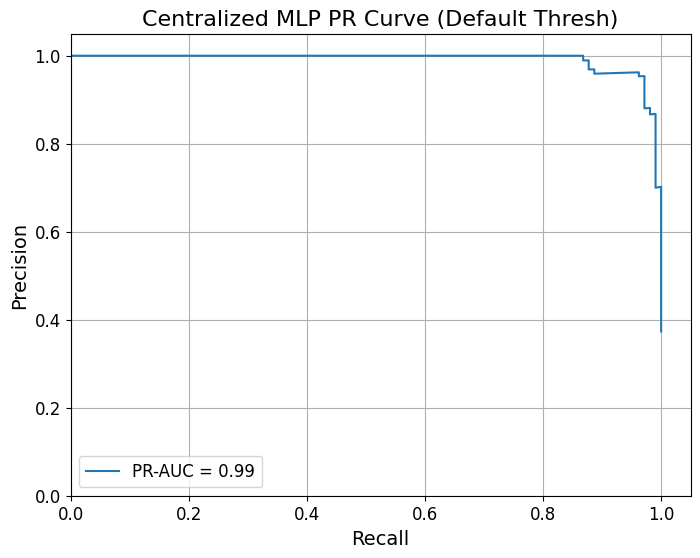

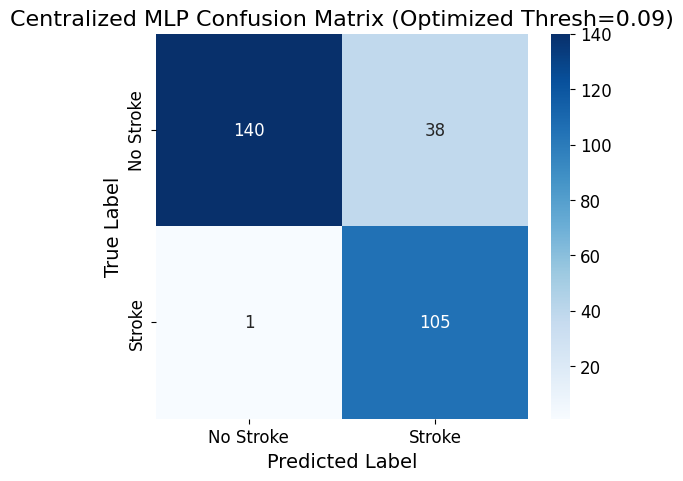

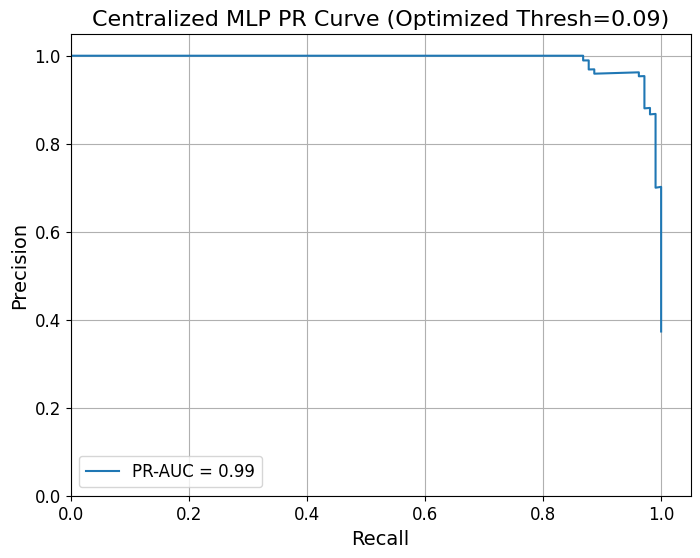


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 4
    Validating partition after 1 rebalance rounds:
      Client 1: Size=27, Pos=11, Neg=16, Pos %=40.74%, Imbalance Ratio=1.45
      Client 2: Size=103, Pos=34, Neg=69, Pos %=33.01%, Imbalance Ratio=2.03
      Client 3: Size=25, Pos=10, Neg=15, Pos %=40.00%, Imbalance Ratio=1.50
      Client 4: Size=24, Pos=11, Neg=13, Pos %=45.83%, Imbalance Ratio=1.18
      Client 5: Size=106, Pos=40, Neg=66, Pos %=37.74%, Imbalance Ratio=1.65
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['40.74%', '

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


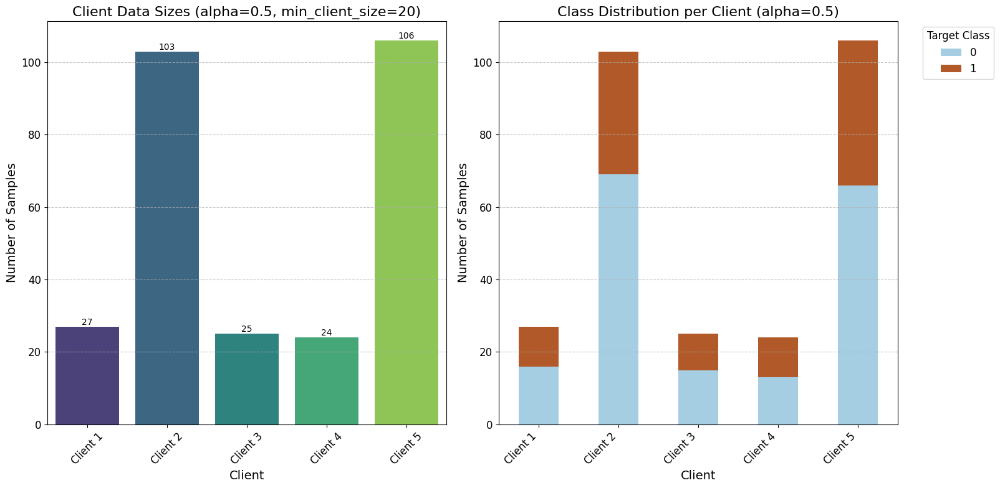

  Class weights applied: [0.79608939 1.34433962]
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCE

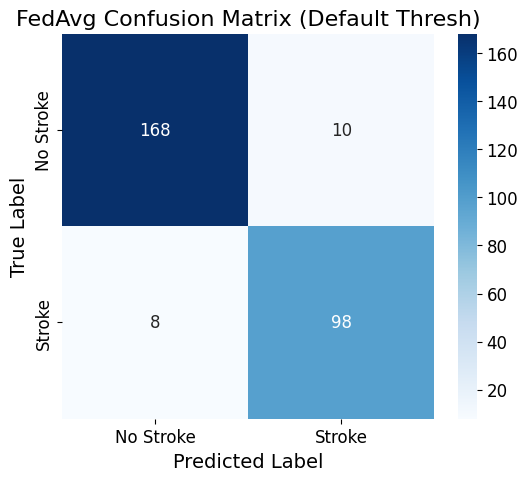

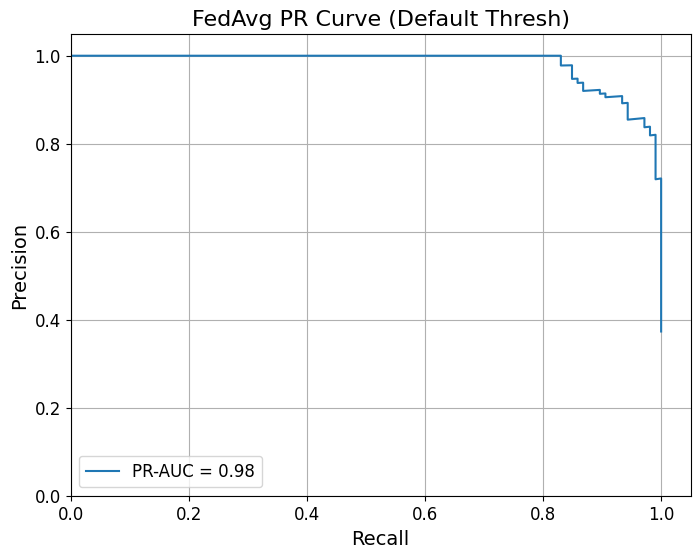


  Evaluating FedAvg model with OPTIMIZED threshold (0.49):
    Accuracy: 0.9401
    Balanced Accuracy: 0.9389
    Precision: 0.9083
    Recall: 0.9340
    F1: 0.9209
    F2: 0.9287
    Macro F1: 0.9364
    ROC-AUC: 0.9881
    PR-AUC: 0.9820
    MCC: 0.8730
    Sensitivity: 0.9340
    Specificity: 0.9438
    Confusion Matrix Counts: TP=99, TN=168, FP=10, FN=7


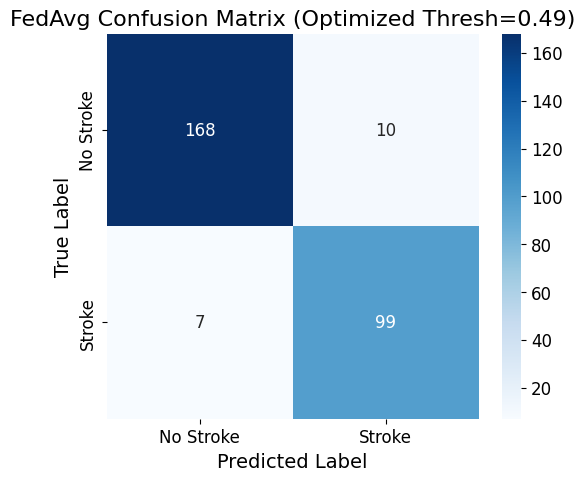

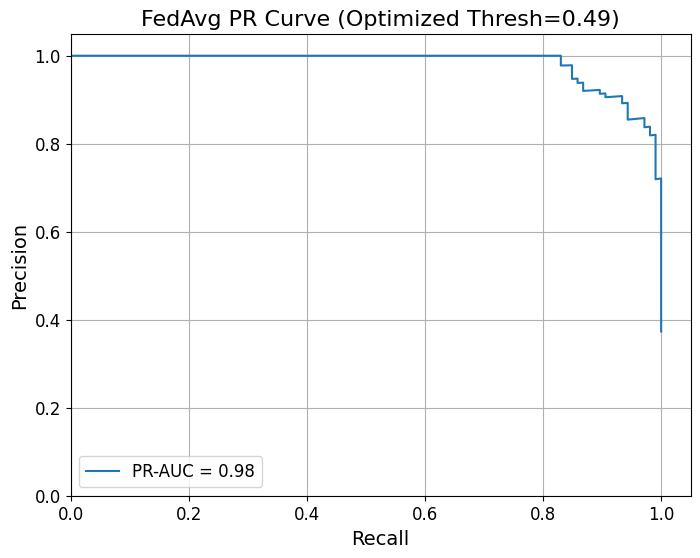


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 5 to client 4
    Validating partition after 1 rebalance rounds:
      Client 1: Size=27, Pos=11, Neg=16, Pos %=40.74%, Imbalance Ratio=1.45
      Client 2: Size=103, Pos=34, Neg=69, Pos %=33.01%, Imbalance Ratio=2.03
      Client 3: Size=25, Pos=10, Neg=15, Pos %=40.00%, Imbalance Ratio=1.50
      Client 4: Size=24, Pos=11, Neg=13, Pos %=45.83%, Imbalance Ratio=1.18
      Client 5: Size=106, Pos=40, Neg=66, Pos %=37.74%, Imbalance Ratio=1.65
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 1 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: True (took 1 rounds if triggered).
  Client Positive Percentages: ['40.74%',

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


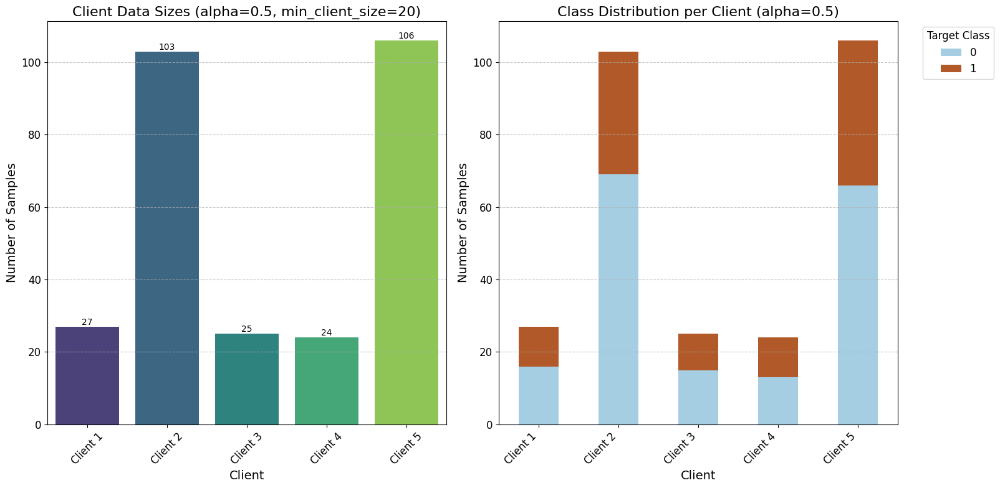

  Class weights applied: [0.79608939 1.34433962]
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCE

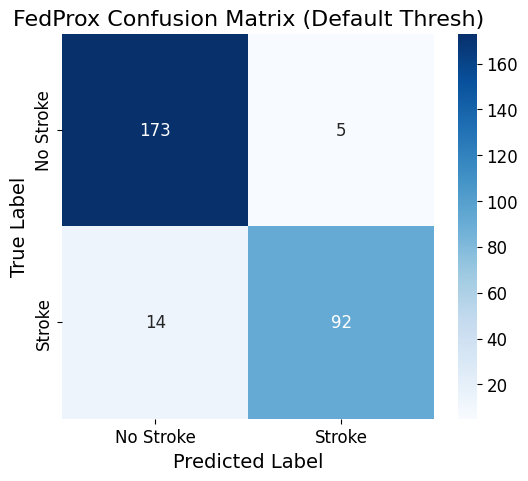

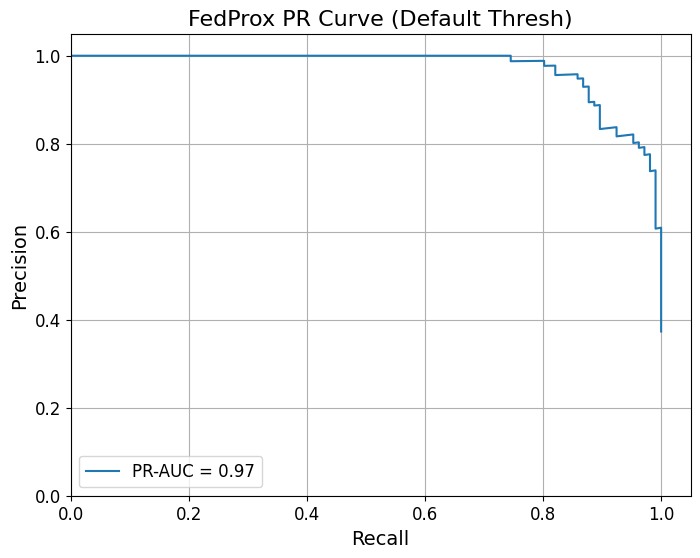


  Evaluating FedProx model with OPTIMIZED threshold (0.50):
    Accuracy: 0.9331
    Balanced Accuracy: 0.9199
    Precision: 0.9485
    Recall: 0.8679
    F1: 0.9064
    F2: 0.8829
    Macro F1: 0.9272
    ROC-AUC: 0.9803
    PR-AUC: 0.9723
    MCC: 0.8565
    Sensitivity: 0.8679
    Specificity: 0.9719
    Confusion Matrix Counts: TP=92, TN=173, FP=5, FN=14


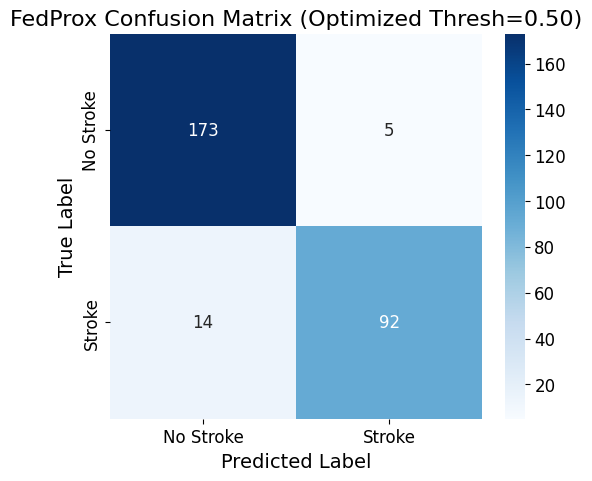

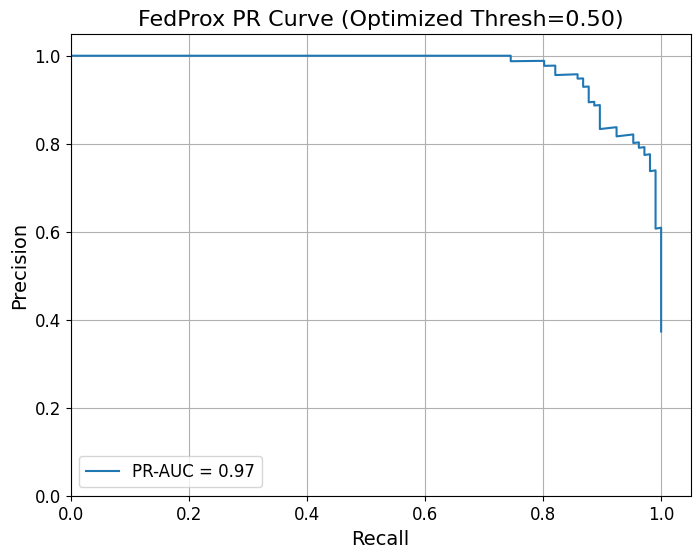

  [MULTI-SEED] Seed 42 success: 12 result rows found.
[MULTI-SEED] Successfully aggregated 0 metric rows for breast_cancer.
  [MASTER] WARNING: No CV results captured for breast_cancer

--- Starting Local Epoch Ablation for breast_cancer (FedAvg) ---

--- Loading and Preprocessing Dataset: Breast Cancer ---
Dataset 'breast_cancer' loaded and preprocessed: X.shape=(569, 30), input_dim=30

Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=113, Pos=40, Neg=73, Pos %=35.40%, Imbalance Ratio=1.82
      Client 2: Size=40, Pos=18, Neg=22, Pos %=45.00%, Imbalance Ratio=1.22
      Client 3: Size=31, Pos=10, Neg=21, Pos %=32.26%, Imbalance Ratio=2.10
      Client 4: Size=62, Pos=22, Neg=40, Pos %=35.48%, Imbalance Ratio=1.82
 

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


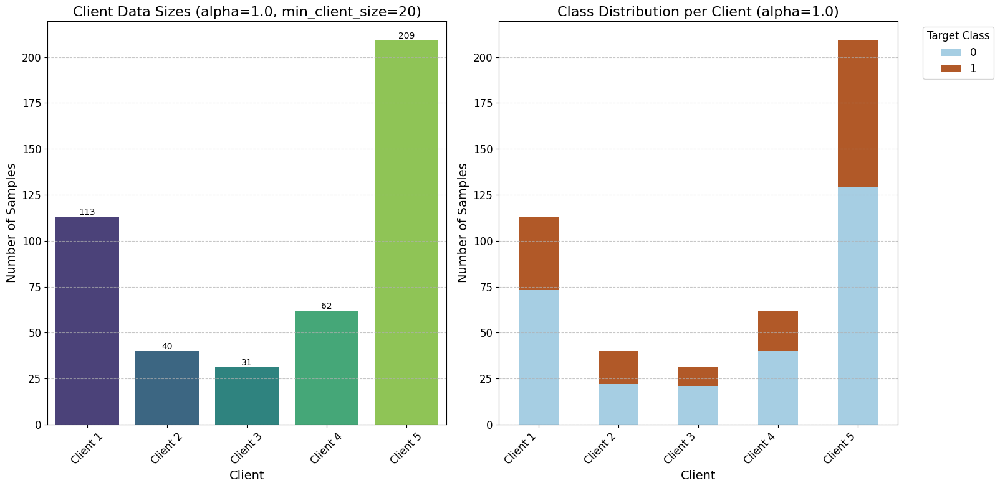

  Class weights applied: [0.79824561 1.33823529]
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCE

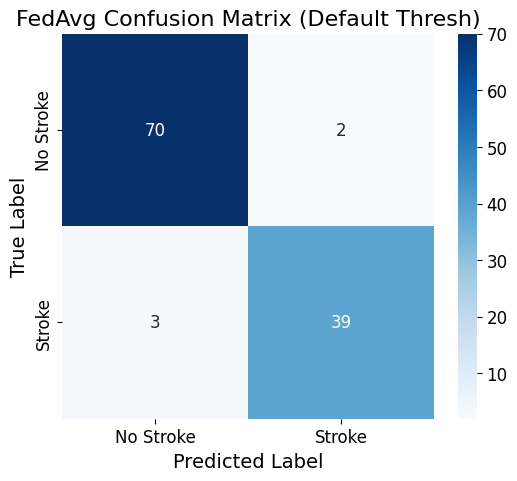

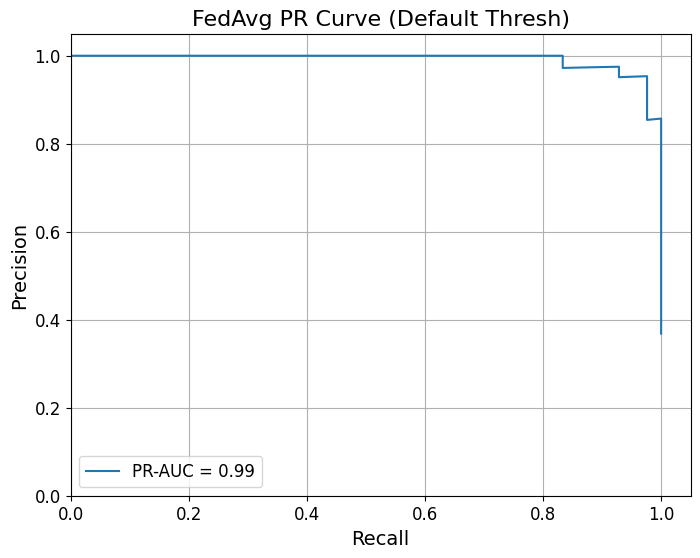


  Evaluating FedAvg model with OPTIMIZED threshold (0.41):
    Accuracy: 0.9737
    Balanced Accuracy: 0.9742
    Precision: 0.9535
    Recall: 0.9762
    F1: 0.9647
    F2: 0.9716
    Macro F1: 0.9719
    ROC-AUC: 0.9950
    PR-AUC: 0.9919
    MCC: 0.9439
    Sensitivity: 0.9762
    Specificity: 0.9722
    Confusion Matrix Counts: TP=41, TN=70, FP=2, FN=1


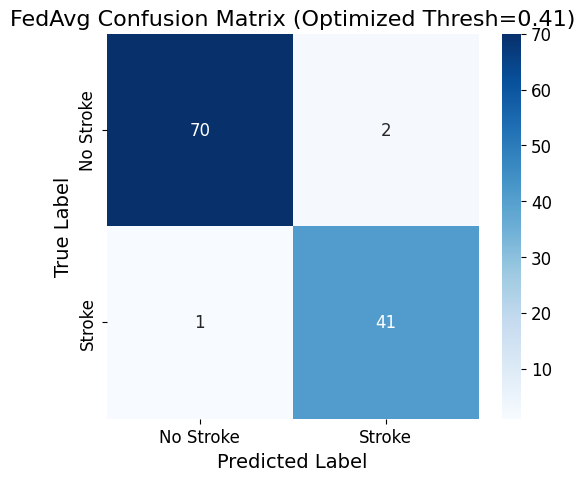

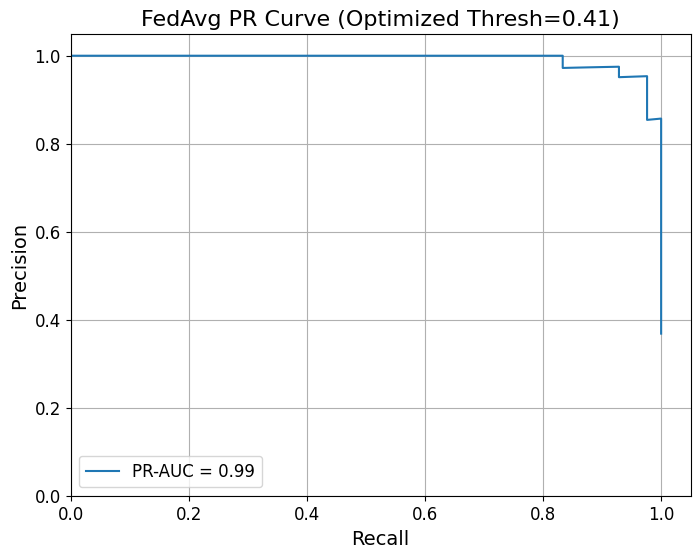


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=113, Pos=40, Neg=73, Pos %=35.40%, Imbalance Ratio=1.82
      Client 2: Size=40, Pos=18, Neg=22, Pos %=45.00%, Imbalance Ratio=1.22
      Client 3: Size=31, Pos=10, Neg=21, Pos %=32.26%, Imbalance Ratio=2.10
      Client 4: Size=62, Pos=22, Neg=40, Pos %=35.48%, Imbalance Ratio=1.82
      Client 5: Size=209, Pos=80, Neg=129, Pos %=38.28%, Imbalance Ratio=1.61
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['35.40%', '45.00%', '32.26%', '35.48%', '38.28%']
  Client Imbalance Ratios: ['1.82

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


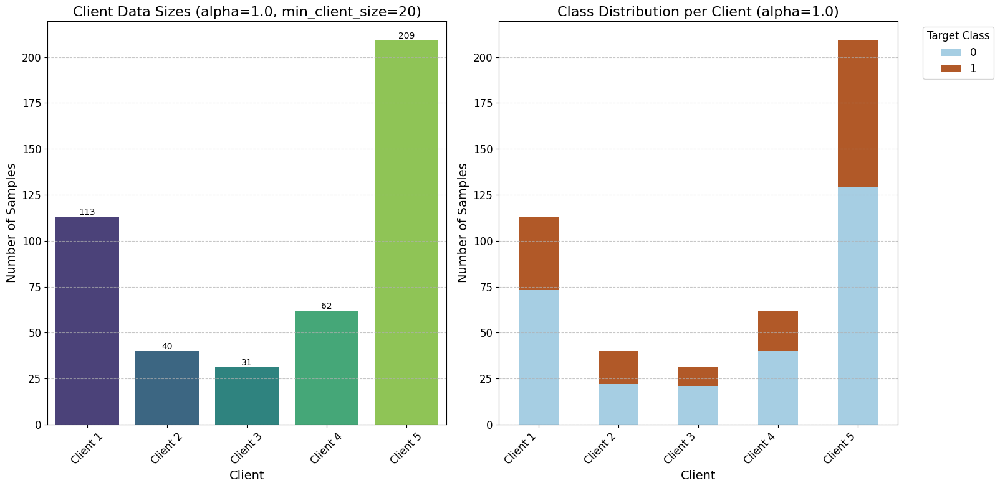

  Class weights applied: [0.79824561 1.33823529]
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCE

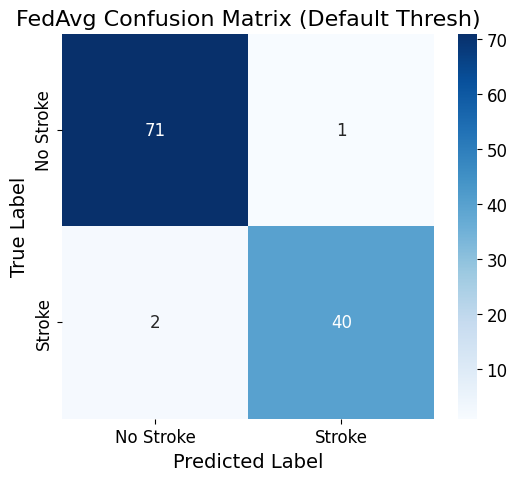

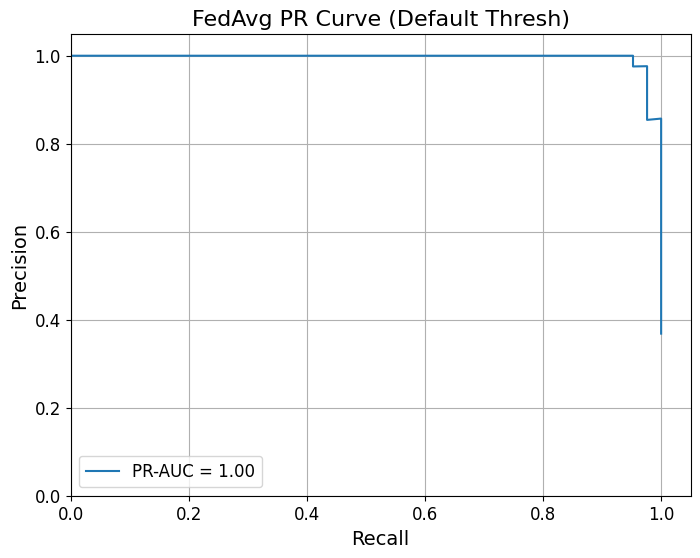


  Evaluating FedAvg model with OPTIMIZED threshold (0.35):
    Accuracy: 0.9825
    Balanced Accuracy: 0.9812
    Precision: 0.9762
    Recall: 0.9762
    F1: 0.9762
    F2: 0.9762
    Macro F1: 0.9812
    ROC-AUC: 0.9974
    PR-AUC: 0.9960
    MCC: 0.9623
    Sensitivity: 0.9762
    Specificity: 0.9861
    Confusion Matrix Counts: TP=41, TN=71, FP=1, FN=1


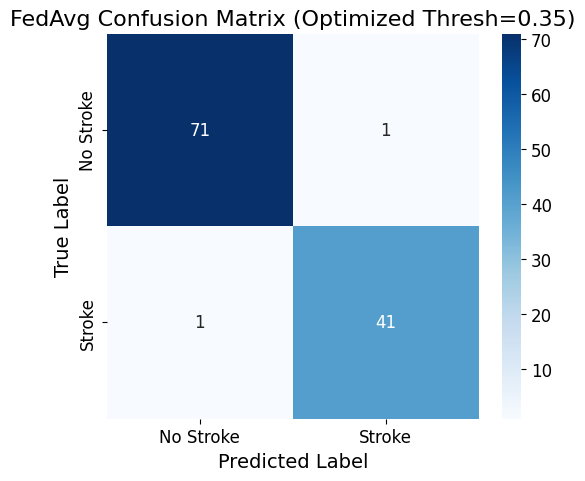

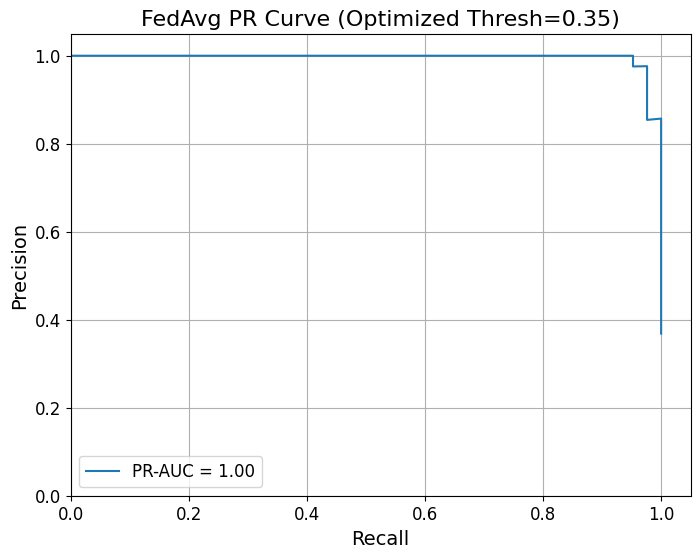


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=113, Pos=40, Neg=73, Pos %=35.40%, Imbalance Ratio=1.82
      Client 2: Size=40, Pos=18, Neg=22, Pos %=45.00%, Imbalance Ratio=1.22
      Client 3: Size=31, Pos=10, Neg=21, Pos %=32.26%, Imbalance Ratio=2.10
      Client 4: Size=62, Pos=22, Neg=40, Pos %=35.48%, Imbalance Ratio=1.82
      Client 5: Size=209, Pos=80, Neg=129, Pos %=38.28%, Imbalance Ratio=1.61
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['35.40%', '45.00%', '32.26%', '35.48%', '38.28%']
  Client Imbalance Ratios: ['1.82

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


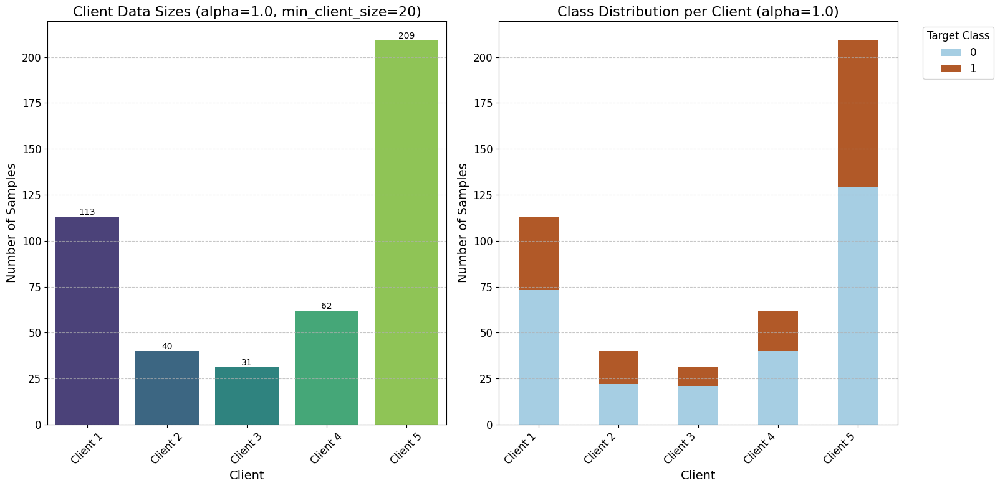

  Class weights applied: [0.79824561 1.33823529]
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCEWithLogitsLoss with pos_weight=1.34
  Using BCE

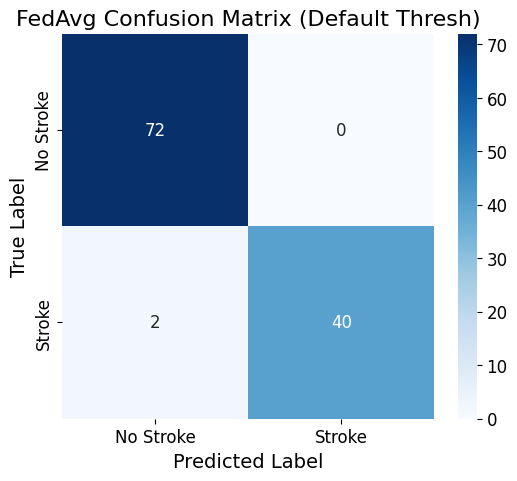

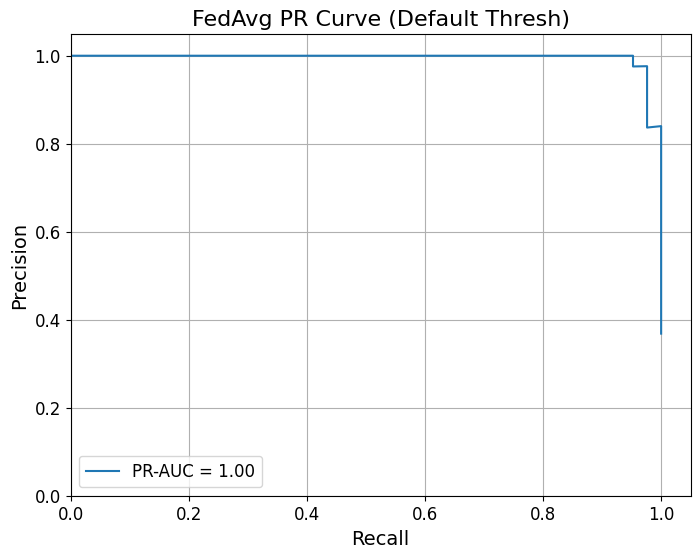


  Evaluating FedAvg model with OPTIMIZED threshold (0.26):
    Accuracy: 0.9825
    Balanced Accuracy: 0.9812
    Precision: 0.9762
    Recall: 0.9762
    F1: 0.9762
    F2: 0.9762
    Macro F1: 0.9812
    ROC-AUC: 0.9970
    PR-AUC: 0.9956
    MCC: 0.9623
    Sensitivity: 0.9762
    Specificity: 0.9861
    Confusion Matrix Counts: TP=41, TN=71, FP=1, FN=1


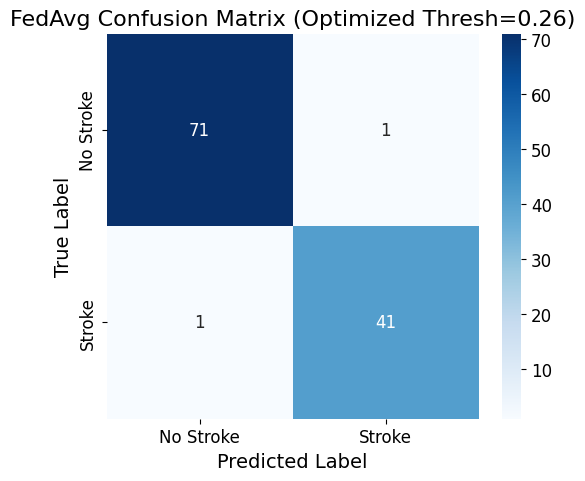

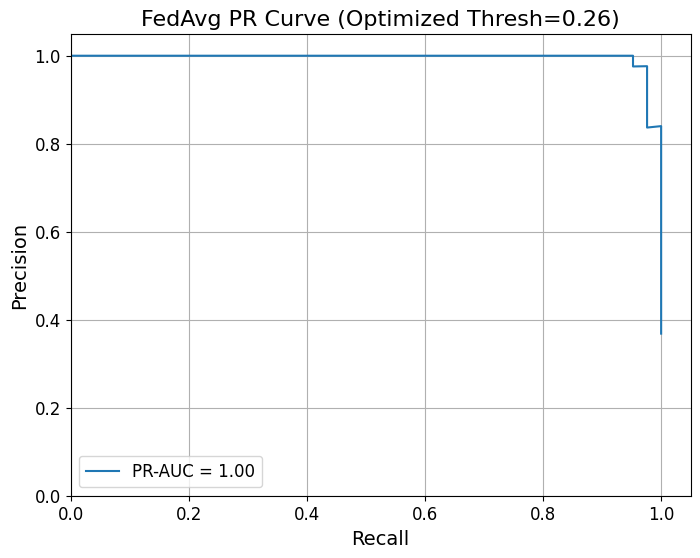

  [MASTER] Captured ablation results for breast_cancer

################################################################################
PROCESSING DATASET:                                    KIDNEY                                   
################################################################################

Starting multi-seed CV benchmark for: Kidney

--- Loading and Preprocessing Dataset: Kidney ---
Dataset 'kidney' loaded and preprocessed: X.shape=(400, 822), input_dim=822

--- Imbalance Report for Kidney ---
  Dataset: kidney
  Total Samples: 400
  Positive Samples (Target=1): 250
  Negative Samples (Target=0): 150
  Positive Percentage: 62.50%
  Negative Percentage: 37.50%
  Imbalance Ratio (Neg:Pos): 0.60
  Target Mean: 0.6250
---------------------------------------

***** [MULTI-SEED] Running Seed 1/1: 42 *****

Starting Cross-Validation for Kidney, Seed 42
Random seeds set for reproducibility (Seed: 42).

--- Running benchmark for Kidney, Seed 42, Repetition 1, Fold 1 --

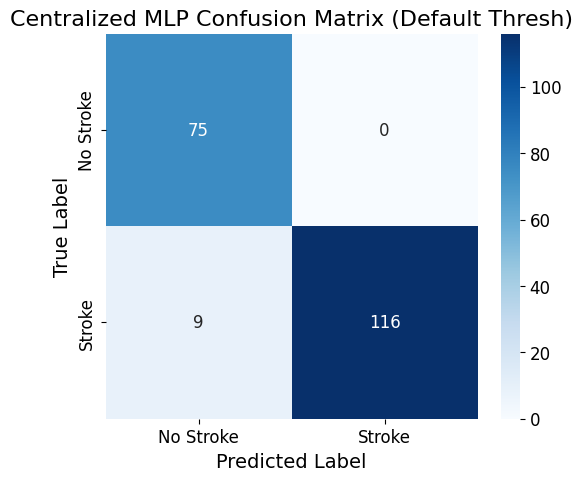

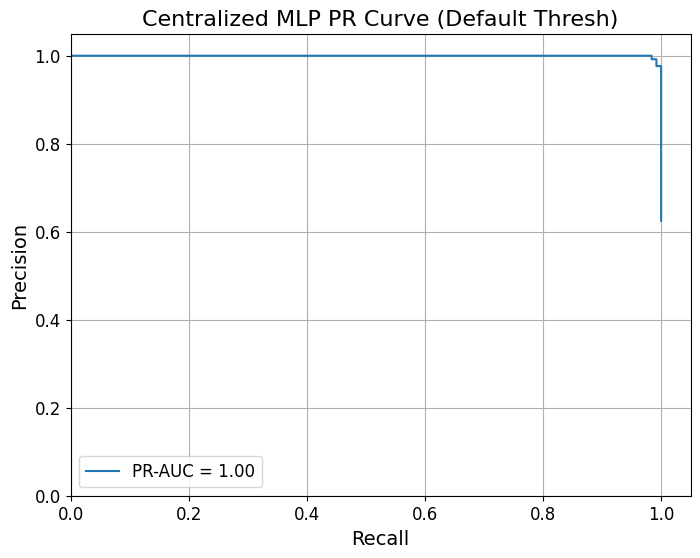

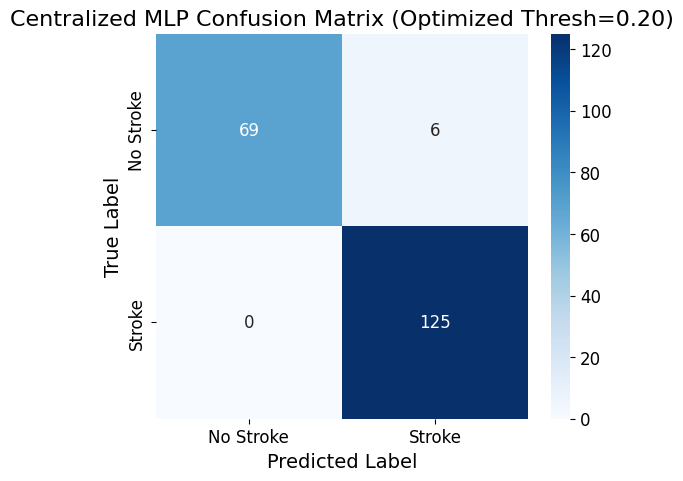

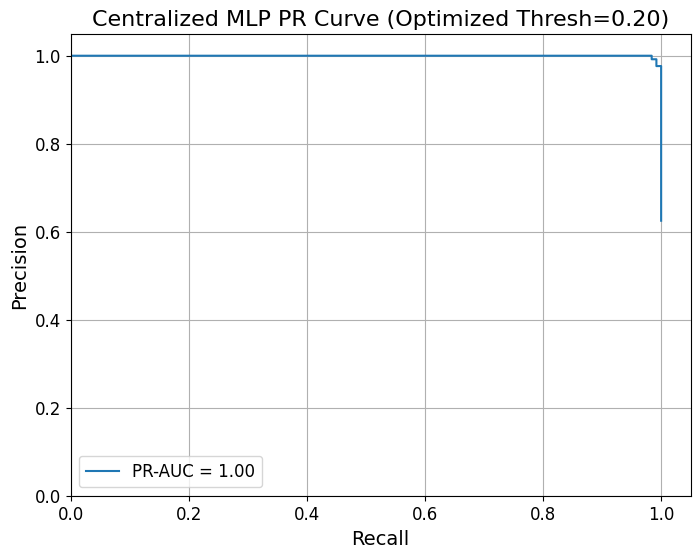


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 3/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 3 rebalance rounds:
      Client 1: Size=44, Pos=29, Neg=15, Pos %=65.91%, Imbalance Ratio=0.52
      Client 2: Size=76, Pos=52, Neg=24, Pos %=68.42%, Imbalance Ratio=0.46
      Client 3: Size=23, Pos=11, Neg=12, Pos %=47.83%, Imbalance Ratio=1.09
      Client 4: Size=37, Pos=23, Neg=14, Pos %=62.16%, Imbalance Ratio=0.61
      Client 5: Size=20, Pos=10, Neg=10, Pos %=50.00%, Imbalance Ratio=1.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


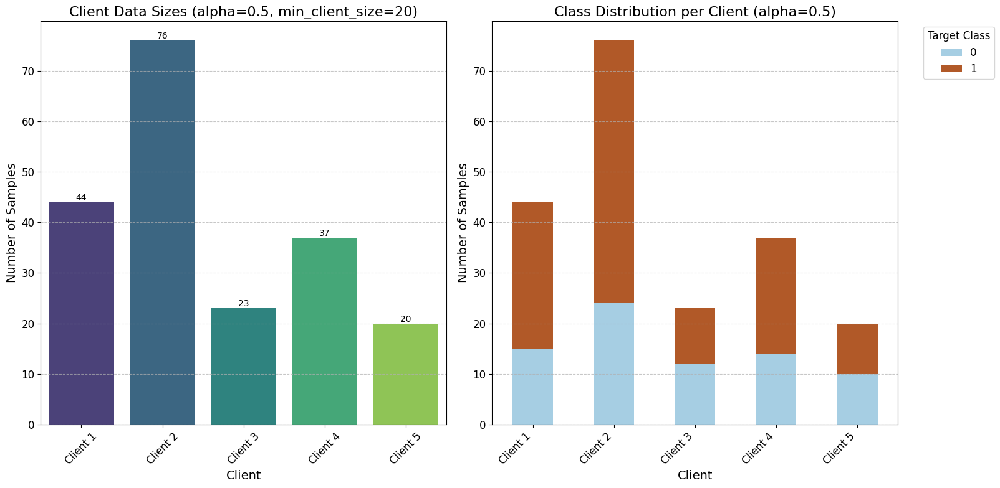

  Class weights applied: [1.33333333 0.8       ]
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCE

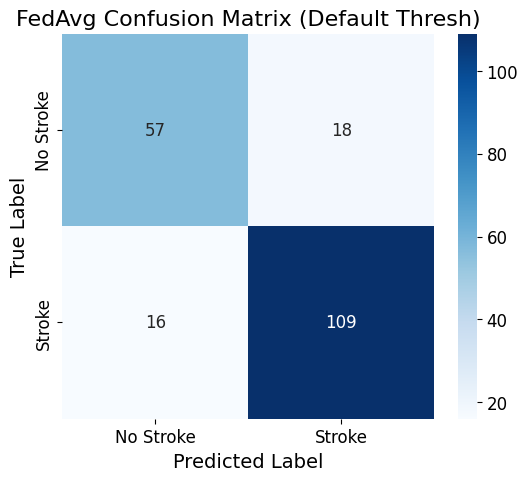

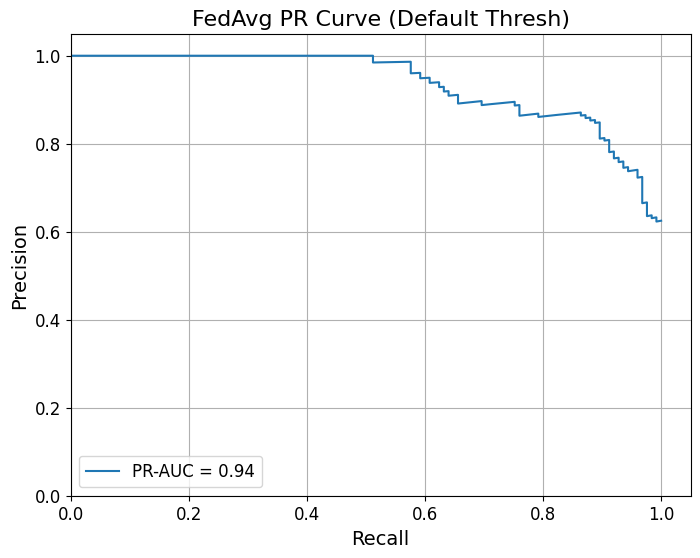


  Evaluating FedAvg model with OPTIMIZED threshold (0.50):
    Accuracy: 0.8300
    Balanced Accuracy: 0.8160
    Precision: 0.8583
    Recall: 0.8720
    F1: 0.8651
    F2: 0.8692
    Macro F1: 0.8177
    ROC-AUC: 0.8845
    PR-AUC: 0.9360
    MCC: 0.6355
    Sensitivity: 0.8720
    Specificity: 0.7600
    Confusion Matrix Counts: TP=109, TN=57, FP=18, FN=16


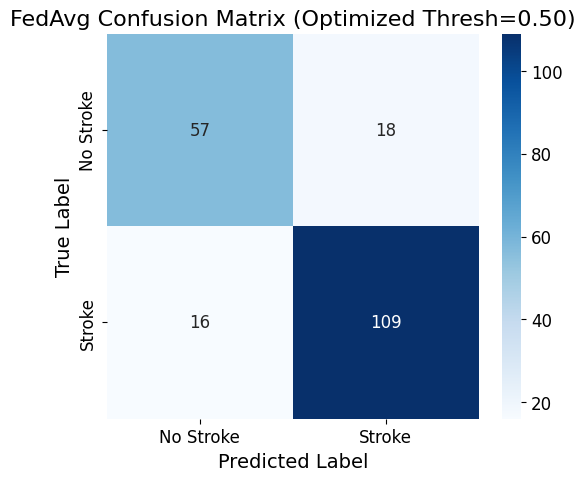

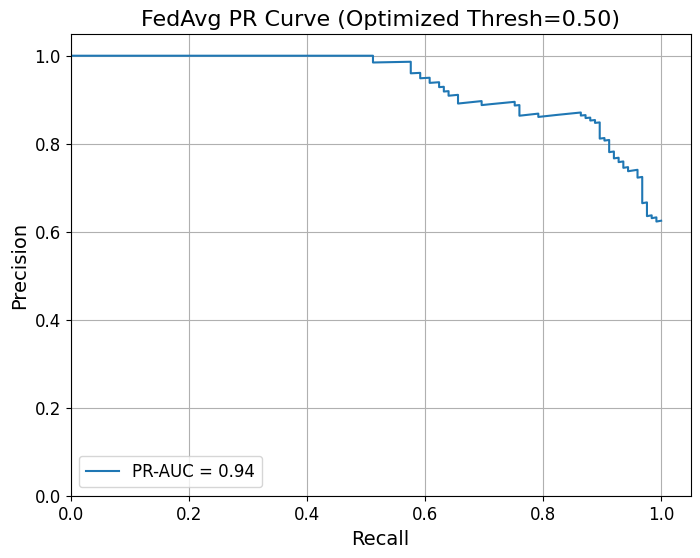


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 3/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 3 rebalance rounds:
      Client 1: Size=44, Pos=29, Neg=15, Pos %=65.91%, Imbalance Ratio=0.52
      Client 2: Size=76, Pos=52, Neg=24, Pos %=68.42%, Imbalance Ratio=0.46
      Client 3: Size=23, Pos=11, Neg=12, Pos %=47.83%, Imbalance Ratio=1.09
      Client 4: Size=37, Pos=23, Neg=14, Pos %=62.16%, Imbalance Ratio=0.61
      Client 5: Size=20, Pos=10, Neg=10, Pos %=50.00%, Imbalance Ratio=1.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (too

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


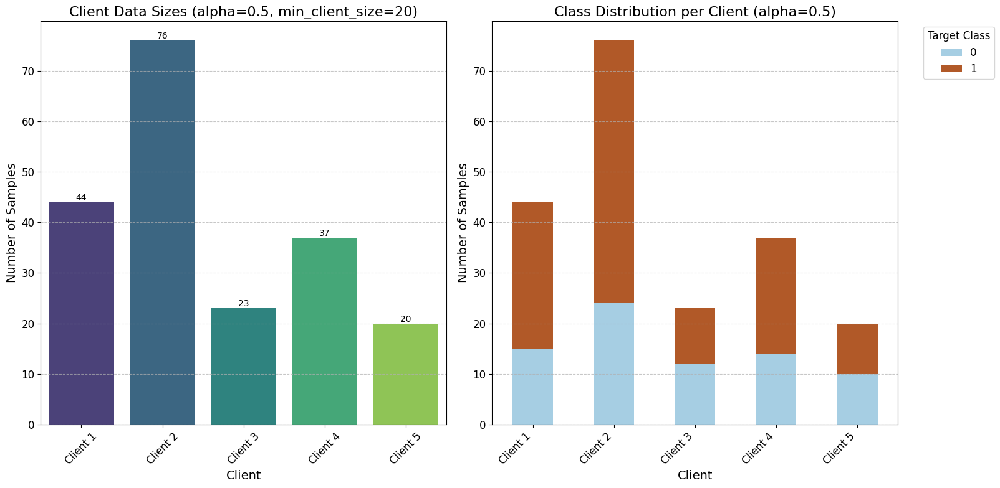

  Class weights applied: [1.33333333 0.8       ]
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCE

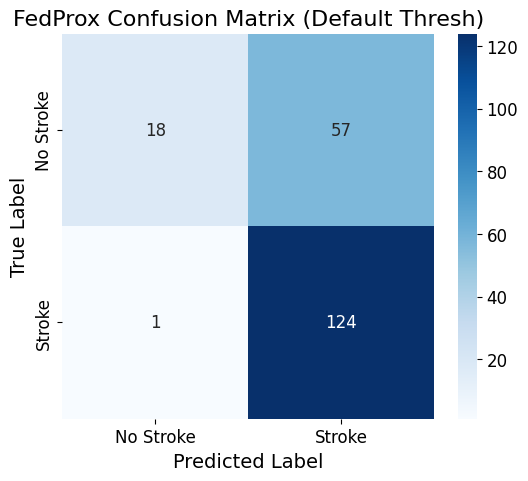

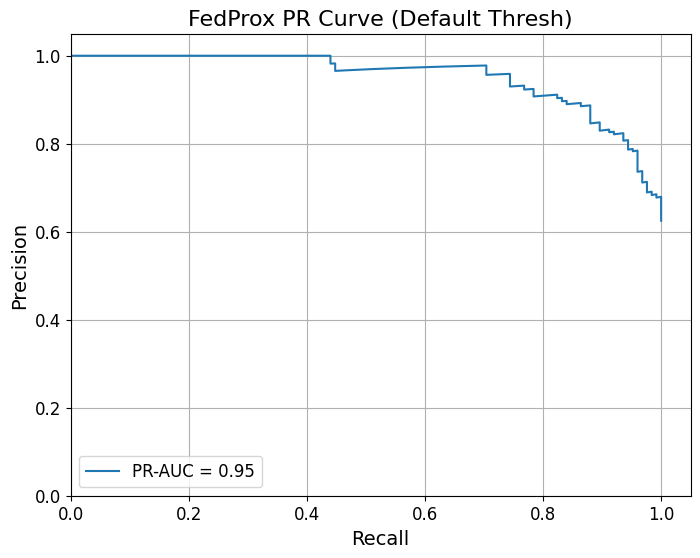


  Evaluating FedProx model with OPTIMIZED threshold (0.52):
    Accuracy: 0.8250
    Balanced Accuracy: 0.7853
    Precision: 0.8082
    Recall: 0.9440
    F1: 0.8708
    F2: 0.9133
    Macro F1: 0.7998
    ROC-AUC: 0.9170
    PR-AUC: 0.9525
    MCC: 0.6223
    Sensitivity: 0.9440
    Specificity: 0.6267
    Confusion Matrix Counts: TP=118, TN=47, FP=28, FN=7


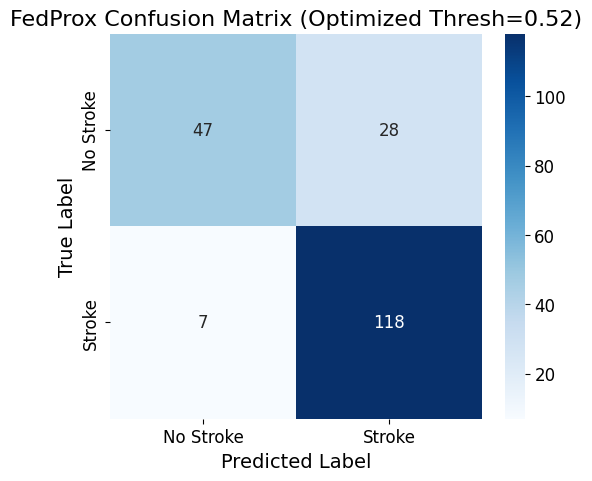

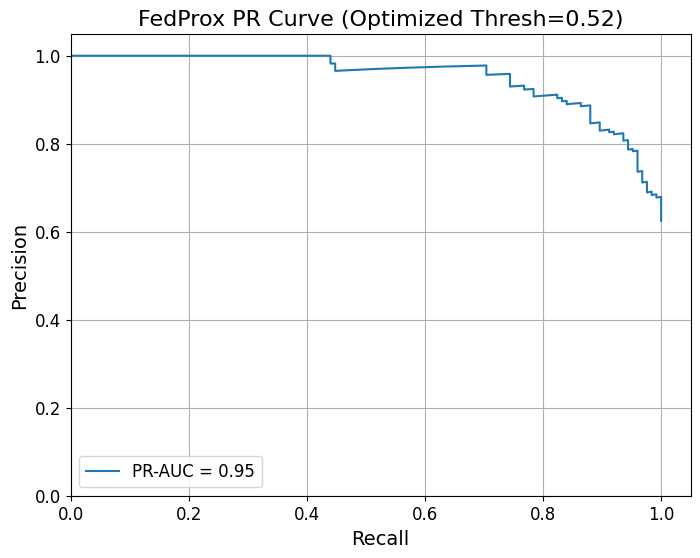


--- Running benchmark for Kidney, Seed 42, Repetition 1, Fold 2 ---
Random seeds set for reproducibility (Seed: 42).
  Effective parameters for kidney: Num Clients=5, Alpha Values=[0.5], Min Client Size=20, Min Positive=5

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [1.33333333 0.8       ]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=0.80
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.8372 (Mode=f1), F1=0.8372, F2=0.9278, Recall=1.0000, Balanced Acc=0.7083
      Threshold 0.06: Opt_Metric=0.8372 (Mode=f1), F1=0.8372, F2=0.9278, Recall=1.0000, Balanced Acc=0.7083
      Threshold 0.07: Opt_Metric=0.8372 (Mode=f1), F1=0.8372, F2=0.9278, Recall=1.0000, Balanced Acc=0.7083
      Threshold 0.08: Opt_Metric=0.8372 (Mode=f1), F1=0.8372, F2=0.9278, Recall=1.0000, Balanced Acc=0.7083
      Thresho

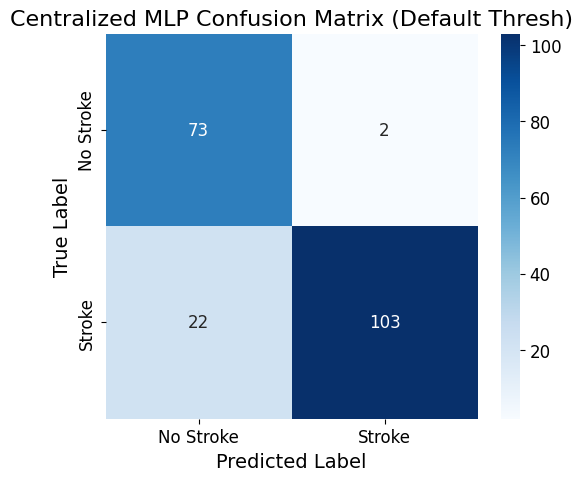

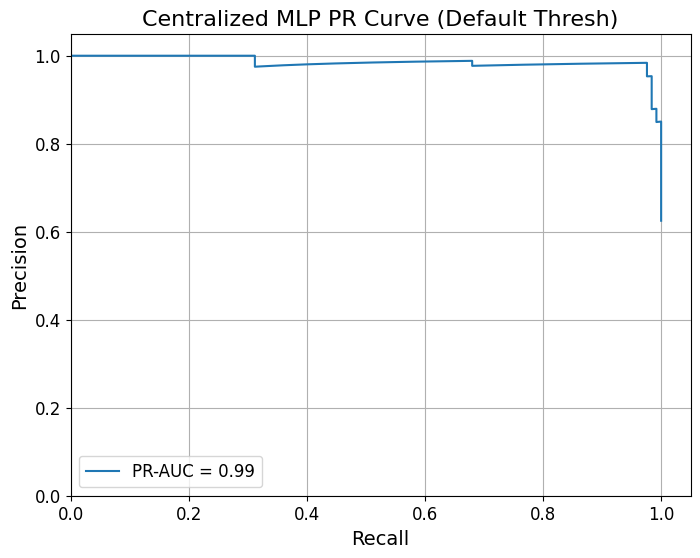

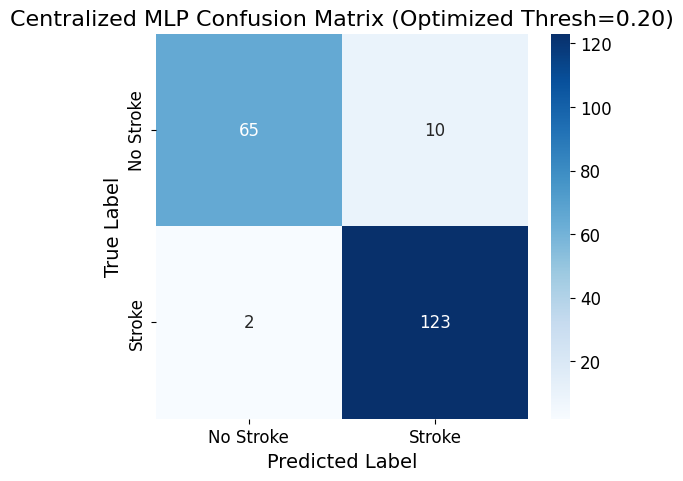

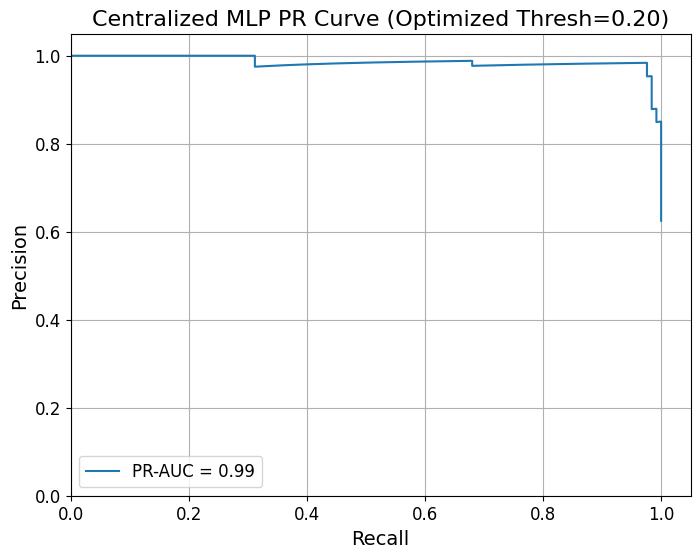


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 3/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 3 rebalance rounds:
      Client 1: Size=44, Pos=29, Neg=15, Pos %=65.91%, Imbalance Ratio=0.52
      Client 2: Size=76, Pos=52, Neg=24, Pos %=68.42%, Imbalance Ratio=0.46
      Client 3: Size=23, Pos=11, Neg=12, Pos %=47.83%, Imbalance Ratio=1.09
      Client 4: Size=37, Pos=23, Neg=14, Pos %=62.16%, Imbalance Ratio=0.61
      Client 5: Size=20, Pos=10, Neg=10, Pos %=50.00%, Imbalance Ratio=1.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


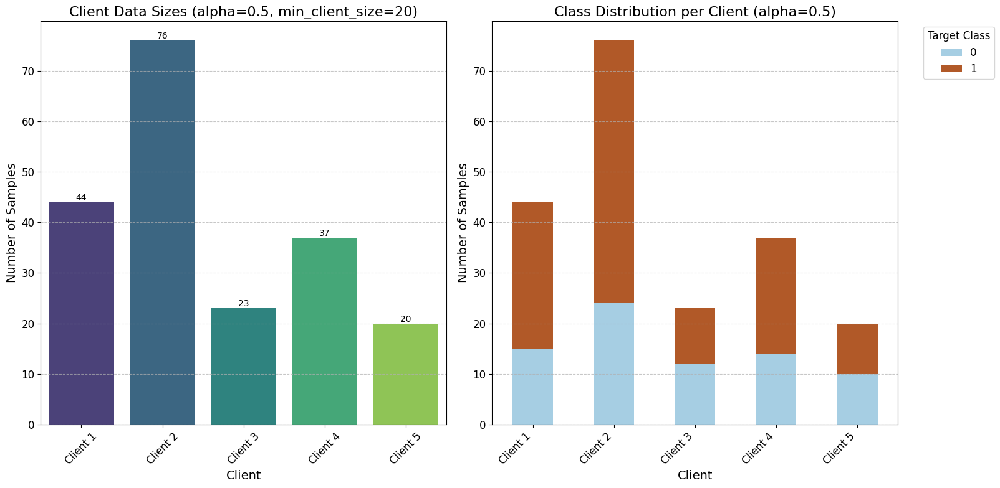

  Class weights applied: [1.33333333 0.8       ]
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCE

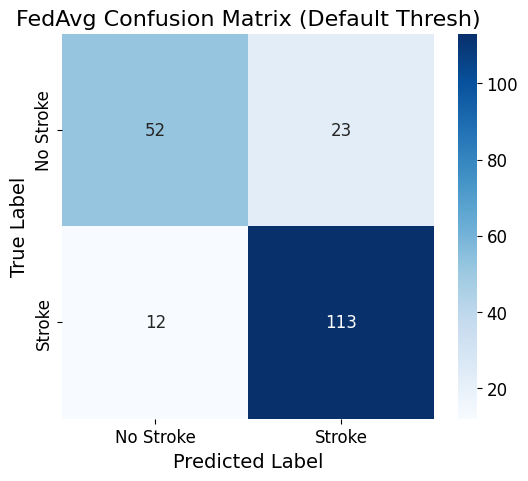

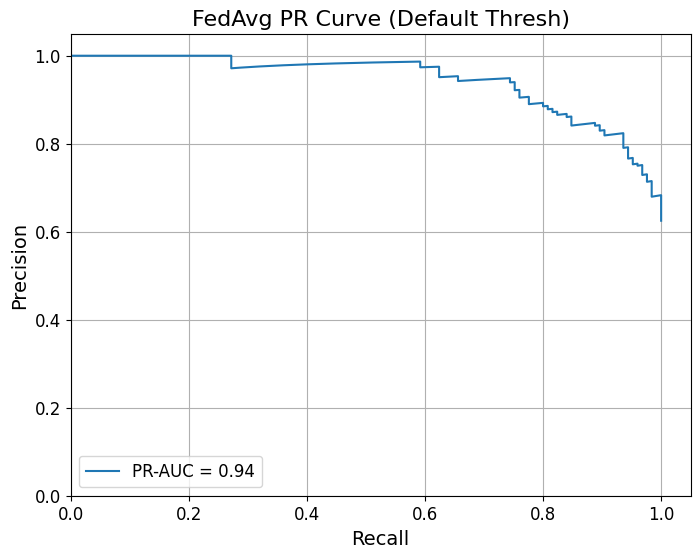


  Evaluating FedAvg model with OPTIMIZED threshold (0.50):
    Accuracy: 0.8250
    Balanced Accuracy: 0.7987
    Precision: 0.8309
    Recall: 0.9040
    F1: 0.8659
    F2: 0.8884
    Macro F1: 0.8071
    ROC-AUC: 0.9061
    PR-AUC: 0.9441
    MCC: 0.6199
    Sensitivity: 0.9040
    Specificity: 0.6933
    Confusion Matrix Counts: TP=113, TN=52, FP=23, FN=12


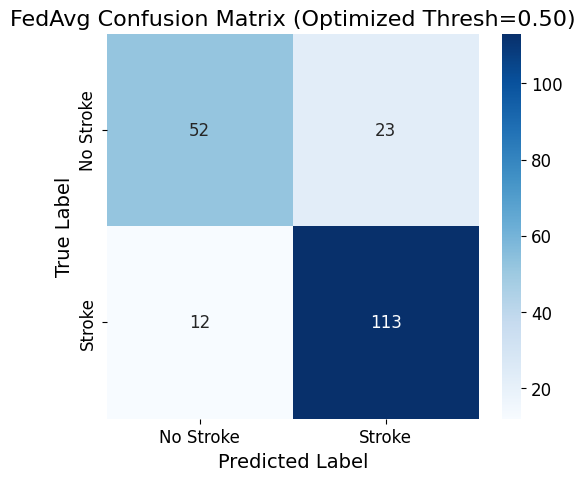

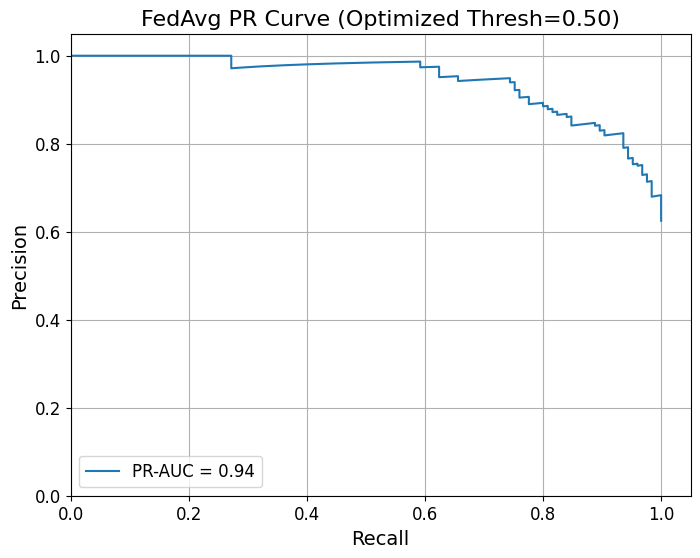


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 3/50:
        Moved 5 samples from client 2 to client 3
    Validating partition after 3 rebalance rounds:
      Client 1: Size=44, Pos=29, Neg=15, Pos %=65.91%, Imbalance Ratio=0.52
      Client 2: Size=76, Pos=52, Neg=24, Pos %=68.42%, Imbalance Ratio=0.46
      Client 3: Size=23, Pos=11, Neg=12, Pos %=47.83%, Imbalance Ratio=1.09
      Client 4: Size=37, Pos=23, Neg=14, Pos %=62.16%, Imbalance Ratio=0.61
      Client 5: Size=20, Pos=10, Neg=10, Pos %=50.00%, Imbalance Ratio=1.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (too

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


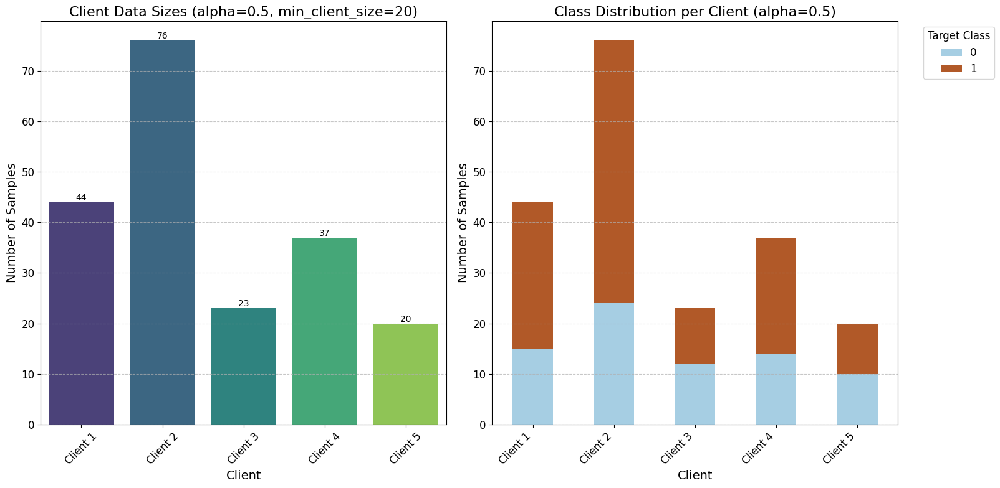

  Class weights applied: [1.33333333 0.8       ]
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCE

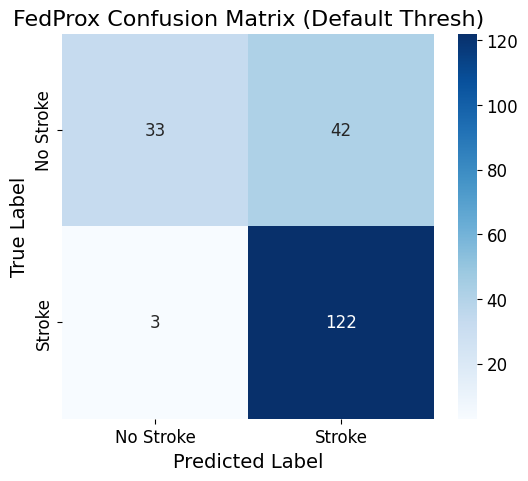

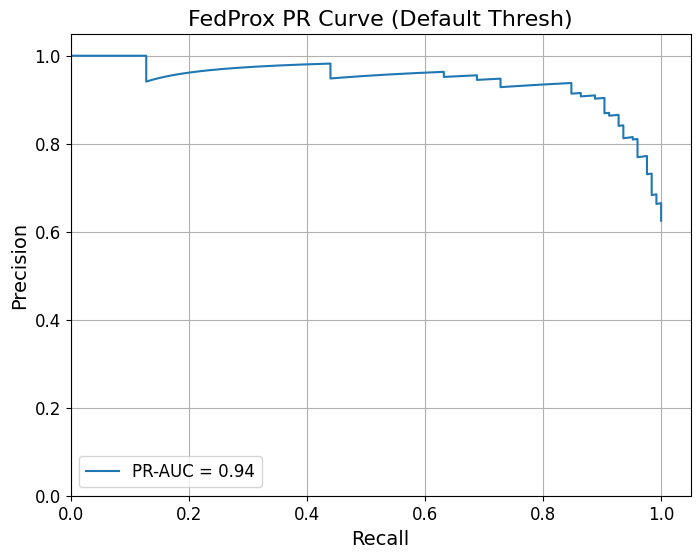


  Evaluating FedProx model with OPTIMIZED threshold (0.52):
    Accuracy: 0.8600
    Balanced Accuracy: 0.8427
    Precision: 0.8702
    Recall: 0.9120
    F1: 0.8906
    F2: 0.9033
    Macro F1: 0.8481
    ROC-AUC: 0.9211
    PR-AUC: 0.9447
    MCC: 0.6980
    Sensitivity: 0.9120
    Specificity: 0.7733
    Confusion Matrix Counts: TP=114, TN=58, FP=17, FN=11


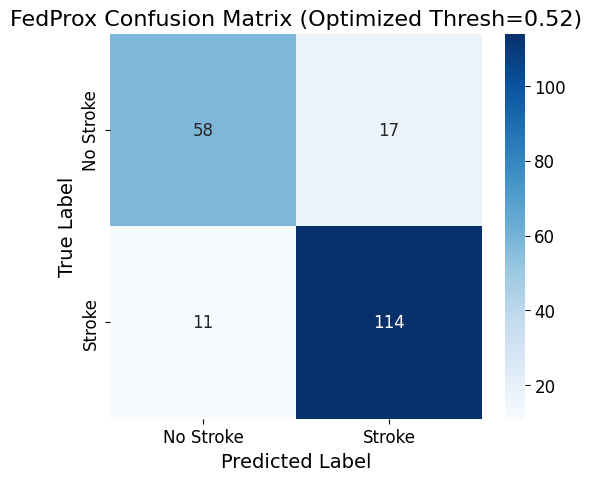

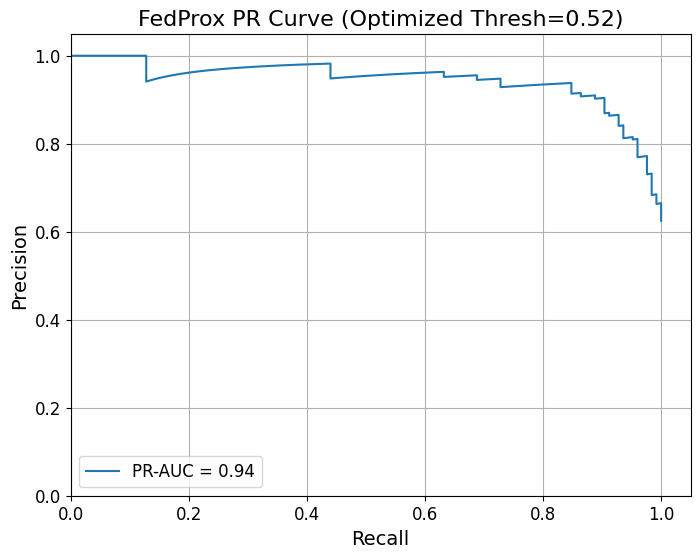

  [MULTI-SEED] Seed 42 success: 12 result rows found.
[MULTI-SEED] Successfully aggregated 0 metric rows for kidney.
  [MASTER] WARNING: No CV results captured for kidney

--- Starting Local Epoch Ablation for kidney (FedAvg) ---

--- Loading and Preprocessing Dataset: Kidney ---
Dataset 'kidney' loaded and preprocessed: X.shape=(400, 822), input_dim=822

Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 2 to client 5
    Validating partition after 2 rebalance rounds:
      Client 1: Size=74, Pos=53, Neg=21, Pos %=71.62%, Imbalance Ratio=0.40
      Client 2: Size=134, Pos=86, Neg=48, Pos %=64.18%, Imbalance Ratio=0.56
      Client 3: Size=36, Pos=15, N

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


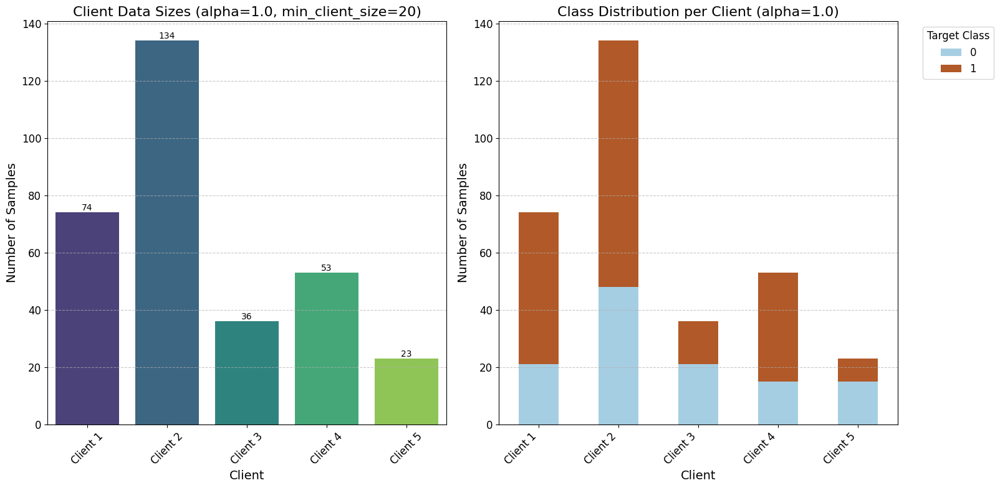

  Class weights applied: [1.33333333 0.8       ]
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCE

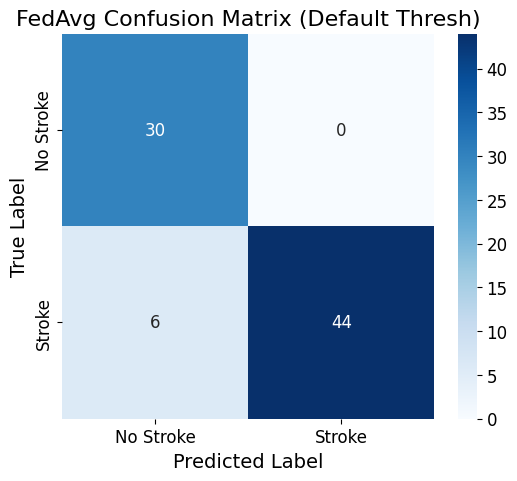

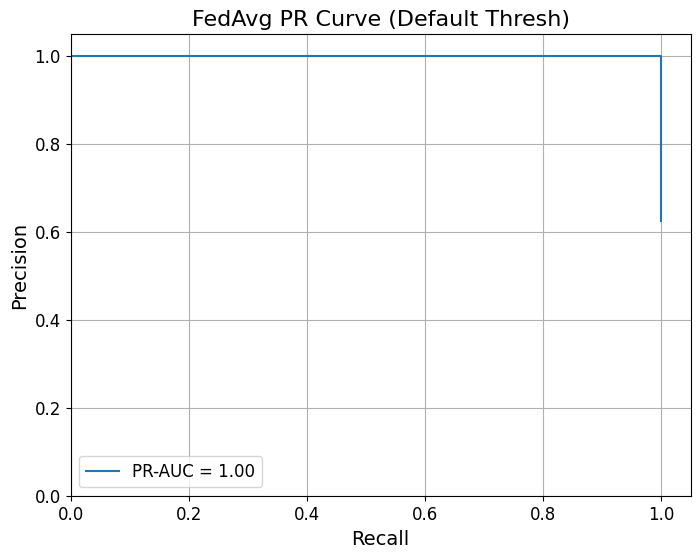


  Evaluating FedAvg model with OPTIMIZED threshold (0.39):
    Accuracy: 1.0000
    Balanced Accuracy: 1.0000
    Precision: 1.0000
    Recall: 1.0000
    F1: 1.0000
    F2: 1.0000
    Macro F1: 1.0000
    ROC-AUC: 1.0000
    PR-AUC: 1.0000
    MCC: 1.0000
    Sensitivity: 1.0000
    Specificity: 1.0000
    Confusion Matrix Counts: TP=50, TN=30, FP=0, FN=0


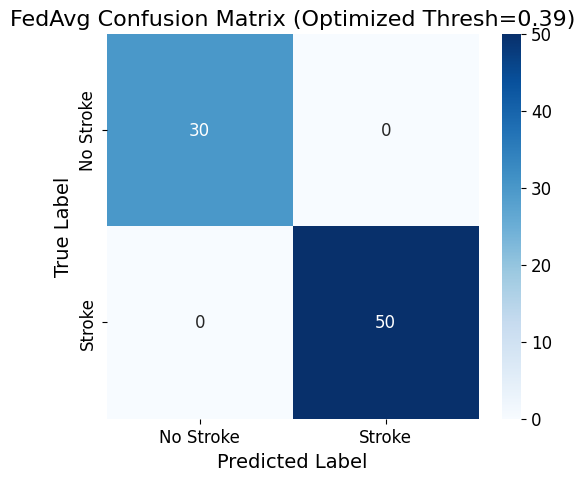

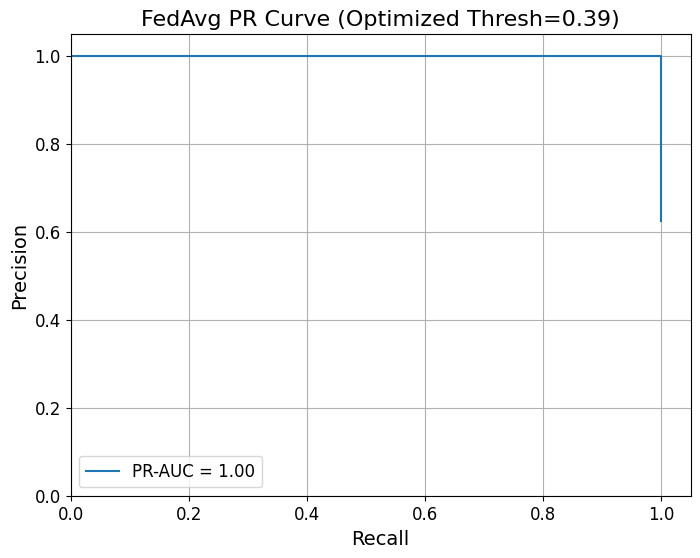


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 2 to client 5
    Validating partition after 2 rebalance rounds:
      Client 1: Size=74, Pos=53, Neg=21, Pos %=71.62%, Imbalance Ratio=0.40
      Client 2: Size=134, Pos=86, Neg=48, Pos %=64.18%, Imbalance Ratio=0.56
      Client 3: Size=36, Pos=15, Neg=21, Pos %=41.67%, Imbalance Ratio=1.40
      Client 4: Size=53, Pos=38, Neg=15, Pos %=71.70%, Imbalance Ratio=0.39
      Client 5: Size=23, Pos=8, Neg=15, Pos %=34.78%, Imbalance Ratio=1.88
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 2 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: Tr

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


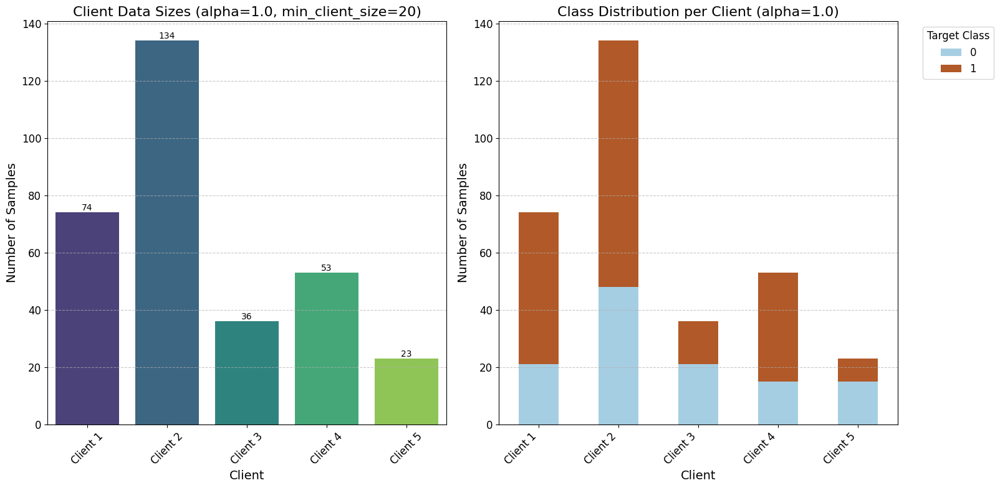

  Class weights applied: [1.33333333 0.8       ]
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCE

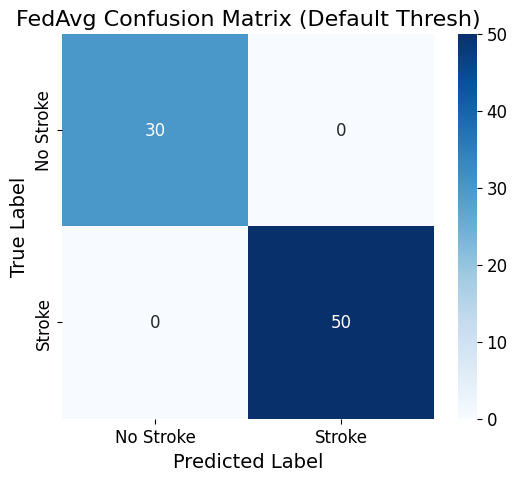

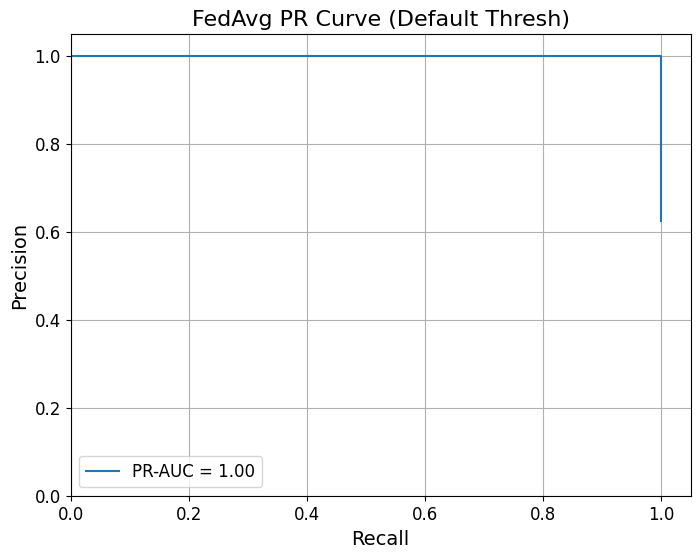


  Evaluating FedAvg model with OPTIMIZED threshold (0.30):
    Accuracy: 1.0000
    Balanced Accuracy: 1.0000
    Precision: 1.0000
    Recall: 1.0000
    F1: 1.0000
    F2: 1.0000
    Macro F1: 1.0000
    ROC-AUC: 1.0000
    PR-AUC: 1.0000
    MCC: 1.0000
    Sensitivity: 1.0000
    Specificity: 1.0000
    Confusion Matrix Counts: TP=50, TN=30, FP=0, FN=0


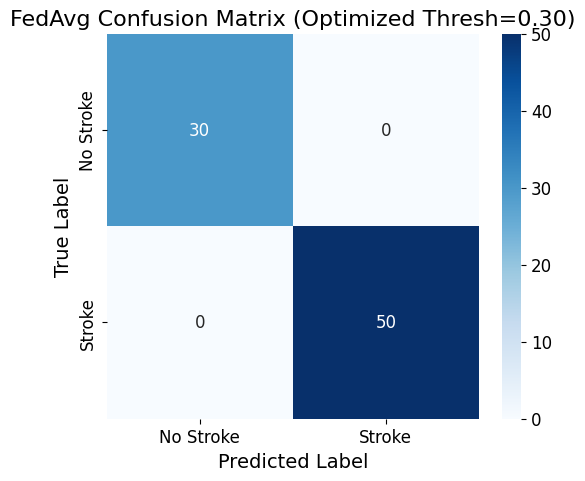

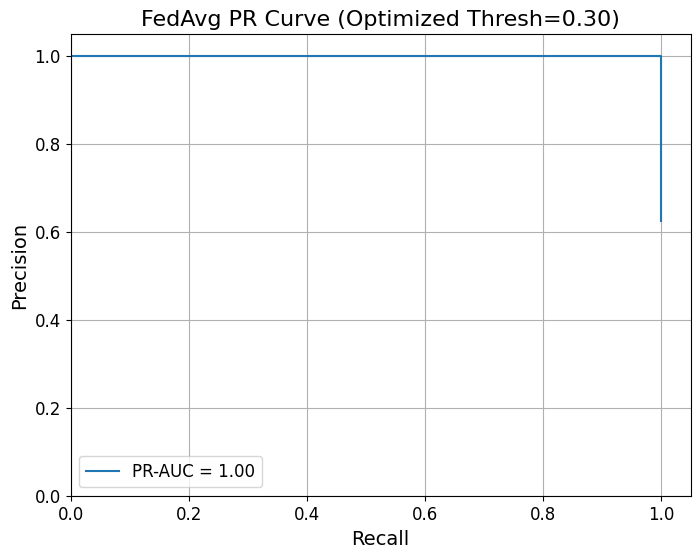


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 2 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 2 to client 5
    Validating partition after 2 rebalance rounds:
      Client 1: Size=74, Pos=53, Neg=21, Pos %=71.62%, Imbalance Ratio=0.40
      Client 2: Size=134, Pos=86, Neg=48, Pos %=64.18%, Imbalance Ratio=0.56
      Client 3: Size=36, Pos=15, Neg=21, Pos %=41.67%, Imbalance Ratio=1.40
      Client 4: Size=53, Pos=38, Neg=15, Pos %=71.70%, Imbalance Ratio=0.39
      Client 5: Size=23, Pos=8, Neg=15, Pos %=34.78%, Imbalance Ratio=1.88
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 2 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: Tr

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


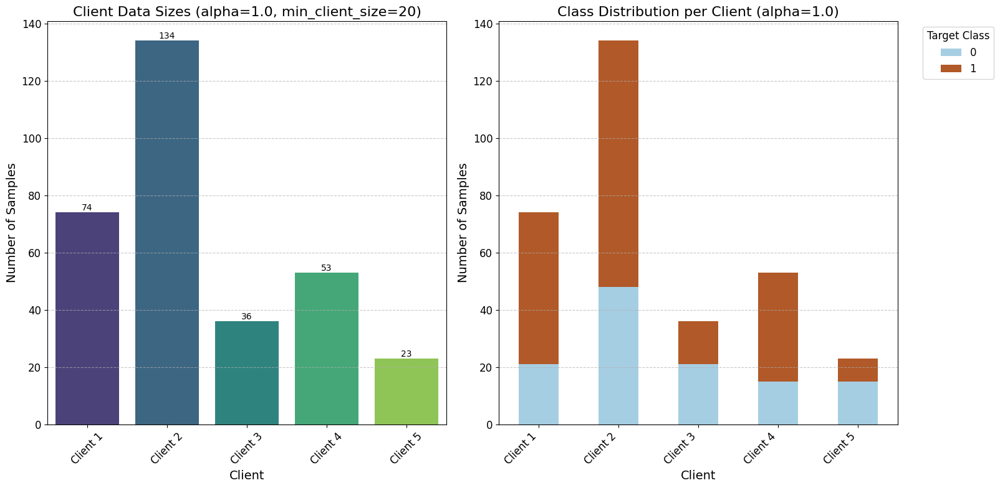

  Class weights applied: [1.33333333 0.8       ]
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCEWithLogitsLoss with pos_weight=0.80
  Using BCE

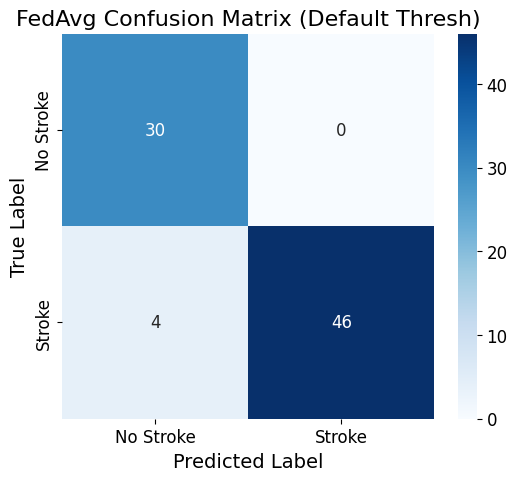

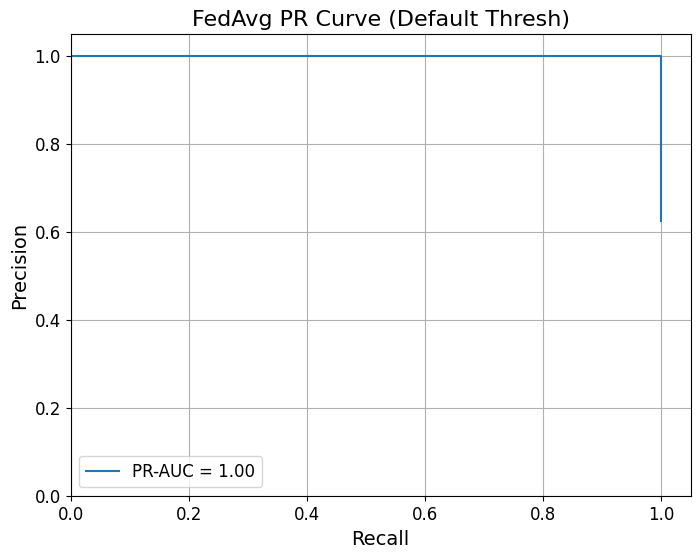


  Evaluating FedAvg model with OPTIMIZED threshold (0.18):
    Accuracy: 1.0000
    Balanced Accuracy: 1.0000
    Precision: 1.0000
    Recall: 1.0000
    F1: 1.0000
    F2: 1.0000
    Macro F1: 1.0000
    ROC-AUC: 1.0000
    PR-AUC: 1.0000
    MCC: 1.0000
    Sensitivity: 1.0000
    Specificity: 1.0000
    Confusion Matrix Counts: TP=50, TN=30, FP=0, FN=0


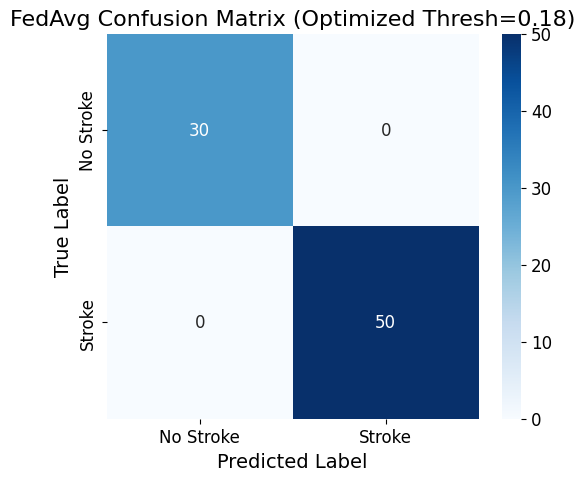

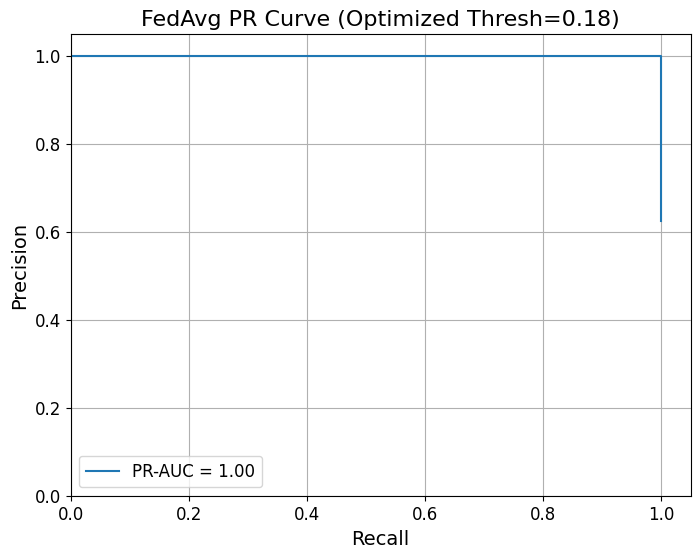

  [MASTER] Captured ablation results for kidney

################################################################################
PROCESSING DATASET:                                    STROKE                                   
################################################################################

Starting multi-seed CV benchmark for: Stroke

--- Loading and Preprocessing Dataset: Stroke ---
Dataset 'stroke' loaded and preprocessed: X.shape=(5109, 15), input_dim=15

--- Stroke Dataset Class Distribution ---
Total Samples: 5109
Positive Samples (Stroke): 249
Negative Samples (No Stroke): 4860
Positive Percentage: 4.87%
Negative Percentage: 95.13%
Imbalance Ratio (Negative:Positive): 19.52
-----------------------------------------

--- Imbalance Report for Stroke ---
  Dataset: stroke
  Total Samples: 5109
  Positive Samples (Target=1): 249
  Negative Samples (Target=0): 4860
  Positive Percentage: 4.87%
  Negative Percentage: 95.13%
  Imbalance Ratio (Neg:Pos): 19.52
  Target 

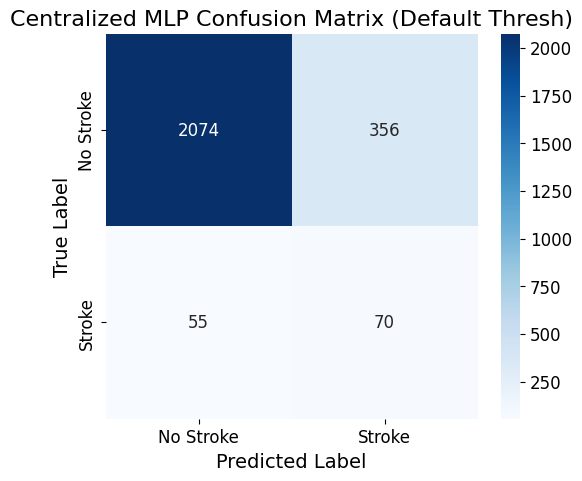

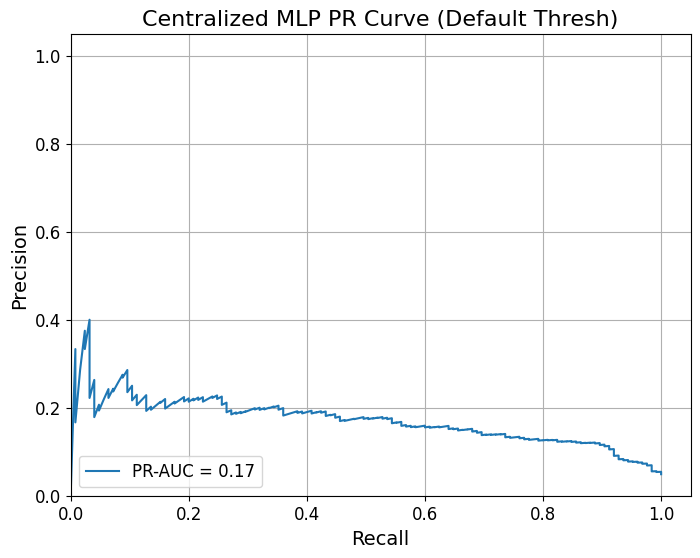

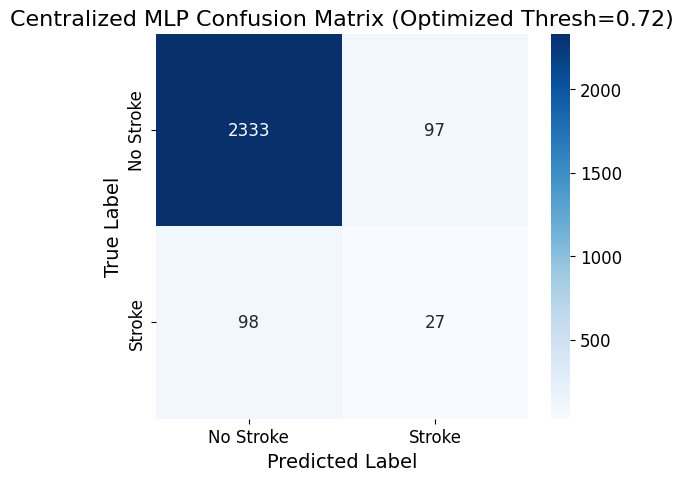

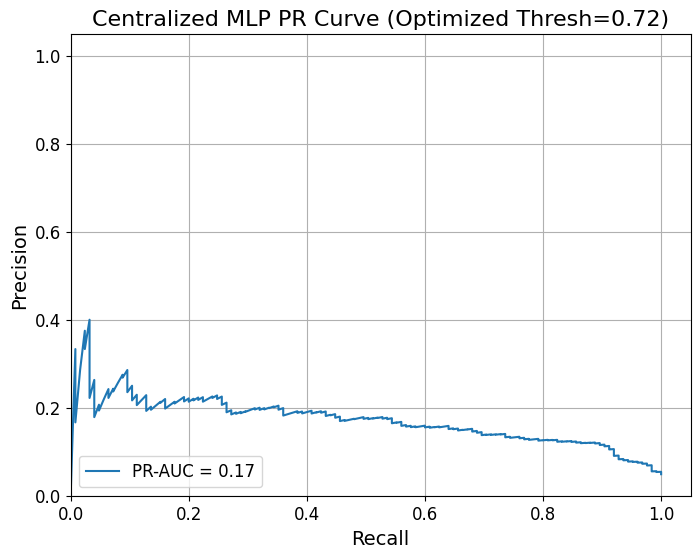


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 1 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 1 to client 5
    Validating partition after 2 rebalance rounds:
      Client 1: Size=959, Pos=43, Neg=916, Pos %=4.48%, Imbalance Ratio=21.30
      Client 2: Size=848, Pos=37, Neg=811, Pos %=4.36%, Imbalance Ratio=21.92
      Client 3: Size=217, Pos=15, Neg=202, Pos %=6.91%, Imbalance Ratio=13.47
      Client 4: Size=510, Pos=24, Neg=486, Pos %=4.71%, Imbalance Ratio=20.25
      Client 5: Size=20, Pos=5, Neg=15, Pos %=25.00%, Imbalance Ratio=3.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 2 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing trigge

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


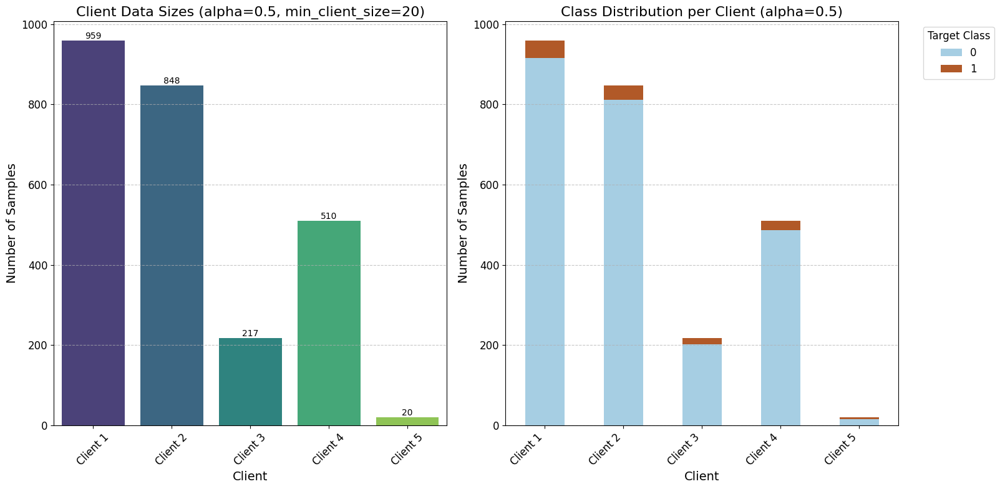

  Class weights applied: [ 0.5255144 10.2983871]
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weig

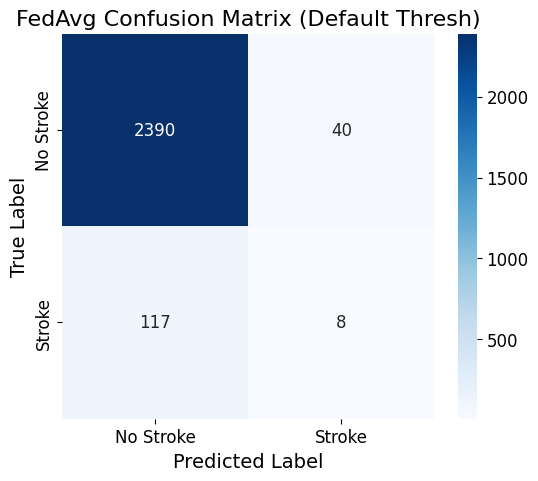

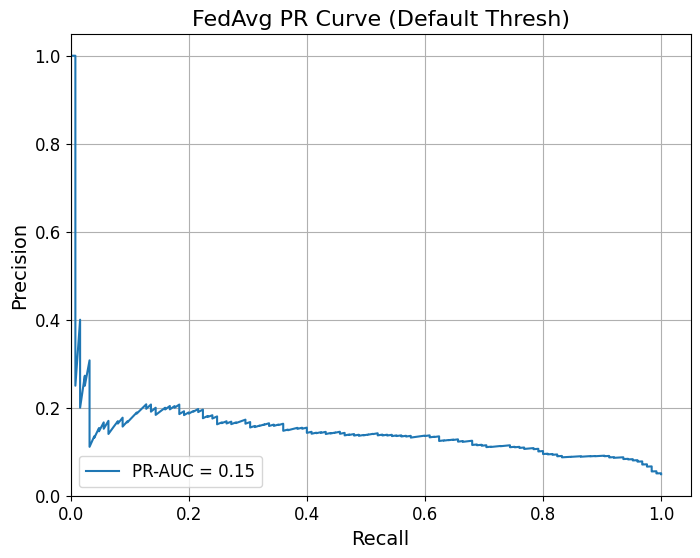


  Evaluating FedAvg model with OPTIMIZED threshold (0.35):
    Accuracy: 0.7886
    Balanced Accuracy: 0.7030
    Precision: 0.1340
    Recall: 0.6080
    F1: 0.2197
    F2: 0.3561
    Macro F1: 0.5487
    ROC-AUC: 0.7880
    PR-AUC: 0.1489
    MCC: 0.2107
    Sensitivity: 0.6080
    Specificity: 0.7979
    Confusion Matrix Counts: TP=76, TN=1939, FP=491, FN=49


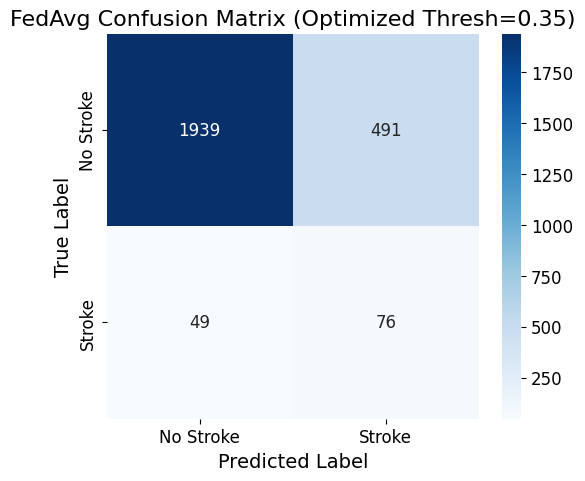

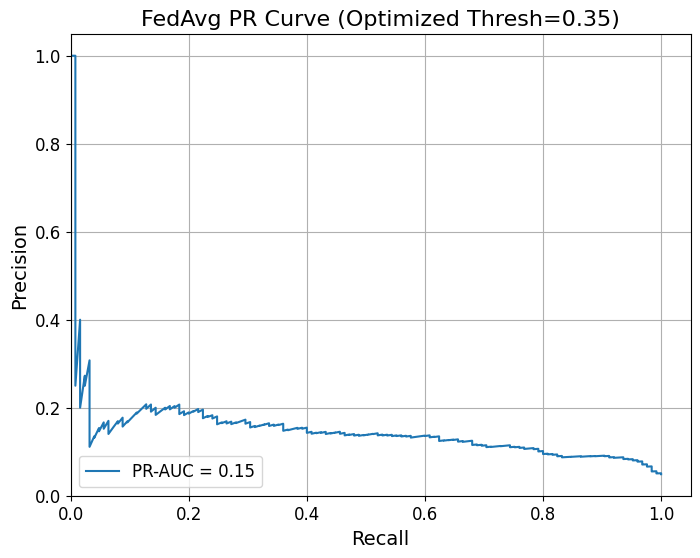


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 1 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 1 to client 5
    Validating partition after 2 rebalance rounds:
      Client 1: Size=959, Pos=43, Neg=916, Pos %=4.48%, Imbalance Ratio=21.30
      Client 2: Size=848, Pos=37, Neg=811, Pos %=4.36%, Imbalance Ratio=21.92
      Client 3: Size=217, Pos=15, Neg=202, Pos %=6.91%, Imbalance Ratio=13.47
      Client 4: Size=510, Pos=24, Neg=486, Pos %=4.71%, Imbalance Ratio=20.25
      Client 5: Size=20, Pos=5, Neg=15, Pos %=25.00%, Imbalance Ratio=3.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 2 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing trig

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


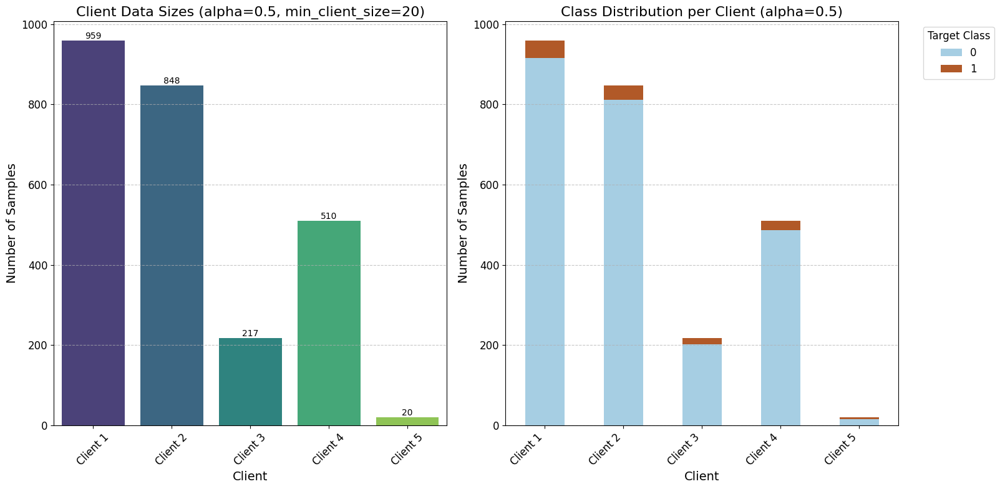

  Class weights applied: [ 0.5255144 10.2983871]
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weight=10.30
  Using BCEWithLogitsLoss with pos_weig

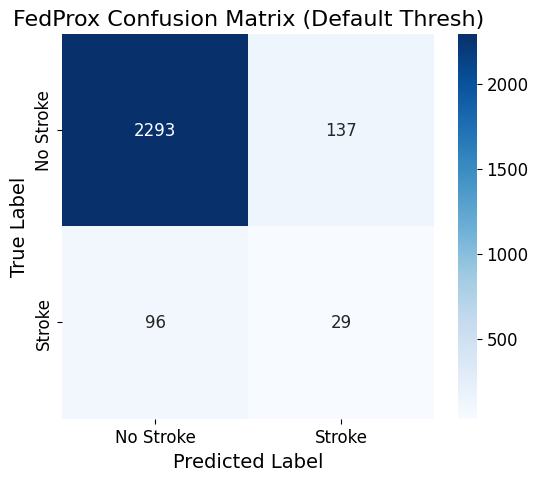

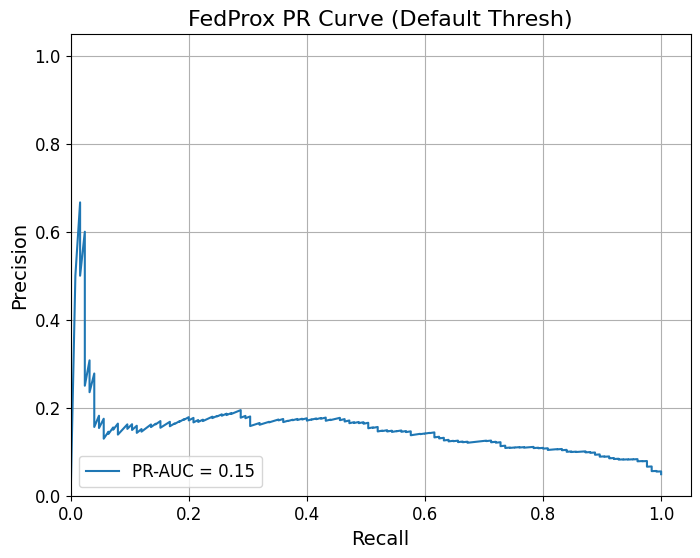


  Evaluating FedProx model with OPTIMIZED threshold (0.35):
    Accuracy: 0.7930
    Balanced Accuracy: 0.7090
    Precision: 0.1380
    Recall: 0.6160
    F1: 0.2255
    F2: 0.3639
    Macro F1: 0.5530
    ROC-AUC: 0.7999
    PR-AUC: 0.1545
    MCC: 0.2183
    Sensitivity: 0.6160
    Specificity: 0.8021
    Confusion Matrix Counts: TP=77, TN=1949, FP=481, FN=48


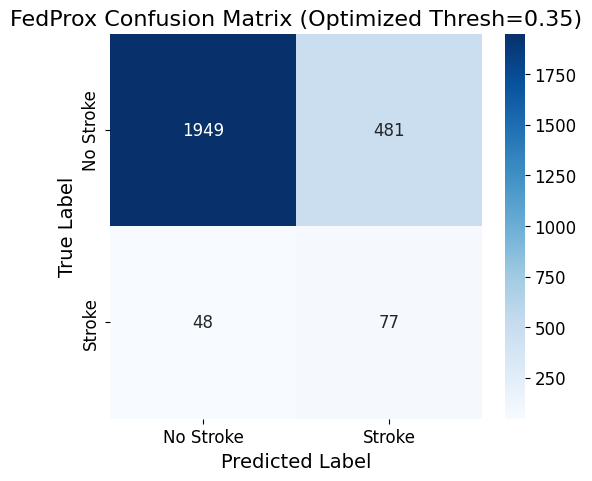

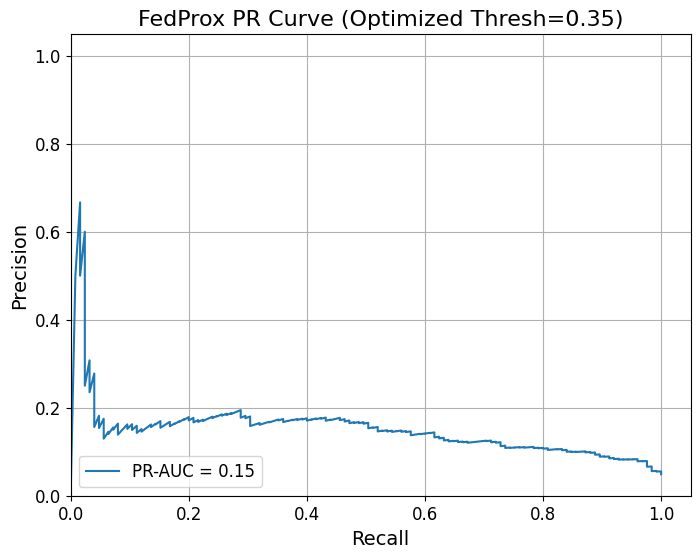


--- Running benchmark for Stroke, Seed 42, Repetition 1, Fold 2 ---
Random seeds set for reproducibility (Seed: 42).
  Effective parameters for stroke: Num Clients=5, Alpha Values=[0.5], Min Client Size=20, Min Positive=5

--- Starting Centralized MLP Training ---
  Centralized Training Class weights applied: [ 0.52572016 10.22      ]
  Centralized Training Loss function: BCEWithLogitsLoss with pos_weight=10.22
  Starting threshold optimization based on 'f1' on validation set (Min Recall: 0.00)...
    Threshold candidates evaluated on validation set:
      Threshold 0.05: Opt_Metric=0.1131 (Mode=f1), F1=0.1131, F2=0.2417, Recall=1.0000, Balanced Acc=0.6590
      Threshold 0.06: Opt_Metric=0.1087 (Mode=f1), F1=0.1087, F2=0.2315, Recall=0.9375, Balanced Acc=0.6359
      Threshold 0.07: Opt_Metric=0.1132 (Mode=f1), F1=0.1132, F2=0.2396, Recall=0.9375, Balanced Acc=0.6508
      Threshold 0.08: Opt_Metric=0.1154 (Mode=f1), F1=0.1154, F2=0.2435, Recall=0.9375, Balanced Acc=0.6576
      Thre

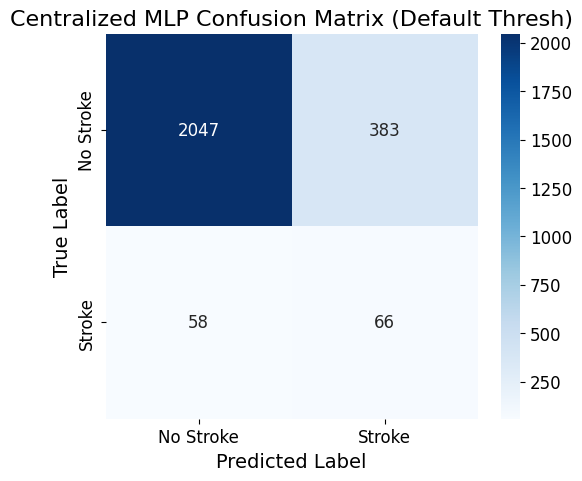

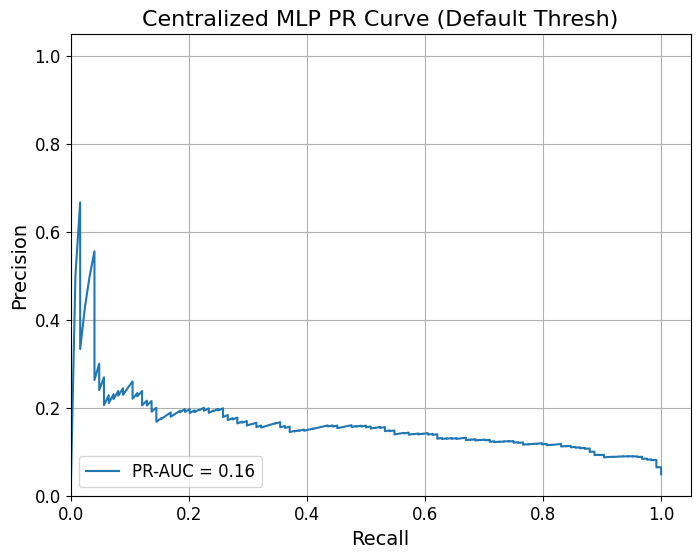

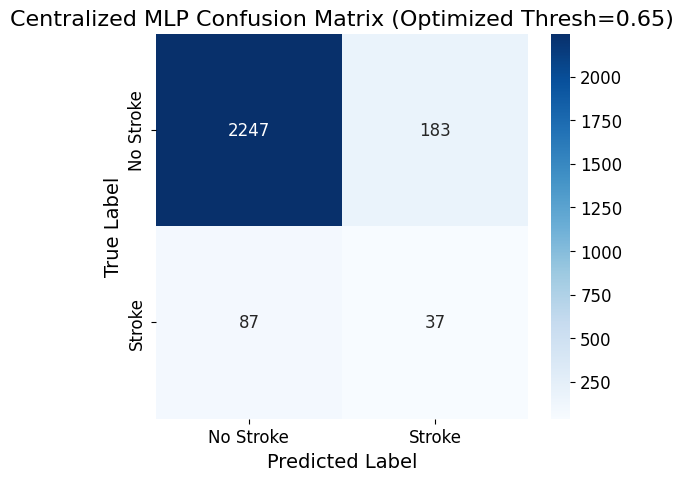

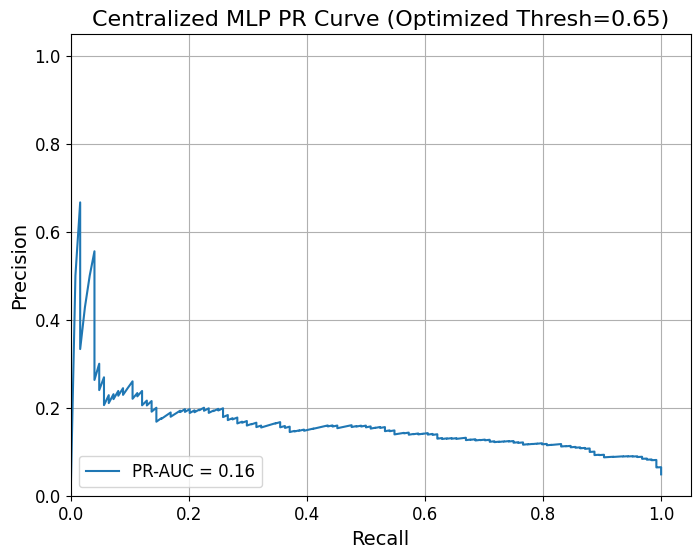


Starting FedAvg (Alpha=0.5, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 1 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 1 to client 5
    Validating partition after 2 rebalance rounds:
      Client 1: Size=960, Pos=45, Neg=915, Pos %=4.69%, Imbalance Ratio=20.33
      Client 2: Size=848, Pos=36, Neg=812, Pos %=4.25%, Imbalance Ratio=22.56
      Client 3: Size=217, Pos=15, Neg=202, Pos %=6.91%, Imbalance Ratio=13.47
      Client 4: Size=510, Pos=24, Neg=486, Pos %=4.71%, Imbalance Ratio=20.25
      Client 5: Size=20, Pos=5, Neg=15, Pos %=25.00%, Imbalance Ratio=3.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 2 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing trigge

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


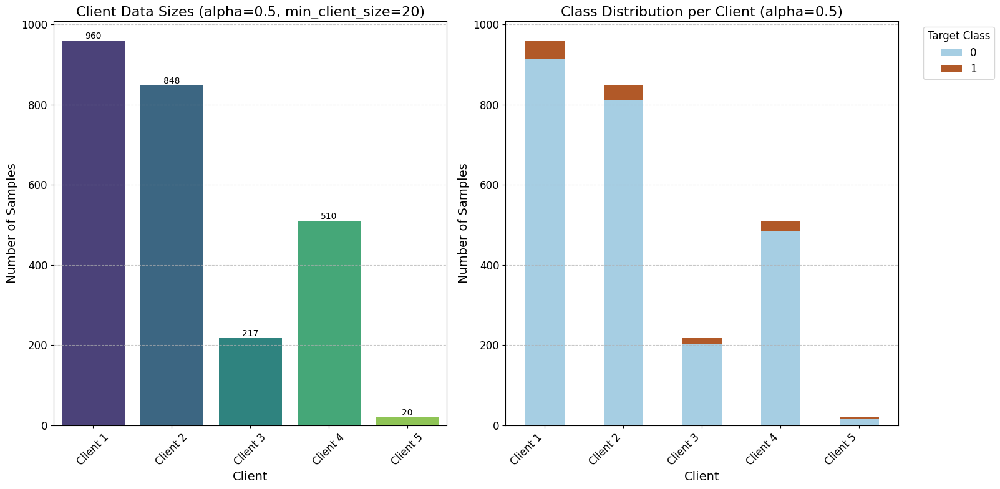

  Class weights applied: [ 0.52572016 10.22      ]
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_we

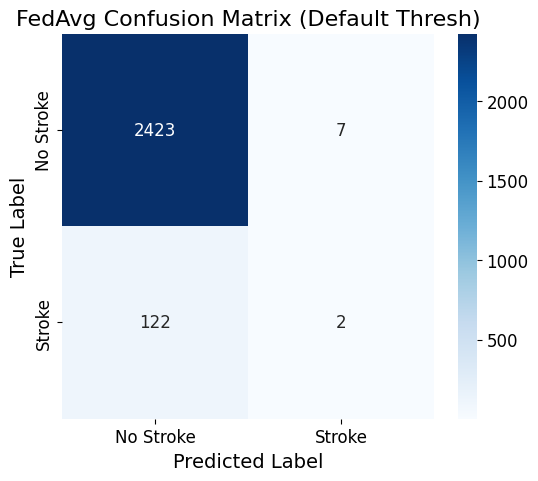

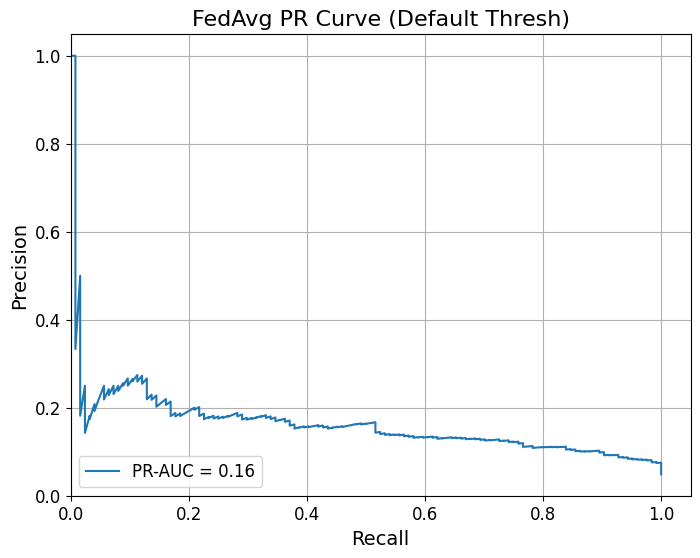


  Evaluating FedAvg model with OPTIMIZED threshold (0.32):
    Accuracy: 0.7463
    Balanced Accuracy: 0.7327
    Precision: 0.1268
    Recall: 0.7177
    F1: 0.2155
    F2: 0.3715
    Macro F1: 0.5321
    ROC-AUC: 0.8125
    PR-AUC: 0.1649
    MCC: 0.2241
    Sensitivity: 0.7177
    Specificity: 0.7477
    Confusion Matrix Counts: TP=89, TN=1817, FP=613, FN=35


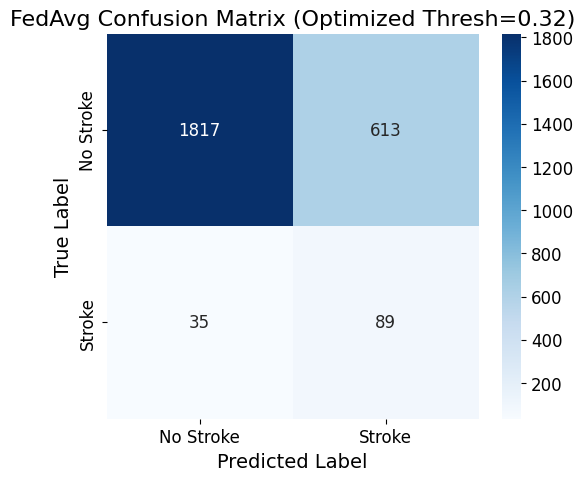

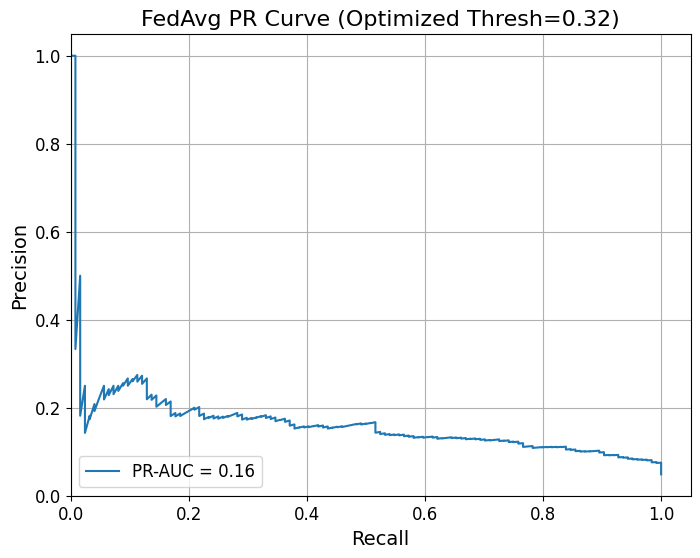


Starting FedProx (Alpha=0.5, Mu=0.01) with seed 42...

Attempting Dirichlet Partition (Alpha=0.5, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution NOT valid. Starting rebalance.
      Rebalance Round 1/50:
        Moved 5 samples from client 1 to client 5
      Rebalance Round 2/50:
        Moved 5 samples from client 1 to client 5
    Validating partition after 2 rebalance rounds:
      Client 1: Size=960, Pos=45, Neg=915, Pos %=4.69%, Imbalance Ratio=20.33
      Client 2: Size=848, Pos=36, Neg=812, Pos %=4.25%, Imbalance Ratio=22.56
      Client 3: Size=217, Pos=15, Neg=202, Pos %=6.91%, Imbalance Ratio=13.47
      Client 4: Size=510, Pos=24, Neg=486, Pos %=4.71%, Imbalance Ratio=20.25
      Client 5: Size=20, Pos=5, Neg=15, Pos %=25.00%, Imbalance Ratio=3.00
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 2 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing trig

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


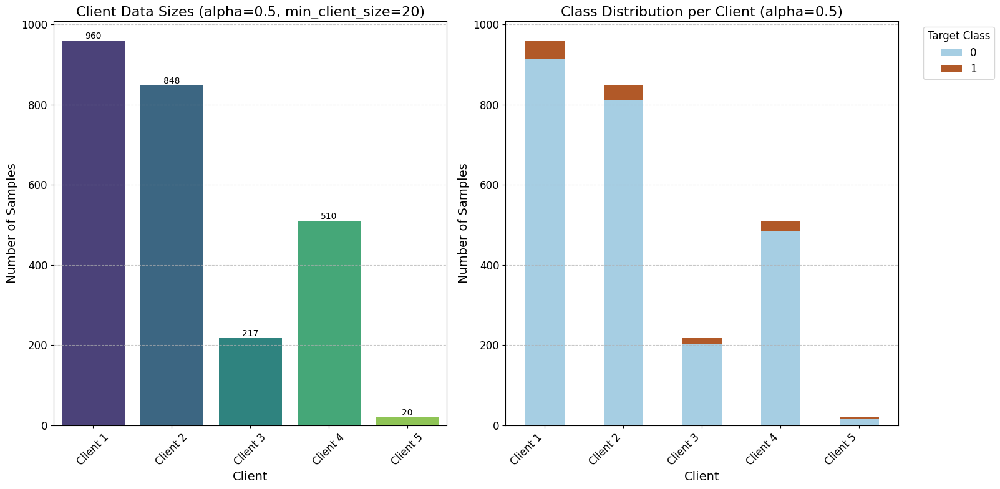

  Class weights applied: [ 0.52572016 10.22      ]
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_weight=10.22
  Using BCEWithLogitsLoss with pos_we

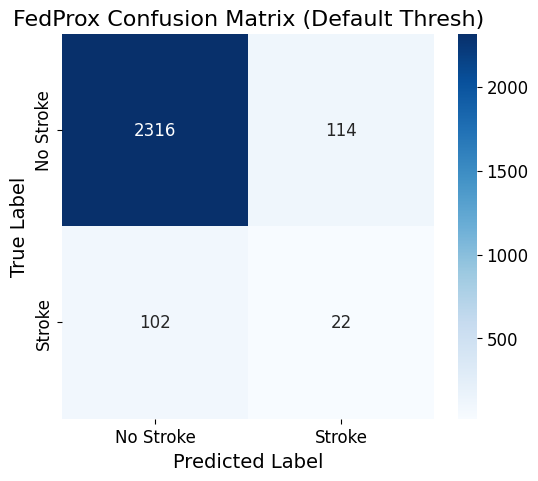

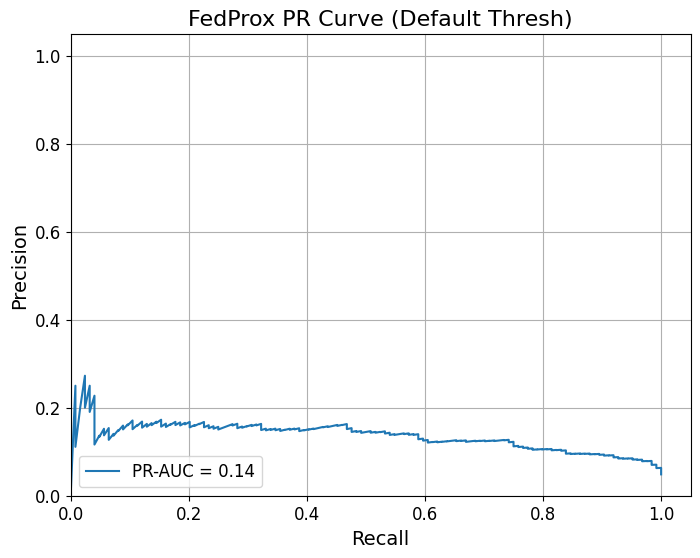


  Evaluating FedProx model with OPTIMIZED threshold (0.31):
    Accuracy: 0.7416
    Balanced Accuracy: 0.7303
    Precision: 0.1246
    Recall: 0.7177
    F1: 0.2124
    F2: 0.3678
    Macro F1: 0.5289
    ROC-AUC: 0.8003
    PR-AUC: 0.1387
    MCC: 0.2206
    Sensitivity: 0.7177
    Specificity: 0.7428
    Confusion Matrix Counts: TP=89, TN=1805, FP=625, FN=35


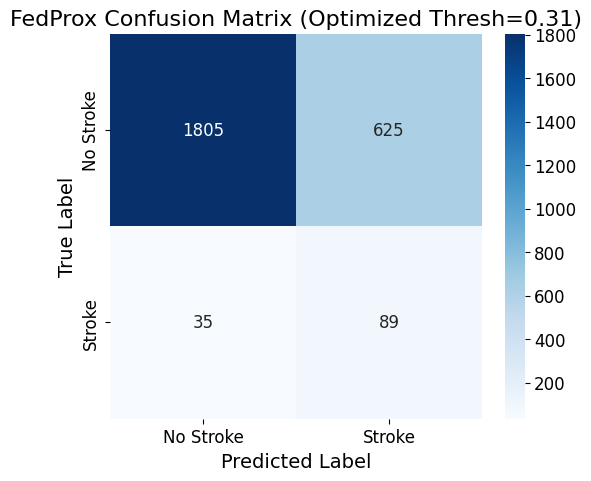

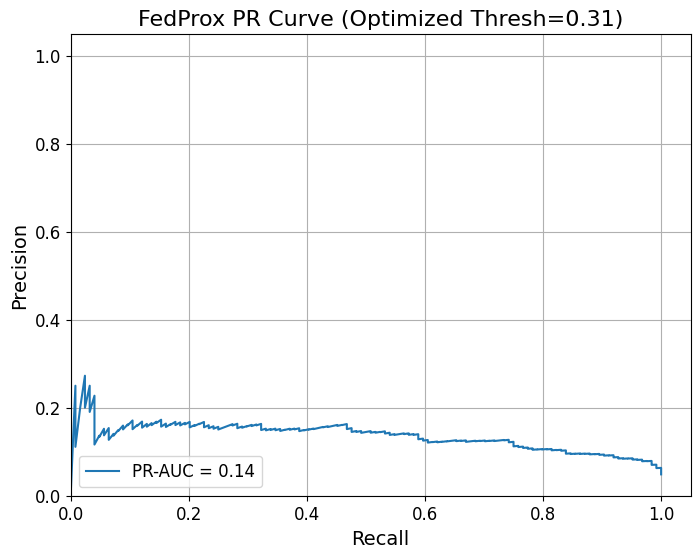

  [MULTI-SEED] Seed 42 success: 12 result rows found.
[MULTI-SEED] Successfully aggregated 0 metric rows for stroke.
  [MASTER] WARNING: No CV results captured for stroke

--- Starting Local Epoch Ablation for stroke (FedAvg) ---

--- Loading and Preprocessing Dataset: Stroke ---
Dataset 'stroke' loaded and preprocessed: X.shape=(5109, 15), input_dim=15

--- Stroke Dataset Class Distribution ---
Total Samples: 5109
Positive Samples (Stroke): 249
Negative Samples (No Stroke): 4860
Positive Percentage: 4.87%
Negative Percentage: 95.13%
Imbalance Ratio (Negative:Positive): 19.52
-----------------------------------------

Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=20, Pos=6, Neg=14, Pos %=30.00%, Imbalance Ratio=2

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


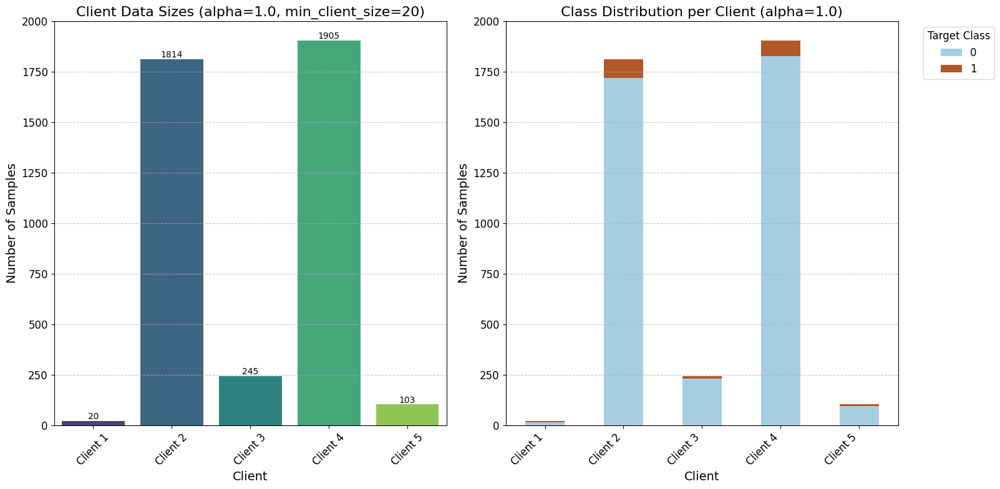

  Class weights applied: [ 0.52559156 10.26884422]
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_we

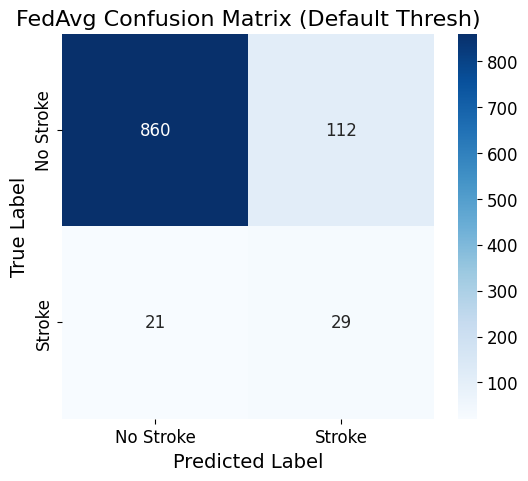

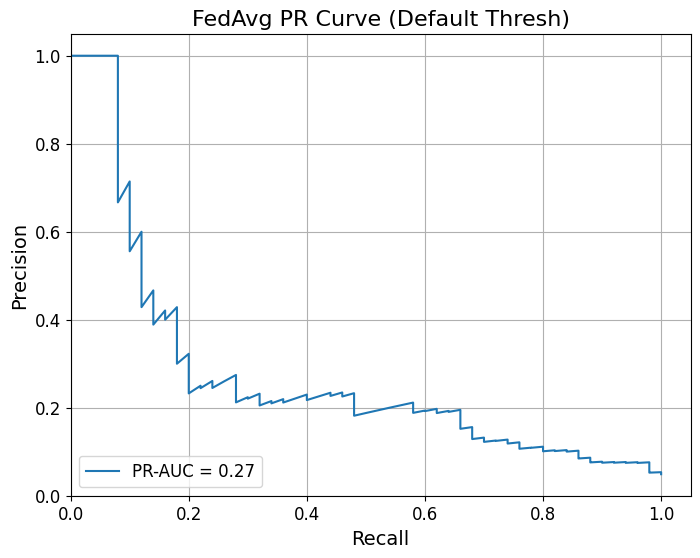


  Evaluating FedAvg model with OPTIMIZED threshold (0.51):
    Accuracy: 0.8718
    Balanced Accuracy: 0.7334
    Precision: 0.2086
    Recall: 0.5800
    F1: 0.3069
    F2: 0.4277
    Macro F1: 0.6181
    ROC-AUC: 0.8141
    PR-AUC: 0.2752
    MCC: 0.2938
    Sensitivity: 0.5800
    Specificity: 0.8868
    Confusion Matrix Counts: TP=29, TN=862, FP=110, FN=21


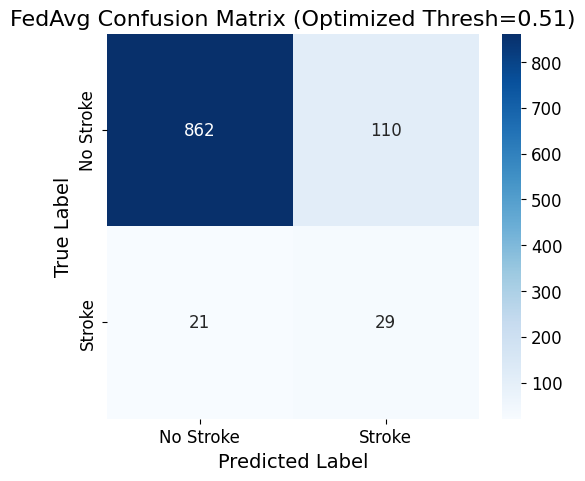

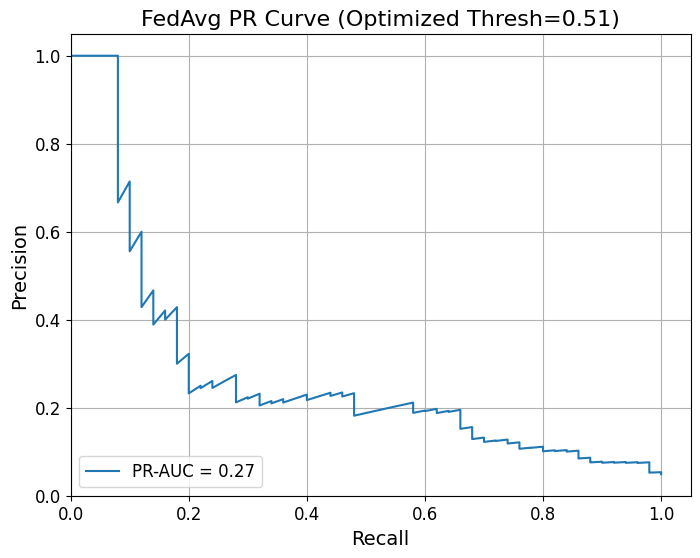


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=20, Pos=6, Neg=14, Pos %=30.00%, Imbalance Ratio=2.33
      Client 2: Size=1814, Pos=95, Neg=1719, Pos %=5.24%, Imbalance Ratio=18.09
      Client 3: Size=245, Pos=13, Neg=232, Pos %=5.31%, Imbalance Ratio=17.85
      Client 4: Size=1905, Pos=77, Neg=1828, Pos %=4.04%, Imbalance Ratio=23.74
      Client 5: Size=103, Pos=8, Neg=95, Pos %=7.77%, Imbalance Ratio=11.88
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['30.00%', '5.24%', '5.31%', '4.04%', '7.77%']
  Client Imbalance Ratios: ['2.

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


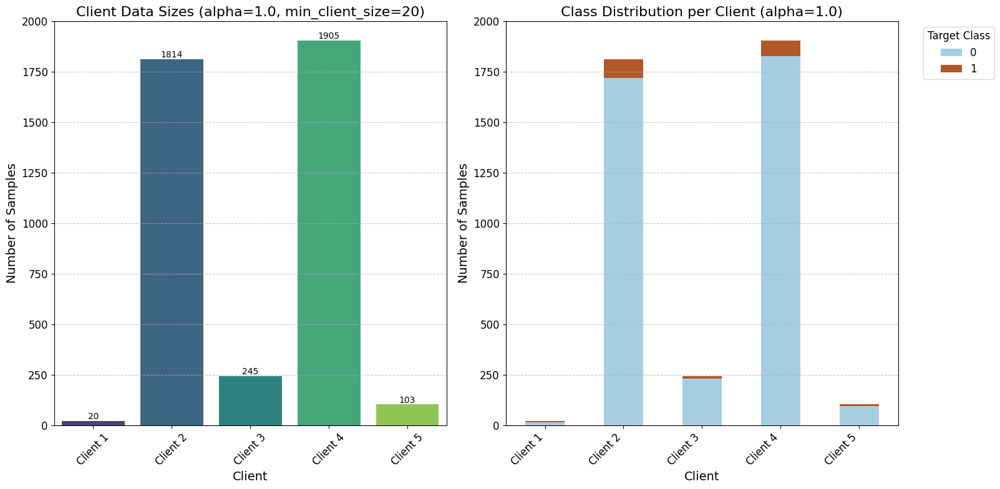

  Class weights applied: [ 0.52559156 10.26884422]
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_we

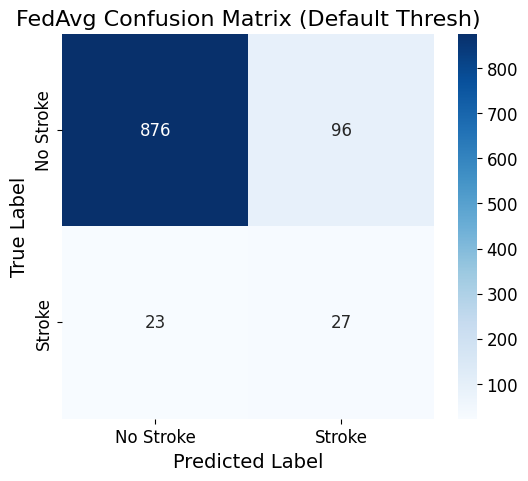

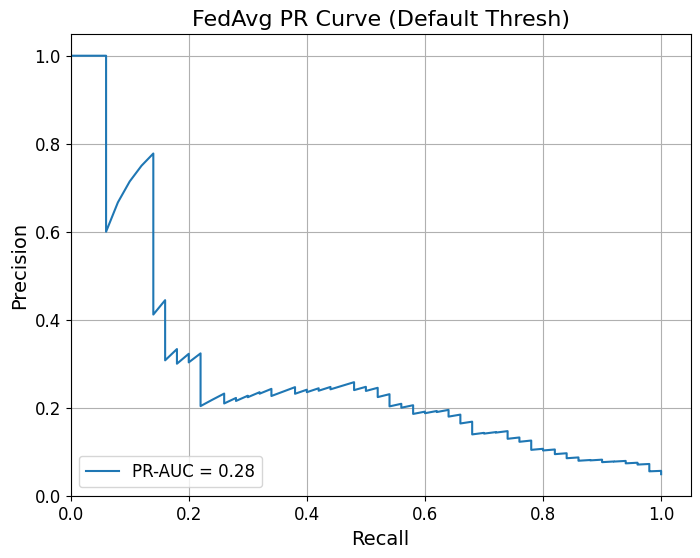


  Evaluating FedAvg model with OPTIMIZED threshold (0.55):
    Accuracy: 0.8973
    Balanced Accuracy: 0.7183
    Precision: 0.2430
    Recall: 0.5200
    F1: 0.3312
    F2: 0.4235
    Macro F1: 0.6378
    ROC-AUC: 0.8184
    PR-AUC: 0.2823
    MCC: 0.3077
    Sensitivity: 0.5200
    Specificity: 0.9167
    Confusion Matrix Counts: TP=26, TN=891, FP=81, FN=24


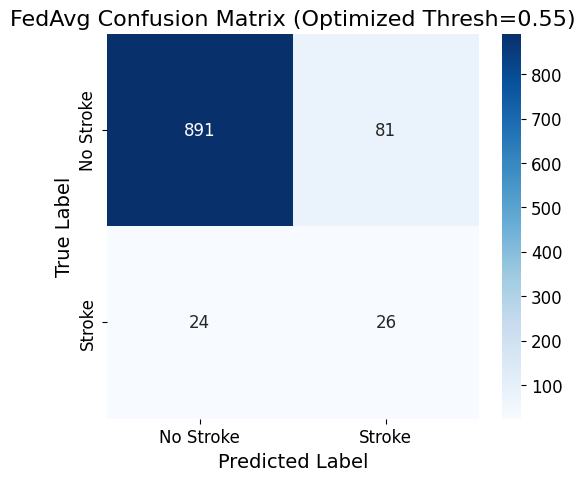

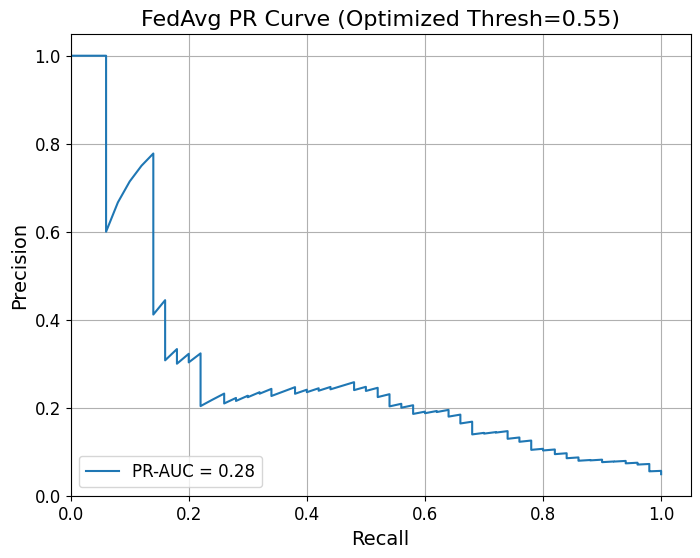


Starting FedAvg (Alpha=1.0, Mu=0.0) with seed 42...

Attempting Dirichlet Partition (Alpha=1.0, Min Client Size=20, Min Positive=5, Min Negative=5) for 5 clients
  Partitioning Attempt 1/1000
    Initial distribution already valid. Skipping rebalance.
    Validating partition after 0 rebalance rounds:
      Client 1: Size=20, Pos=6, Neg=14, Pos %=30.00%, Imbalance Ratio=2.33
      Client 2: Size=1814, Pos=95, Neg=1719, Pos %=5.24%, Imbalance Ratio=18.09
      Client 3: Size=245, Pos=13, Neg=232, Pos %=5.31%, Imbalance Ratio=17.85
      Client 4: Size=1905, Pos=77, Neg=1828, Pos %=4.04%, Imbalance Ratio=23.74
      Client 5: Size=103, Pos=8, Neg=95, Pos %=7.77%, Imbalance Ratio=11.88
  Partitioning Attempt 1: SUCCESS! All client constraints met after rebalancing (took 0 rounds).
  Partitioning completed in 1 attempts.
  Rebalancing triggered: False (took 0 rounds if triggered).
  Client Positive Percentages: ['30.00%', '5.24%', '5.31%', '4.04%', '7.77%']
  Client Imbalance Ratios: ['2.

/tmp/ipykernel_3367/3240345956.py:90: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=[f'Client {i+1}' for i in range(num_clients)], y=client_sizes, ax=ax[0], palette='viridis')


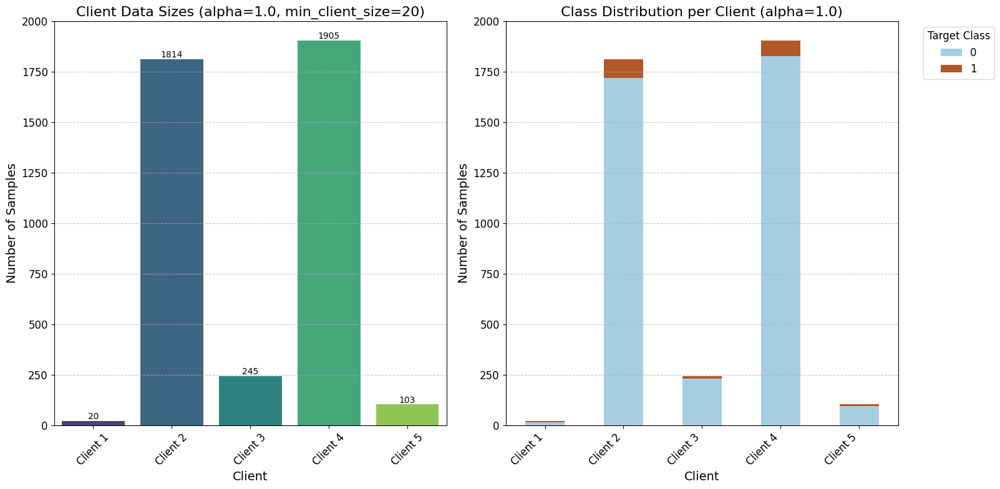

  Class weights applied: [ 0.52559156 10.26884422]
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_weight=10.27
  Using BCEWithLogitsLoss with pos_we

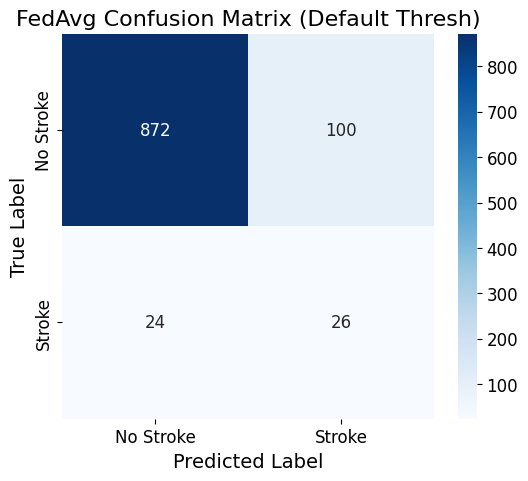

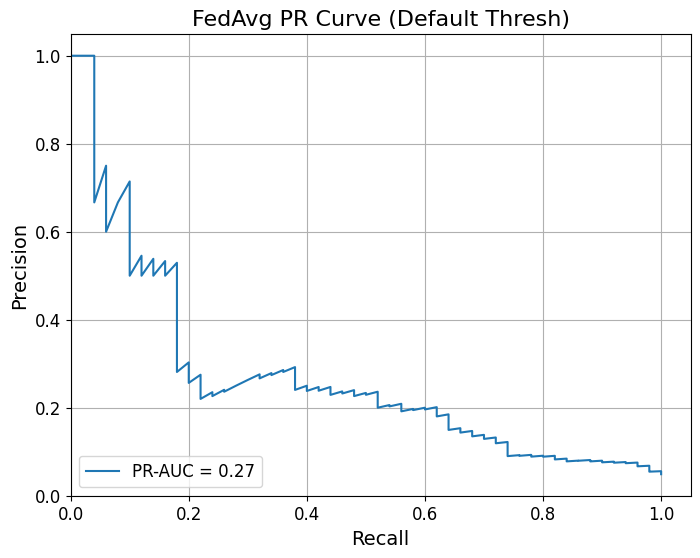


  Evaluating FedAvg model with OPTIMIZED threshold (0.54):
    Accuracy: 0.8943
    Balanced Accuracy: 0.7168
    Precision: 0.2364
    Recall: 0.5200
    F1: 0.3250
    F2: 0.4194
    Macro F1: 0.6338
    ROC-AUC: 0.8045
    PR-AUC: 0.2721
    MCC: 0.3018
    Sensitivity: 0.5200
    Specificity: 0.9136
    Confusion Matrix Counts: TP=26, TN=888, FP=84, FN=24


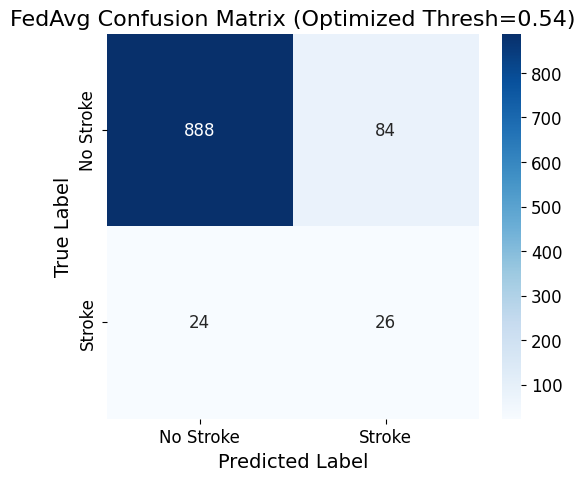

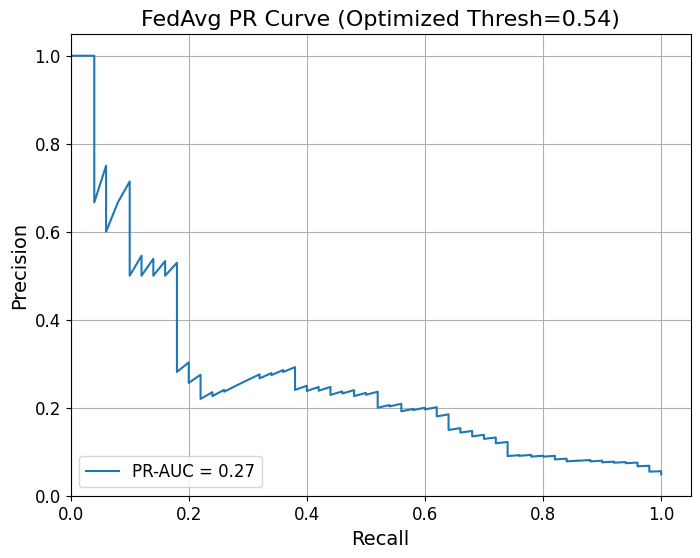

  [MASTER] Captured ablation results for stroke

--- Consolidating All Results ---
[MASTER] ERROR: full_summary is empty. Skipping plot/report generation.

                                     MASTER BENCHMARK COMPLETE                                      

--- AUDIT SUCCESSFUL: ALL ARTIFACTS GENERATED ---


In [41]:
TARGET_DATASETS = ['heart', 'pima', 'breast_cancer', 'kidney', 'stroke']
print('\n--- FINAL SCIENTIFIC AUDIT (FULL DATASET RUN) ---')
try:
    run_master_benchmark(
        dataset_keys=TARGET_DATASETS,
        random_seeds=[42],
        fl_rounds=FL_ROUNDS,
        local_epochs=LOCAL_EPOCHS,
        cv_n_splits=DEBUG_CV_N_SPLITS,
        cv_n_repeats=DEBUG_CV_N_REPEATS
    )
    print('\n--- AUDIT SUCCESSFUL: ALL ARTIFACTS GENERATED ---')
except Exception as e:
    print(f'\n--- AUDIT FAILED: {e} ---')
    import traceback
    traceback.print_exc()

# 19.2 Cross-Validation Benchmark Execution

*(This section is now implicitly handled within `19.1 Multi-Seed Benchmark Execution` by `run_multi_seed_benchmark` and `run_cross_validation_benchmark`.)*

The `run_master_benchmark` orchestrator now calls `run_multi_seed_benchmark` for each dataset, which in turn performs the `RepeatedStratifiedKFold` cross-validation for each seed. This ensures that all models (classical ML, Centralized DL, FedAvg, FedProx) are evaluated across the specified folds and repetitions.

# 19.3 Ablation Study Execution

*(This section is also implicitly handled within `19.1 Multi-Seed Benchmark Execution` by `run_master_benchmark` calling `run_local_epoch_ablation`.)*

The `run_master_benchmark` orchestrator also explicitly calls `run_local_epoch_ablation` for each dataset to investigate the impact of local epochs on performance. These studies are run with a fixed random seed and train/test split for consistent analysis of hyperparameter effects, distinct from the cross-validation performed for main benchmarks.

# 19.4 Final Aggregation and Statistical Analysis

*(This step is performed internally by `run_master_benchmark` after all individual dataset and ablation runs are complete, consolidating data for plotting and reporting.)*

After all benchmarks (multi-seed CV and ablation studies) are executed for all datasets, `run_master_benchmark` aggregates the raw results. It calculates mean and standard deviations for key performance metrics across all seeds, folds, and repetitions. This aggregated data forms the basis for publication-quality tables and plots.

## SECTION 19.4 — Final Aggregation and Statistical Reporting
This section consolidates all multi-seed cross-validation results into publication-ready tables.

In [46]:
# SECTION 19.4.1 — Load Existing Benchmark Artifacts

import glob
import pandas as pd
import os

FINAL_REPORT_DIR = os.path.join(RESULTS_DIR, "final_reports")
TABLE_DIR = os.path.join(FINAL_REPORT_DIR, "tables")
PLOT_DIR = os.path.join(FINAL_REPORT_DIR, "plots")

os.makedirs(TABLE_DIR, exist_ok=True)
os.makedirs(PLOT_DIR, exist_ok=True)

print("Searching for existing benchmark artifacts...")

csv_files = glob.glob(os.path.join(FINAL_REPORT_DIR, "*.csv"))

print(f"Found {len(csv_files)} CSV files:")

for f in csv_files:
    print("-", os.path.basename(f))

loaded_results = {}

for f in csv_files:
    try:
        name = os.path.basename(f).replace(".csv", "")
        loaded_results[name] = pd.read_csv(f)
        print(f"Loaded: {name} | Shape: {loaded_results[name].shape}")
    except Exception as e:
        print(f"Failed loading {f}: {e}")

Searching for existing benchmark artifacts...
Found 0 CSV files:


In [47]:
# SECTION 19.4.2 — Final Benchmark Comparison Table

benchmark_df = None

for key in loaded_results.keys():
    if "benchmark_summary" in key:
        benchmark_df = loaded_results[key]
        break

if benchmark_df is not None:

    metric_cols = [
        "Dataset",
        "Method",
        "Accuracy",
        "Balanced Accuracy",
        "Recall",
        "F1",
        "MCC",
        "PR-AUC"
    ]

    available_cols = [c for c in metric_cols if c in benchmark_df.columns]

    final_benchmark_table = benchmark_df[available_cols].copy()

    display(final_benchmark_table.head())

    save_path = os.path.join(
        TABLE_DIR,
        "final_benchmark_comparison.csv"
    )

    final_benchmark_table.to_csv(save_path, index=False)

    print(f"Saved benchmark table to:\n{save_path}")

else:
    print("No benchmark summary dataframe found.")

No benchmark summary dataframe found.


In [48]:
# SECTION 19.4.3 — Final Ablation Summary Table

ablation_df = None

for key in loaded_results.keys():
    if "ablation_summary" in key:
        ablation_df = loaded_results[key]
        break

if ablation_df is not None:

    ablation_cols = [
        "Dataset",
        "Alpha",
        "Local Epochs",
        "Method",
        "Accuracy",
        "Balanced Accuracy",
        "F1",
        "MCC"
    ]

    available_cols = [c for c in ablation_cols if c in ablation_df.columns]

    final_ablation_table = ablation_df[available_cols].copy()

    display(final_ablation_table.head())

    save_path = os.path.join(
        TABLE_DIR,
        "final_ablation_summary.csv"
    )

    final_ablation_table.to_csv(save_path, index=False)

    print(f"Saved ablation table to:\n{save_path}")

else:
    print("No ablation summary dataframe found.")

No ablation summary dataframe found.


In [49]:
# SECTION 19.4.4 — Benchmark Performance Heatmap

import seaborn as sns
import matplotlib.pyplot as plt

if benchmark_df is not None:

    metric_to_plot = "MCC"

    if metric_to_plot not in benchmark_df.columns:
        metric_to_plot = "Accuracy"

    heatmap_df = benchmark_df.pivot_table(
        index="Dataset",
        columns="Method",
        values=metric_to_plot,
        aggfunc="mean"
    )

    plt.figure(figsize=(12, 6))

    sns.heatmap(
        heatmap_df,
        annot=True,
        cmap="viridis",
        fmt=".3f"
    )

    plt.title(f"Benchmark Heatmap ({metric_to_plot})")

    heatmap_path = os.path.join(
        PLOT_DIR,
        "benchmark_heatmap.png"
    )

    plt.tight_layout()
    plt.savefig(heatmap_path, dpi=300)
    plt.show()

    print(f"Saved heatmap to:\n{heatmap_path}")

else:
    print("Cannot generate heatmap.")

Cannot generate heatmap.
